In [1]:
# import libraries
import numpy as np
import awkward as ak
import pandas as pd 
import os, h5py
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")
from scipy import stats
from jason import jason_plotting as plotting
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')
plotting.plot_prettier(dpi=400,usetex=False)
%matplotlib inline
import uproot

# Reading file

In [2]:
file = uproot.open("/Users/jasonwu/Programs/Fermilab/run_data/pfSamples_230720/pf/pf.piM_0p1_4GeV.10k.HCal.2part.20cm.root")

In [3]:
file.keys()

['LDMX_Events;34', 'LDMX_Events;33', 'LDMX_Run;1']

In [4]:
file['LDMX_Events'].keys()

['EventHeader',
 'EventHeader/eventNumber_',
 'EventHeader/run_',
 'EventHeader/timestamp_',
 'EventHeader/timestamp_/timestamp_.fSec',
 'EventHeader/timestamp_/timestamp_.fNanoSec',
 'EventHeader/weight_',
 'EventHeader/isRealData_',
 'EventHeader/intParameters_',
 'EventHeader/intParameters_/intParameters_.first',
 'EventHeader/intParameters_/intParameters_.second',
 'EventHeader/floatParameters_',
 'EventHeader/floatParameters_/floatParameters_.first',
 'EventHeader/floatParameters_/floatParameters_.second',
 'EventHeader/stringParameters_',
 'EventHeader/stringParameters_/stringParameters_.first',
 'EventHeader/stringParameters_/stringParameters_.second',
 'PFEcalClusters_pf',
 'PFEcalClusters_pf/PFEcalClusters_pf.hitIDs_',
 'PFEcalClusters_pf/PFEcalClusters_pf.energy_',
 'PFEcalClusters_pf/PFEcalClusters_pf.nHits_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidX_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidY_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidZ_',
 'PFEcalCluste

In [5]:
ps = ['PFTruth_pf/PFTruth_pf.first',
 'PFTruth_pf/PFTruth_pf.second.energy_',
 'PFTruth_pf/PFTruth_pf.second.pdgID_',
 'PFTruth_pf/PFTruth_pf.second.genStatus_',
 'PFTruth_pf/PFTruth_pf.second.time_',
 'PFTruth_pf/PFTruth_pf.second.x_',
 'PFTruth_pf/PFTruth_pf.second.y_',
 'PFTruth_pf/PFTruth_pf.second.z_',
 'PFTruth_pf/PFTruth_pf.second.endX_',
 'PFTruth_pf/PFTruth_pf.second.endY_',
 'PFTruth_pf/PFTruth_pf.second.endZ_',
 'PFTruth_pf/PFTruth_pf.second.px_',
 'PFTruth_pf/PFTruth_pf.second.py_',
 'PFTruth_pf/PFTruth_pf.second.pz_',
 'PFTruth_pf/PFTruth_pf.second.endpx_',
 'PFTruth_pf/PFTruth_pf.second.endpy_',
 'PFTruth_pf/PFTruth_pf.second.endpz_',
 'PFTruth_pf/PFTruth_pf.second.mass_',
 'PFTruth_pf/PFTruth_pf.second.charge_',
 'PFTruth_pf/PFTruth_pf.second.daughters_',
 'PFTruth_pf/PFTruth_pf.second.parents_',
 'PFTruth_pf/PFTruth_pf.second.processType_',
 'PFTruth_pf/PFTruth_pf.second.vertexVolume_']
for p in ps:
    prop = file['LDMX_Events'][p].array(library='ak')
    print(p, ak.any(ak.ravel(prop)))

PFTruth_pf/PFTruth_pf.first True
PFTruth_pf/PFTruth_pf.second.energy_ True
PFTruth_pf/PFTruth_pf.second.pdgID_ True
PFTruth_pf/PFTruth_pf.second.genStatus_ True
PFTruth_pf/PFTruth_pf.second.time_ True
PFTruth_pf/PFTruth_pf.second.x_ True
PFTruth_pf/PFTruth_pf.second.y_ True
PFTruth_pf/PFTruth_pf.second.z_ True
PFTruth_pf/PFTruth_pf.second.endX_ True
PFTruth_pf/PFTruth_pf.second.endY_ True
PFTruth_pf/PFTruth_pf.second.endZ_ True
PFTruth_pf/PFTruth_pf.second.px_ True
PFTruth_pf/PFTruth_pf.second.py_ True
PFTruth_pf/PFTruth_pf.second.pz_ True
PFTruth_pf/PFTruth_pf.second.endpx_ True
PFTruth_pf/PFTruth_pf.second.endpy_ True
PFTruth_pf/PFTruth_pf.second.endpz_ True
PFTruth_pf/PFTruth_pf.second.mass_ True
PFTruth_pf/PFTruth_pf.second.charge_ True
PFTruth_pf/PFTruth_pf.second.daughters_ True
PFTruth_pf/PFTruth_pf.second.parents_ False
PFTruth_pf/PFTruth_pf.second.processType_ False
PFTruth_pf/PFTruth_pf.second.vertexVolume_ [True, True, True, True, True, True, ..., True, True, True, True, Tru

In [6]:
p = "PFHcalClusters_pf/PFHcalClusters_pf.energy_"
test_prop = file['LDMX_Events'][p].array(library='ak')
for prop in test_prop:
    print(len(prop), prop)

4 [525, 26.3, 1.38, 0.12]
2 [209, 17.9]
10 [544, 25.8, 8.37, 3.93, 2.9, 1.04, 1.02, 1.01, 0.686, 0.339]
5 [360, 65.7, 9.79, 0.982, 0.191]
1 [328]
6 [678, 1.39, 0.905, 0.806, 0.497, 0.362]
7 [361, 32.8, 17.4, 0.822, 0.732, 0.581, 0.395]
4 [282, 2.63, 2.43, 1.86]
13 [768, 7.58, 4.09, 3.5, 3.4, 2.75, ..., 0.674, 0.552, 0.304, 0.274, 0.268, 0.164]
8 [320, 218, 12.2, 9.27, 7.53, 2.3, 0.333, 0.197]
6 [566, 22.1, 4.35, 1.18, 1.12, 0.263]
6 [464, 4.14, 3.98, 1.51, 0.658, 0.516]
6 [757, 61.8, 15.6, 11.6, 1.02, 0.252]
4 [385, 32.4, 1.32, 0.419]
4 [139, 22.4, 6.15, 0.649]
4 [832, 31.7, 5.94, 0.986]
5 [333, 29.8, 4.11, 0.231, 0.141]
10 [339, 62.1, 1.48, 1.34, 0.789, 0.523, 0.365, 0.345, 0.345, 0.25]
3 [350, 44.4, 16.7]
3 [234, 1.38, 1.05]
10 [348, 22.3, 5.02, 4.51, 4.11, 3.09, 1.53, 0.309, 0.217, 0.132]
4 [683, 9.93, 0.252, 0.161]
8 [397, 31.4, 26.2, 24, 22.3, 2.07, 1.22, 0.164]
2 [559, 66.7]
10 [572, 68.7, 4.08, 3.67, 2.16, 1.73, 0.671, 0.65, 0.381, 0.141]
9 [601, 70.5, 34.4, 8.49, 0.405, 0.3, 0.

In [7]:
mask = ak.argmax(test_prop, axis=1, keepdims=True, mask_identity=True)
mask

<Array [[0], [0], [0], [0], ..., [0], [0], [0], [0]] type='10000 * 1 * ?int64'>

In [8]:
p = "PFHcalClusters_pf/PFHcalClusters_pf.centroidX_"
test_prop_ = file['LDMX_Events'][p].array(library='ak')
test_prop_[ak.from_regular(mask)]

<Array [[114], [-97.7], ..., [34.4], [311]] type='10000 * var * ?float64'>

## Systematically reading the file

In [9]:
def get_data(file_name = 'pf.ele_0p1_4GeV.10k.HCal.2part.5cm.root',
             root_trial = 'pfSamples_230720',
             root_dir = '/Users/jasonwu/Programs/Fermilab/run_data',
             # the branches to include in the output
             included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruth_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf'],
             # the branches to save directly
             saved_branches = ['EcalTotalEnergy_pf', 'HcalTotalEnergy_pf', 'PFTruth_pf/PFTruth_pf.second.vertexVolume_'],
             # if True, generates leading cluster properties
             lead_clust = False,
             # the branches to do leading cluster on
             lead_clust_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf'],
             lead_clust_override = False,
             # if True, prints type and number of points in each property
             verbose = False):
    file = uproot.open(f'{root_dir}/{root_trial}/pf/{file_name}')
    events = file['LDMX_Events']
    # all the keys in events
    keys = np.array(events.keys())
    save_mask = np.array([1 if (branch in saved_branches) else 0 for branch in keys]).astype(bool)
    keys = np.delete(keys, save_mask)
    # branches
    branch_mask = np.array([0 if ('/' in branch) else 1 for branch in keys]).astype(bool)
    branches = keys[branch_mask]
    branch_ind = np.append(np.where(branch_mask == 1)[0], -1)
                 
    if lead_clust_override:
        suffix_new = ''
        suffix_og = '_og'
    else:
        suffix_new = '_lc'
        suffix_og = ''
                 
    prop_dict = {}


    # save the branches directly
    for branch in saved_branches:  # check if within directly saved branch
        if verbose: print(f'{branch} is saved directly')
        saved_prop = np.array(events[branch])
        prop_dict[branch.replace('_pf', '')] = saved_prop
        
    for i in range(len(branches)):
        branch = branches[i]
        if branch in included_branches:  # check if within included branch
            if verbose: print(f'{branch} is included')
            # get all the nodes of the branch
            branch_nodes = keys[branch_ind[i]+1:] if branch_ind[i+1] == -1 else keys[branch_ind[i]+1 : branch_ind[i+1]]
            if verbose: print(branch_nodes)

            # get the energy indices for leading cluster anlaysis
            if lead_clust and (branch in lead_clust_branches):
                energy_node = f'{branch}/{branch}.energy_'  # string of the energy node
                # the awkward array corresponding to energy
                energy_prop = events[energy_node].array(library='ak')
                energy_prop = ak.values_astype(energy_prop, np.float64)
                # the indices corresponding to maximum energy (in case unsorted)
                max_ind = ak.argmax(energy_prop, axis=1, keepdims=True, mask_identity=True)
                
            # for each node in the branch
            for branch_node in branch_nodes:
                # make the awkward array
                prop = events[branch_node].array(library='ak')
                # pad the array with at least one entry
                prop = ak.pad_none(prop, 1, axis=1)

                # check if consisting of empty arrays
                if len(ak.ravel(prop)) == 0 or not ak.any(ak.ravel(prop)):  # effectively empty
                    # flatten the array into zeros
                    if verbose: print(f'Empty array at {branch_node}, reduced to zeroes')
                    prop_flat = np.zeros(len(prop))
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                elif len(ak.ravel(prop)) == len(prop):  # effectively one-dimensional
                    if verbose: print(f'One-dimensional array at {branch_node}, reduced to numpy')
                    prop_flat = ak.to_numpy(ak.ravel(prop), allow_missing=True).astype(float).filled(np.nan)
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                else:
                    # if the array is truly jagged
                    if verbose: print(f'Jagged/partially empty array at {branch_node}')
                    prop_flat = prop
                    if verbose: print(prop_flat.type)

                    # construct a leading cluster array
                    if lead_clust and (branch in lead_clust_branches):
                        # mask the array with max energy indices
                        max_prop = prop_flat[ak.from_regular(max_ind)]
                        # flatten, convert to numpy array, and fill with nan
                        # handles hit info
                        if 'hit' in branch_node:
                            # unravel max_prop
                            max_prop = [np.array(_[0]) for _ in max_prop]
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop  # take out into lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                        else:
                            max_prop_flat = ak.to_numpy(ak.ravel(max_prop), allow_missing=True).astype(float)
                            max_prop_flat = max_prop_flat.filled(np.nan)
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop_flat  # lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                    else:  # no leading cluster array
                        prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat

        else:
            if verbose: print(f'{branch} is not included')
    return prop_dict

In [10]:
root_trial = 'pfSamples_230720'
test_part = get_data(file_name='pf.piM_0p1_4GeV.10k.HCal.2part.15cm.root', root_trial=root_trial,
                     lead_clust=True, lead_clust_branches=['PFHcalClusters_pf'], lead_clust_override=False)
list(test_part.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalClusters_centroidX_lc',
 'PFHcalClusters_centroidX',
 'PFHcalClusters_centroidY_lc',
 'PFHcalClusters_centroidY',
 'PFHcalClusters_centroidZ_lc',
 'PFHcalClusters_centroidZ',
 'PFHcalClusters_rmsX_lc',
 'PFHcalClusters_rmsX',
 'PFHcalClusters_rmsY_lc',
 'PFHcalClusters_rmsY',
 'PFHcalClusters_rmsZ_lc',
 'PFHcalClusters_rmsZ',
 'PFHcalCluster

# Load Particles

In [11]:
labels_keys = 'electrons neutrons photons pions protons electrons_hcal neutrons_hcal photons_hcal pions_hcal protons_hcal'.split(' ')
labels_values = [
    r'Electrons $e^{\minus}$',
    r'Neutrons $n^{o}$',
    r'Photons $\gamma$',
    r'Pions $\pi^{\minus}$',
    r'Protons $p^{\plus}$',
    r'Electrons $e^{\minus}$ HCal',
    r'Neutrons $n^{o}$ HCal',
    r'Photons $\gamma$ HCal',
    r'Pions $\pi^{\minus}$ HCal',
    r'Protons $p^{\plus}$ HCal'
]

labels_dict = {labels_keys[i]: labels_values[i] for i in range(len(labels_keys))}

## Particles Class

In [12]:
# initiate a particle class
class Particles():
    def __init__(self, prop_dict, zero_on='PFTruthTarget_energy'):
        # a list of properties
        self.propdict = prop_dict
        self._clean_props(zero_on)
    
    # clean the data set
    def _clean_props(self, zero_on='PFTruthTarget_energy'):
        # # remove on column
        # if isinstance(zero_on, list):
        #     # invalid energy values
        #     zero_bool_mask = np.array(self.propdict[zero_on[0]] <= 0)
        #     for zero_col in zero_on[1:]:
        #         zero_bool_mask = np.logical_or(zero_bool_mask, np.array(self.propdict[zero_col] <= 0))
        # else:
        #     zero_bool_mask = np.array(self.propdict[zero_on] <= 0)
            
        # print(f'{np.sum(zero_bool_mask)} values removed from {zero_on}')
        
        # for prop in list(self.propdict.keys()):
        #     nan_bool_mask = np.isnan(self.propdict[prop])
        #     if np.any(nan_bool_mask):
        #         print(f'{np.sum(nan_bool_mask):<10} NaN values for {prop}')
        #         # set the values to zero
        #         self.propdict[prop][np.isnan(self.propdict[prop])] = 0
        #     self.propdict[prop] = self.propdict[prop][~zero_bool_mask]
                
        # print('\n')

        # also replace dictionary labels
        self.propdict['PFCandidates_ecalCalEnergy'] = self.propdict.pop('PFCandidates_ecalEnergy')
        self.propdict['PFCandidates_ecalEnergy'] = self.propdict.pop('PFCandidates_ecalRawEnergy')
        self.propdict['PFCandidates_hcalCalEnergy'] = self.propdict.pop('PFCandidates_hcalEnergy')
        self.propdict['PFCandidates_hcalEnergy'] = self.propdict.pop('PFCandidates_hcalRawEnergy')
    
    # return a property
    def get(self, prop = None):
        if prop is not None:  # if specific property(ies) are given
            if isinstance(prop, list):
                prop_list = []
                for single_prop in prop:
                    prop_list.append(self.propdict[single_prop])
                return prop_list
            else:
                assert prop in list(self.propdict.keys())
                return self.propdict[prop]
        else:
            return self.propdict
    
    # account for mass of particle
    def acc_mass(self, mass, columns=[]):
        # subtract mass
        for column in columns:
            # clipped to zero
            # therefore, 0 -> 0, mass + energy -> energy
            self.propdict[column] = np.clip(self.propdict[column] - mass, 0, None)
    
    # return a list of all properties
    def list_props(self):        
        print(f'{"Property Name":<30}{"Number of Entries":<20}{"Unique Entries":<20}{"Range":<30}{"Mean"}')
        
        for prop in list(self.propdict.keys()):
            print(f'{prop: <30}{len(self.propdict[prop]):<20}{len(np.unique(self.propdict[prop])):<8}\
            {np.nanmin(self.propdict[prop]):<10.2f}{np.nanmax(self.propdict[prop]):>8.2f}\
            {np.nanmean(self.propdict[prop]):<.2f}')
        print('\n')
        return list(self.propdict.keys())
    
    # apply a correction to the ecal and hcal energy measurements
    def o1corr_energy(self, verbose=True, scheme='nearest',  # three schemes 'none', 'nearest' and 'spline'
                      energy_bins_ecal=[0, 6e3], o1corr_ecal=[1],
                      energy_bins_hcal=[0, 6e3], o1corr_hcal=[1],
                      ecal_label='EcalTotalEnergy', hcal_label='HcalTotalEnergy',  #ecal_label='PFCandidates_ecalEnergy', hcal_label='PFCandidates_hcalEnergy',
                      numbins=20, gev=True, label=labels_dict['photons']):
        # correct the energies
        match scheme:  # different schemes to handle values outside of measured bins
            case 'none':  # set to NaN, breaks plots
                # ecal
                o1corr_ecal = pd.cut(self.get(ecal_label), bins=energy_bins_ecal,
                                     include_lowest=True, labels=o1corr_ecal).to_numpy()
                # hcal
                o1corr_hcal = pd.cut(self.get(hcal_label), bins=energy_bins_hcal,
                                     include_lowest=True, labels=o1corr_hcal).to_numpy()
            case 'nearest':  # sets to value of nearest bin
                def nearest_cut(data, bins=[0, 6e3], labels=[1]):
                    # assigns labels to data based on bins
                    label_ind = np.digitize(data, bins=bins, right=True)
                    # contains 0 and len(labels)
                    label_ind[label_ind == 0] = 1  # label_ind will start at 1
                    label_ind[label_ind == len(bins)] = len(labels)  # set to maximum ind
                    return labels[label_ind - 1]
                # ecal
                o1corr_ecal = nearest_cut(self.get(ecal_label), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = nearest_cut(self.get(hcal_label), bins=energy_bins_hcal, labels=o1corr_hcal)
            case 'spline':
                def spline_cut(data, bins=[0, 6e3], labels=[1]):
                    # construct spline object for bin centers
                    bin_centers = [(a + b) / 2 for a, b in zip(bins[::], bins[1::])] # average of two consecutive elements in bins
                    # calculate splined values for data
                    splined_coeff, _ = plotting.spline_xy(bin_centers, labels, data)
                    return splined_coeff
                    
                # ecal
                o1corr_ecal = spline_cut(self.get(ecal_label), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = spline_cut(self.get(hcal_label), bins=energy_bins_hcal, labels=o1corr_hcal)
                
        energy_o1corr_ecal = self.get(ecal_label) * o1corr_ecal
        energy_o1corr_hcal = self.get(hcal_label) * o1corr_hcal
        
        
        # total
        energy_o1corr_total = energy_o1corr_ecal + energy_o1corr_hcal
        
        # set the dictionary entries
        self.propdict['PFCandidates_ecalEnergy_o1corr'] = energy_o1corr_ecal
        self.propdict['PFCandidates_hcalEnergy_o1corr'] = energy_o1corr_hcal
        self.propdict['PFCandidates_energy_o1corr'] = energy_o1corr_total
        
        # O(1) correction comparison plot with both energies
        if verbose:
            fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
            # set the truth energy depending on the type of particle simulation
            if (label is not None) and \
               ('HCal' in label):
                # if the particle went through both ecal and hcal
                print('HCal energy set to truth')
                energy_truth_total = self.get('PFTruthHcal_energy')  # the pre-hcal energy is set to truth
            else:
                print('Target energy set to truth')
                energy_truth_total = self.get('PFTruthTarget_energy')  # the pre-target energy is set to truth

            if gev:  # plot x axis in gev instead
                plt.xlim([0, 4])
                plt.xlabel('Truth Total Energy [GeV]')
                x = energy_truth_total/1e3
                textx = 3.5
            else:  # plot x axis in mev
                plt.xlim([0, 4000])
                plt.xlabel('Truth Total Energy [MeV]')
                x = energy_truth_total
                textx = 3500
            y1 = self.get('PFCandidates_energy')/energy_truth_total  # measured ratio
            y2 = energy_o1corr_total/energy_truth_total  # reconstructed ratio
            _ = plotting.percentile(x, y1, numbins=numbins, style=style,
                                    color='red', label='Measured', textpos=[textx, 1.5])
            _ = plotting.percentile(x, y2, numbins=numbins, style=style,
                                    color='blue', label='$\mathcal{O}(1)$ Reconstructed')
            plt.ylabel('Reconstructed / Truth Total Energy', fontsize=10)
            plt.legend(loc='upper right')
            plt.ylim([0, 2])
            plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')

        return energy_o1corr_ecal, energy_o1corr_hcal, energy_o1corr_total

In [13]:
import os

# all branches
included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
root_dir = '/Users/jasonwu/Programs/Fermilab/run_data'
root_trial = 'pfSamples_230720'

fname_list = np.sort(os.listdir(f'{root_dir}/{root_trial}/pf'))

fname_list_5cm, fname_list_10cm, fname_list_15cm, fname_list_20cm, fname_list_25cm = [], [], [], [], []
for fname in fname_list:
    if '25cm' in fname and 'HCal' in fname:
        fname_list_25cm.append(fname)
    elif '15cm' in fname and 'HCal' in fname:
        fname_list_15cm.append(fname)
    elif '5cm' in fname and 'HCal' in fname:
        fname_list_5cm.append(fname)
    elif '10cm' in fname and 'HCal' in fname:
        fname_list_10cm.append(fname)
    elif '20cm' in fname and 'HCal' in fname:
        fname_list_20cm.append(fname)
    else:
        print(f'{fname} is skipped')
fname_list_5cm, fname_list_10cm, fname_list_15cm, fname_list_20cm, fname_list_25cm

.DS_Store is skipped


(['pf.ele_0p1_4GeV.10k.HCal.2part.5cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.2part.5cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.2part.5cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.2part.5cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.2part.5cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.2part.10cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.2part.10cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.2part.10cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.2part.10cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.2part.10cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.2part.15cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.2part.15cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.2part.15cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.2part.15cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.2part.15cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.2part.20cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.2part.20cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.2part.20cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.2part.20cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.2part.20cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.2part.25cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.2part.2

In [14]:
# ECal + HCal particles
particles_dict_5cm = {
    'electrons': None,
    'neutrons': None,
    'photons': None,
    'pions': None,
    'protons': None
}
particles_dict_10cm = particles_dict_5cm.copy()
particles_dict_15cm = particles_dict_5cm.copy()
particles_dict_20cm = particles_dict_5cm.copy()
particles_dict_25cm = particles_dict_5cm.copy()

In [15]:
# load the particles
root_dir = '/Users/jasonwu/Programs/Fermilab/run_data'
root_trial = 'pfSamples_230720'
# all branches
included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruth_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
target_ecal_ind = ['PFTruthTarget_energy', 'PFTruthEcal_energy']

particles_name_list = 'electrons neutrons photons pions protons'.split(' ')
for i, part_name in enumerate(particles_name_list):
    # set particle
    print(f'Setting for 5cm {fname_list_5cm[i]}')
    particles_dict_5cm[part_name] = Particles(get_data(file_name=fname_list_5cm[i], root_trial=root_trial,
                                                       included_branches=included_branches,
                                                       lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                       lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 10cm {fname_list_10cm[i]}')
    particles_dict_10cm[part_name] = Particles(get_data(file_name=fname_list_10cm[i], root_trial=root_trial,
                                                        included_branches=included_branches,
                                                        lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                        lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 15cm {fname_list_5cm[i]}')
    particles_dict_15cm[part_name] = Particles(get_data(file_name=fname_list_15cm[i], root_trial=root_trial,
                                                       included_branches=included_branches,
                                                       lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                       lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 20cm {fname_list_20cm[i]}')
    particles_dict_20cm[part_name] = Particles(get_data(file_name=fname_list_20cm[i], root_trial=root_trial,
                                                        included_branches=included_branches,
                                                        lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                        lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 25cm {fname_list_5cm[i]}')
    particles_dict_25cm[part_name] = Particles(get_data(file_name=fname_list_25cm[i], root_trial=root_trial,
                                                       included_branches=included_branches,
                                                       lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                       lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')

Setting for 5cm pf.ele_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 10cm pf.ele_0p1_4GeV.10k.HCal.2part.10cm.root
Setting for 15cm pf.ele_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 20cm pf.ele_0p1_4GeV.10k.HCal.2part.20cm.root
Setting for 25cm pf.ele_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 5cm pf.neu_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 10cm pf.neu_0p1_4GeV.10k.HCal.2part.10cm.root
Setting for 15cm pf.neu_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 20cm pf.neu_0p1_4GeV.10k.HCal.2part.20cm.root
Setting for 25cm pf.neu_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 5cm pf.pho_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 10cm pf.pho_0p1_4GeV.10k.HCal.2part.10cm.root
Setting for 15cm pf.pho_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 20cm pf.pho_0p1_4GeV.10k.HCal.2part.20cm.root
Setting for 25cm pf.pho_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 5cm pf.piM_0p1_4GeV.10k.HCal.2part.5cm.root
Setting for 10cm pf.piM_0p1_4GeV.10k.HCal.2part.10cm.root
Setting for 15cm pf.piM_0p1_

# Energy Correction

In [16]:
particles_name_list = 'electrons neutrons photons pions protons'.split(' ')

In [17]:
ele_energy_bins_ecal = np.array([0., 500., 1000., 1500., 2000., 2500., 3000., 3500., 4000., 4500., 5000., 5500., 6000.])
avg_o1corr_ecal = np.array([1.18987852, 1.02952459, 0.99478492, 0.98629969, 0.98273146, 0.9760755 , 0.96378225, 0.93880792, 0.87393644, 0.80097519, 0.72741938, 0.66352241])
ext_bins_hcal = np.array([0., 50., 100., 150., 200., 250., 300., 350., 400., 450., 500., 550., 600., 650.]) * 10
pe_o1corr_hcal = np.array([8.4280355 ,  7.37783051,  7.75777364,  8.53401804,  9.46895409, 10.44644213, 10.46670198,  9.70749855,  8.87022924,  8.25057888, 8.25057888,  8.25057888,  8.25057888])

In [18]:
scheme = 'spline'
style = 1

In [19]:
for particles in particles_name_list:
    particles_dict_5cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                  energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                  verbose=False)
    particles_dict_10cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)
    particles_dict_15cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)
    particles_dict_20cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)
    particles_dict_25cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)

# Count Statistics

In [28]:
def calc_stats(particles_dict=particles_dict_5cm, good_thres=5):
    for particles in particles_name_list:
        # energy bins
        from matplotlib import cm
    
        # cluster count
        hits_count = {}
        clusters_count = []  # all clusters count
        good_clusters_count = []  # good cluster count
        for clusters_nhits in particles_dict[particles].get('PFHcalClusters_nHits'):
            if np.any(clusters_nhits):
                num_clusters = len(clusters_nhits)
                num_good_clusters = np.sum(clusters_nhits >= good_thres)
                good_clusters_count.append(num_good_clusters)
                clusters_count.append(num_clusters)
                try:
                    hits_count[num_clusters] = np.hstack([hits_count[num_clusters], clusters_nhits])
                except KeyError:
                    hits_count[num_clusters] = []
            else:
                good_clusters_count.append(0)  # no clusters
                clusters_count.append(0)
        # number of clusters
        particles_dict[particles].propdict['PFHcalClusters_hits_count'] = hits_count
        print(list(particles_dict[particles].get('PFHcalClusters_hits_count').keys()))
        # all clusters
        particles_dict[particles].propdict['PFHcalClusters_count'] = np.array(clusters_count)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_count'), return_counts=True))
        # good clusters
        particles_dict[particles].propdict['PFHcalClusters_good_count'] = np.array(good_clusters_count)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_good_count'), return_counts=True))

calc_stats(particles_dict_5cm, good_thres=1)
calc_stats(particles_dict_10cm, good_thres=5)
calc_stats(particles_dict_15cm, good_thres=7)
calc_stats(particles_dict_20cm, good_thres=8)
calc_stats(particles_dict_25cm, good_thres=12)

[1, 2, 3, 4, 6, 5]
(array([0, 1, 2, 3, 4, 5, 6]), array([4142, 3655, 1625,  470,   98,    8,    2]))
(array([0, 1, 2, 3, 4, 5, 6]), array([4142, 3655, 1625,  470,   98,    8,    2]))
[1, 3, 2, 4, 5, 6]
(array([0, 1, 2, 3, 4, 5, 6]), array([4829, 3271, 1336,  427,  103,   29,    5]))
(array([0, 1, 2, 3, 4, 5, 6]), array([4829, 3271, 1336,  427,  103,   29,    5]))
[2, 1, 3, 4, 5, 7]
(array([0, 1, 2, 3, 4, 5, 7]), array([4035, 3677, 1723,  464,   89,   11,    1]))
(array([0, 1, 2, 3, 4, 5, 7]), array([4035, 3677, 1723,  464,   89,   11,    1]))
[2, 1, 4, 3, 5, 6, 7, 8]
(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), array([3367, 3390, 2037,  864,  249,   64,   22,    6,    1]))
(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), array([3367, 3390, 2037,  864,  249,   64,   22,    6,    1]))
[1, 2, 4, 3, 6, 5, 7, 8]
(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), array([3915, 3511, 1697,  613,  200,   55,    7,    1,    1]))
(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), array([3915, 3511, 1697,  613,  200,   55,    7,    1,    1]))
[

## Hits per cluster

In [29]:
def plot_hits_count(particles_dict=particles_dict_5cm, min_sep=5):
    for particles in particles_name_list:
        import seaborn as sns

        # hits counts per cluster count
        hits_count = particles_dict[particles].get('PFHcalClusters_hits_count')
        df_list = []
        for key, value in hits_count.items():
            # key is # of clusters
            # value is # of hits
            df = pd.DataFrame({'clusters' : key, 'hits' : value})
            df_list.append(df)
        part_df = pd.concat(df_list)
        
        # plot setup
        sns.set(style="whitegrid")
        plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')
        plotting.plot_prettier(dpi=400,usetex=False)
        mpl.rcParams['scatter.marker'] = 'o'
        fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
        ax.grid(visible=True)
        sns.violinplot(data=part_df, x='clusters', y='hits', linewidth=1)
        
        ax.annotate(text=f'{labels_dict[particles]} {min_sep}cm', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
        ax.set_xlabel('Number of Clusters', fontsize=10)
        ax.set_ylabel('Number of Hits', fontsize=10)
        # ax.legend(fontsize=10, loc='lower left')
        plt.show()
    mpl.rcParams.update(mpl.rcParamsDefault)
    plotting.plot_prettier(dpi=400,usetex=False)
    plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')

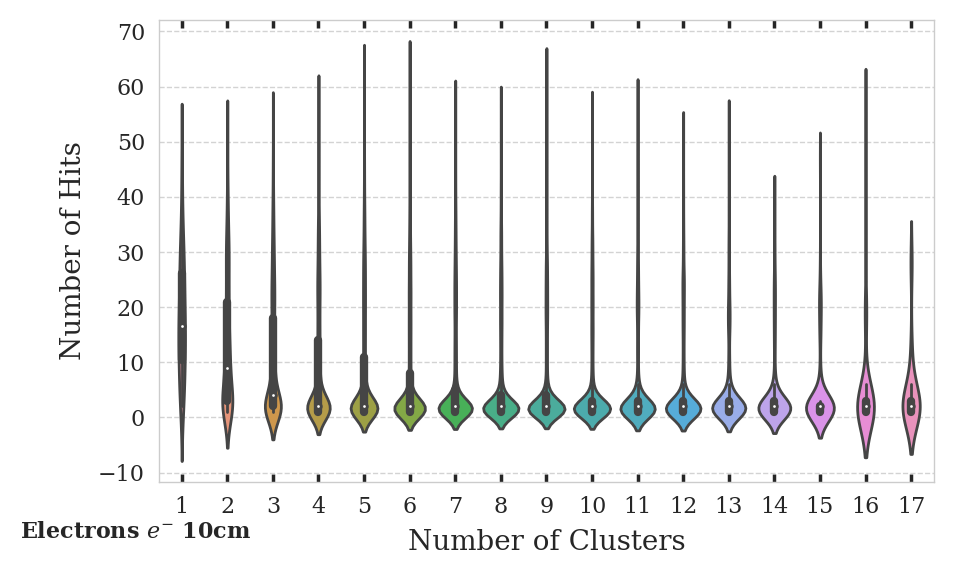

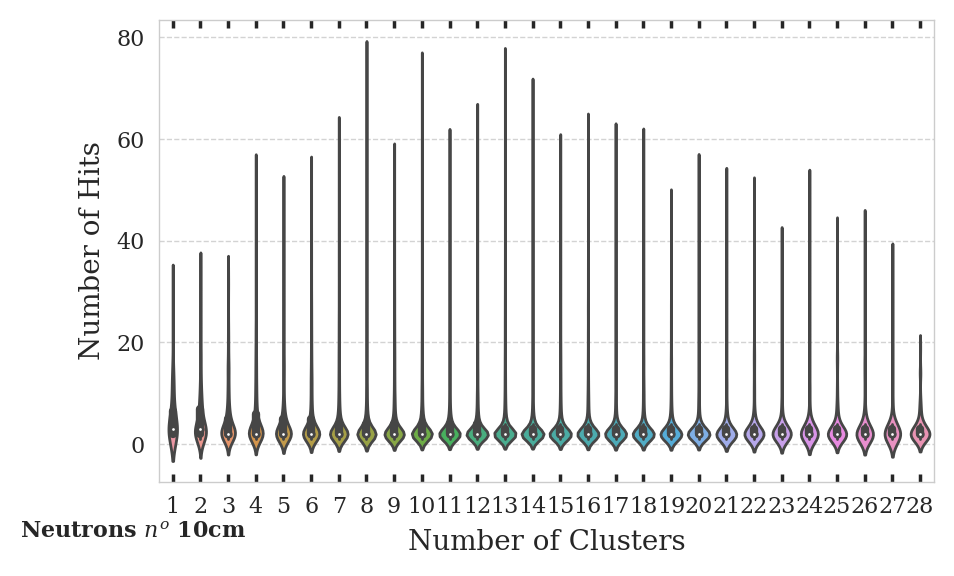

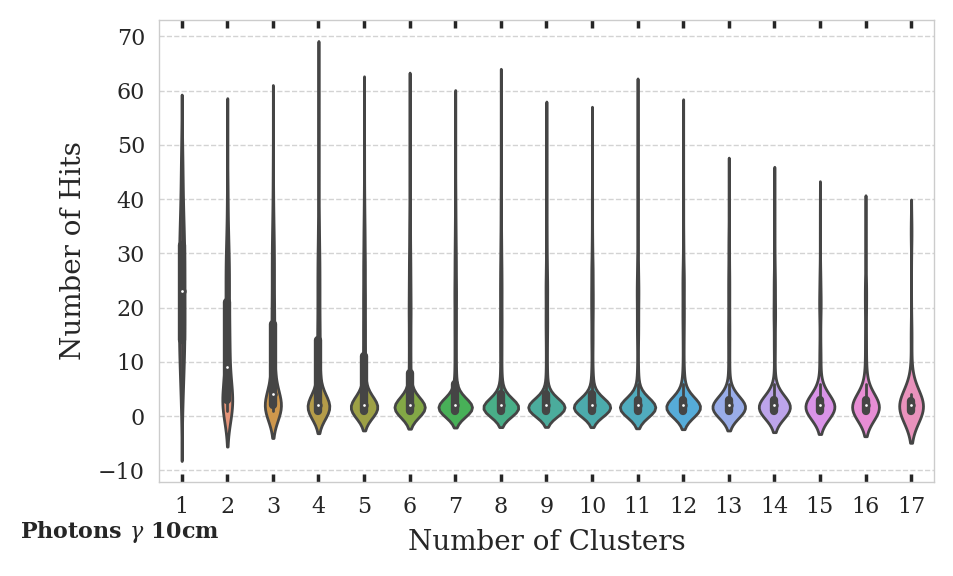

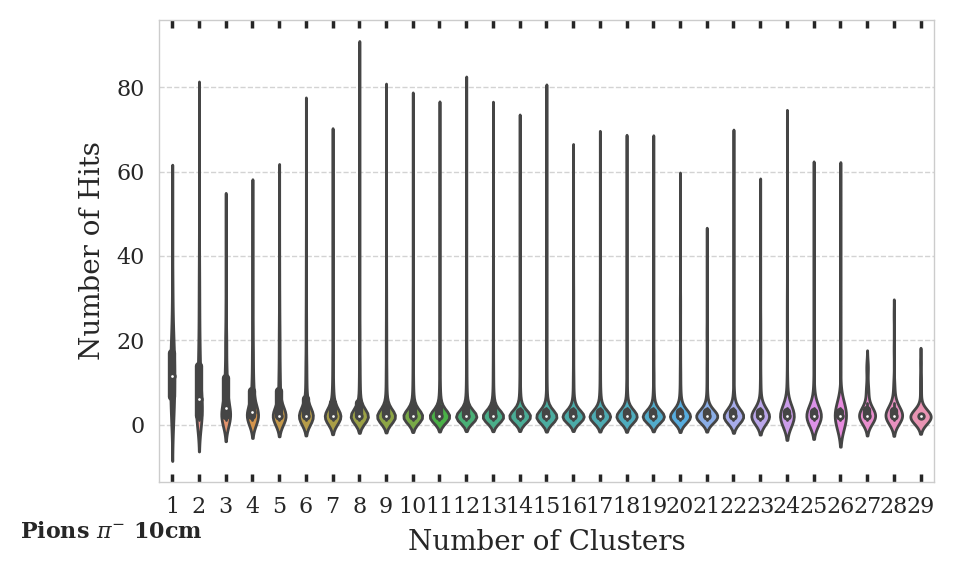

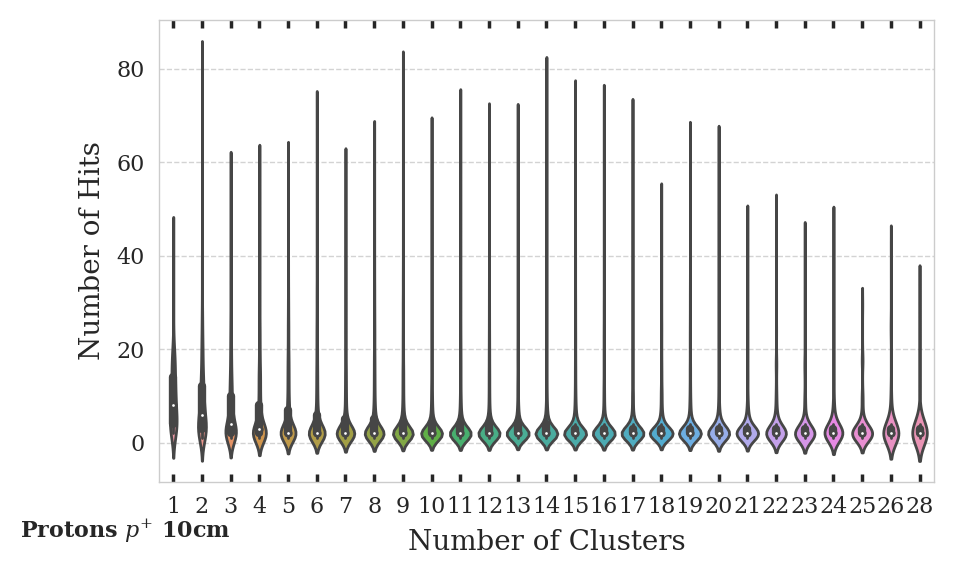

In [30]:
plot_hits_count(particles_dict_10cm, 10)

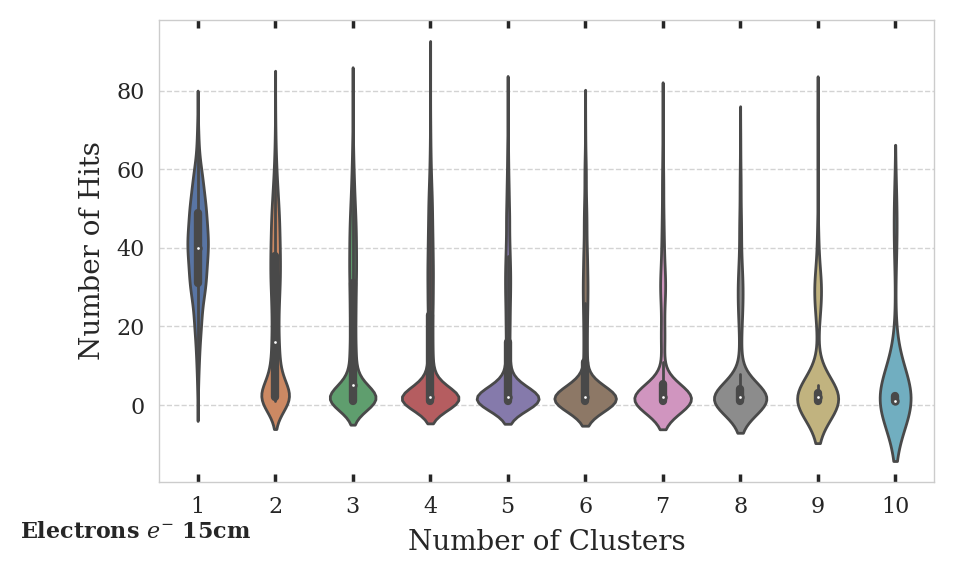

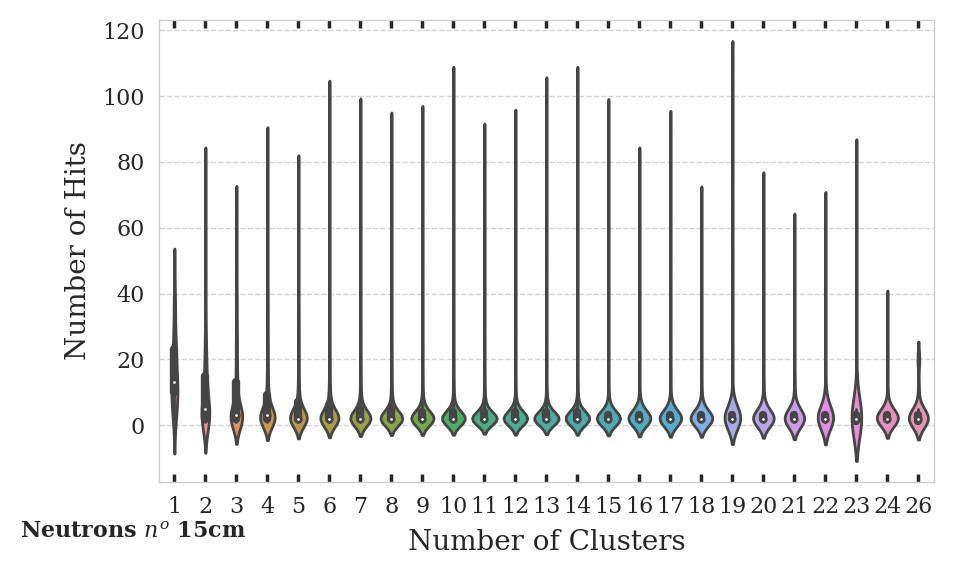

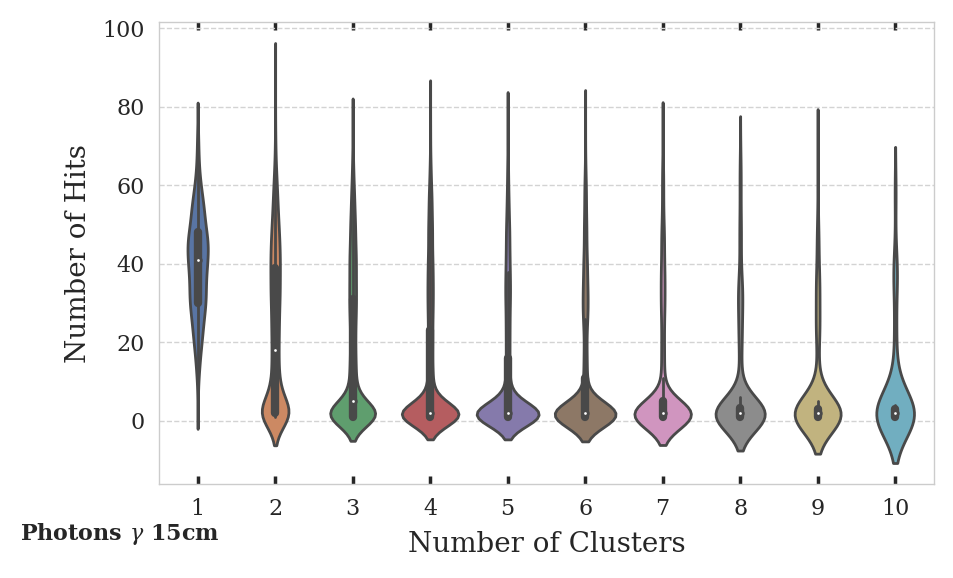

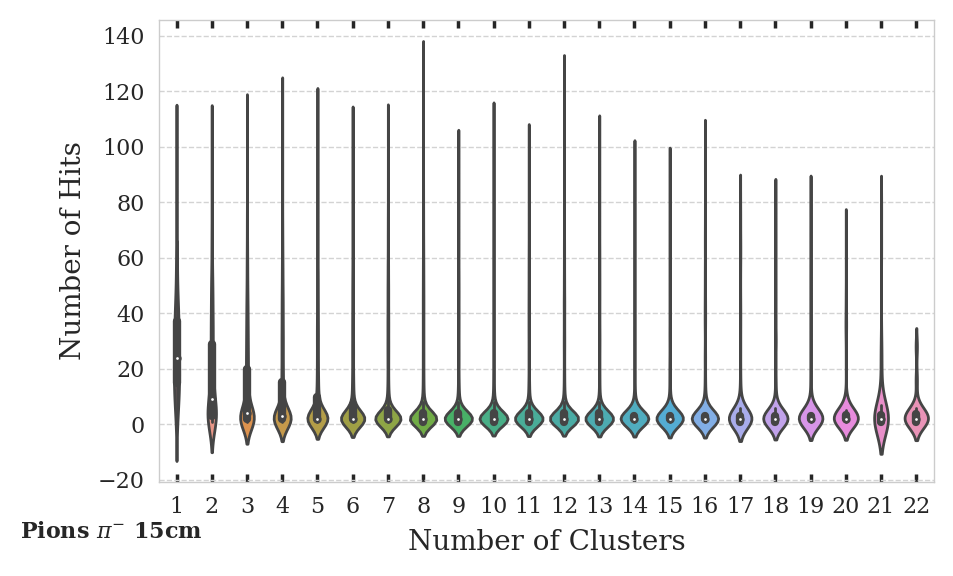

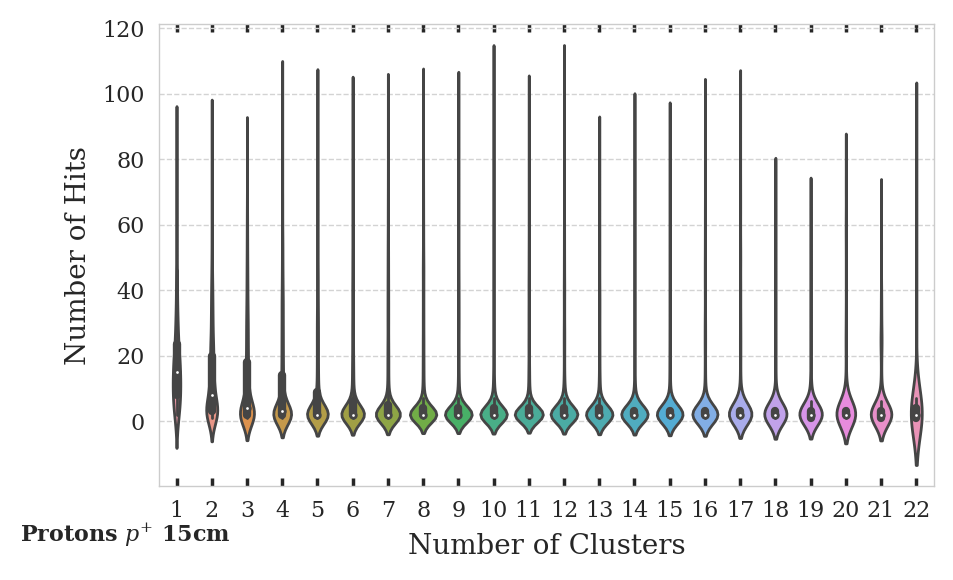

In [31]:
plot_hits_count(particles_dict_15cm, 15)

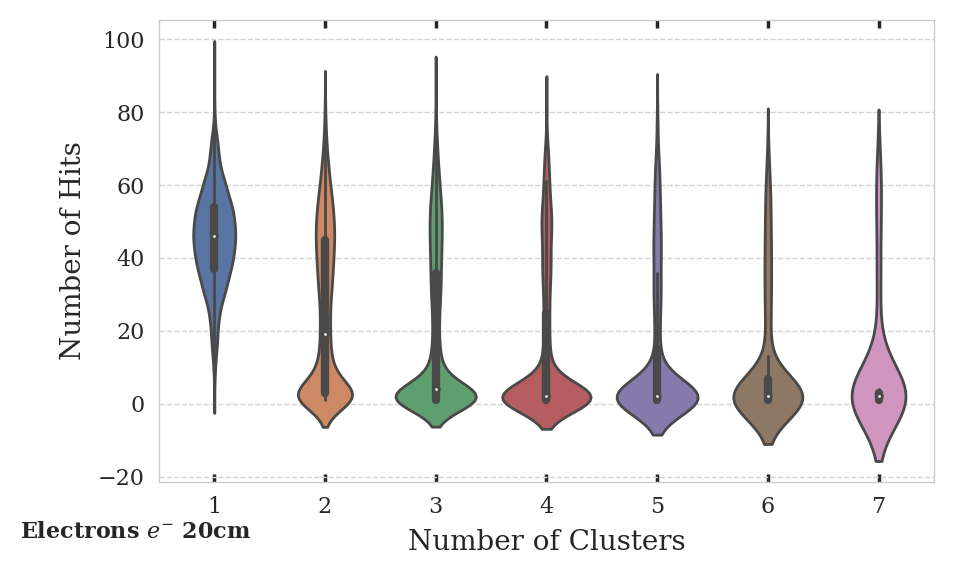

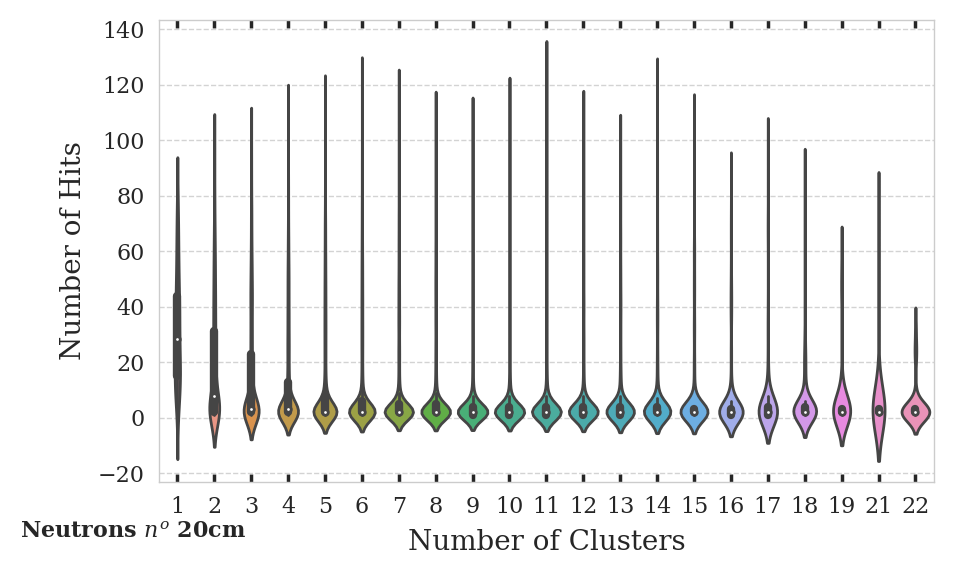

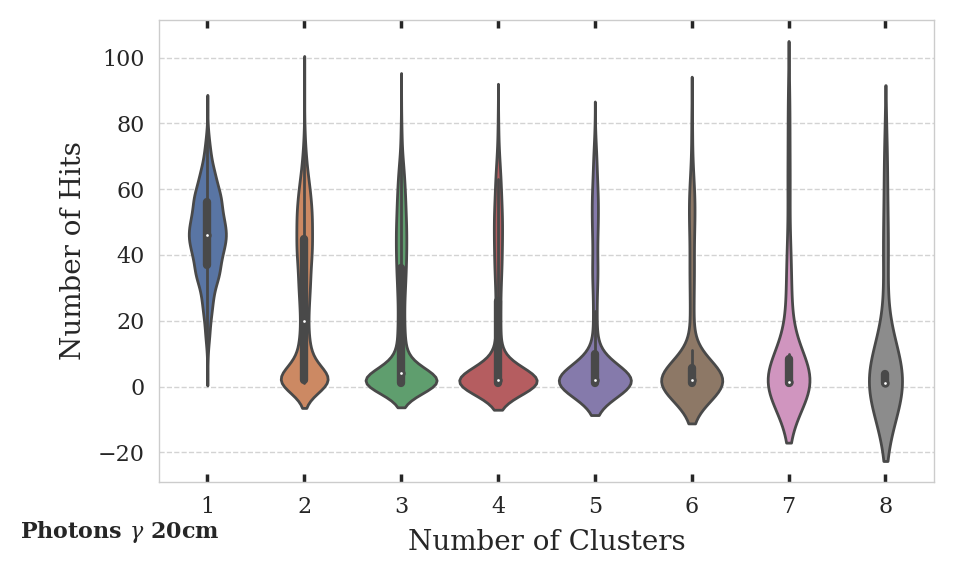

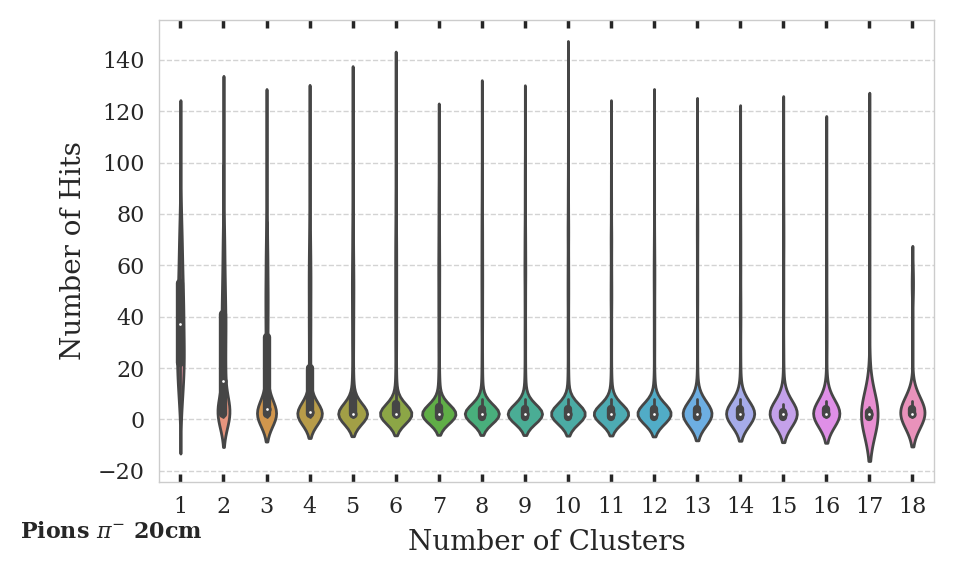

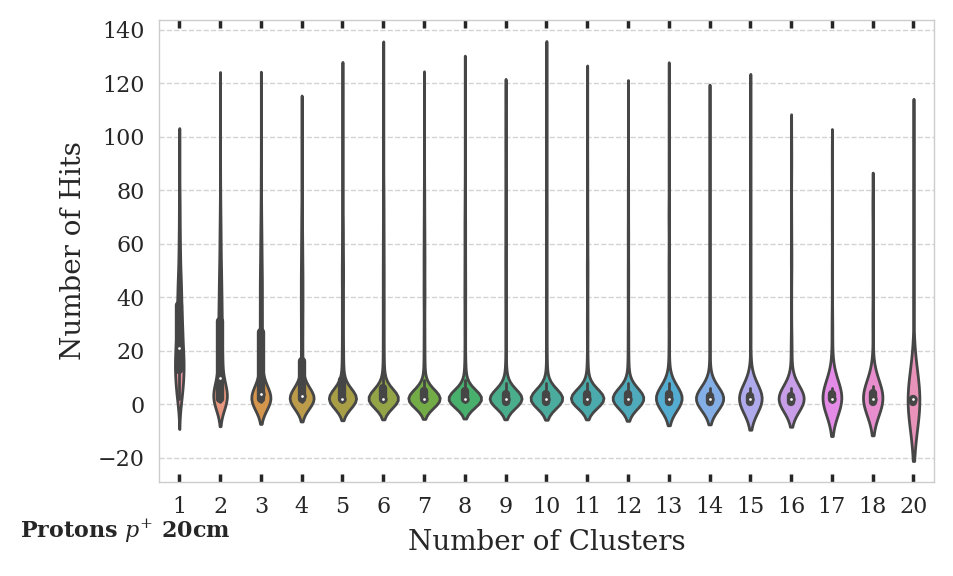

In [32]:
plot_hits_count(particles_dict_20cm, 20)

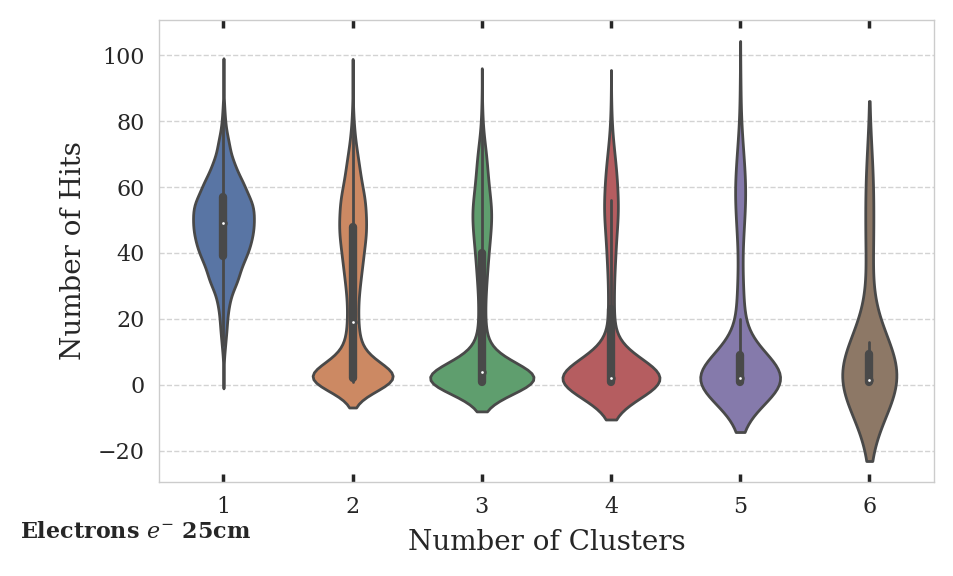

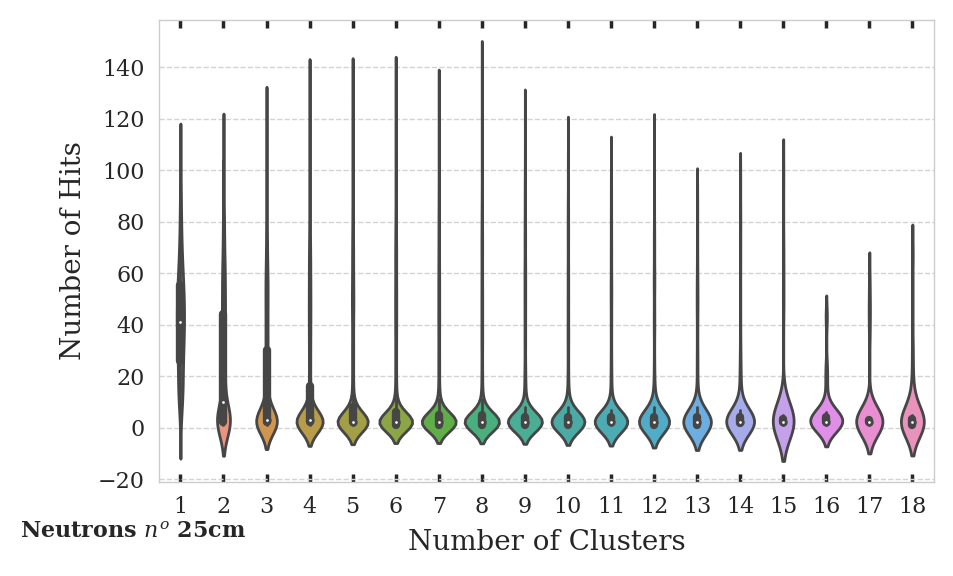

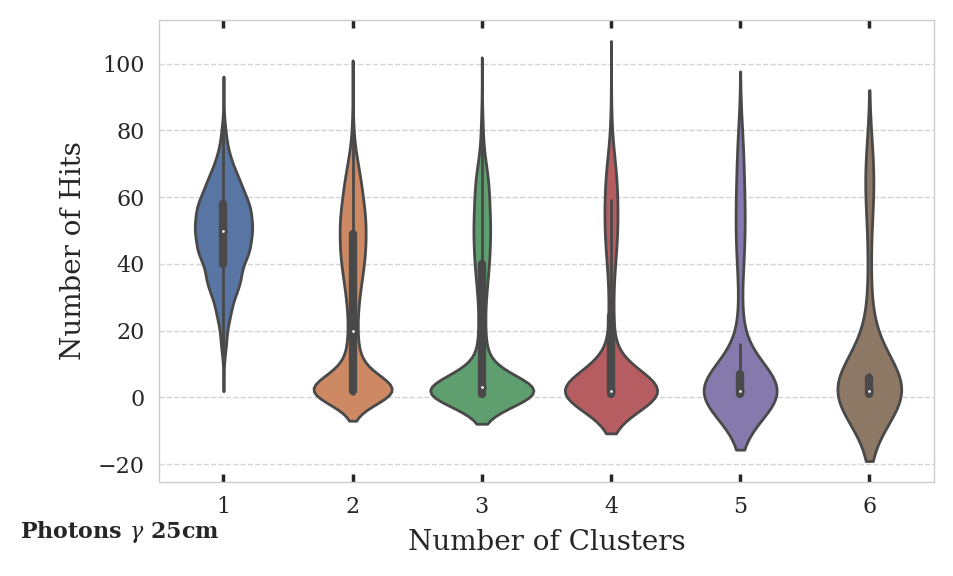

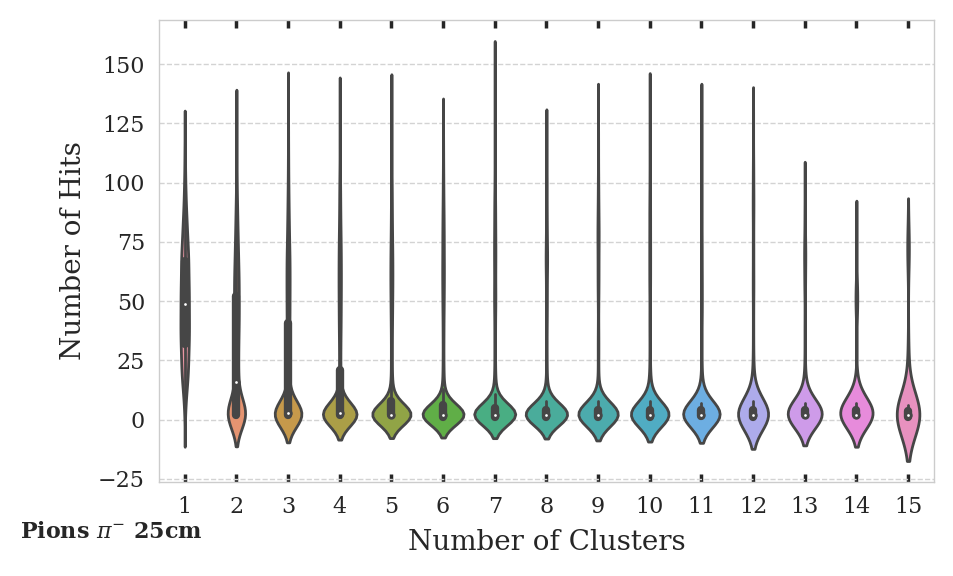

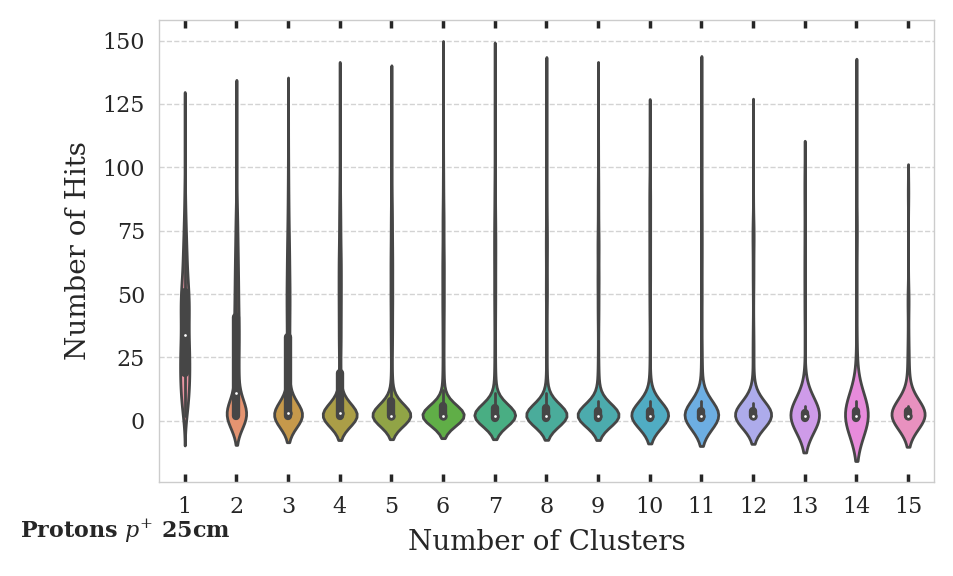

In [33]:
plot_hits_count(particles_dict_25cm, 25)

## Clusters per events (two particles)

In [34]:
def plot_cluster_count(particles_dict=particles_dict_5cm, min_sep=5, cmap='tab10', max_cluster_count=10, fs=8):
    for particles in particles_name_list:
        # energy bins
        from matplotlib import cm
    
        # energy bins
        energy_bins = [0, 1, 2, 3, 4, 5]
        energy = particles_dict[particles].get('PFCandidates_hcalEnergy_o1corr')
        cluster_count = particles_dict[particles].get('PFHcalClusters_good_count')#.get('PFHcalClusters_count')
        
        # plot setup
        full_cmap = cm.get_cmap(cmap)
        color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10
        fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
        ax.grid(visible=False)
        
        for i, min_energy in enumerate(energy_bins[:-1]):
            mask = np.logical_and(energy > min_energy*1e3, energy <= energy_bins[i+1]*1e3)
            entries, counts = np.unique(cluster_count[mask], return_counts=True)
            print(entries, counts)
            
            bottom = 0
            norm = len(cluster_count[mask])/100
            for (_, entry), count in zip(enumerate(entries), counts):
                # max and above
                if entry == max_cluster_count:
                    sum_count = np.sum(counts[_:])
                    ax.bar(i, sum_count/norm, color=color_list[entry], ec='black', lw=0.2, bottom=bottom, align='edge', width=1, alpha=0.8)
                    break
                ax.bar(i, count/norm, color=color_list[entry], ec='black', lw=0.2, bottom=bottom, align='edge', width=1, alpha=0.8)
                bottom += count/norm
        
        ax.annotate(text=f'{labels_dict[particles]} {min_sep}cm', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
        
        for j in range(np.max(particles_dict[particles].get('PFHcalClusters_good_count')+1)):
            if j == max_cluster_count:
                ax.bar(0, 0, color_list[j], ec='black', label=f'{j} and above')
                break
            ax.bar(0, 0, color_list[j], ec='black', label=j)
        ax.set_xlabel('Energy Bins [GeV]', fontsize=10)
        ax.set_ylabel('Number of Clusters [%]', fontsize=10)
        ax.legend(fontsize=fs, loc='lower left')
        plt.show()

[0 1 2] [139  33   5]
[0 1 2 3 4] [521 291  56  14   1]
[0 1 2 3 4] [1162  912  320   70   11]
[0 1 2 3 4 5 6] [1636 1642  719  216   43    4    2]
[0 1 2 3 4 5] [657 732 478 157  38   3]


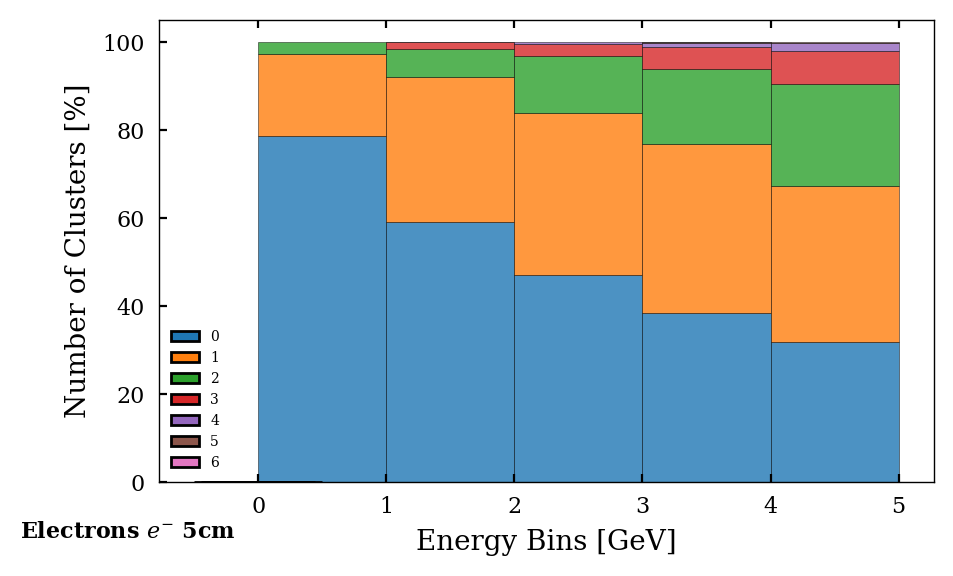

[0 1 2 3 5] [454  58   5   2   1]
[0 1 2 3 4] [946 375  76   7   5]
[0 1 2 3 4] [1219  775  250   63   13]
[0 1 2 3 4 5 6] [1377 1154  522  156   26   11    1]
[0 1 2 3 4 5 6] [648 709 361 137  38   8   1]


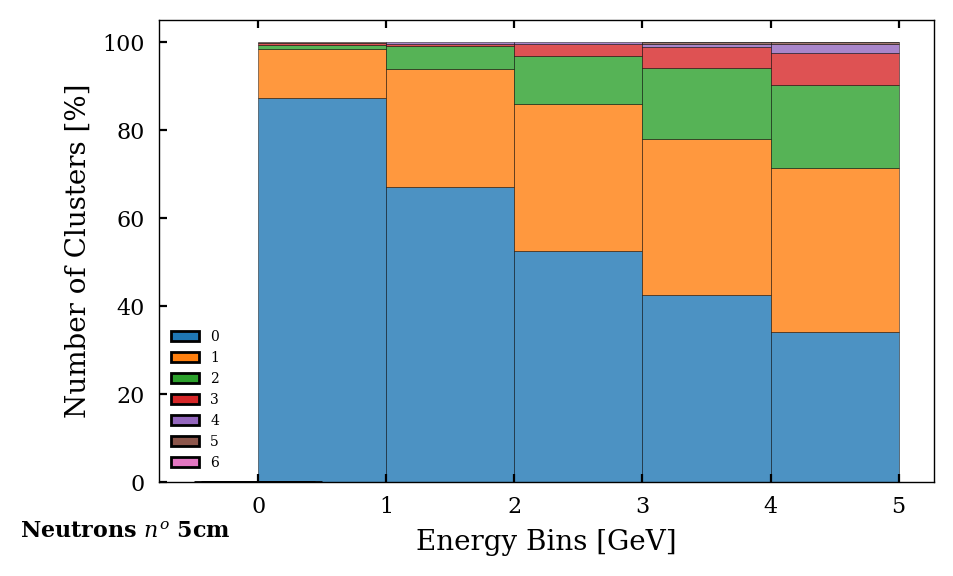

[0 1 2 3] [118  34   4   1]
[0 1 2 3] [481 271  75  12]
[0 1 2 3 4 5] [1093  878  321   53    8    1]
[0 1 2 3 4 5] [1631 1638  773  220   37    3]
[0 1 2 3 4 5 7] [690 820 518 169  42   7   1]


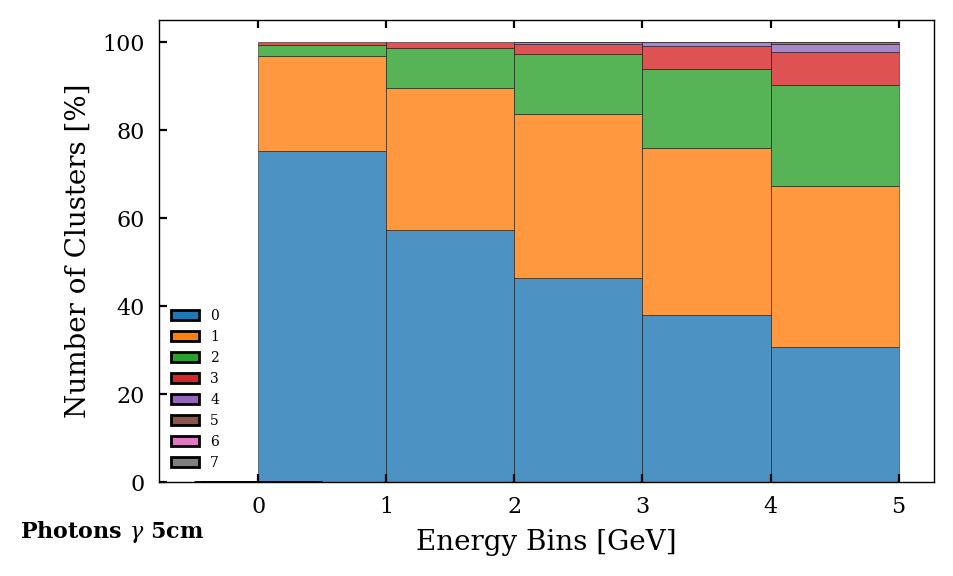

[0 1 2 4] [135  53  11   1]
[0 1 2 3 4] [523 319 115  13   8]
[0 1 2 3 4 5] [784 690 333  90  16   3]
[0 1 2 3 4 5 6 7] [1075 1148  676  284   80   21    8    1]
[0 1 2 3 4 5 6 7 8] [634 823 583 307  76  23   7   2   1]


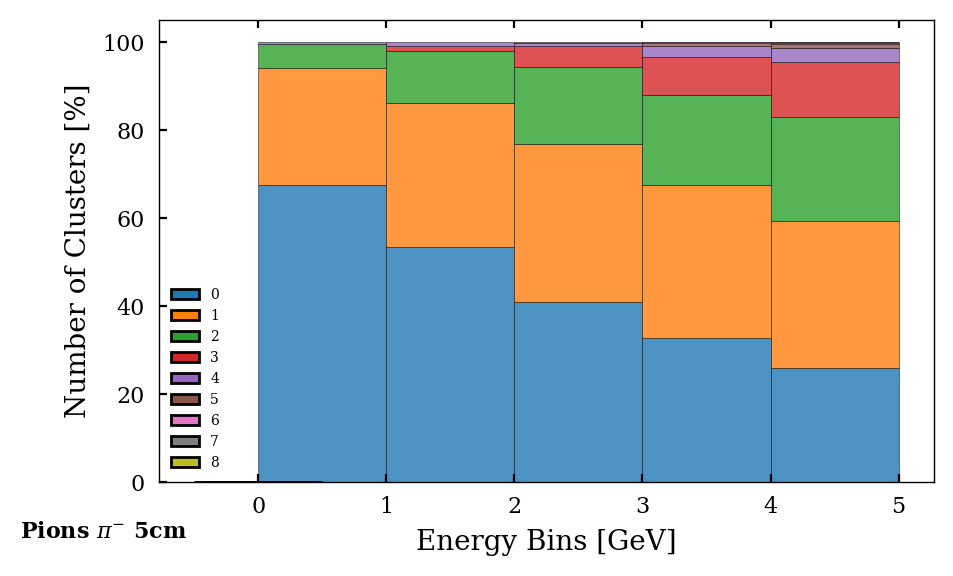

[0 1 2 3 4] [210  50   4   1   1]
[0 1 2 3 4] [751 338  79  12   2]
[0 1 2 3 4 5] [960 754 277  67  21   1]
[0 1 2 3 4 5] [1185 1269  640  213   59    9]
[0 1 2 3 4 5 6] [632 809 520 207  70  25   5]


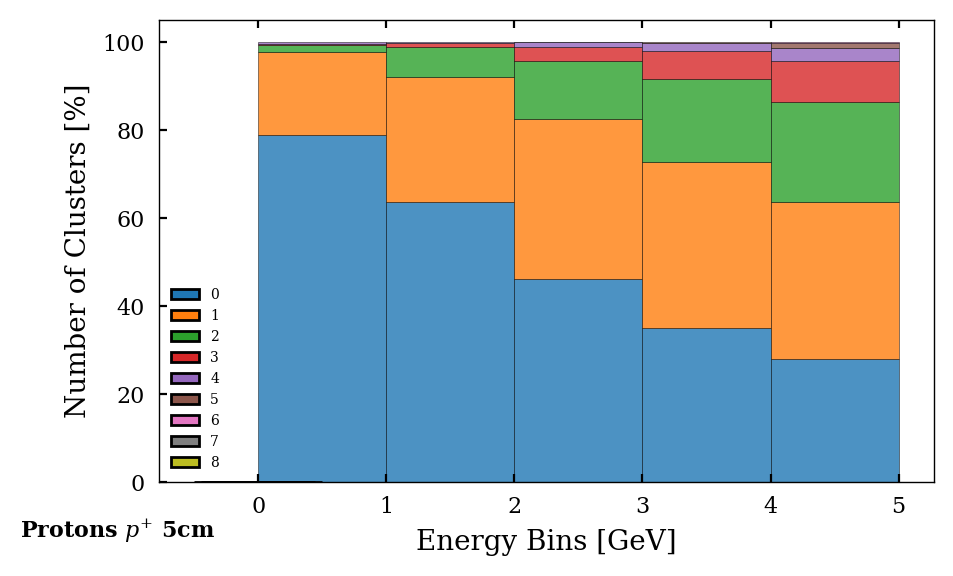

In [35]:
plot_cluster_count(particles_dict_5cm, 5, 'tab10', fs=5)

[0 1 2] [ 21 116  40]
[1 2 3 4] [459 404  19   1]
[1 2 3 4] [ 971 1327  168    9]
[1 2 3 4 5 6] [1121 2600  496   38    6    1]
[1 2 3 4 5] [ 381 1284  356   42    2]


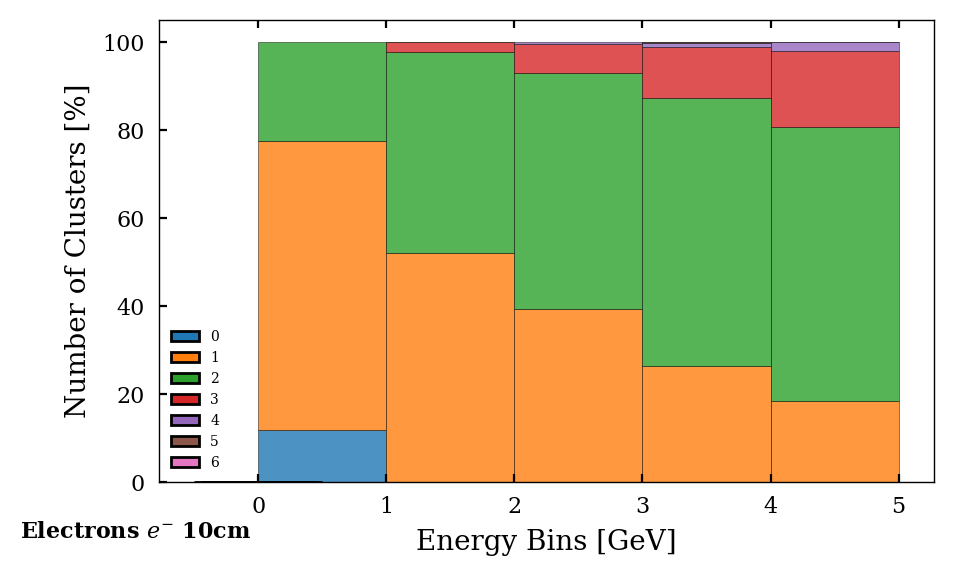

[0 1 2 3] [243 235  39   3]
[0 1 2 3 4 5] [108 789 436  70   5   1]
[0 1 2 3 4 5] [  14  855 1000  374   69    8]
[0 1 2 3 4 5 6 7] [   1  644 1410  860  267   54   10    1]
[0 1 2 3 4 5 6 7] [  1 193 692 647 272  74  21   2]


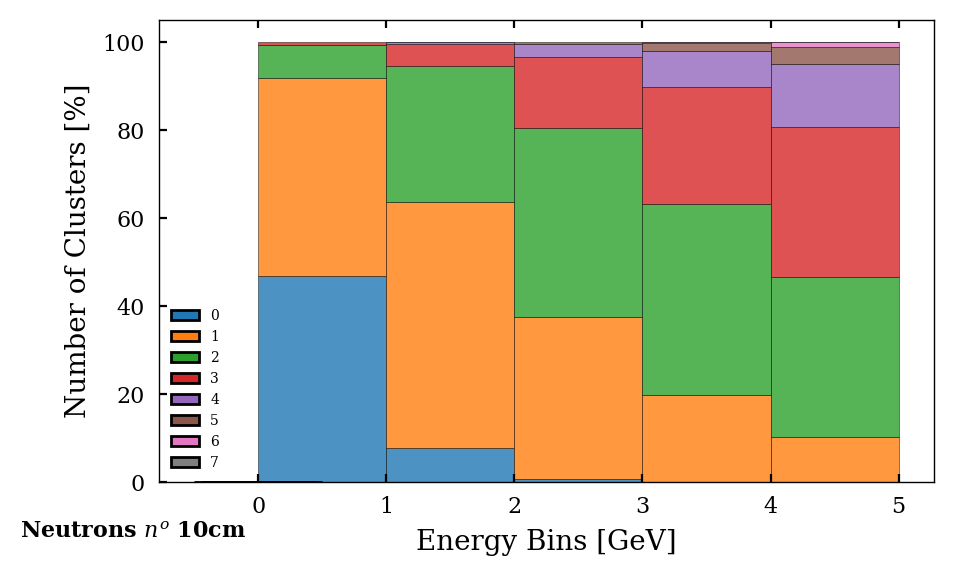

[0 1 2 3] [12 98 46  1]
[1 2 3] [419 401  19]
[1 2 3 4] [ 876 1316  154    8]
[1 2 3 4 5 6] [1190 2598  462   42    9    1]
[1 2 3 4 5] [ 429 1358  401   54    5]


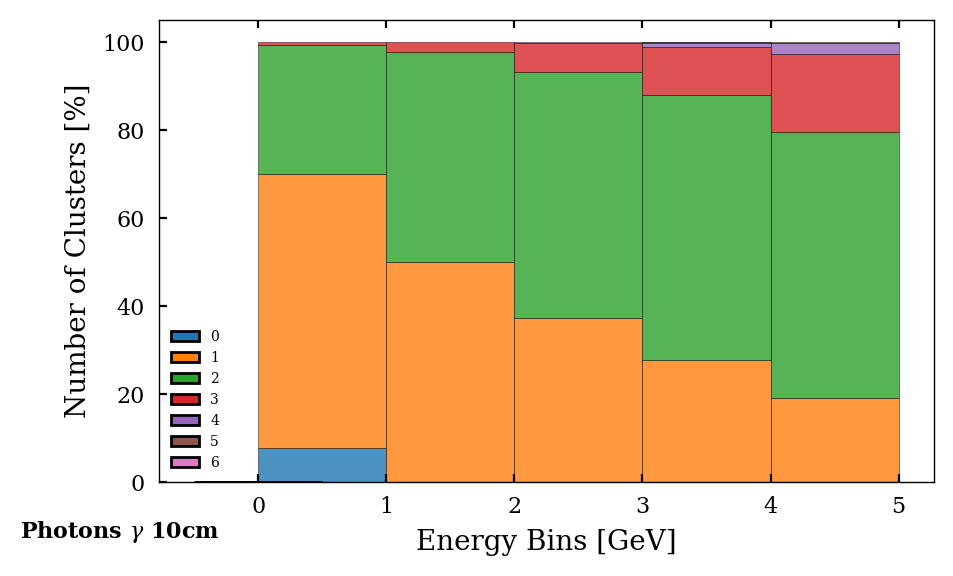

[0 1 2 3] [ 42 121  33   4]
[0 1 2 3 4] [ 15 448 431  79   5]
[0 1 2 3 4 5] [  3 547 946 354  60   6]
[0 1 2 3 4 5 6] [   1  635 1467  839  281   59   11]
[1 2 3 4 5 6 7] [242 947 803 346 102  15   1]


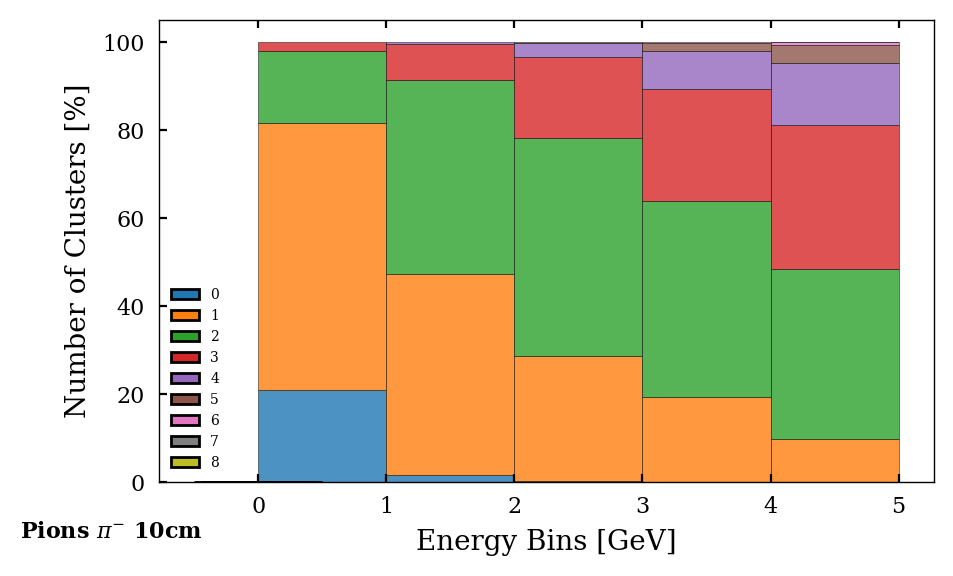

[0 1 2 3] [109 144  11   2]
[0 1 2 3 4] [ 36 680 417  46   3]
[0 1 2 3 4 5 6] [  9 788 992 254  33   3   1]
[0 1 2 3 4 5 6] [   1  727 1555  827  232   32    1]
[1 2 3 4 5 6 7] [270 870 717 296  98  15   2]


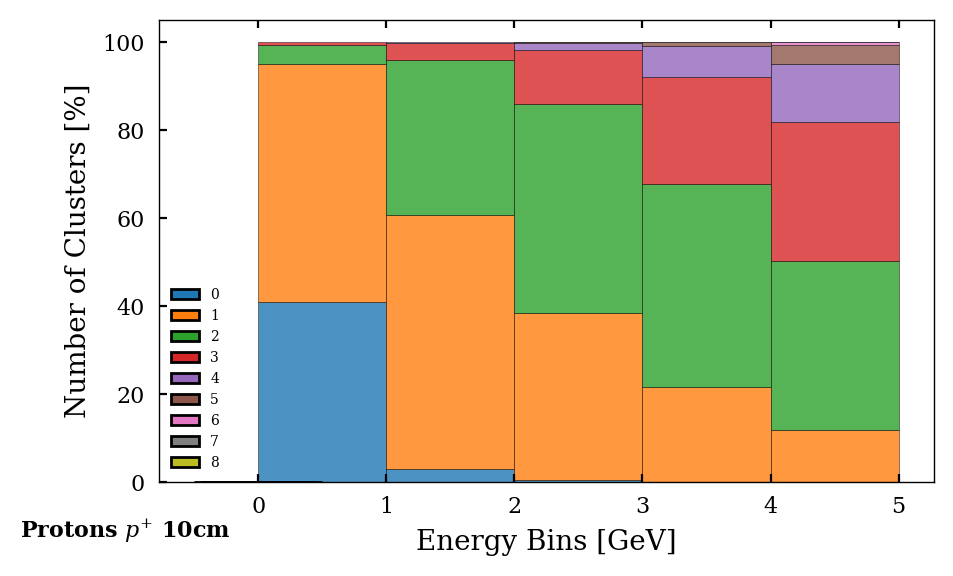

In [36]:
plot_cluster_count(particles_dict_10cm, 10, 'tab10', fs=5)

[0 1 2] [ 19 136  22]
[1 2 3] [634 246   3]
[1 2 3] [1614  857    4]
[1 2 3] [2482 1761   19]
[1 2 3] [1107  939   19]


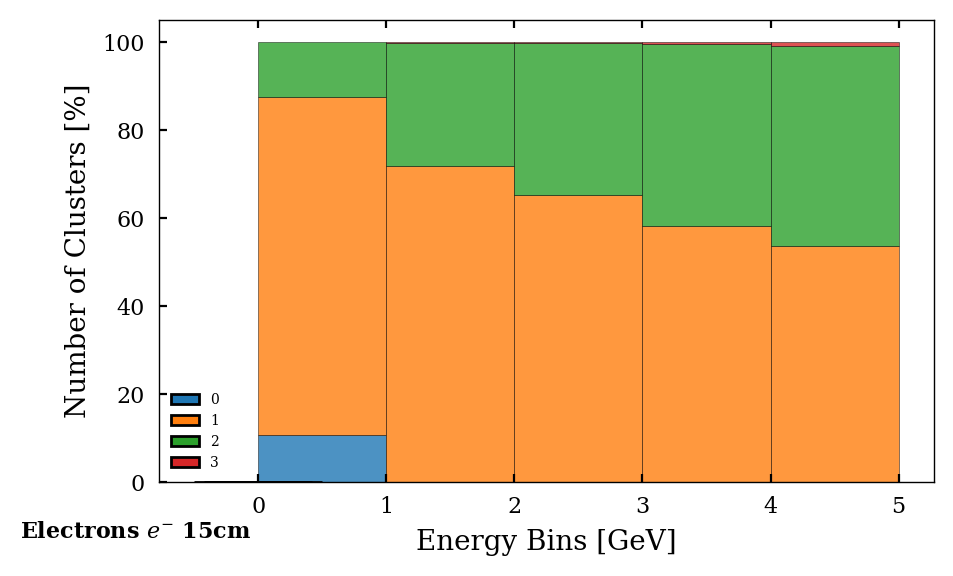

[0 1 2 3] [181 291  44   4]
[0 1 2 3 5] [ 45 912 413  38   1]
[0 1 2 3 4 5] [   2 1275  853  171   18    1]
[1 2 3 4 5] [1377 1432  389   47    2]
[1 2 3 4 5] [722 836 293  49   2]


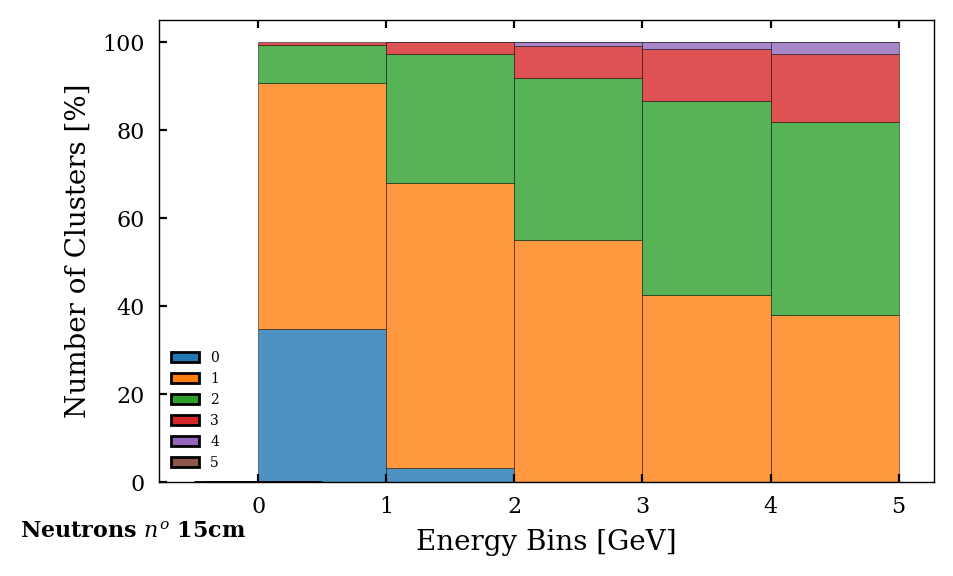

[0 1 2] [ 15 125  17]
[1 2 3] [602 235   2]
[1 2 3] [1512  834    8]
[1 2 3] [2556 1727   19]
[1 2 3] [1199 1032   16]


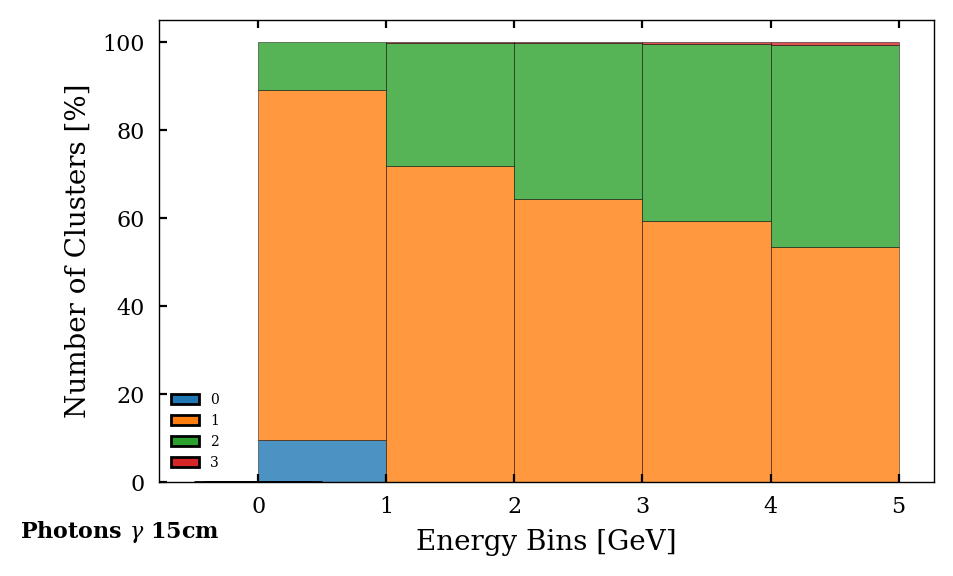

[0 1 2 3] [ 37 134  28   1]
[0 1 2 3] [  4 641 304  29]
[0 1 2 3 4 5] [   1 1031  775  100    8    1]
[1 2 3 4 5] [1622 1399  255   16    1]
[1 2 3 4 5] [1019 1155  254   27    1]


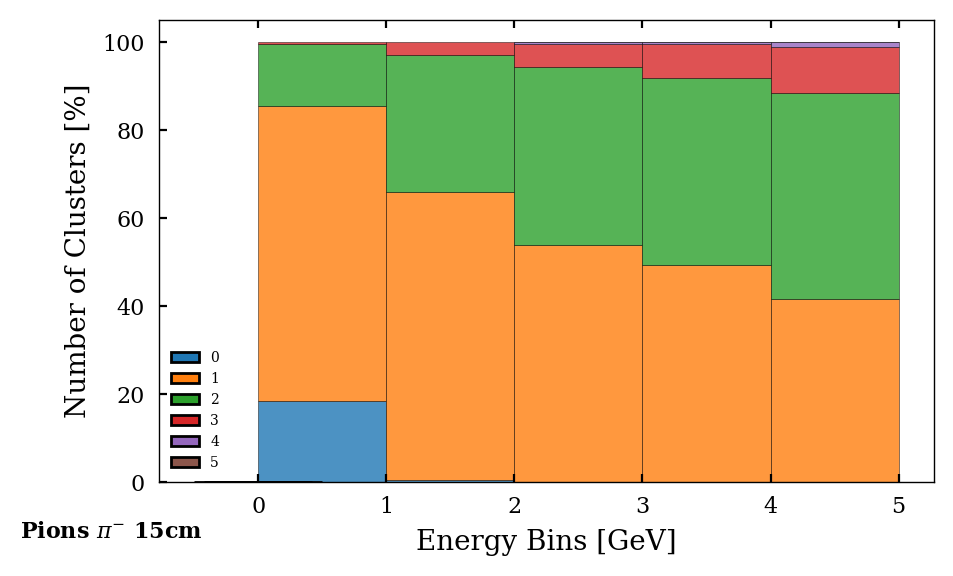

[0 1 2] [123 134   9]
[0 1 2 3 4] [ 29 880 247  25   1]
[0 1 2 3 4 5] [   2 1208  776   89    4    1]
[1 2 3 4 5] [1639 1446  267   22    1]
[1 2 3 4 5] [ 933 1048  257   29    1]


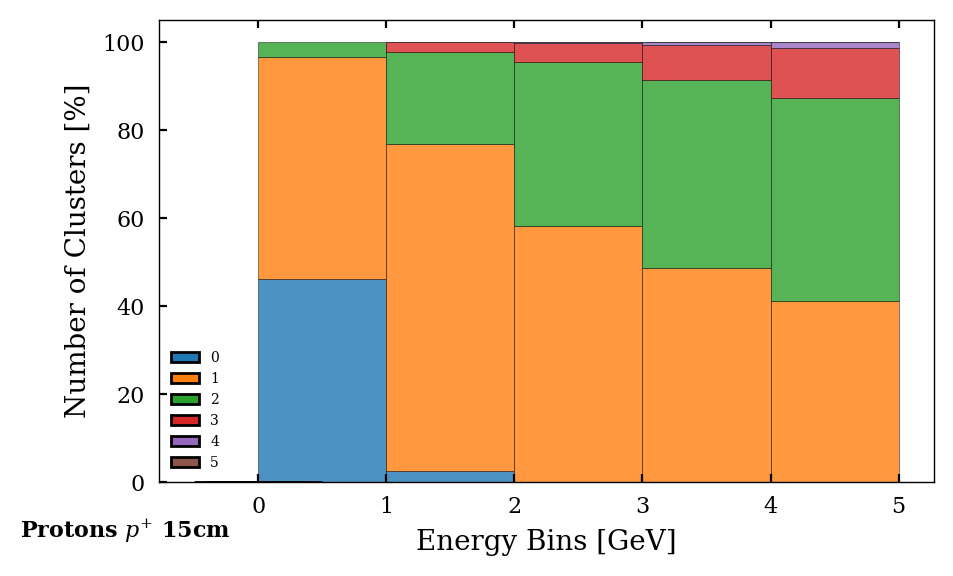

In [37]:
plot_cluster_count(particles_dict_15cm, 15, 'tab10', fs=5)

[0 1 2] [ 21 141  15]
[0 1 2] [  1 747 135]
[1 2] [2021  454]
[1 2 3] [3319  940    3]
[1 2 3] [1568  494    3]


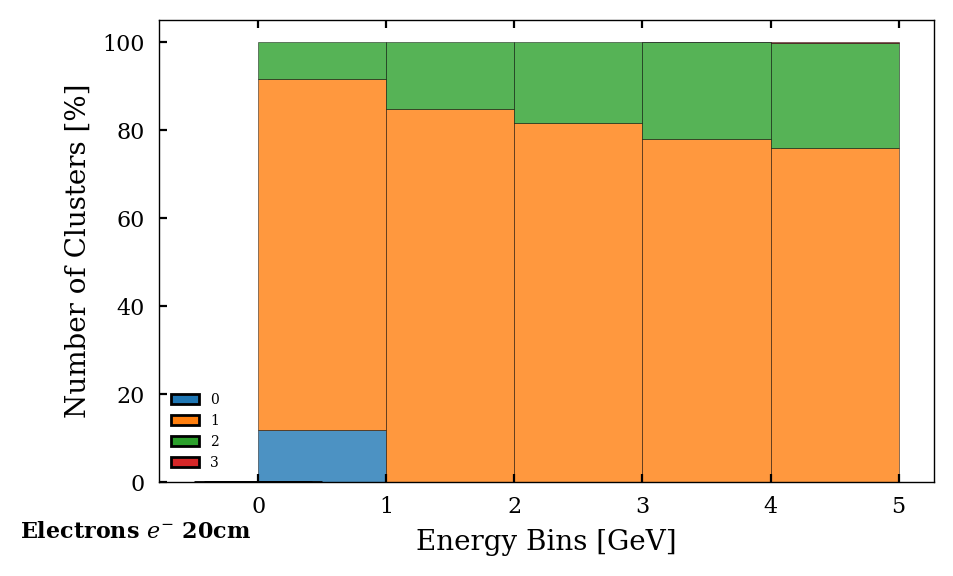

[0 1 2 3] [126 354  38   2]
[0 1 2 3 4] [  22 1020  340   26    1]
[1 2 3 4 5] [1554  672   84    9    1]
[1 2 3 4] [1977 1055  202   13]
[1 2 3 4] [1116  645  127   14]


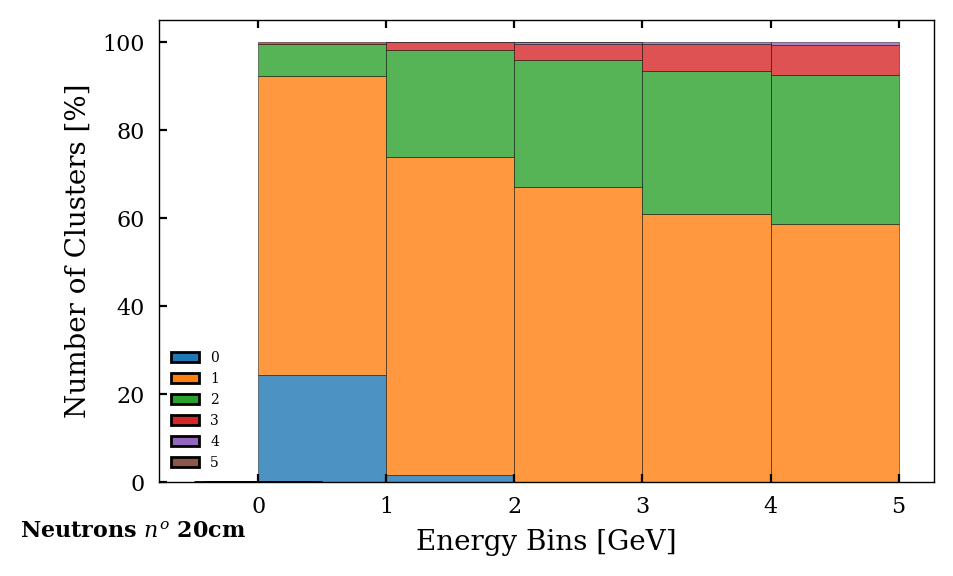

[0 1 2] [ 11 136  10]
[1 2] [703 136]
[1 2] [1893  461]
[1 2 3] [3388  911    3]
[1 2 3] [1675  568    4]


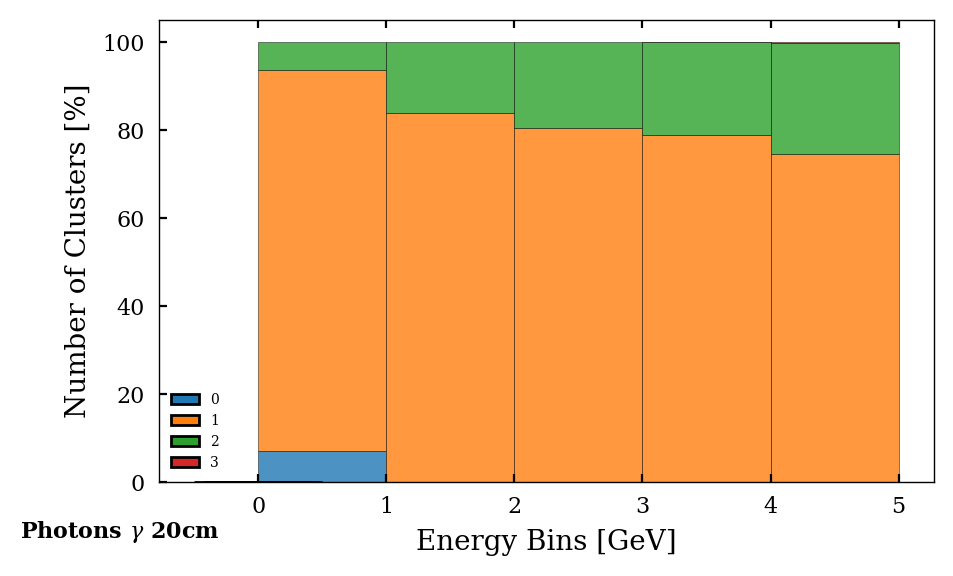

[0 1 2 3] [ 26 158  14   2]
[0 1 2 3] [  4 734 224  16]
[1 2 3 4] [1342  526   44    4]
[1 2 3 4] [2192  986  108    7]
[1 2 3 4] [1553  780  113   10]


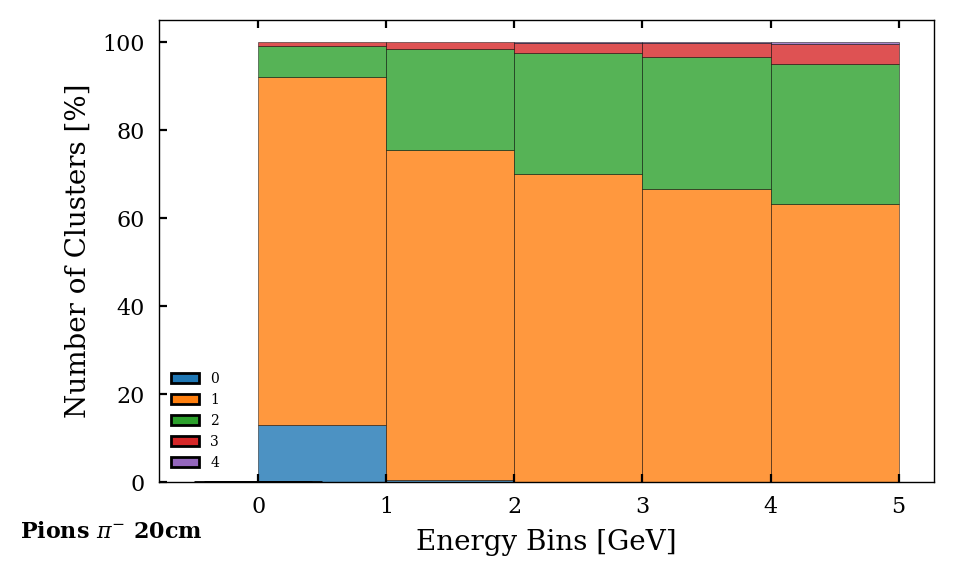

[0 1 2] [118 140   8]
[0 1 2 3] [ 38 944 184  16]
[0 1 2 3 4] [   1 1465  576   34    4]
[1 2 3 4] [2199 1033  138    5]
[1 2 3 4] [1420  720  122    6]


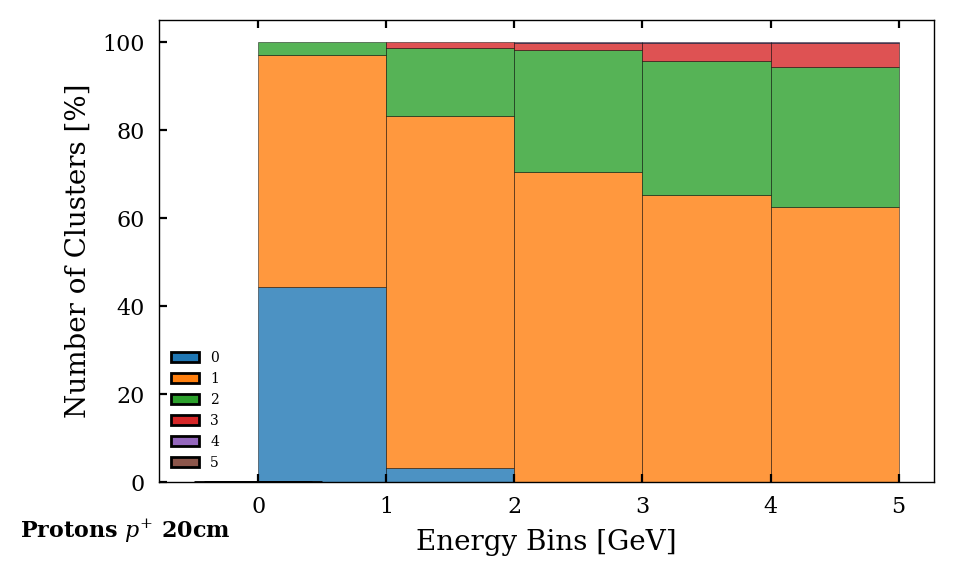

In [38]:
plot_cluster_count(particles_dict_20cm, 20, 'tab10', fs=5)

[0 1 2] [ 44 130   3]
[0 1 2] [  6 844  33]
[1 2] [2329  146]
[1 2] [3966  296]
[1 2] [1916  149]


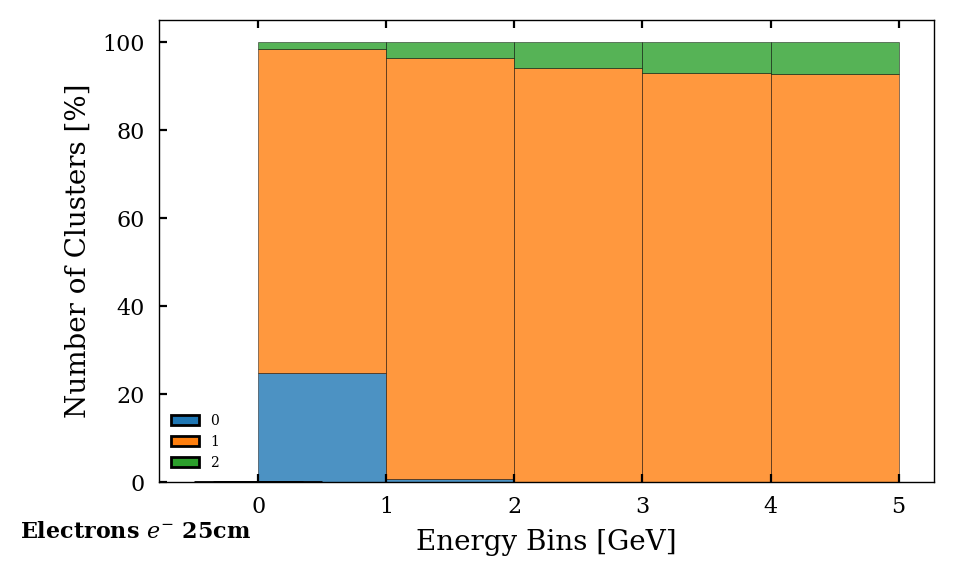

[0 1 2] [193 319   8]
[0 1 2 3] [  48 1243  116    2]
[0 1 2 3] [   3 1991  314   12]
[1 2 3] [2674  538   35]
[1 2 3 4] [1534  337   30    1]


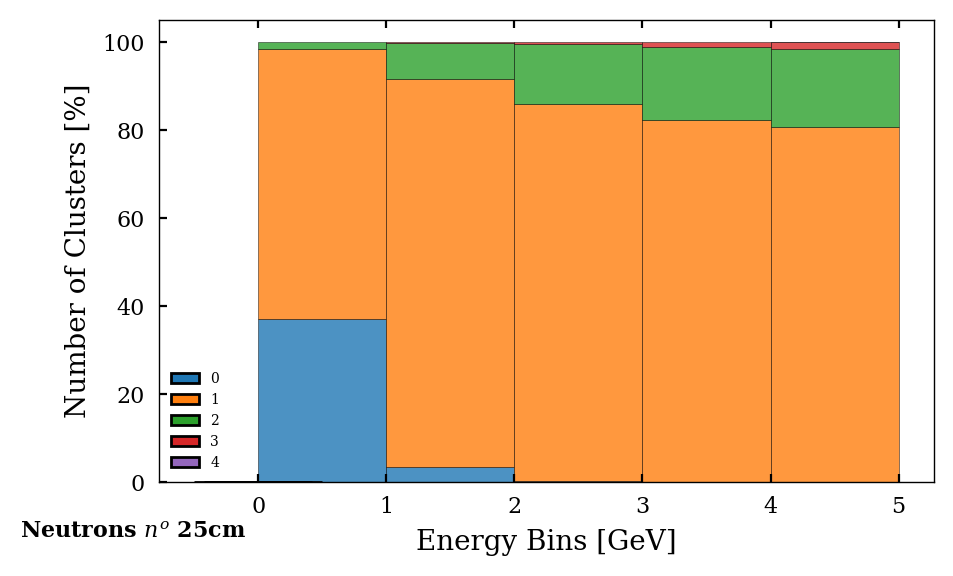

[0 1] [ 33 124]
[1 2] [804  35]
[1 2] [2215  139]
[1 2] [4008  294]
[1 2] [2049  198]


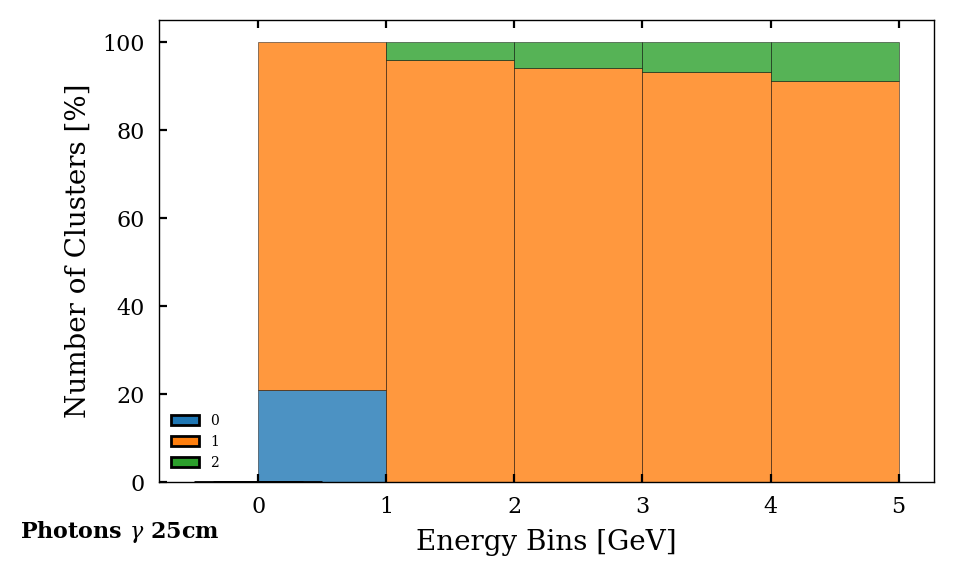

[0 1 2] [ 53 143   4]
[0 1 2] [ 15 889  74]
[0 1 2 3] [   2 1699  210    5]
[1 2 3] [2862  417   14]
[1 2 3 4] [2089  351   15    1]


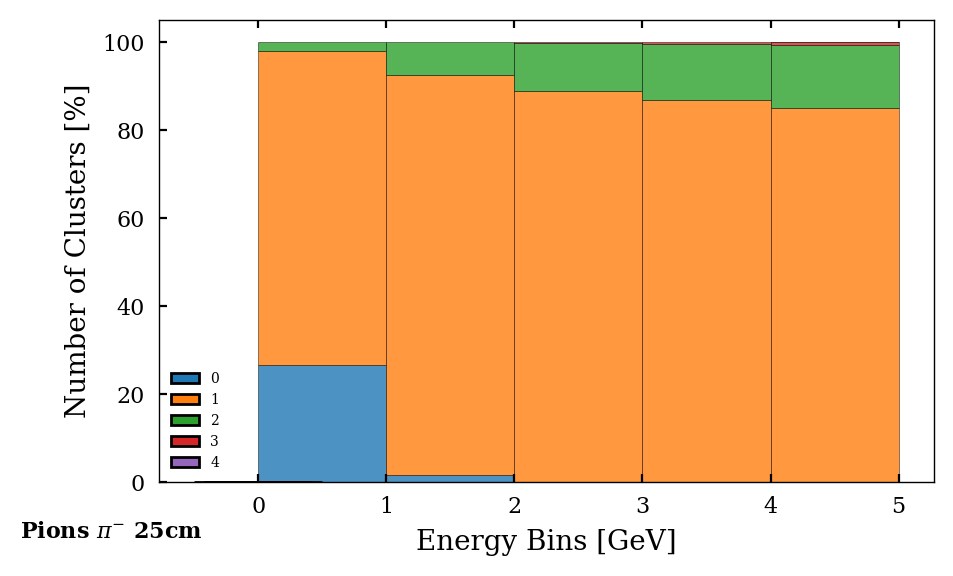

[0 1 2] [163 100   3]
[0 1 2 3] [ 103 1020   58    1]
[0 1 2 3] [   2 1860  212    6]
[1 2 3] [2915  440   20]
[1 2 3] [1921  334   13]


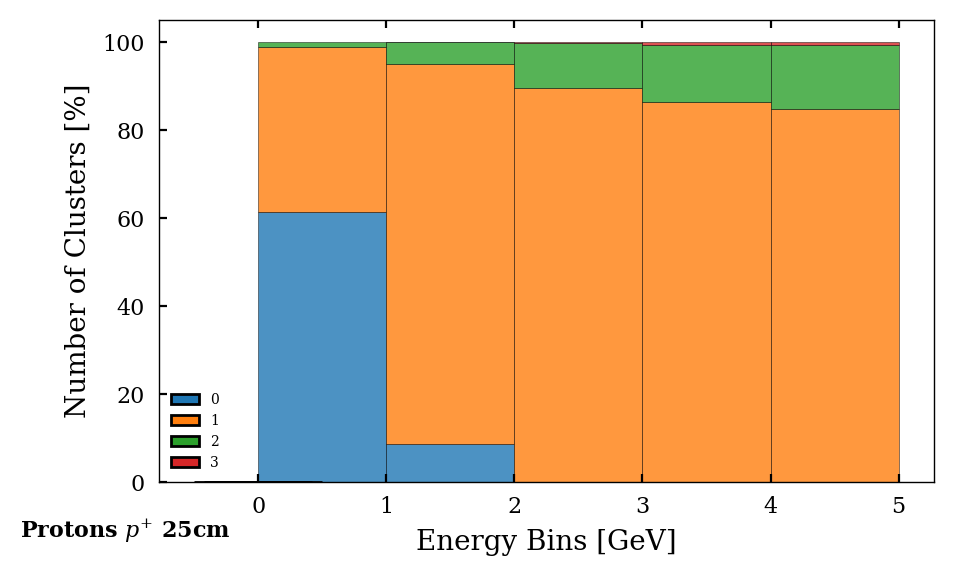

In [39]:
plot_cluster_count(particles_dict_25cm, 25, 'tab10', fs=5)

In [40]:
particles_dict_20cm['electrons'].get('HcalTotalEnergy')

array([457.24472, 334.06458, 468.29077, ..., 365.30237, 546.77246,
       518.55756], dtype=float32)

In [41]:
particles_dict_20cm['electrons'].get('PFCandidates_hcalEnergy')

array([269.88912964, 191.04458618, 459.59832764, ..., 261.52206421,
       546.2411499 , 517.63708496])

In [42]:
particles_dict_20cm['electrons'].get('PFCandidates_hcalEnergy_o1corr')

array([3853.67473622, 2815.50809904, 3946.77124639, ..., 3078.78132712,
       4033.99454433, 3825.82975897])

# Spatial Distributions

In [43]:
list(particles_dict_5cm['electrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalClusters_centroidX_lc',
 'PFHcalClusters_centroidX',
 'PFHcalClusters_centroidY_lc',
 'PFHcalClusters_centroidY',
 'PFHcalClusters_centroidZ_lc',
 'PFHcalClusters_centroidZ',
 'PFHcalClusters_rmsX_lc',
 'PFHcalClusters_rmsX',
 'PFHcalC

In [44]:
# global variables
ECALZ_MIN = 247.9
ECALZ_MAX = 749.1
ECALW = 520

BHCALZ_MIN = 879
SHCALZ_MIN = 240
SHCALZ_MAX = 800
SHCALX_MIN = 500
SHCALX_MAX = 1500

# the style used for the confidence range plots
# 0: area
# 1: error bars
style = 1

def plot_ecal_box(ax, label=False):
    box_label = 'ECal' if label else ''
    ax.add_patch(plt.Rectangle((ECALZ_MIN, -ECALW/2), ECALZ_MAX - ECALZ_MIN, ECALW, fc=(0, 0, 0, 0), ec='red', label=box_label))
    
def plot_hcal_box(ax, label=False):
    box_label = 'HCal' if label else ''
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, SHCALX_MIN), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, -SHCALX_MAX), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.axvline(x=BHCALZ_MIN, lw=1, ls='--', color='red', label=box_label)

# plot the cluster distribution
def plot_cluster_dist(particles_dict=particles_dict_5cm, min_sep=5, spec_part=None, ipart=None, # particle parameters
                      factor=10, length=50, extend=False, xlim=3000, ylim=1000, # line parameters
                      plot_track=False, plot_ecal=False, plot_hcal=True, plot_energy=False, angle_label=True, # plotting booleans
                      cmap='tab20', track_color='black', ecal_color='slateblue', hcal_color='orange'):  # color parameters
    from matplotlib.patches import Polygon
    from matplotlib import cm
    # for each particle
    for particles_name in particles_name_list:
        if spec_part and particles_name not in spec_part:
            continue
        i = ipart
        # get parameters
        particles = particles_dict[particles_name]
        cluster_count = particles.get('PFHcalClusters_good_count')
        track_Pz = particles.get('PFCandidates_trackPz')
        track_Px = particles.get('PFCandidates_trackPx')
        track_posX = particles.get('PFCandidates_posEcalX')
        ecal_clusterZ = particles.get('PFEcalClusters_centroidZ')
        ecal_clusterX = particles.get('PFEcalClusters_centroidX')
        ecal_clusterEZ = particles.get('PFEcalClusters_rmsZ') * ecal_clusterX
        ecal_clusterEX = particles.get('PFEcalClusters_rmsX') * ecal_clusterX
        ecal_clusterDXDZ = particles.get('PFEcalClusters_DXDZ')
        hcal_clusterZ = particles.get('PFHcalClusters_centroidZ')
        hcal_clusterX = particles.get('PFHcalClusters_centroidX')
        hcal_clusterEZ = particles.get('PFHcalClusters_rmsZ')
        hcal_clusterEX = particles.get('PFHcalClusters_rmsX')
        hcal_clusterDXDZ = particles.get('PFHcalClusters_DXDZ')

        hcal_hitsX = particles.get('PFHcalClusters_hitX')
        hcal_hitsY = particles.get('PFHcalClusters_hitY')
        hcal_hitsZ = particles.get('PFHcalClusters_hitZ')
        
        # get the index of max number of clusters
        if not i:
            i = np.argmax(cluster_count)

        print(cluster_count[i])
        
        # setting up plot
        fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
        full_cmap = cm.get_cmap(cmap)
        color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10

        """Track Momentum"""
        if plot_track:
            # add triangle
            Pz = track_Pz[i]/factor
            Px = track_Px[i]/factor
            xy = [[ECALZ_MIN, track_posX[i]], [ECALZ_MIN+Pz, track_posX[i]], [ECALZ_MIN+Pz, track_posX[i]+Px]]
            momentum = Polygon(xy=xy, fc='None', ec=track_color, ls='--', label='Track')
            ax.add_patch(momentum)
            # add annotation
            track_angle = np.rad2deg(np.arctan(Px/Pz))
            ax.text(ECALZ_MIN+Pz/2, ECALW/2+20, fr'Track {track_angle:.2f} $\deg$', color=track_color, ha='center')
            # extend
            if extend:
                ax.axline(xy1=[ECALZ_MIN, track_posX[i]], xy2=[ECALZ_MIN + Pz * 10, track_posX[i] + Px * 10], lw=1, ls='--', alpha=0.5, color=track_color)
        
        """Ecal Box"""
        if plot_ecal:
            ecal_z = ecal_clusterZ[i]
            ecal_x = ecal_clusterX[i]
            ecal_ez = ecal_clusterEZ[i]
            ecal_ex = ecal_clusterEX[i]
            plotting.error_bar(fig, ax, x=ecal_z, y=ecal_x, xerr=[[ecal_ez], [ecal_ez]], yerr=[[ecal_ex], [ecal_ex]], color=ecal_color, fmt='--', label='ECal Cluster')
            # the angle
            ecal_tan = ecal_clusterDXDZ[i]
            ecal_angle = np.rad2deg(np.arctan(ecal_tan))
            ax.plot([ecal_z+ecal_ez, ecal_z-ecal_ez], [ecal_x+ecal_ez*ecal_tan, ecal_x-ecal_ez*ecal_tan], color=ecal_color, lw=1, ls='--', alpha=0.8)
            if angle_label:
                ax.text(ecal_z, -ECALW/2-80, fr'ECal {ecal_angle:.2f} $\deg$', color=ecal_color, ha='center')
            # extend
            if extend:
                ax.axline(xy1=[ecal_z, ecal_x], xy2=[ecal_z + length * 10, ecal_x + length * 10 * ecal_tan], lw=1, ls='--', alpha=0.5, color=ecal_color)
        
        """Hcal Box"""
        if plot_hcal:
            hcal_z = hcal_clusterZ[i]
            hcal_x = hcal_clusterX[i]
            hcal_ez = hcal_clusterEZ[i]
            hcal_ex = hcal_clusterEX[i]
            hcal_tan = hcal_clusterDXDZ[i]

            hcal_hx = hcal_hitsX[i]
            hcal_hy = hcal_hitsY[i]
            hcal_hz = hcal_hitsZ[i]
            
            # plot the hits
            markers = ['.', 'o', 'v', '^', '<', '>', '8', 's', 'p', 'h', 'H', 'D', 'd', 'P'] * 10
            i = 0
            for hcal_hx, hcal_hy, hcal_hz in zip(hcal_hx, hcal_hy, hcal_hz):
                ax.scatter(x=hcal_hz, y=hcal_hx, s=5, c=color_list[i], alpha=0.8, lw=1, marker=markers[i])
                i += 1
            
            # check for multiple clusters
            if np.isscalar(hcal_z):
                hcal_z = [hcal_z]
                hcal_x = [hcal_x]
                hcal_ez = [hcal_ez]
                hcal_ex = [hcal_ex]
                hcal_tan = [hcal_tan]

            i = 0
            for hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan in zip(hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan):
                [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan] = [0 if not _ else _ for _ in [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan]]
                ax.errorbar(x=hcal_z, y=hcal_x, xerr=[[hcal_ez], [hcal_ez]], yerr=[[hcal_ex], [hcal_ex]], color=color_list[i], elinewidth=1, fmt='-', label='HCal Cluster')
                # the angle
                hcal_angle = np.rad2deg(np.arctan(hcal_tan))
                if abs(hcal_angle) > 5:
                    ax.plot([hcal_z+hcal_ez, hcal_z-hcal_ez], [hcal_x+hcal_tan*hcal_ez, hcal_x-hcal_tan*hcal_ez], color=color_list[i], lw=1, ls='--', alpha=0.8)
                    if angle_label:
                        ax.text(hcal_z, -ylim, f'{hcal_angle:.2f}', color=color_list[i], ha='center')
                    # extend
                    if extend:
                        ax.axline(xy1=[hcal_z, hcal_x], xy2=[hcal_z + length * 10, hcal_x + length * 10 * hcal_tan], lw=1, ls='--', alpha=0.5, color=color_list[i])
                i += 1
    
        """Energy"""
        if plot_energy:
            measure_ecal_energy = particles.get("PFCandidates_ecalEnergy")[i]
            measure_hcal_energy = particles.get("PFCandidates_hcalEnergy")[i]
            recon_ecal_energy = particles.get("PFCandidates_ecalEnergy_o1corr")[i]
            recon_hcal_energy = particles.get("PFCandidates_hcalEnergy_o1corr")[i]
            truth_ecal_energy = particles.get("PFTruthEcal_energy")[i]
            truth_hcal_energy = particles.get("PFTruthHcal_energy")[i]
            energy_text_x = 1490
            # ax.text(energy_text_x, -450, f'Ecal {measure_ecal_energy:.2f} MeV', ha='right')
            # ax.text(energy_text_x, -550, f'Hcal {measure_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -650, f'Ecal Recon {recon_ecal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -750, f'Hcal Recon {recon_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -850, f'Ecal Truth {truth_ecal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -950, f'Hcal Truth {truth_hcal_energy:.2f} MeV', ha='right')

        # axis
        ax.set_xlabel('Detector z')
        ax.set_ylabel('Detector x')
        ax.set_xlim(200, xlim)
        ax.set_ylim(-ylim, ylim)
            
        # boxes
        plot_ecal_box(ax, 0)
        plot_hcal_box(ax, 0)
        ax.annotate(text=f'{min_sep}cm', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
        ax.annotate(text=labels_dict[particles_name], xy=(-20, -20), xycoords='axes points', fontsize=8, weight='bold')
        # plt.legend(fontsize=10)
        plt.show()

## Figures

For each particle type, the event with the most clusters is plotted first, followed by ten more randomly selected events:

### Photons

6


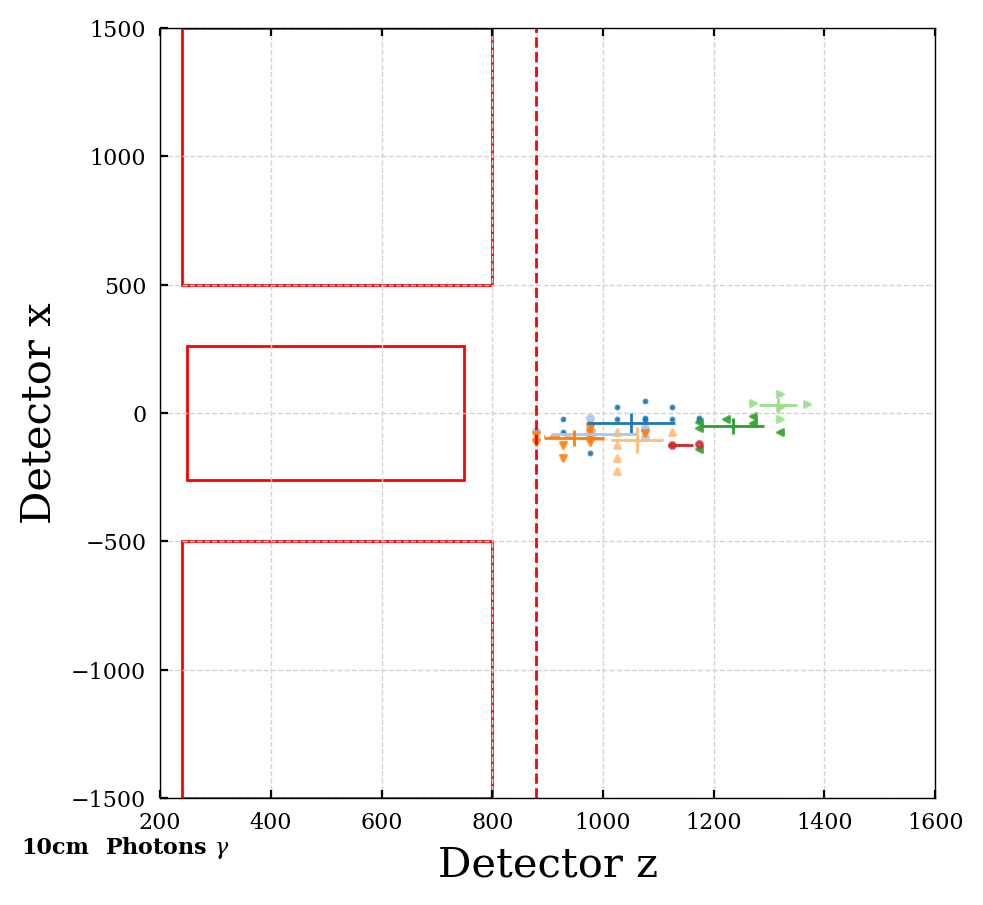

1


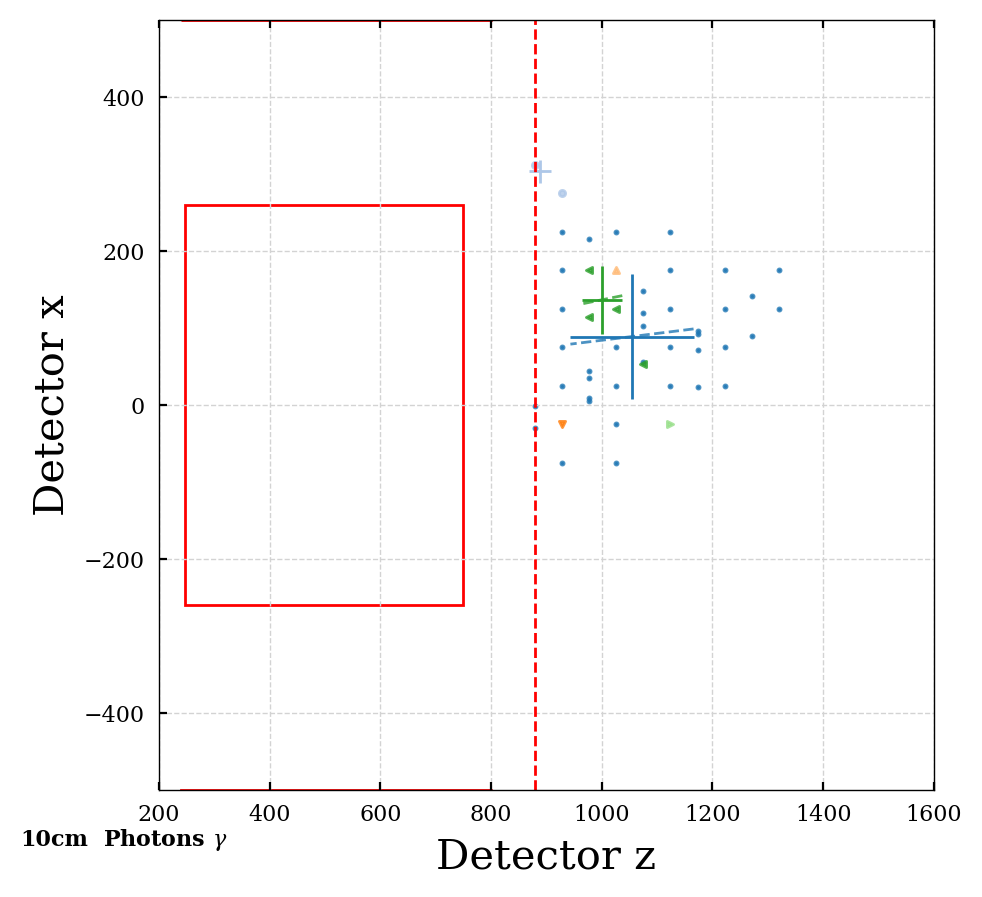

2


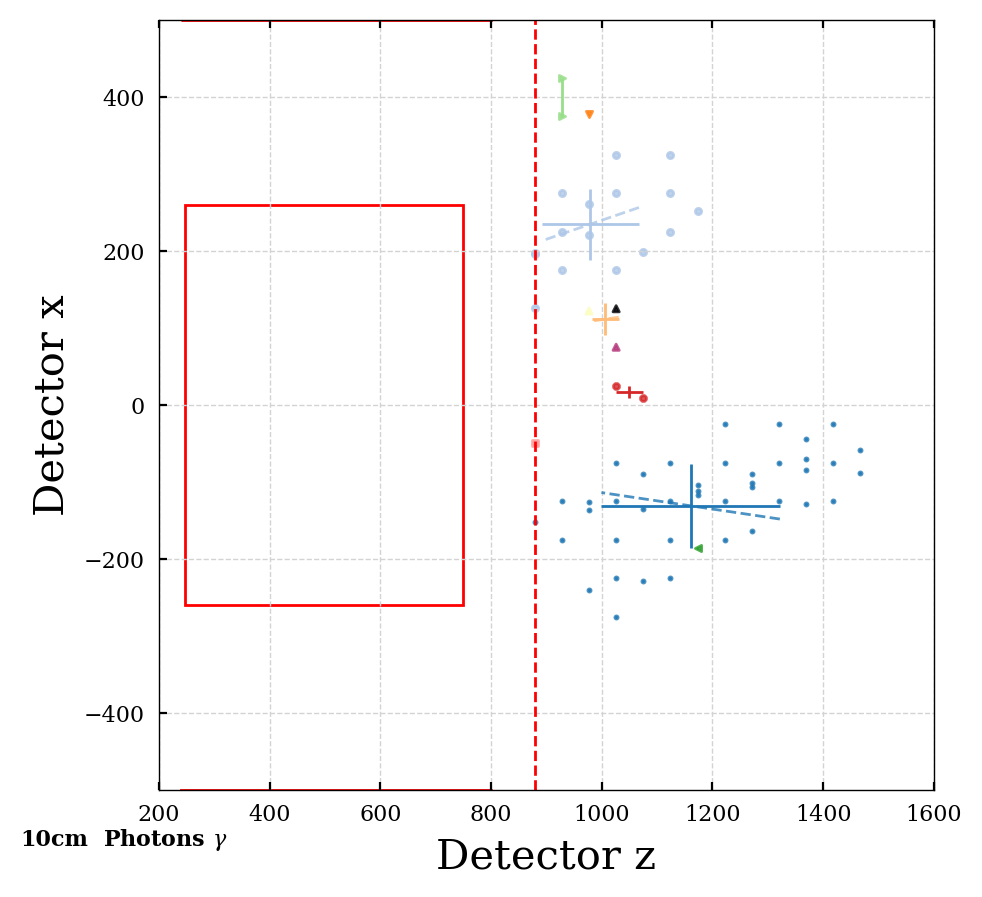

2


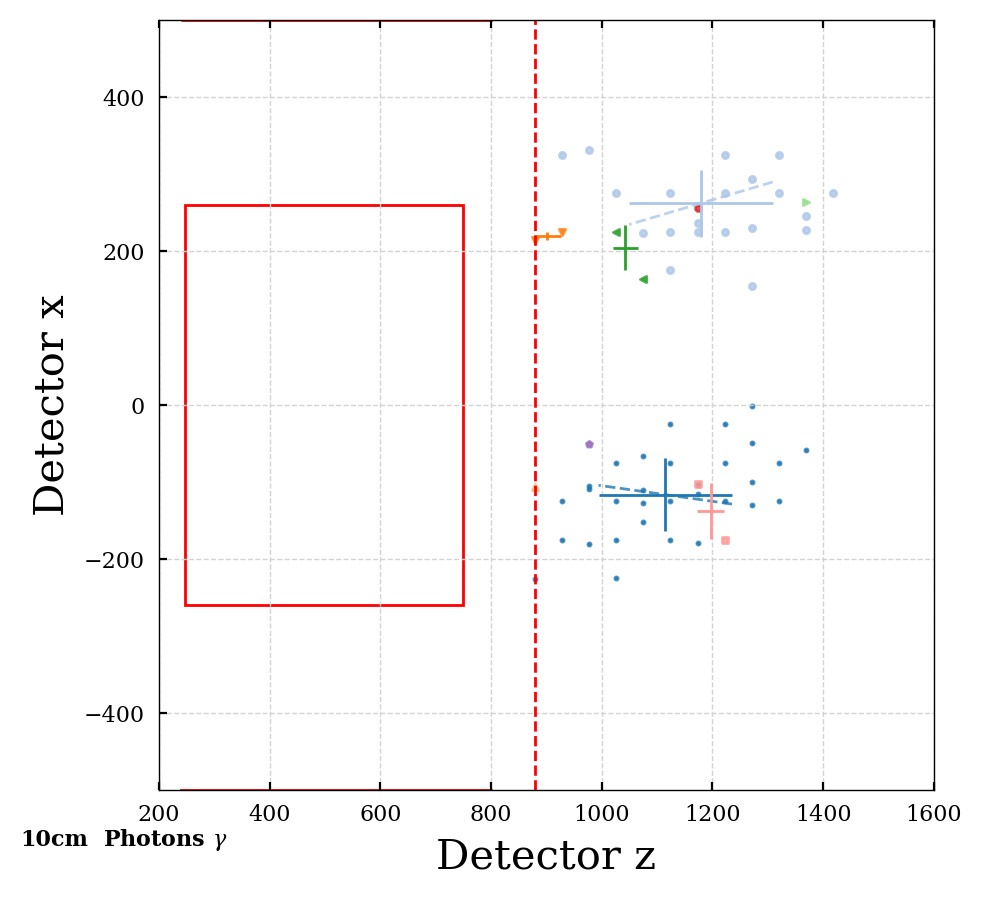

2


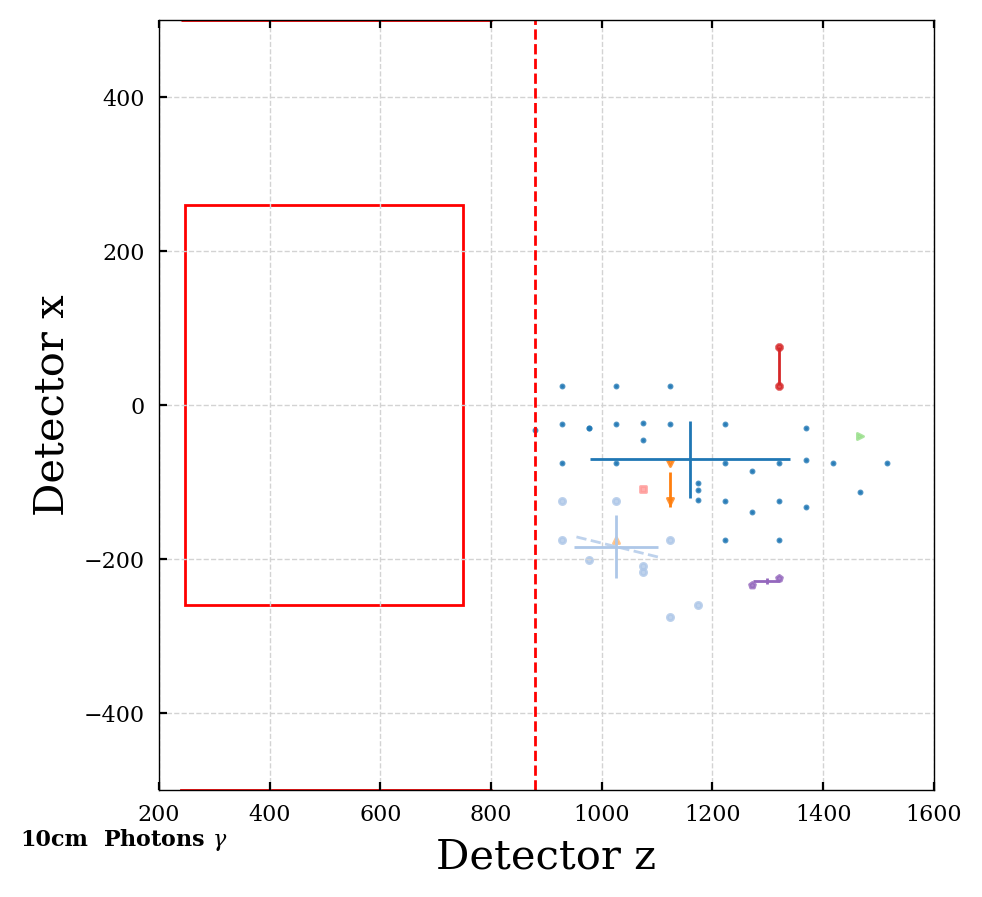

2


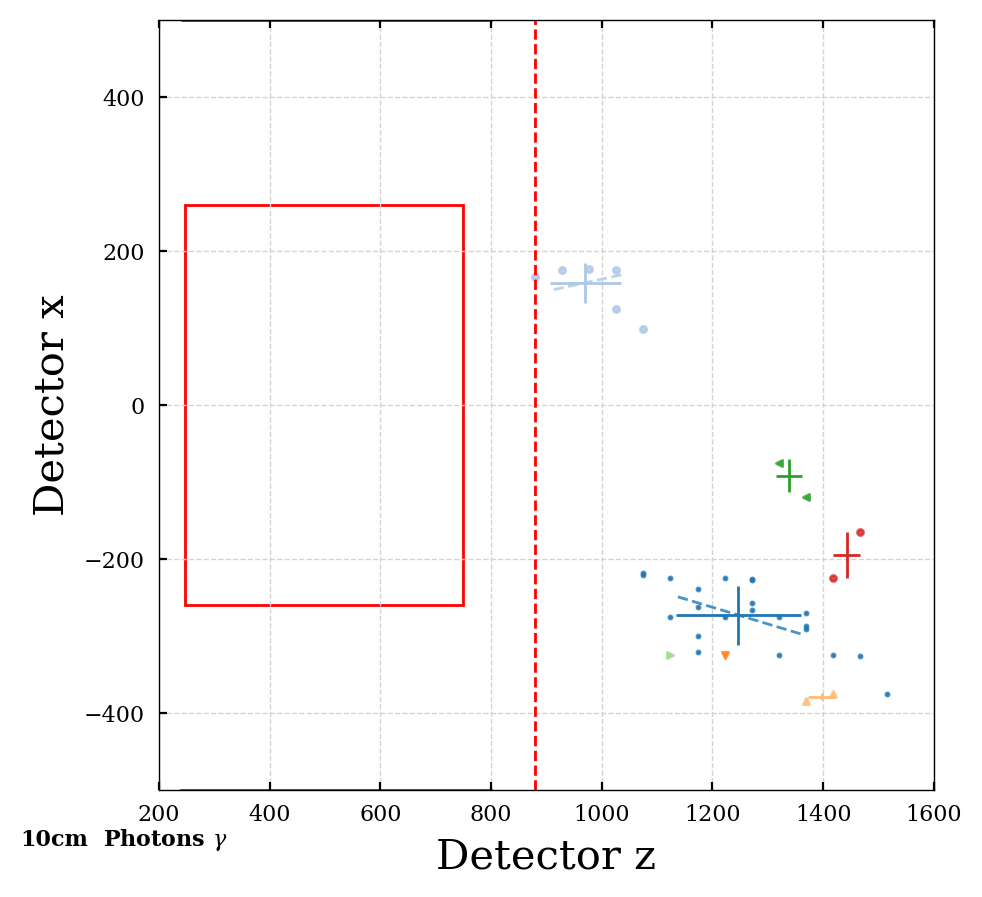

2


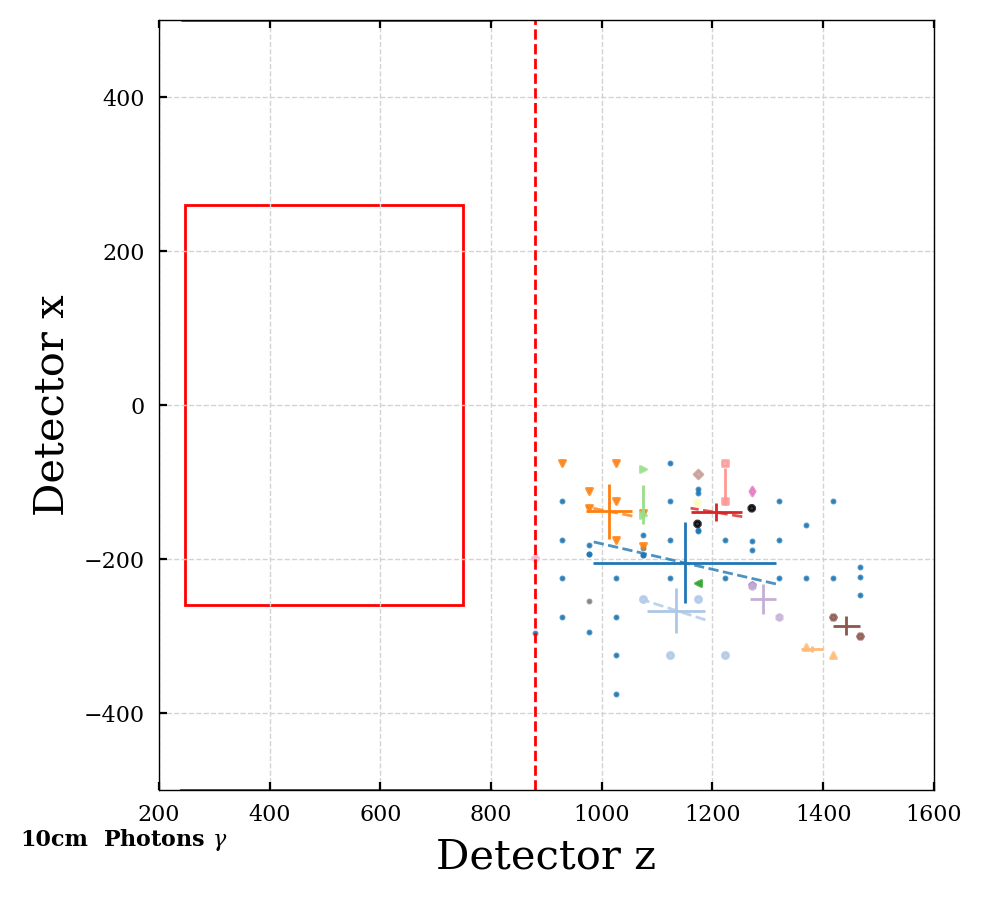

3


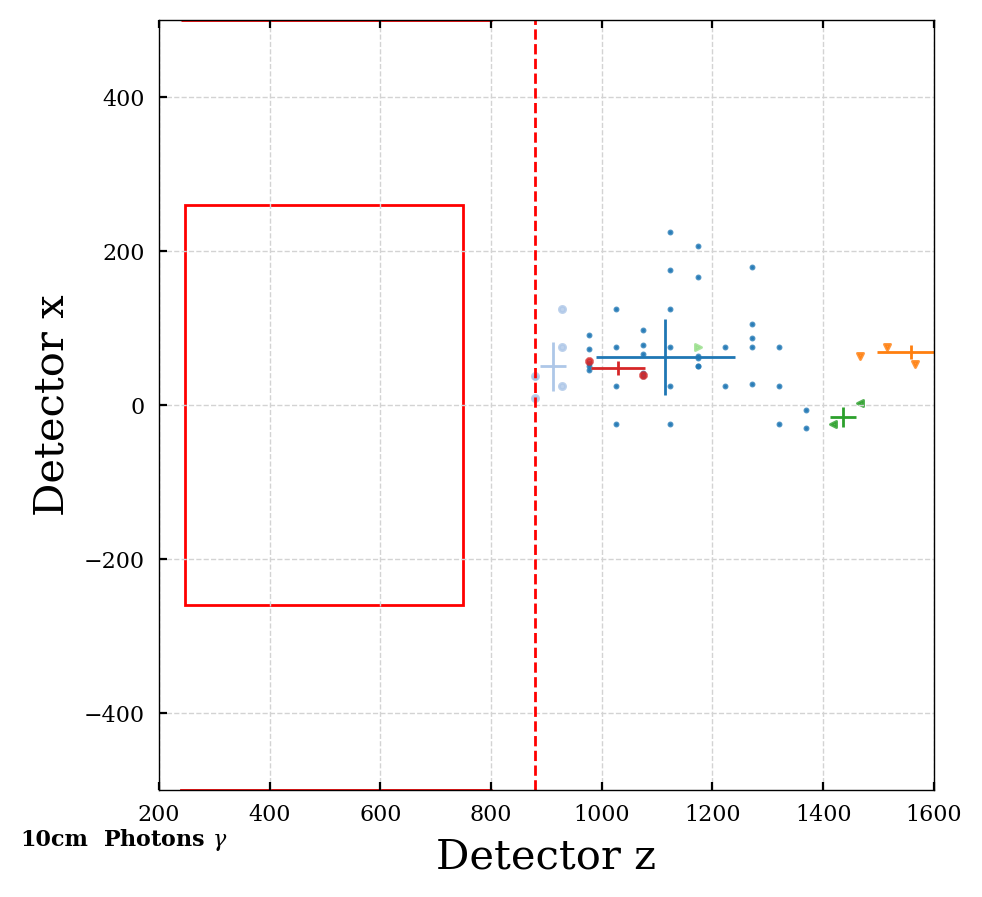

2


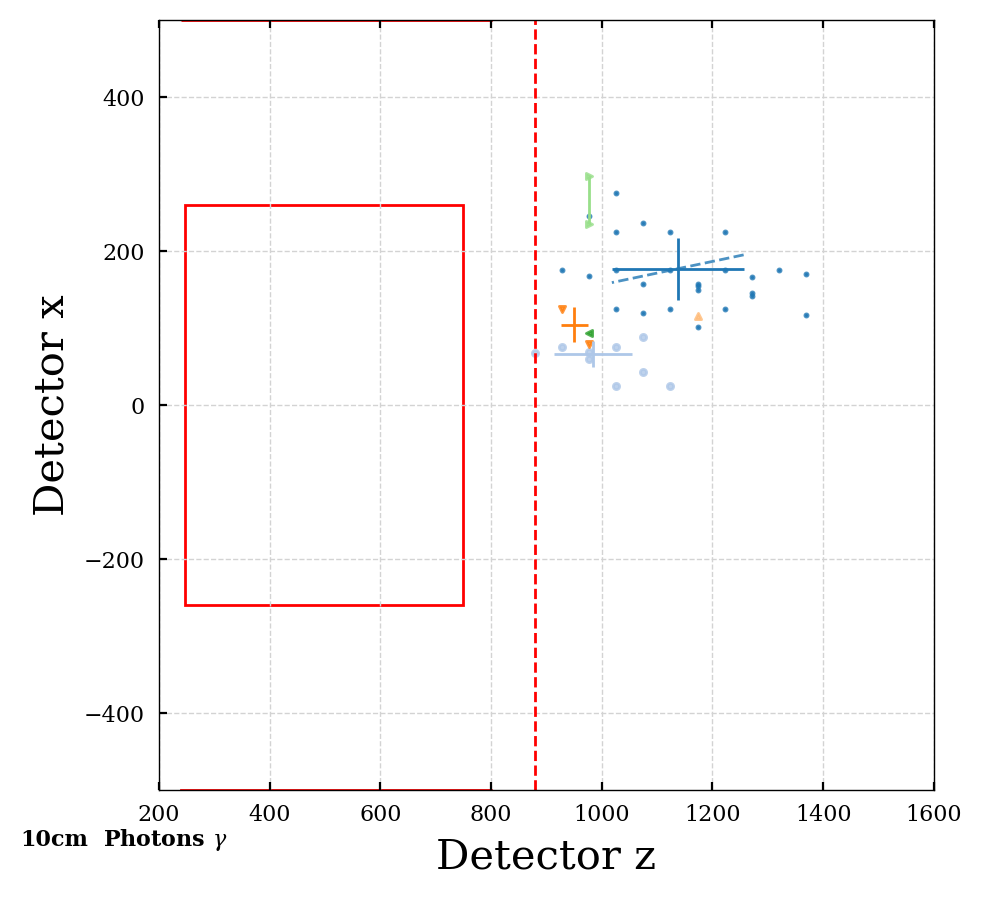

1


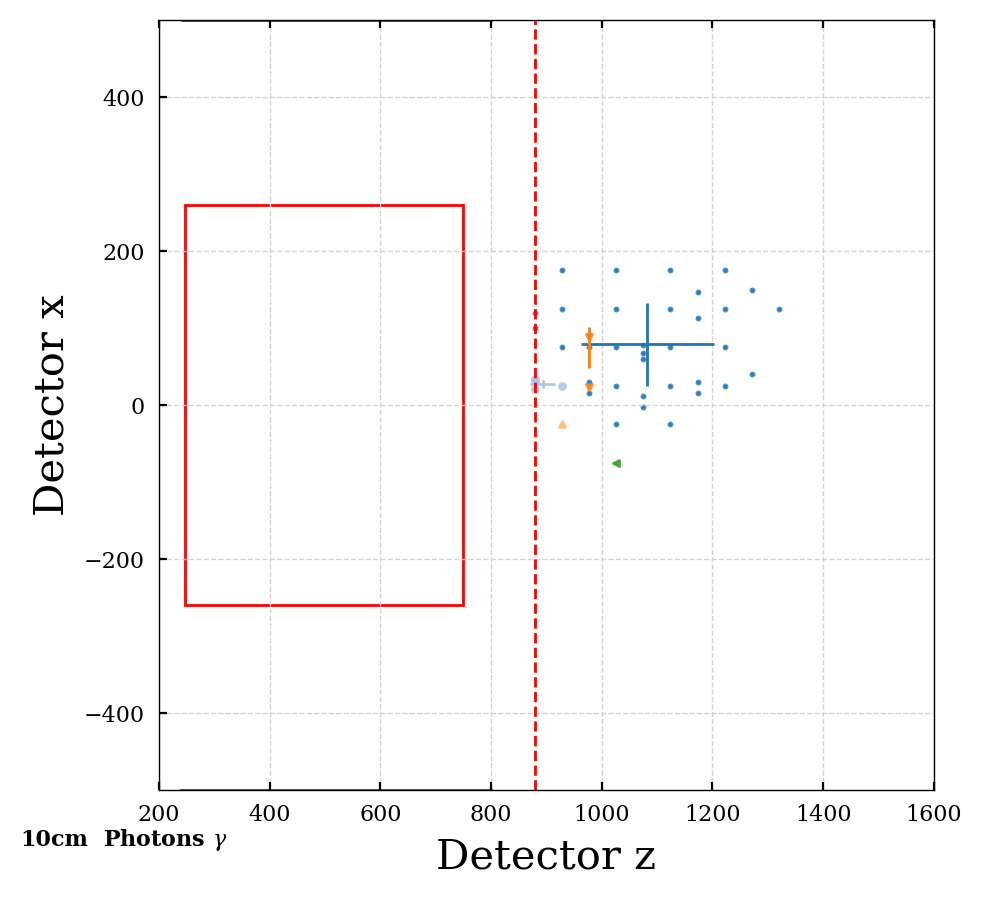

3


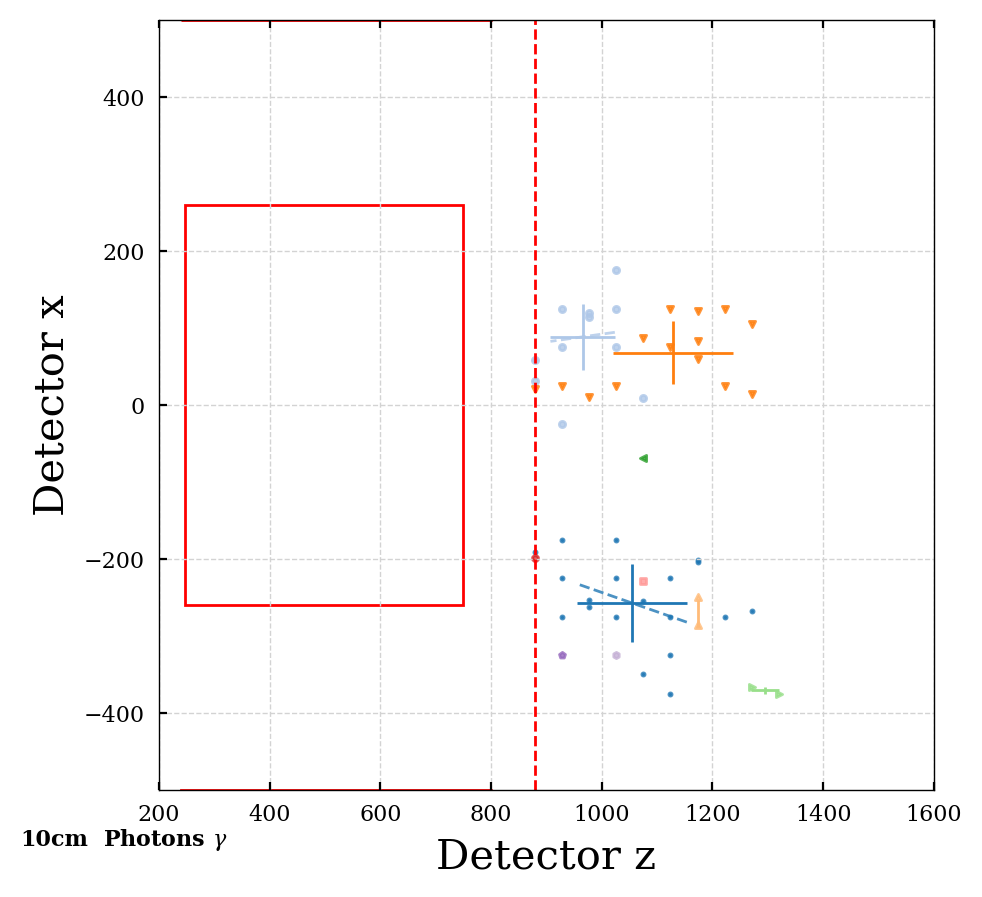

In [45]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

3


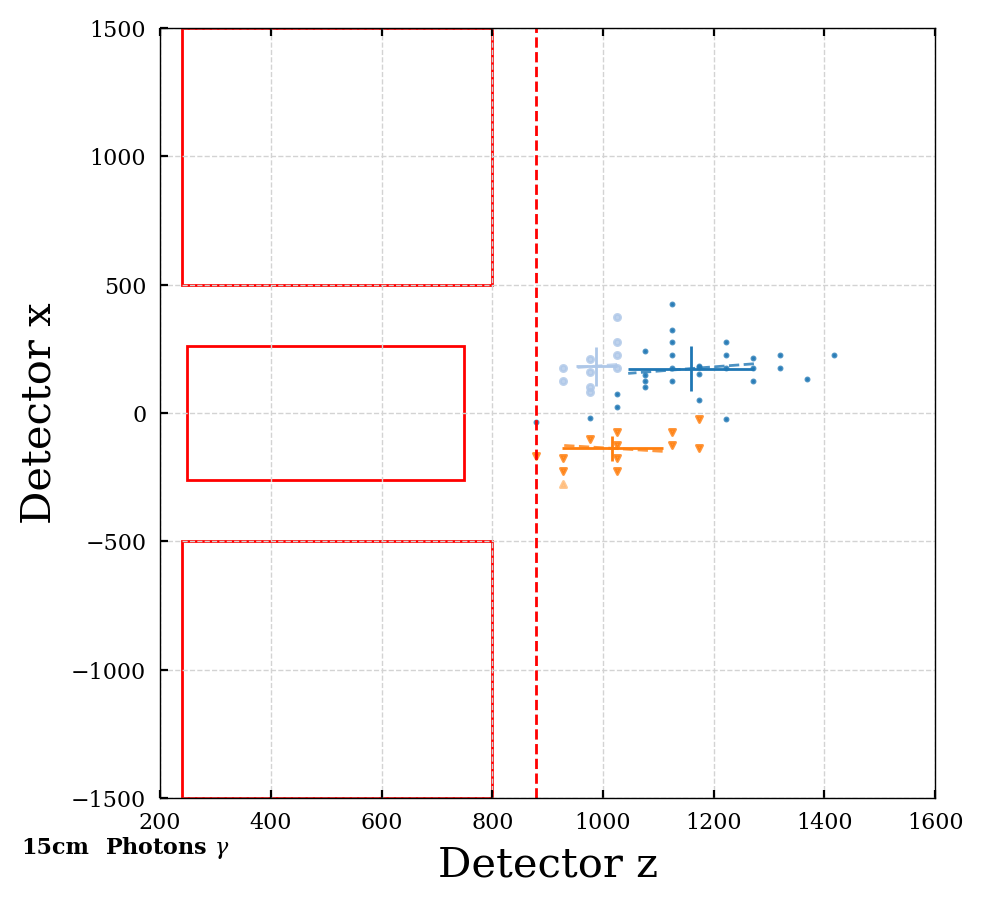

2


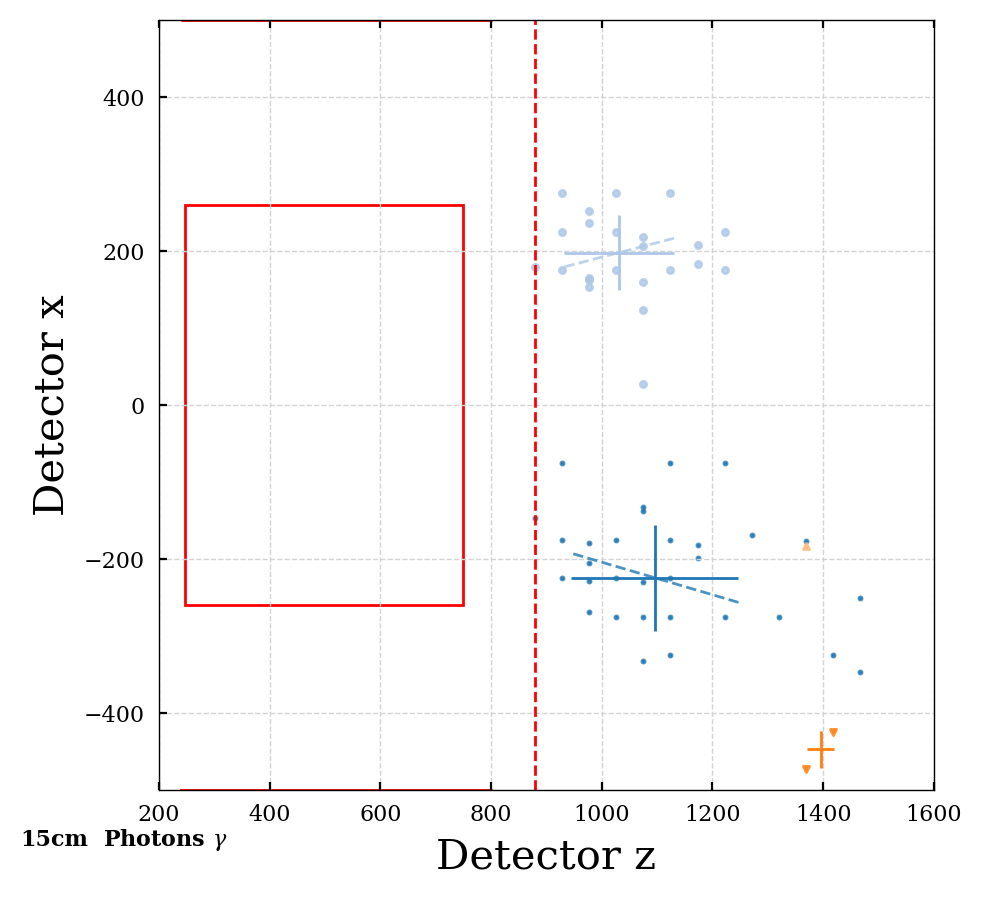

1


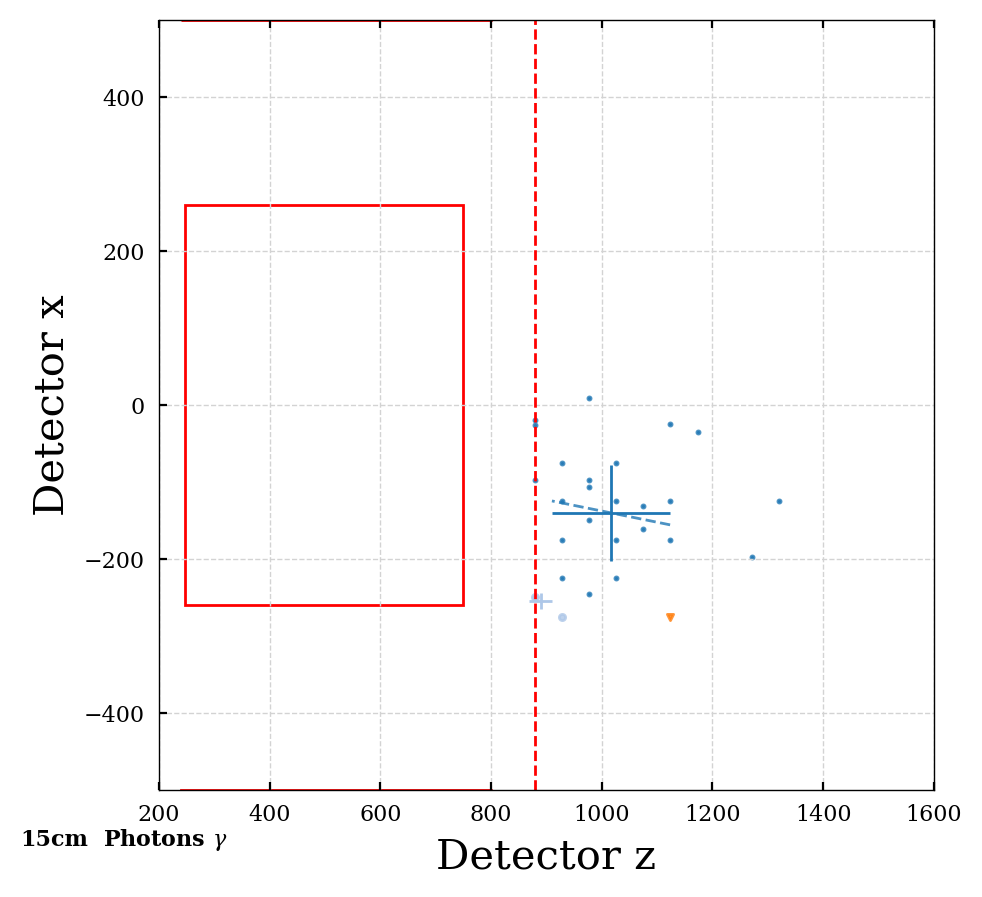

1


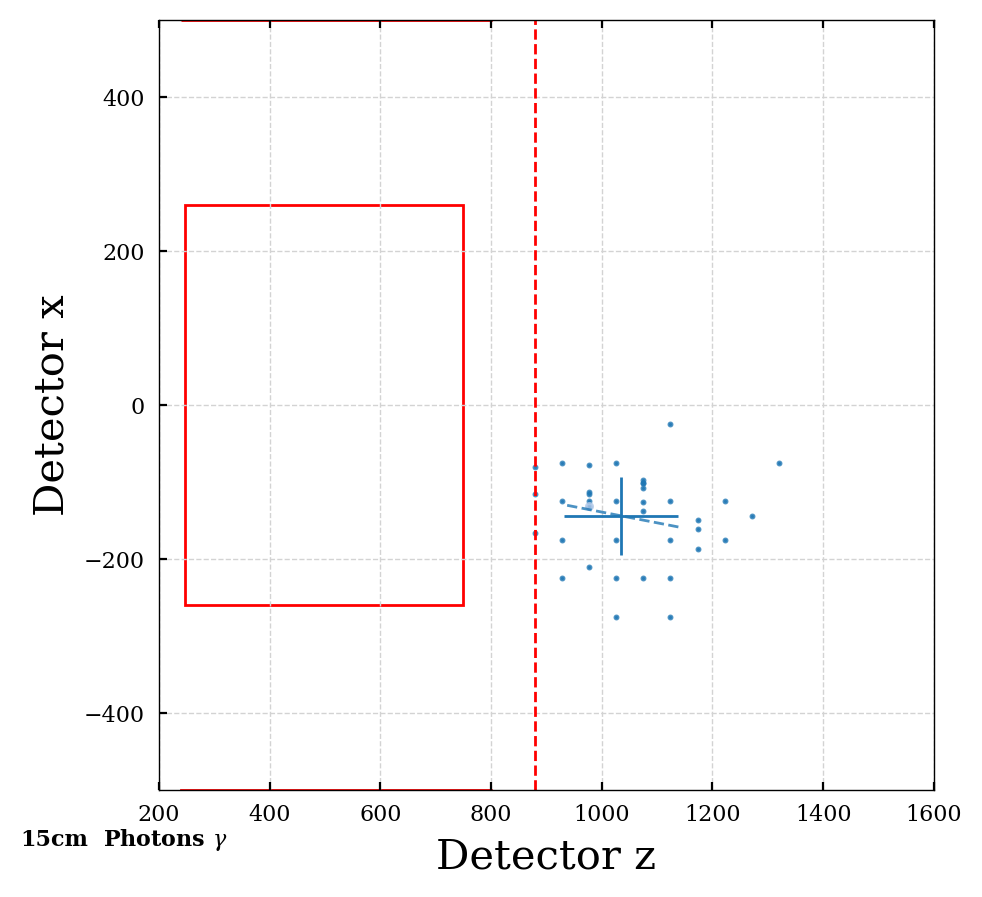

2


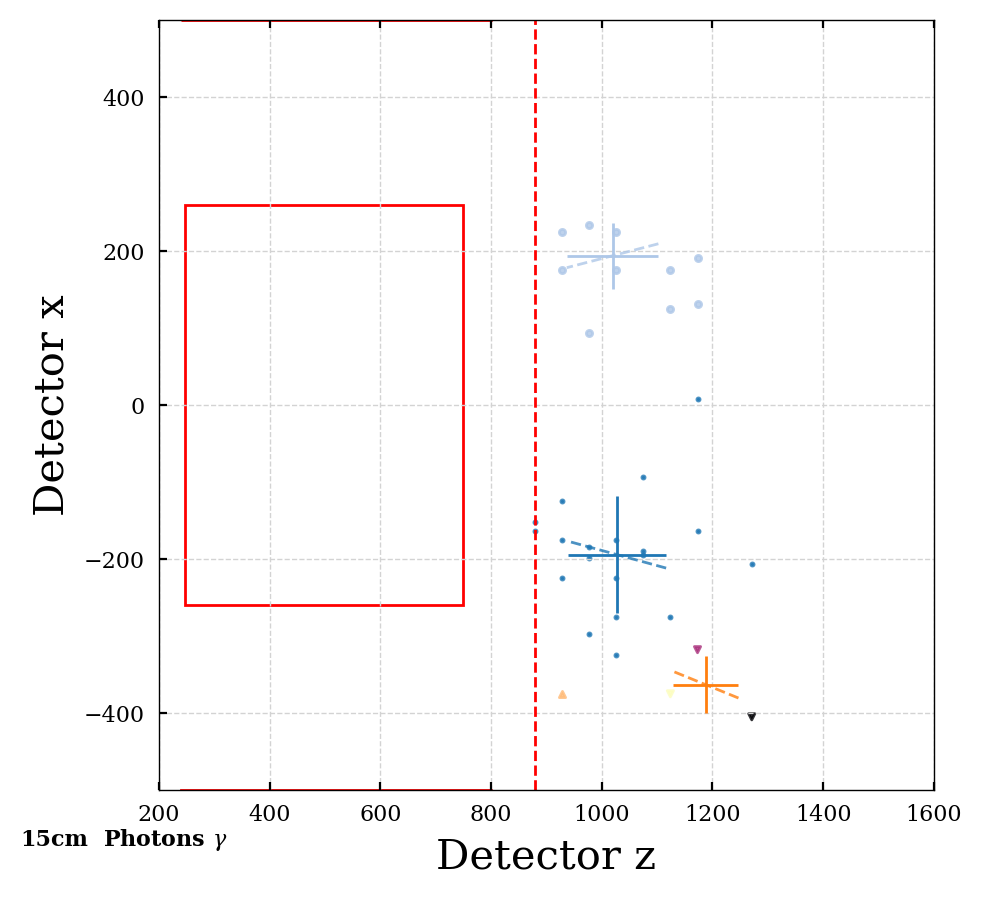

1


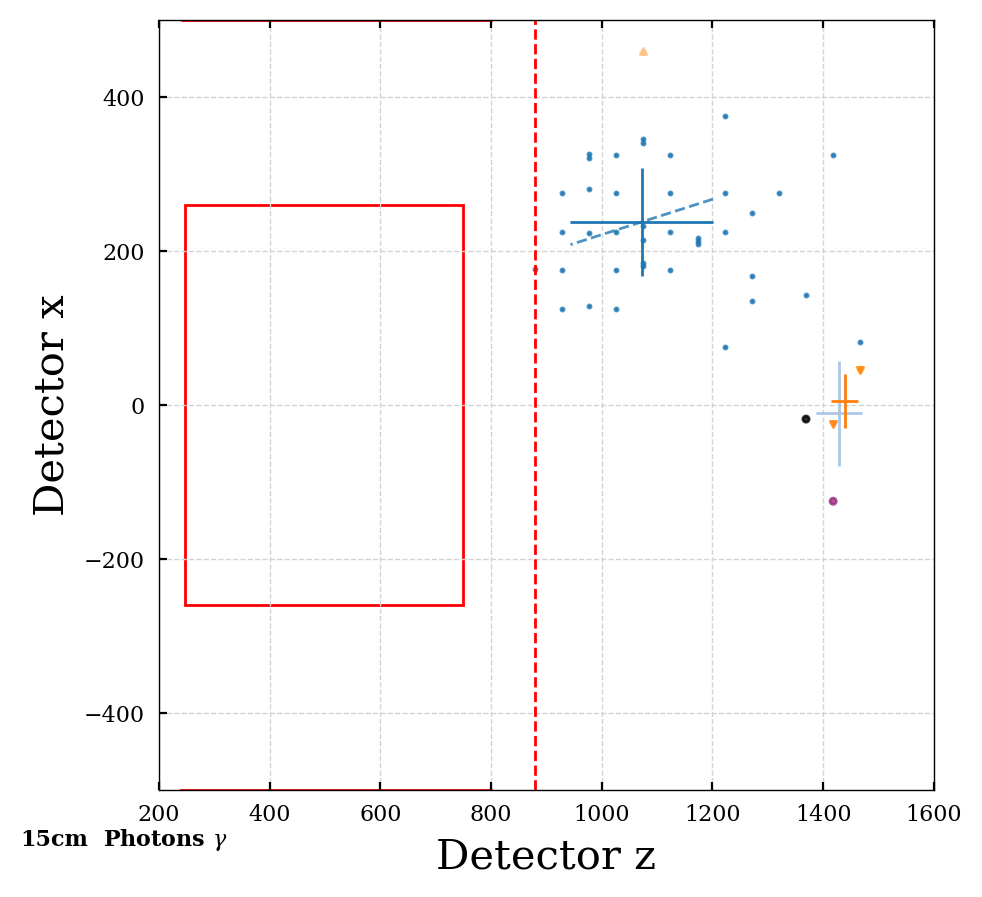

1


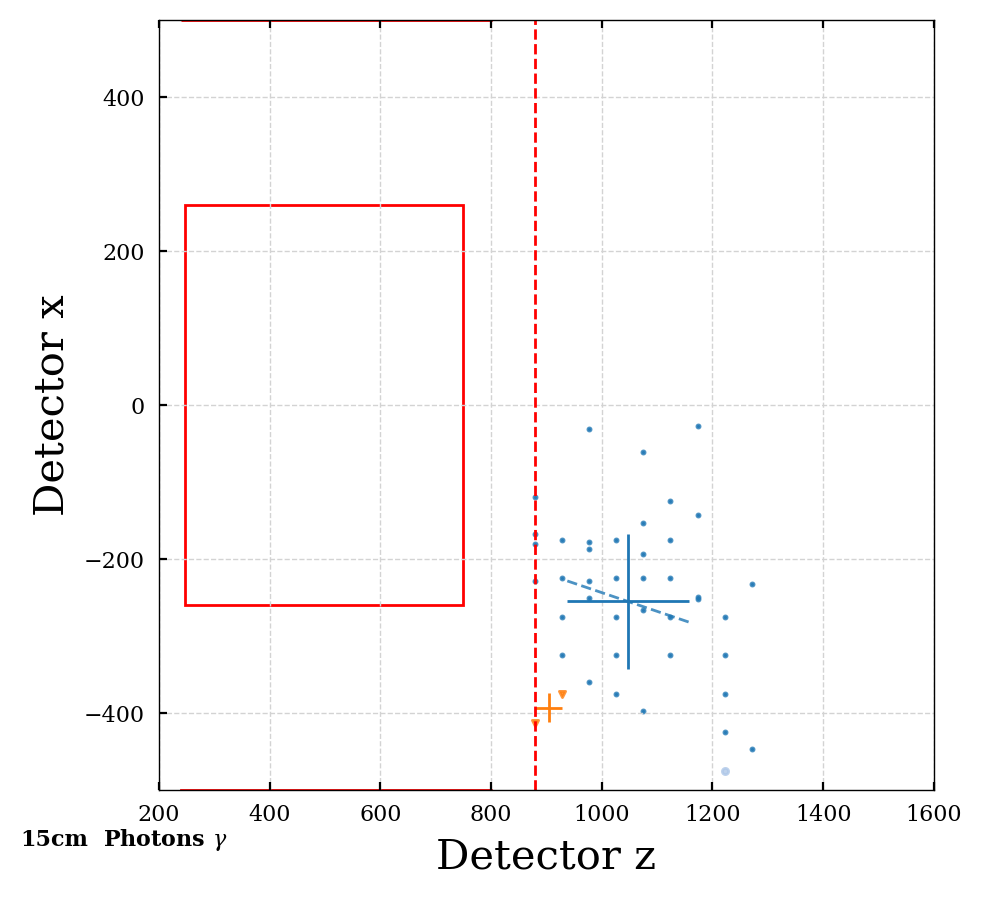

1


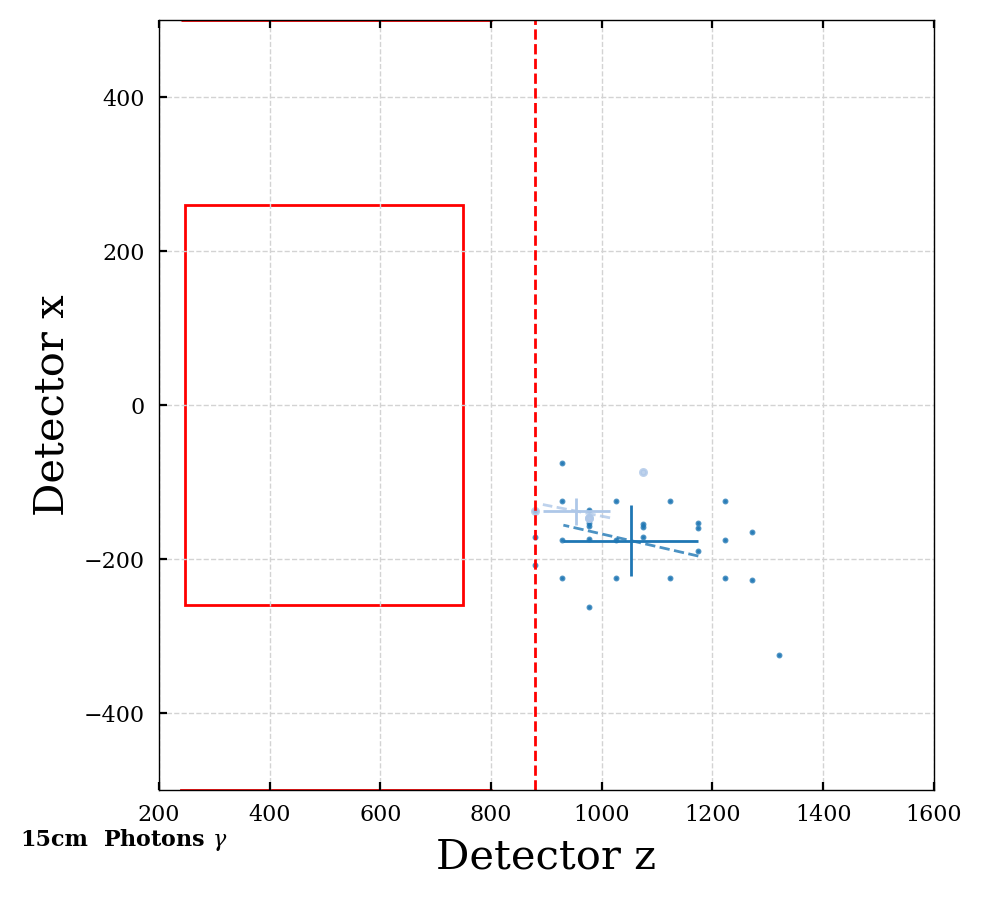

2


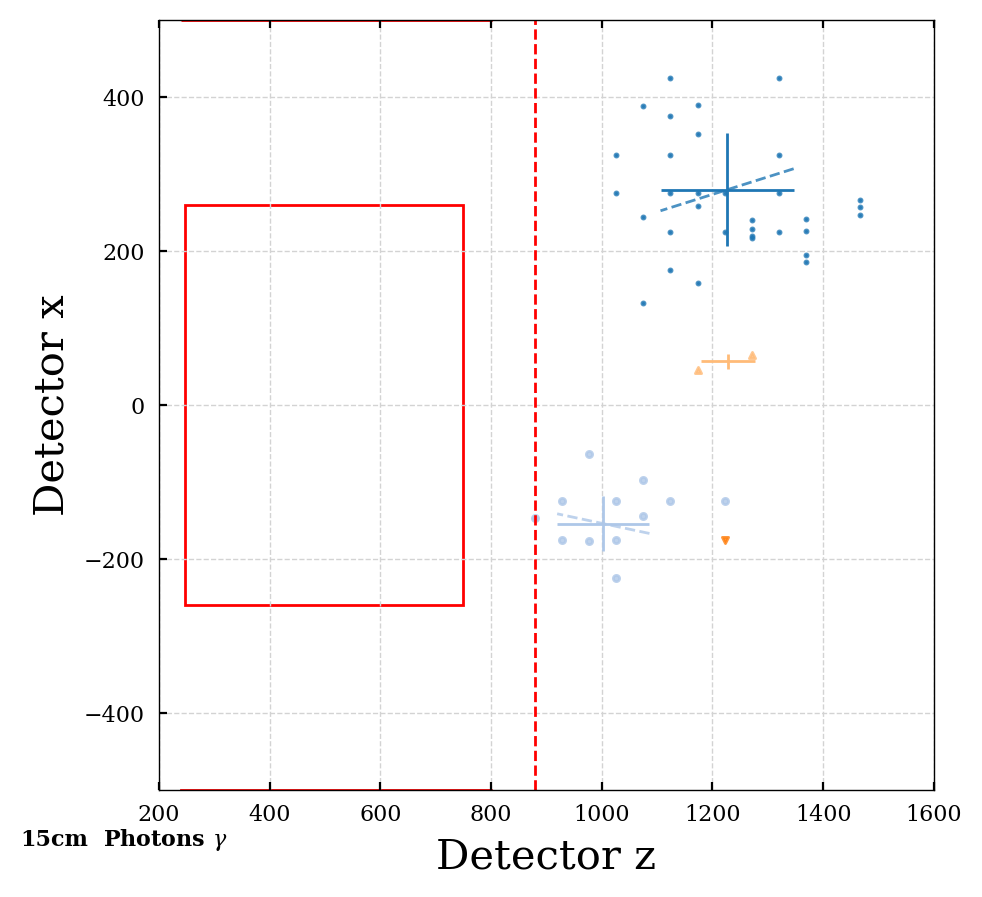

2


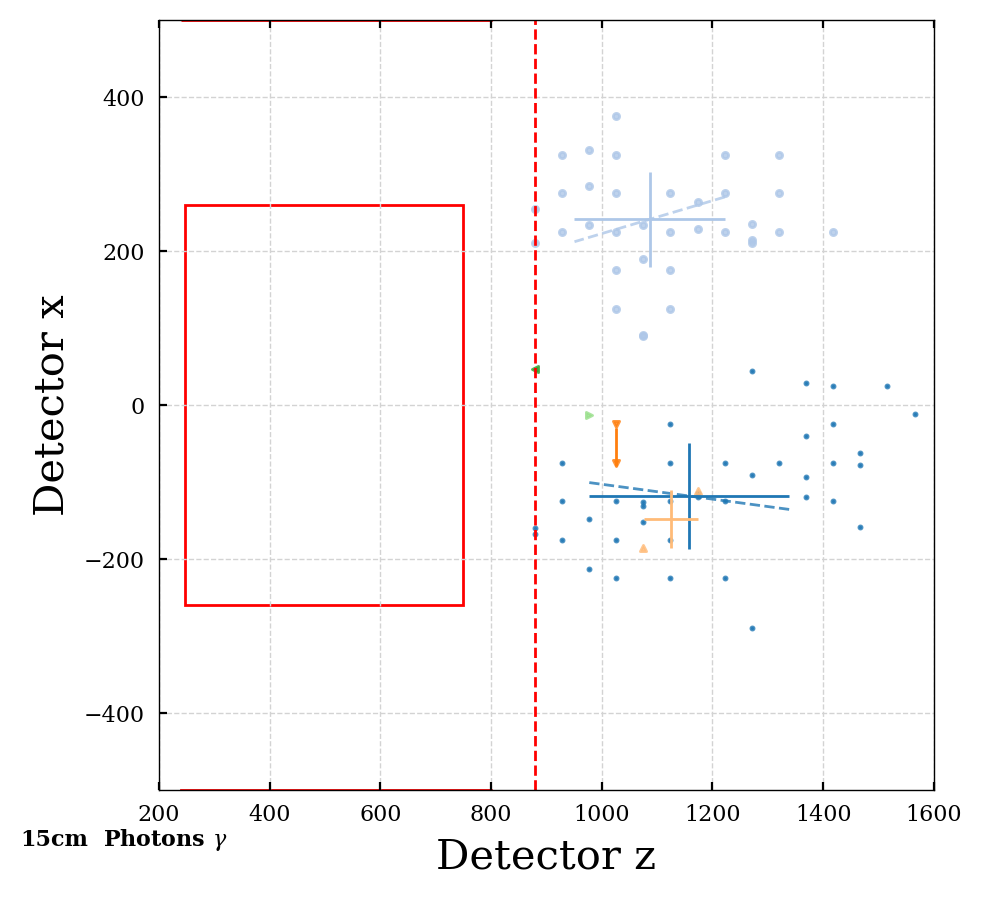

2


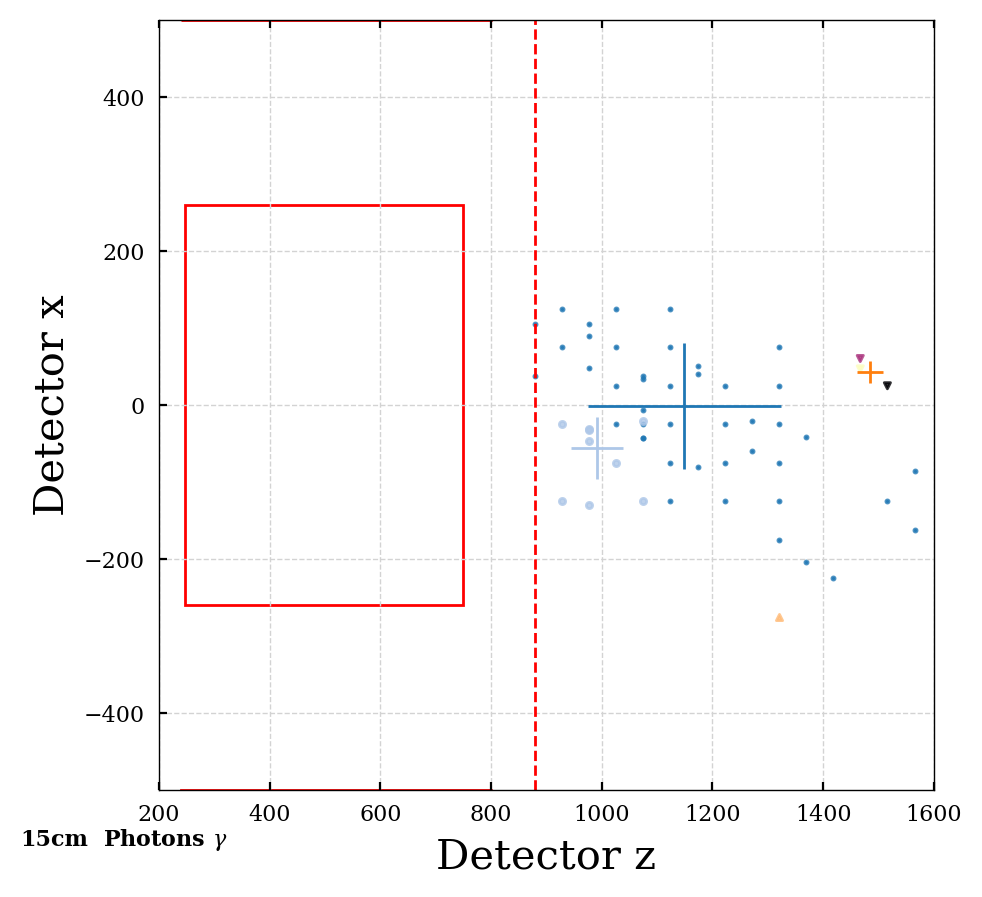

In [46]:
plot_cluster_dist(particles_dict_15cm, 15, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_15cm, 15, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

3


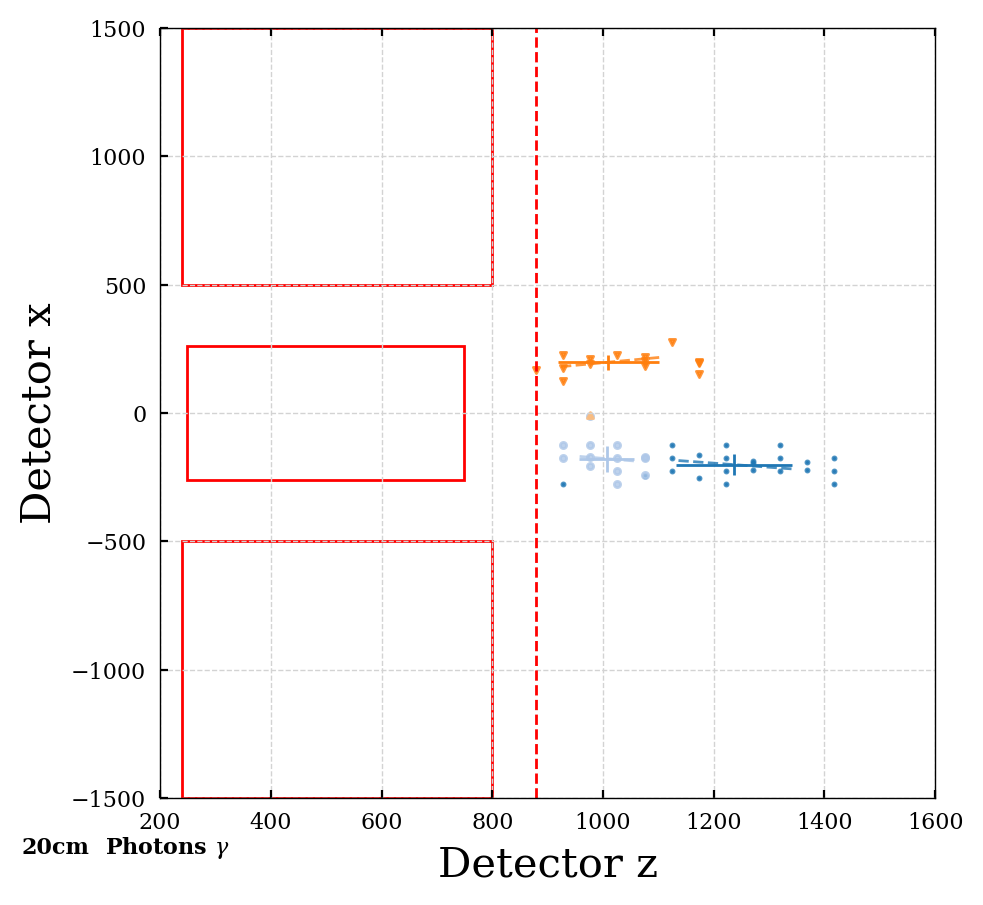

1


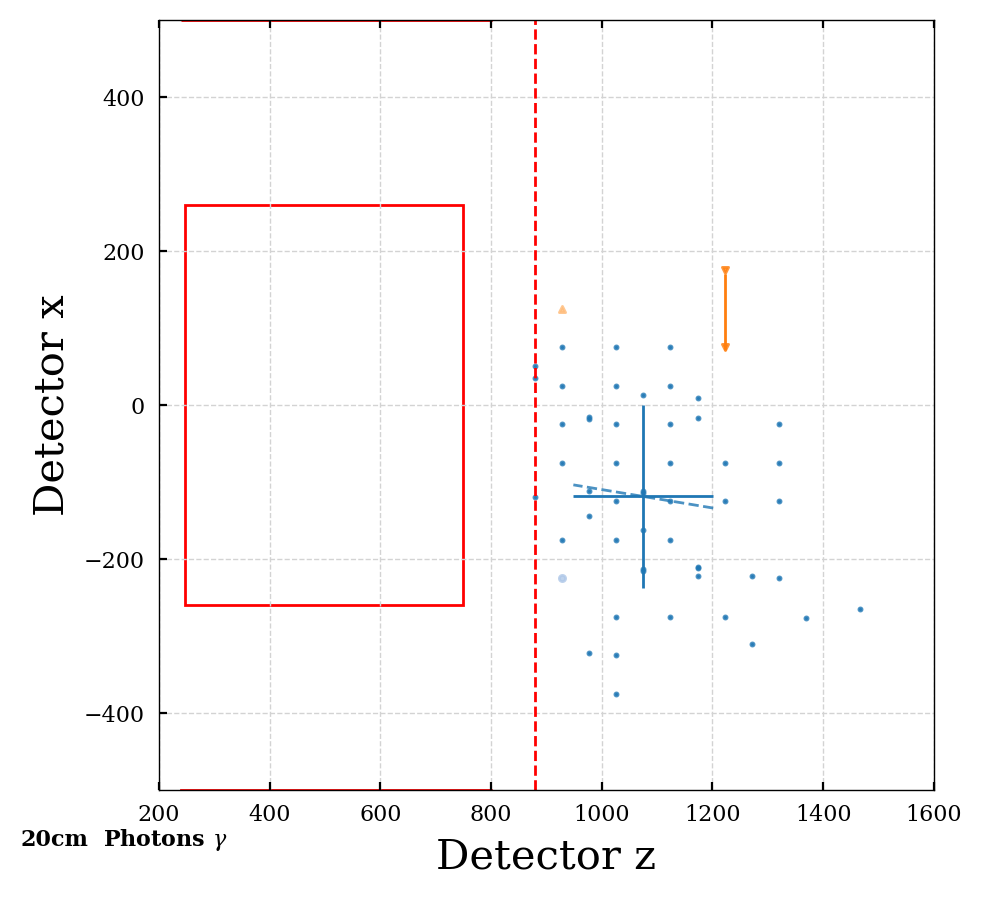

2


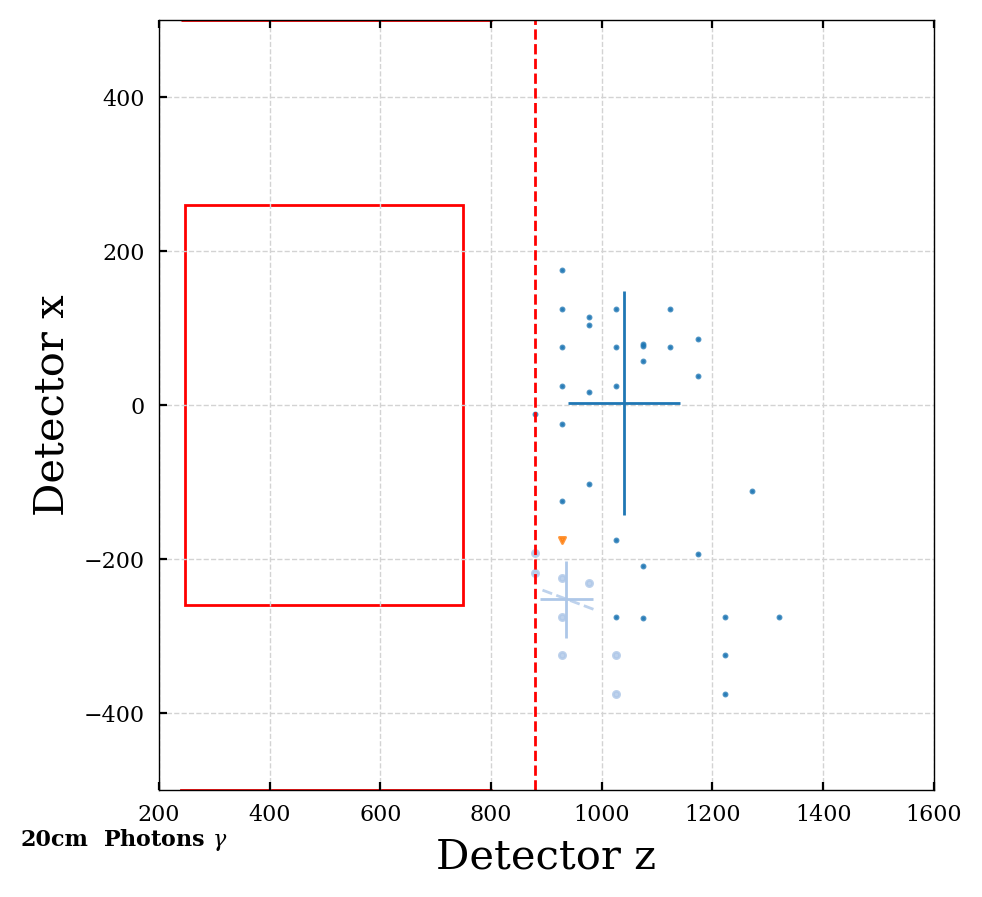

1


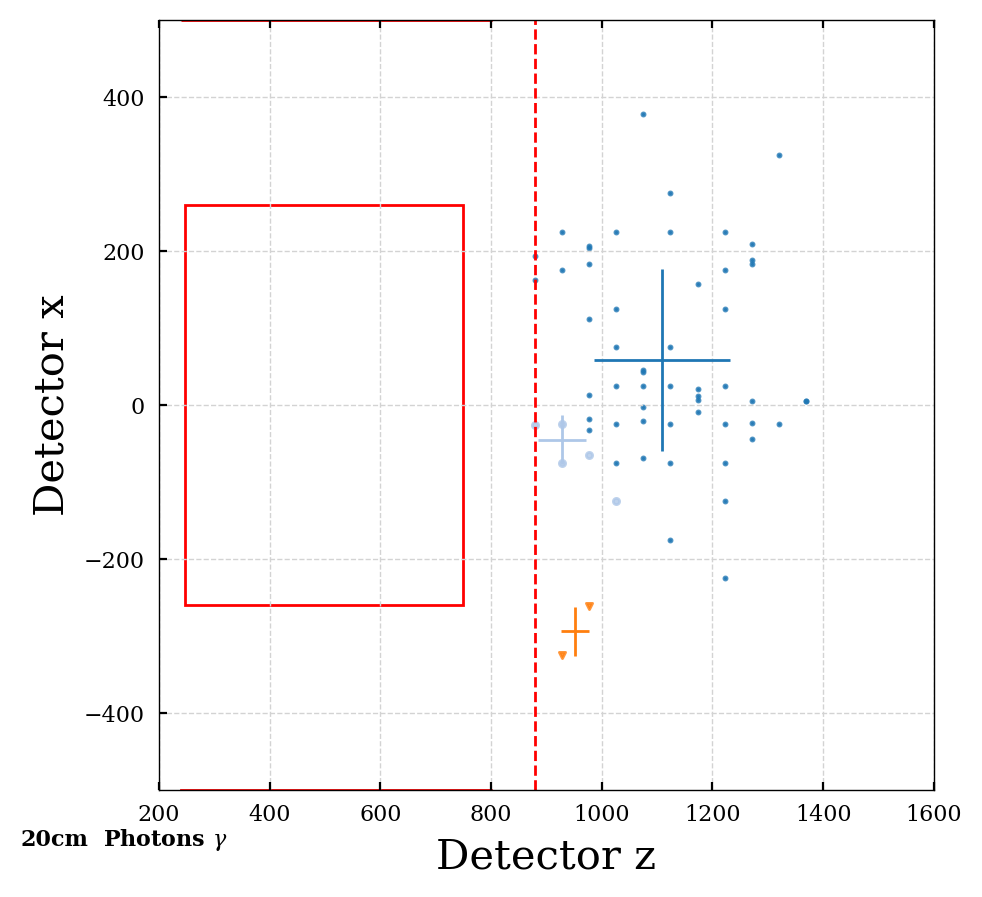

1


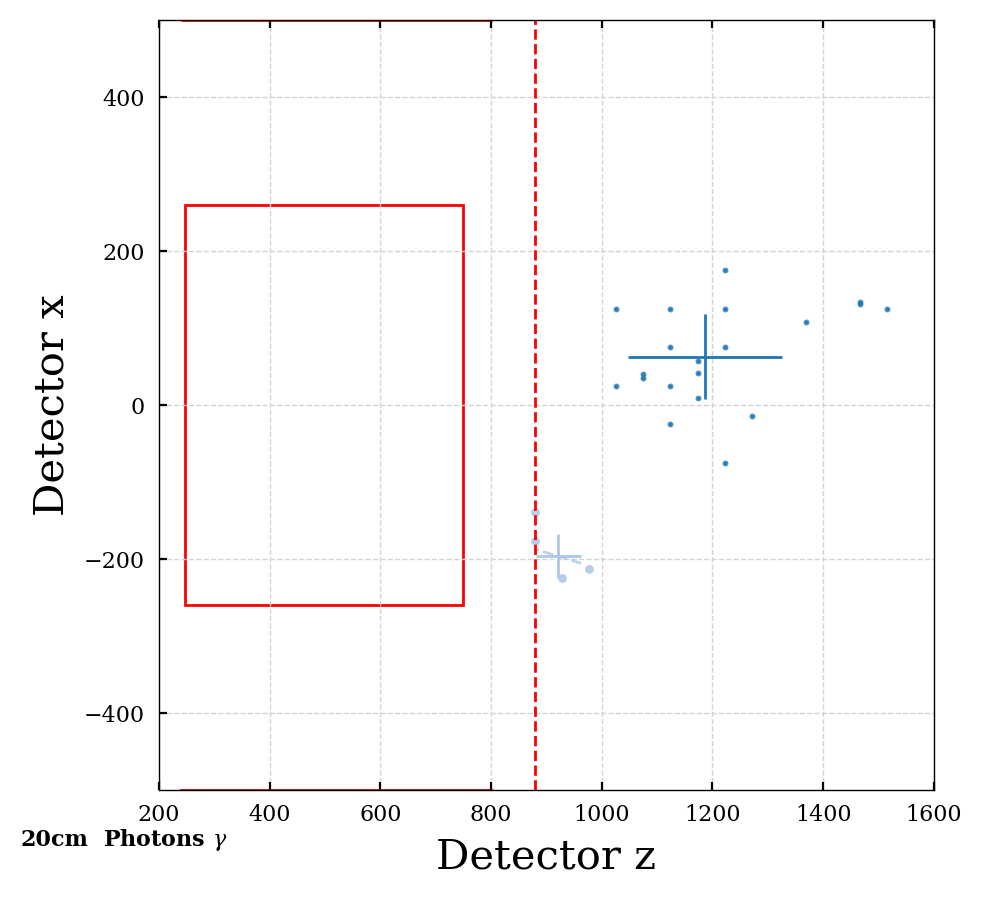

2


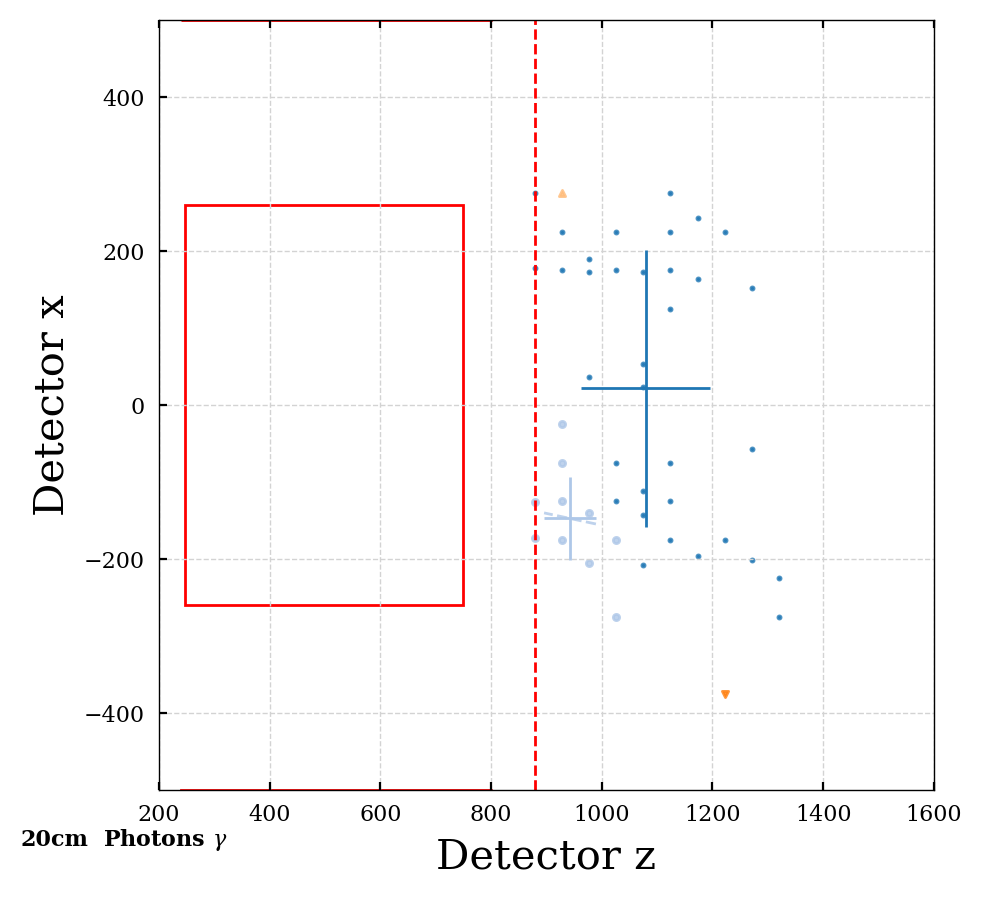

1


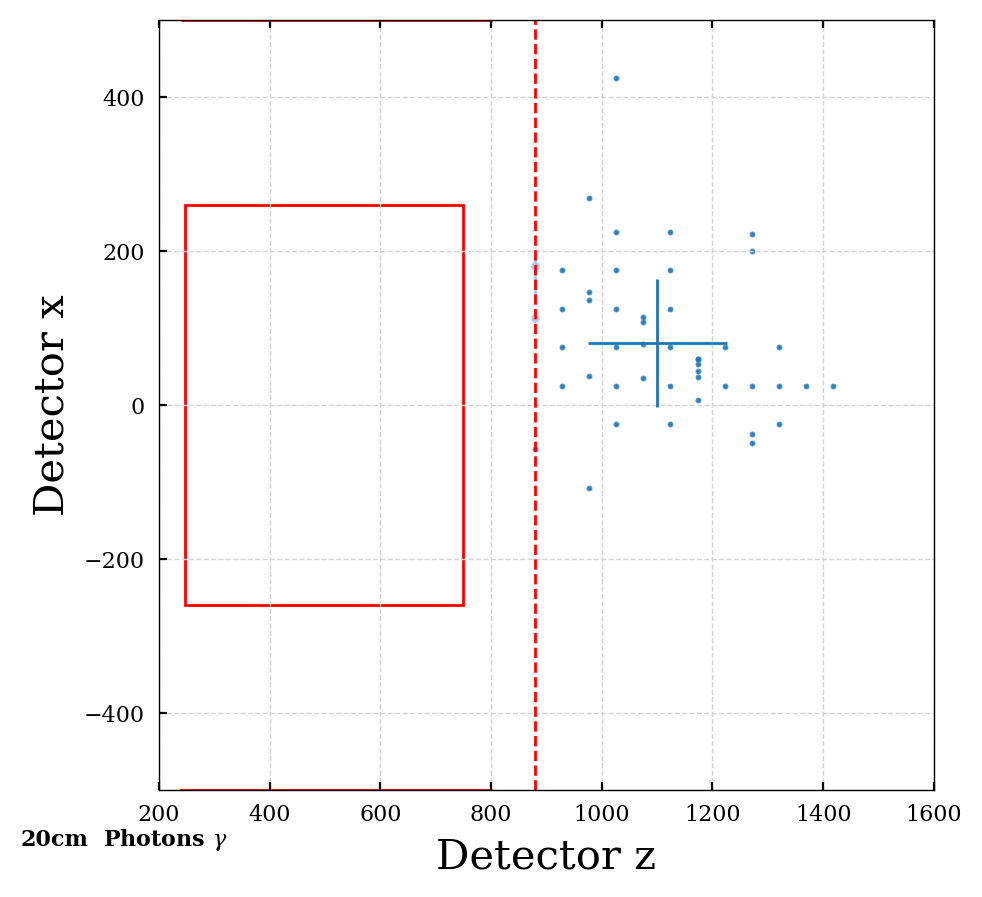

1


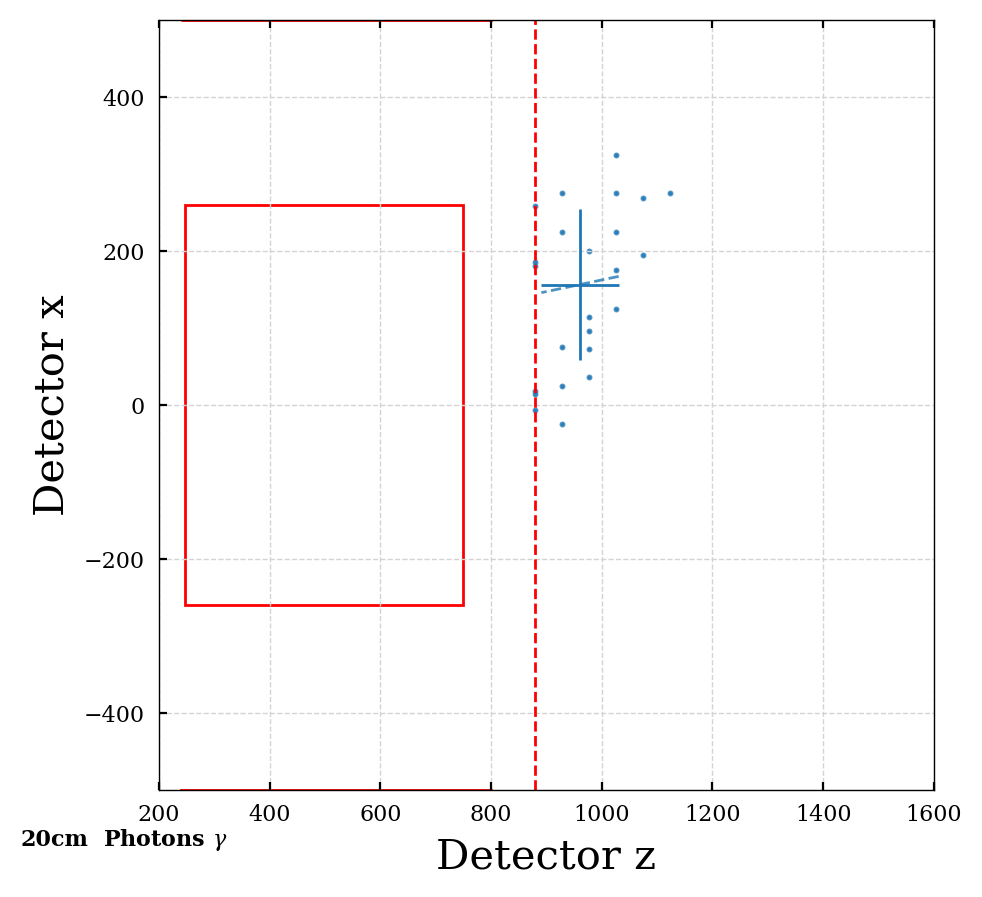

1


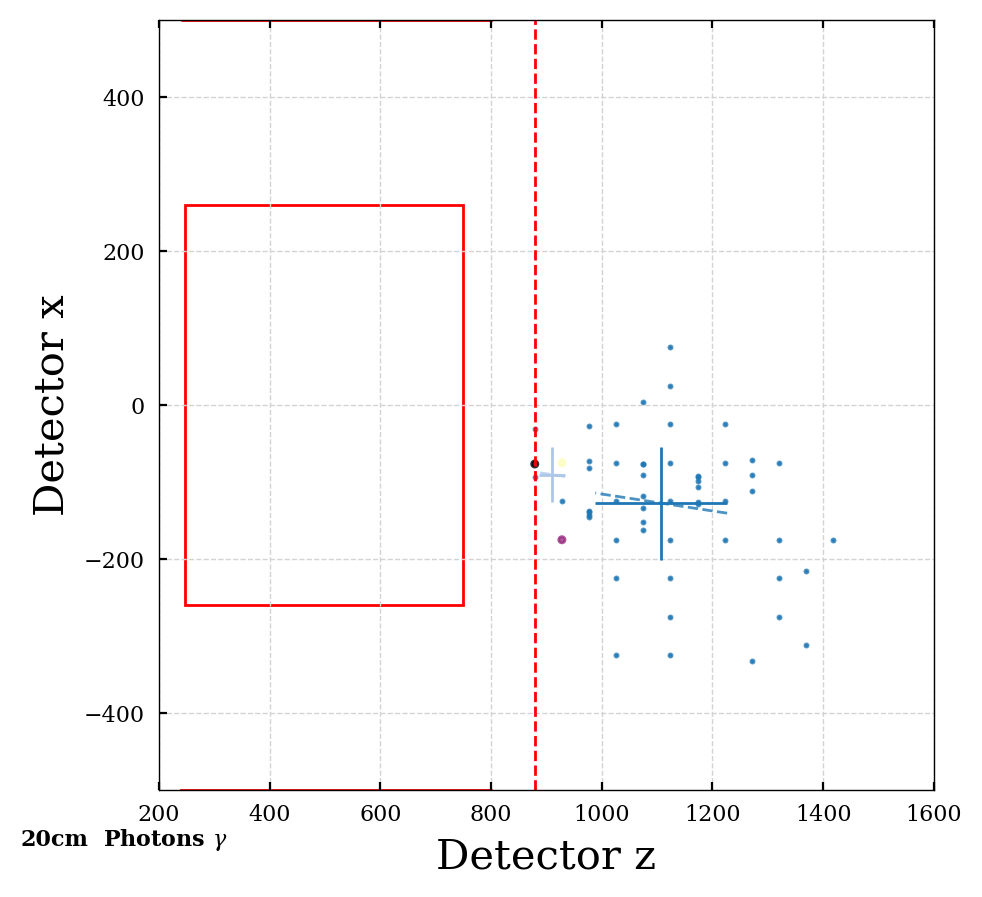

1


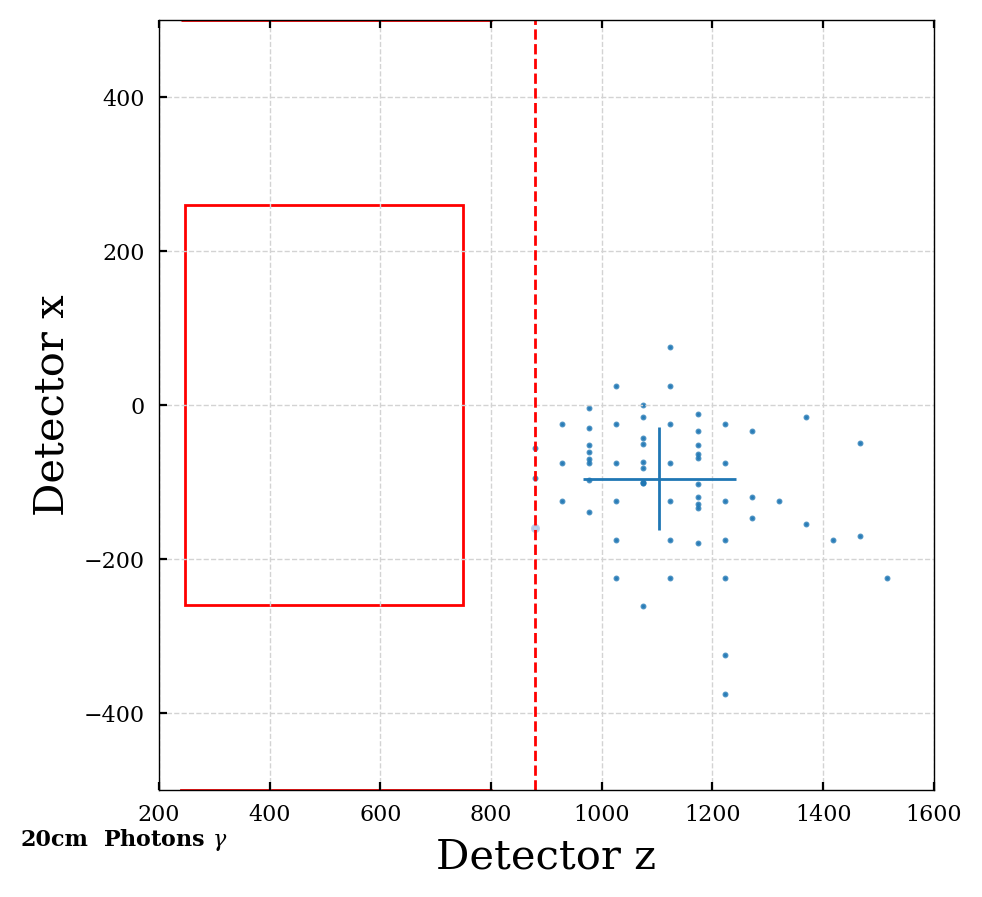

1


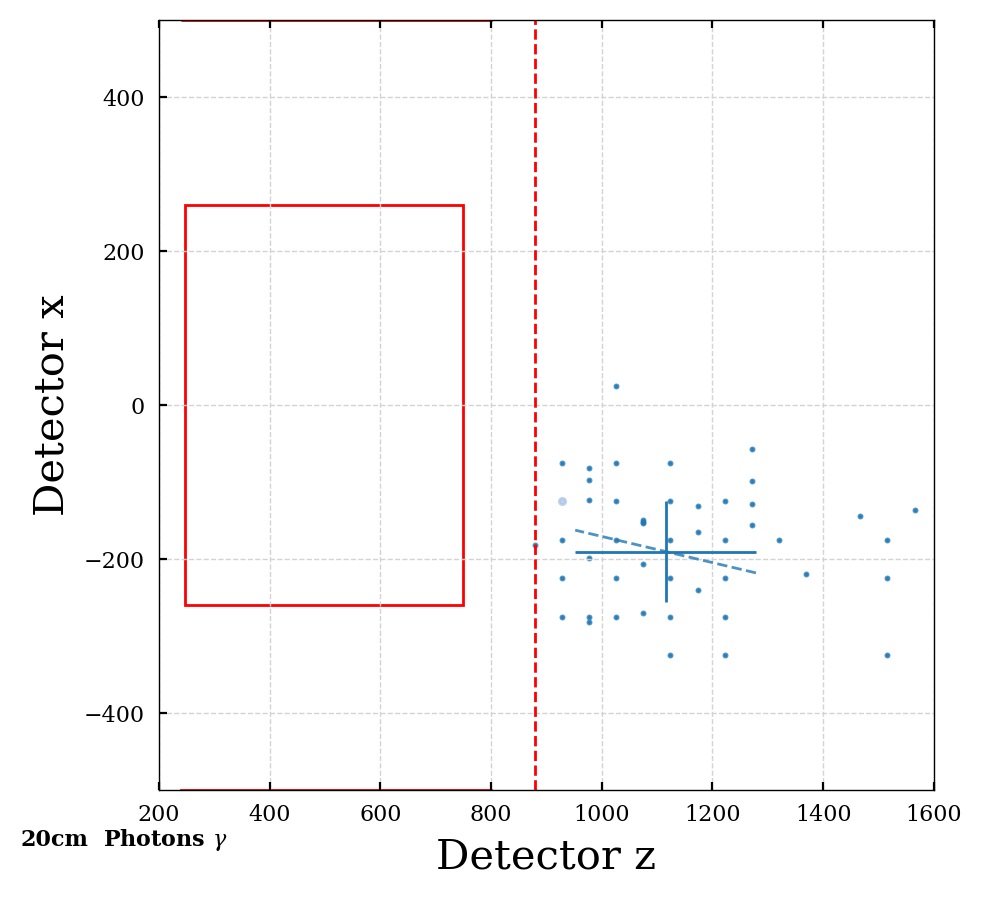

In [47]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

2


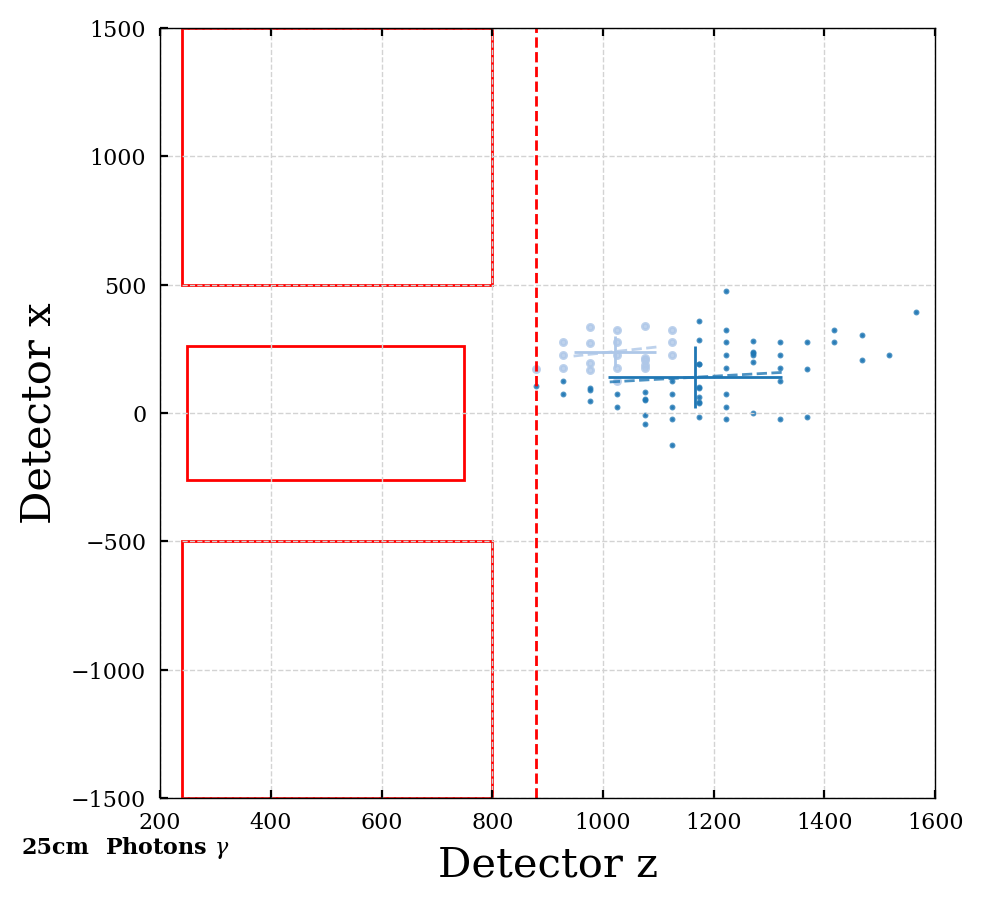

1


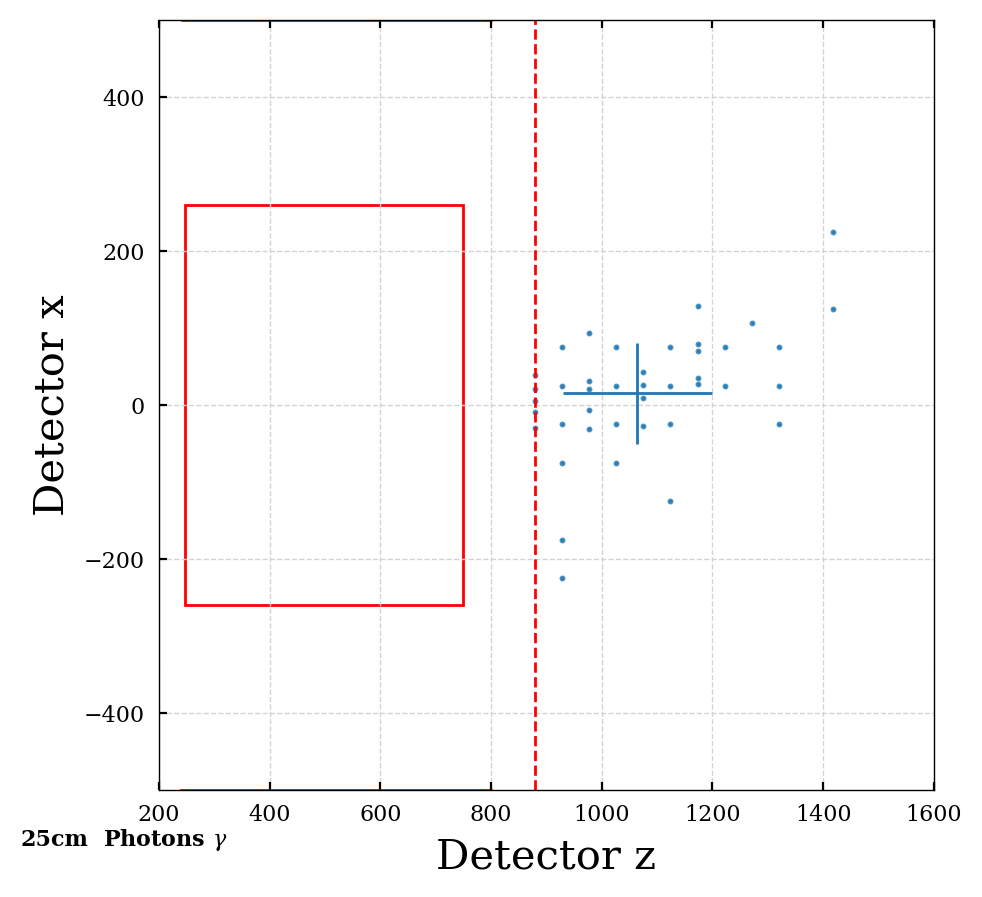

1


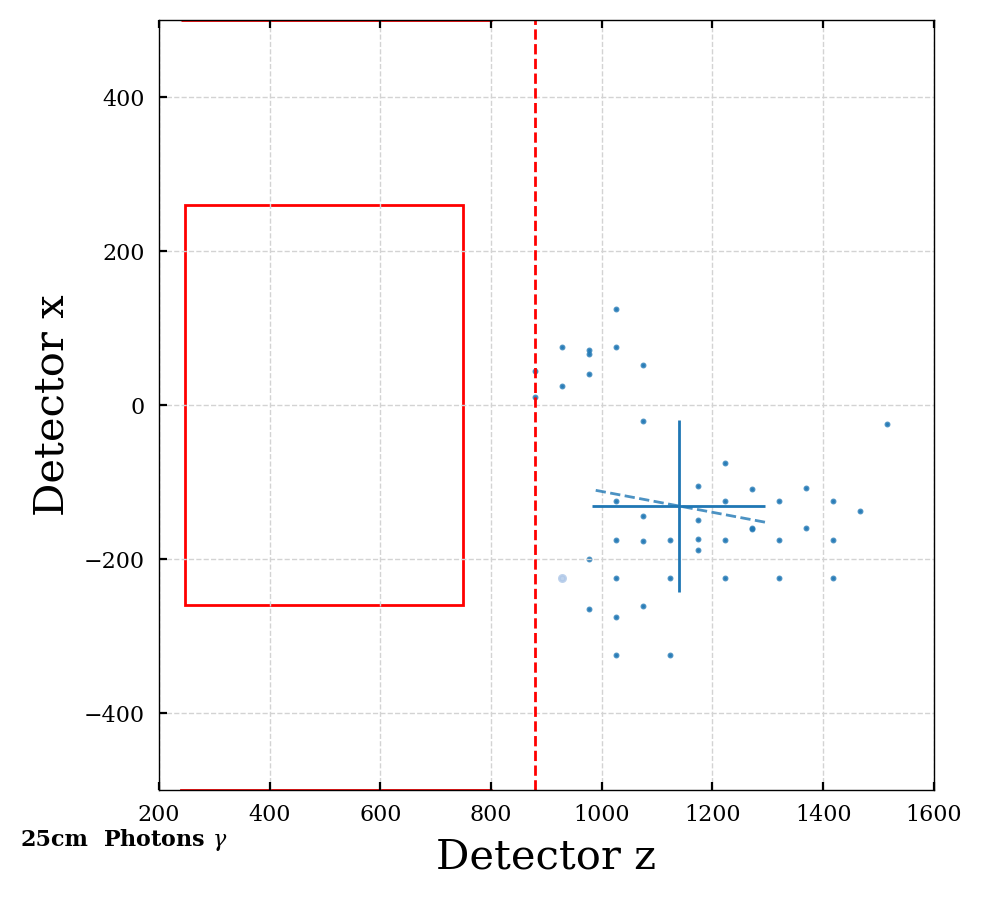

1


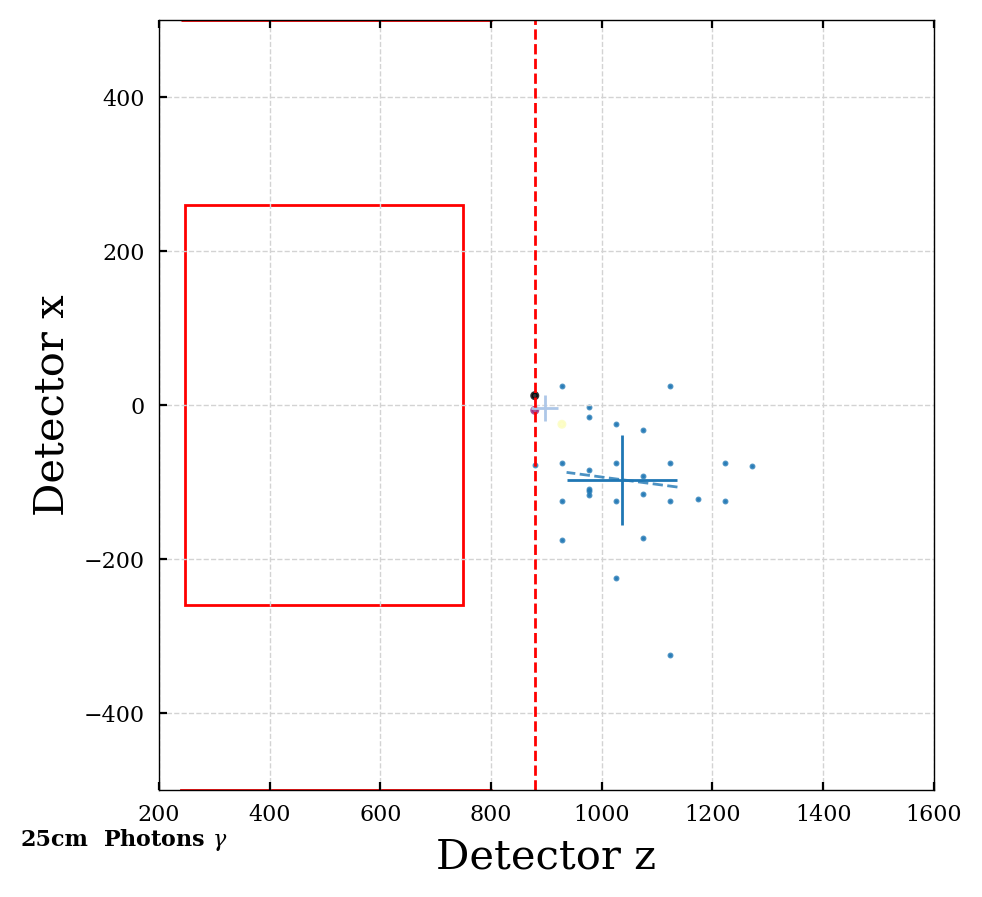

1


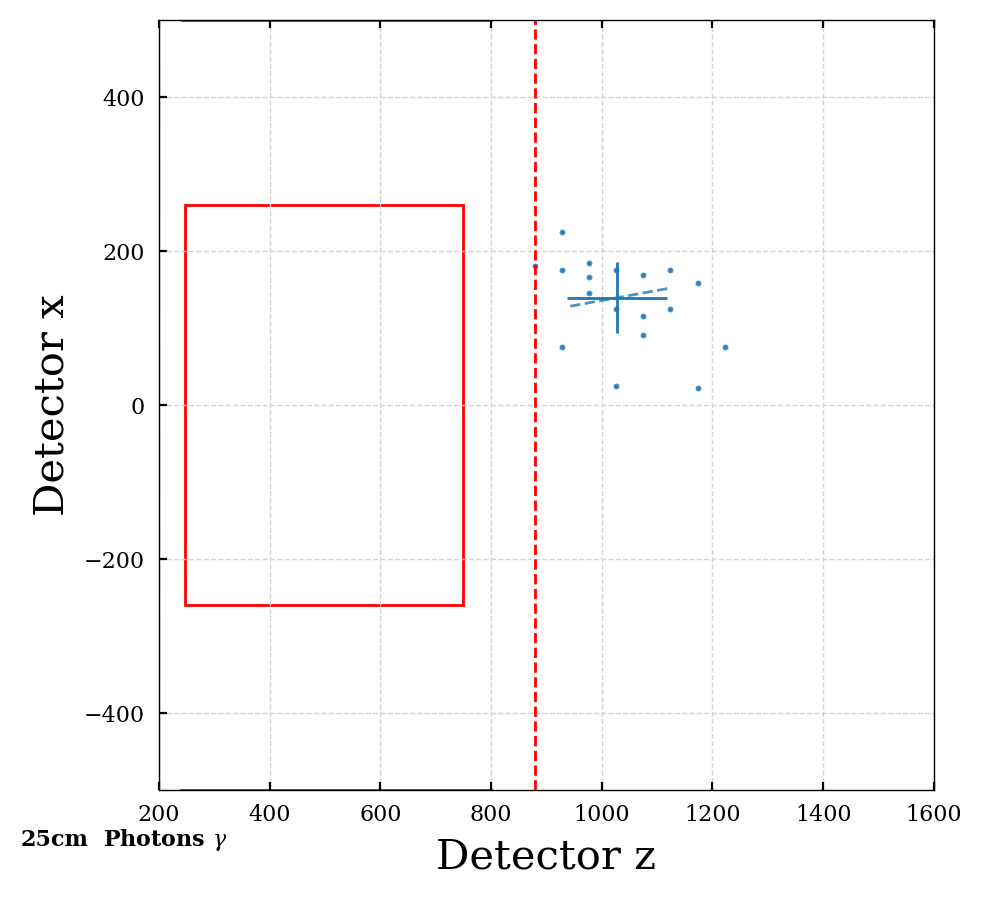

1


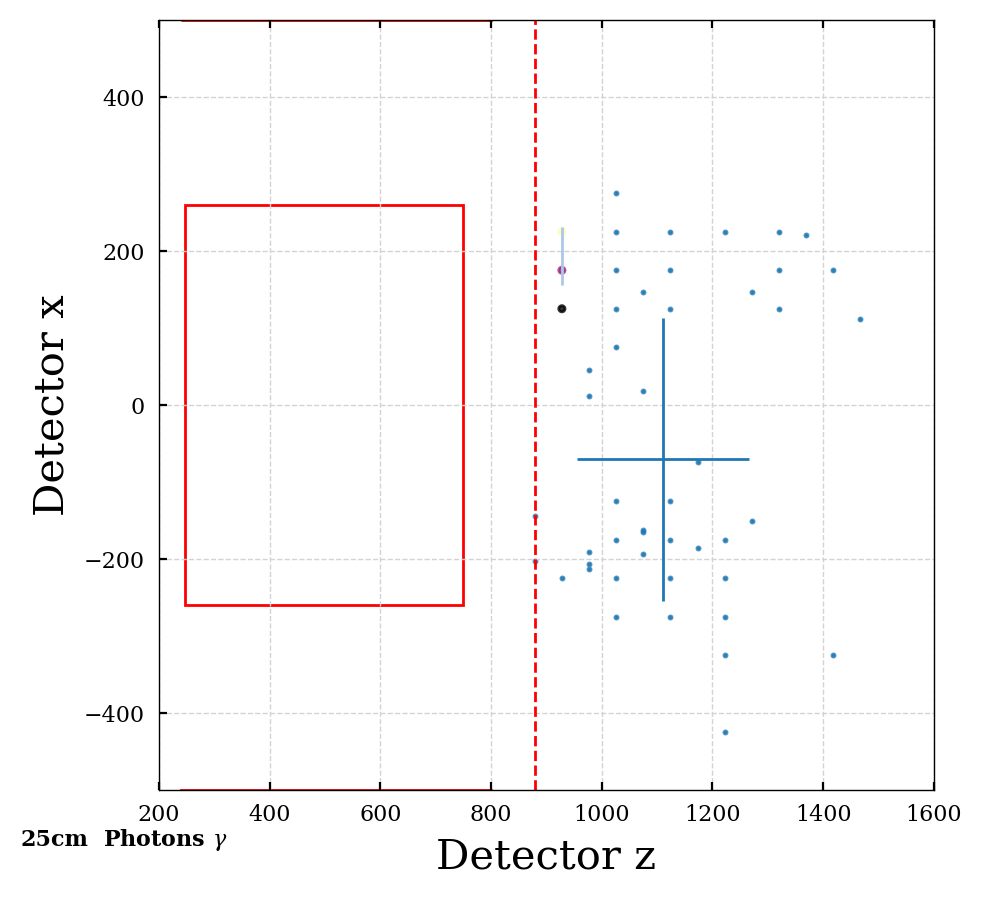

1


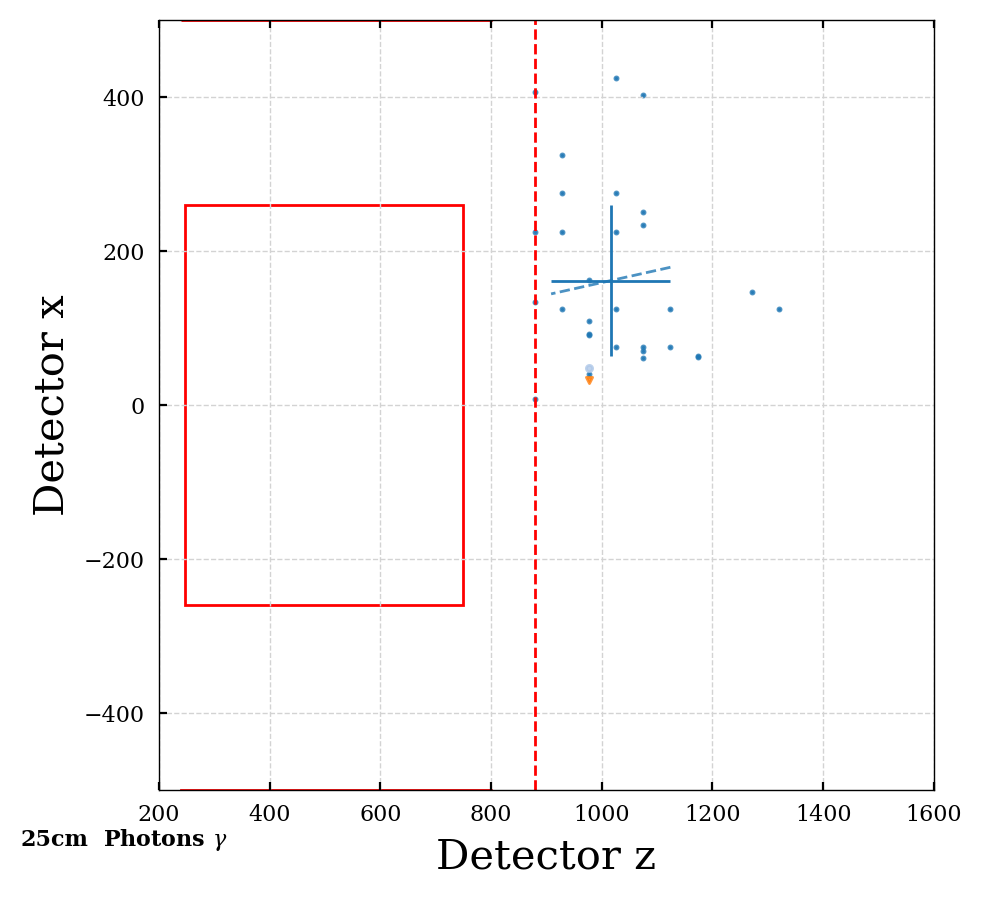

1


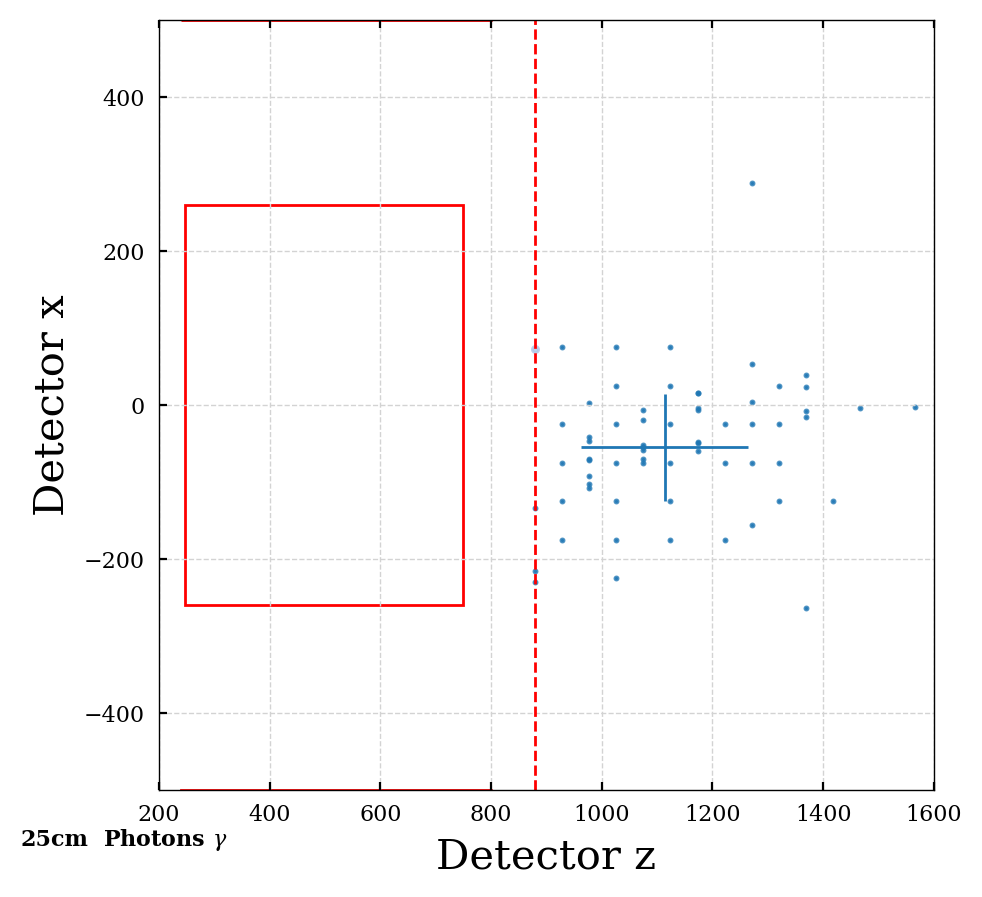

1


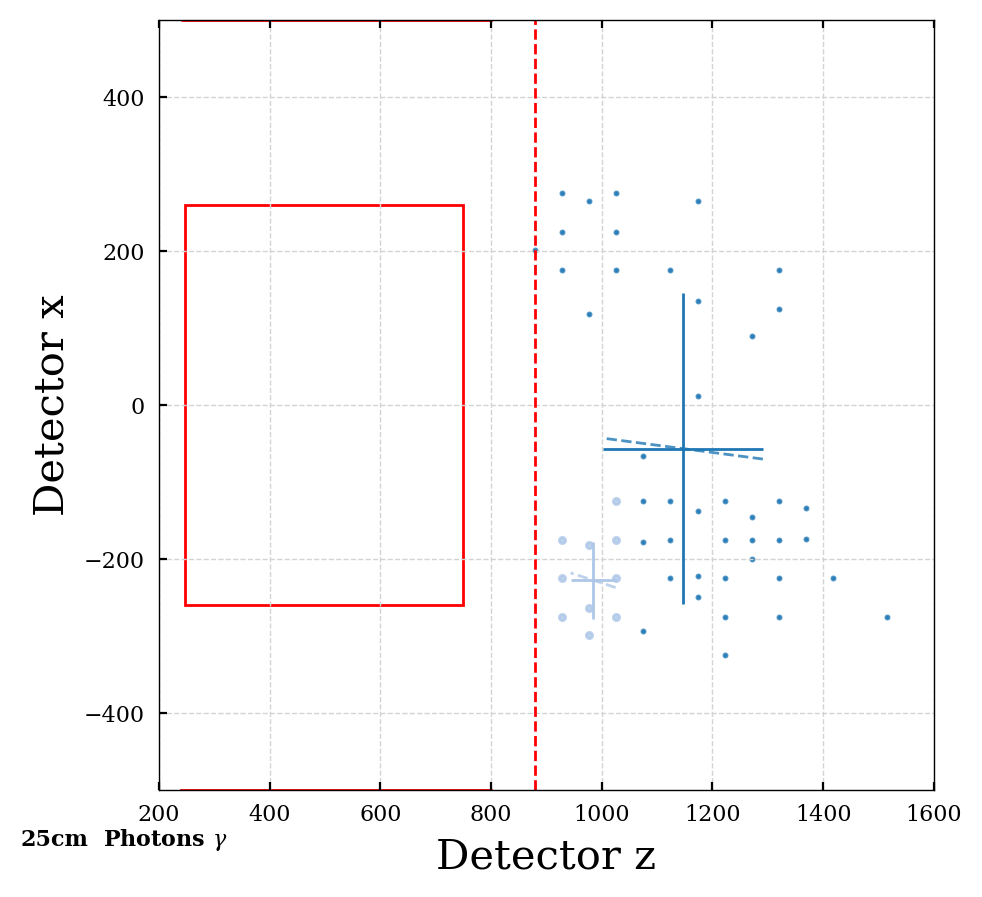

1


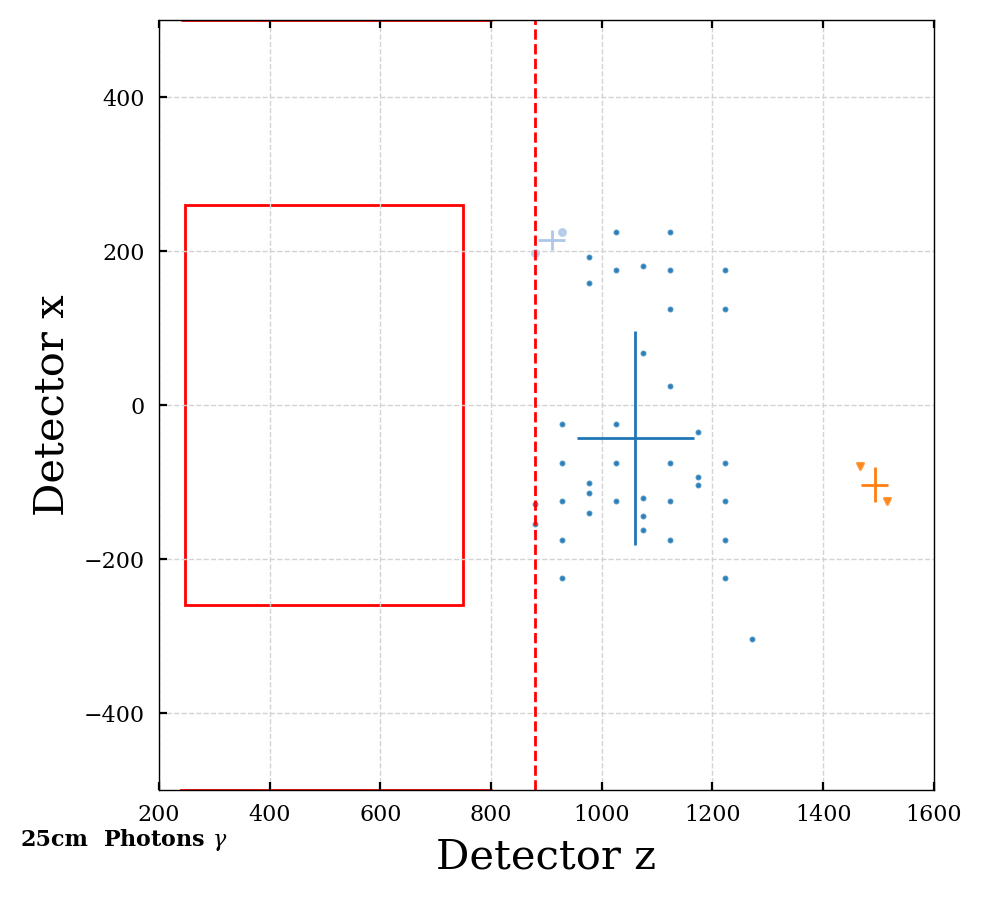

1


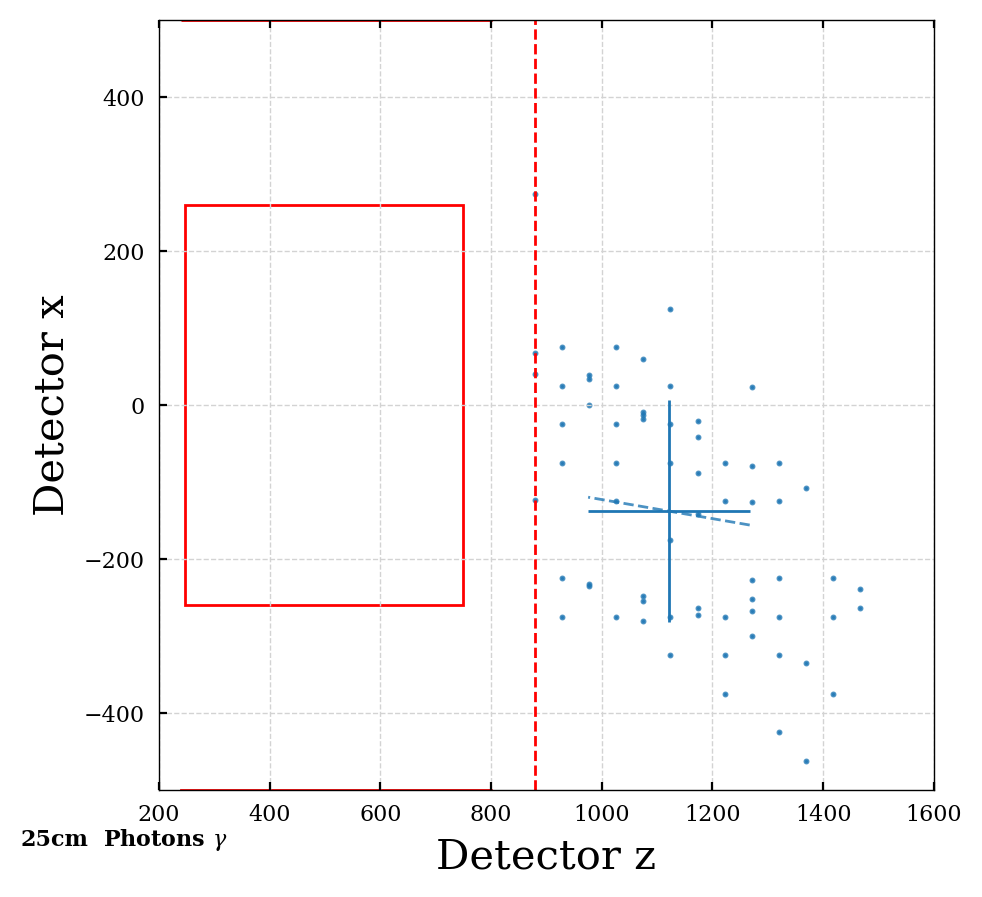

In [48]:
plot_cluster_dist(particles_dict_25cm, 25, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_25cm, 25, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Electrons

6


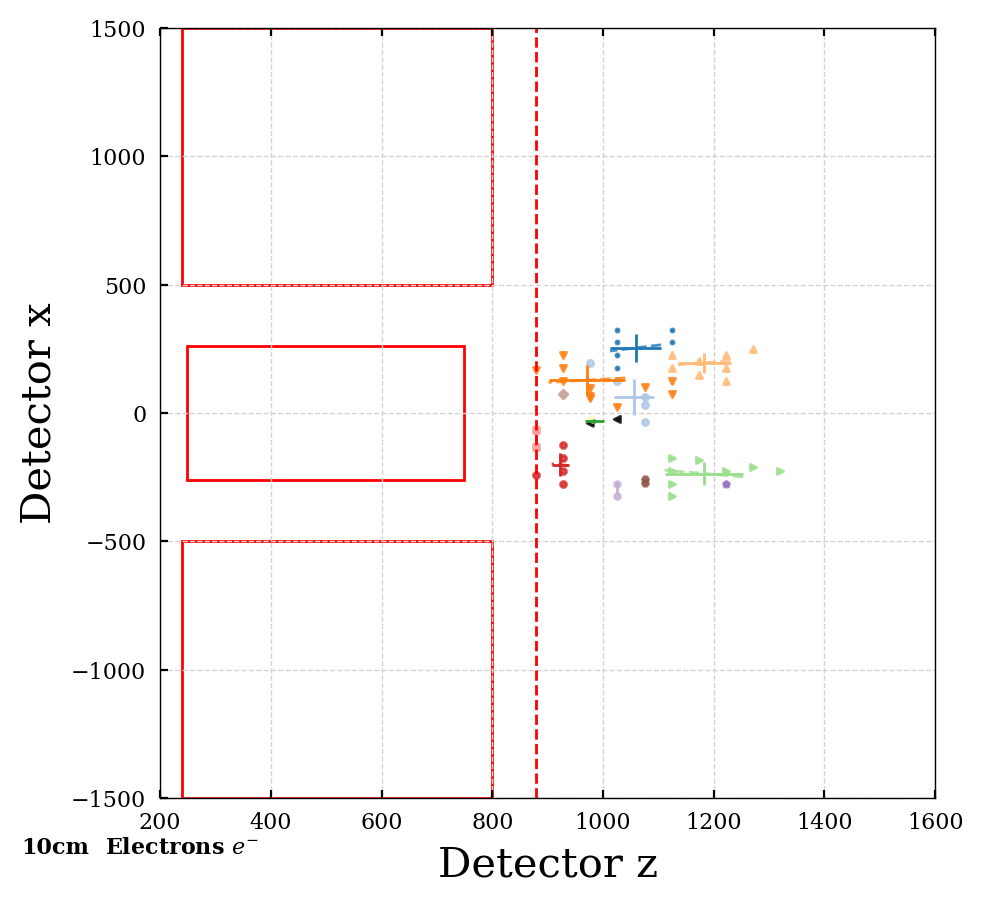

2


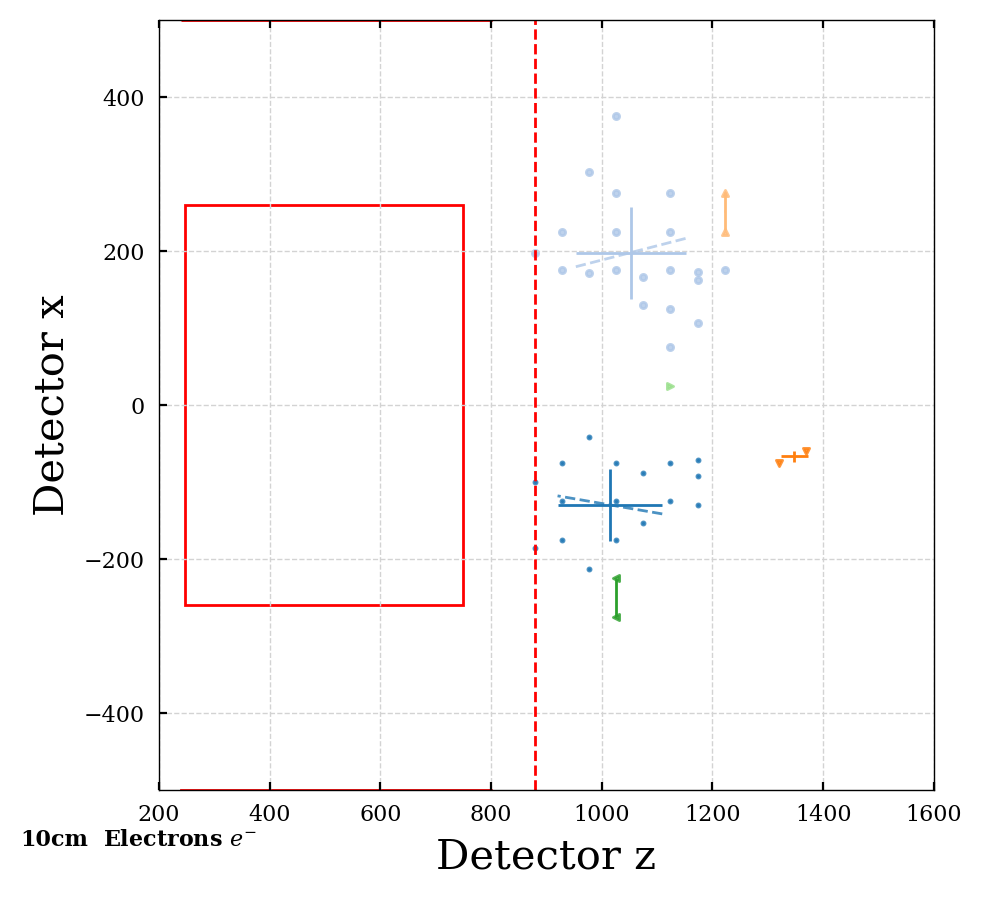

2


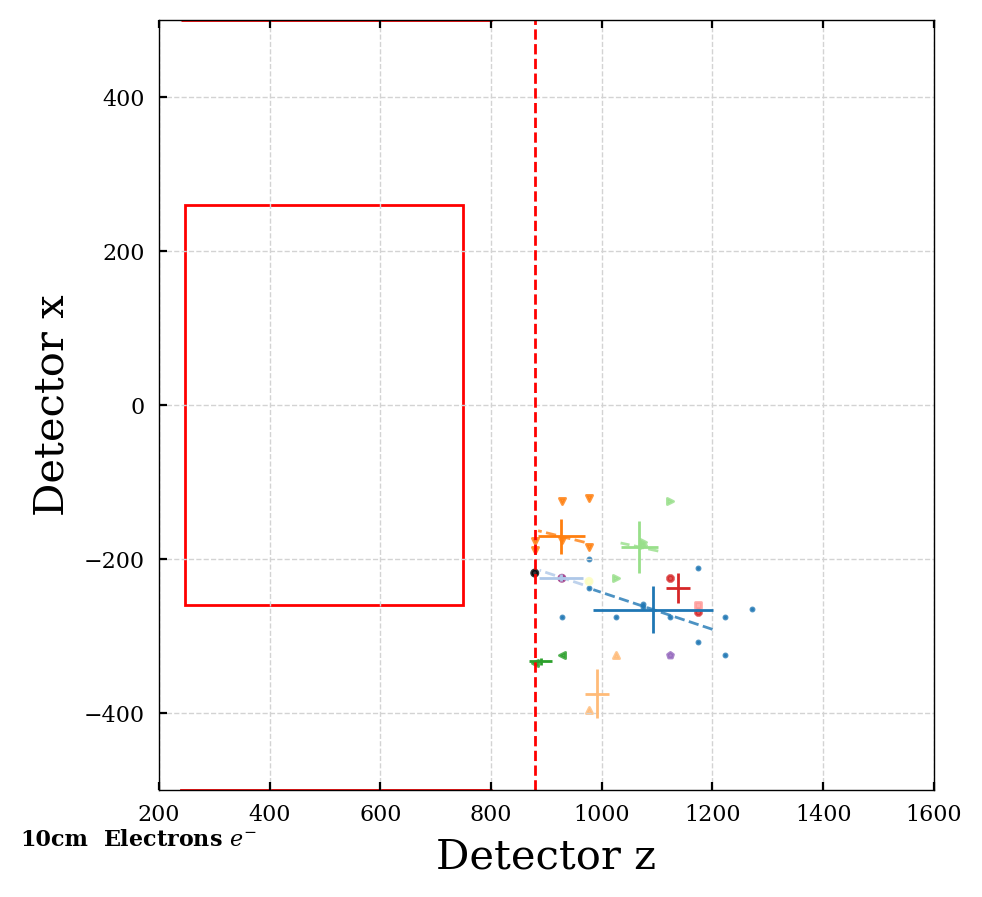

2


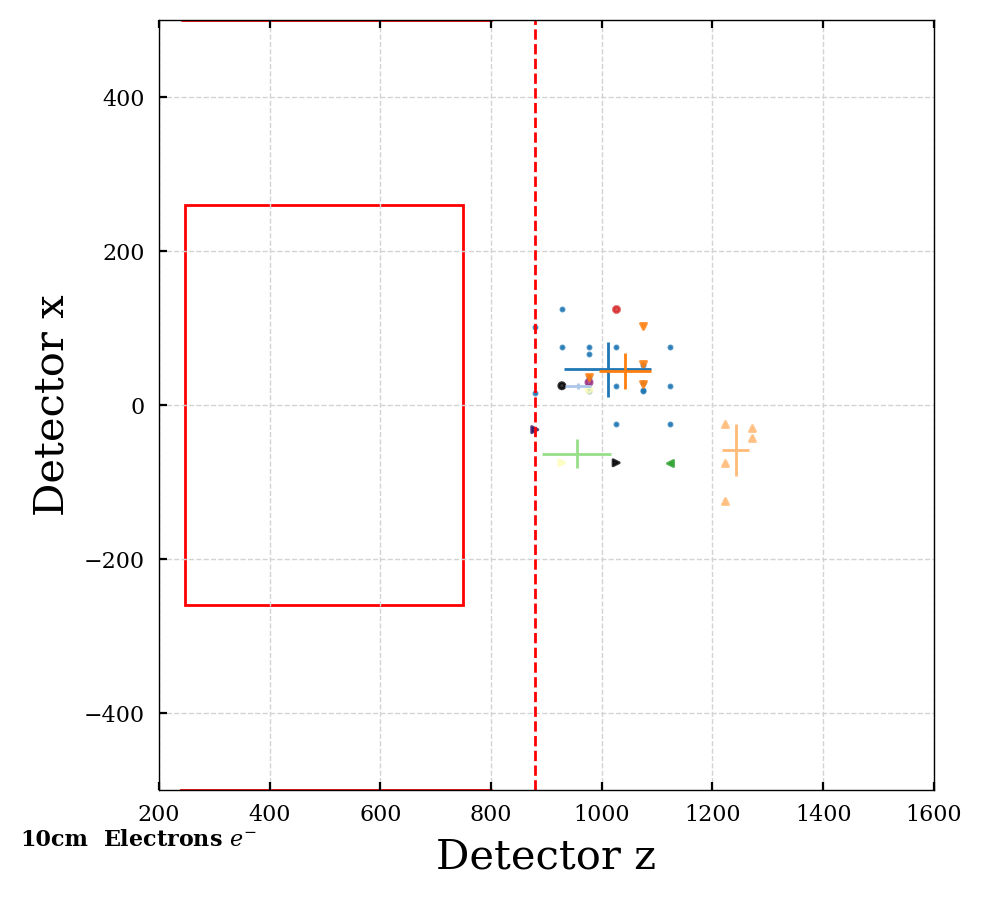

1


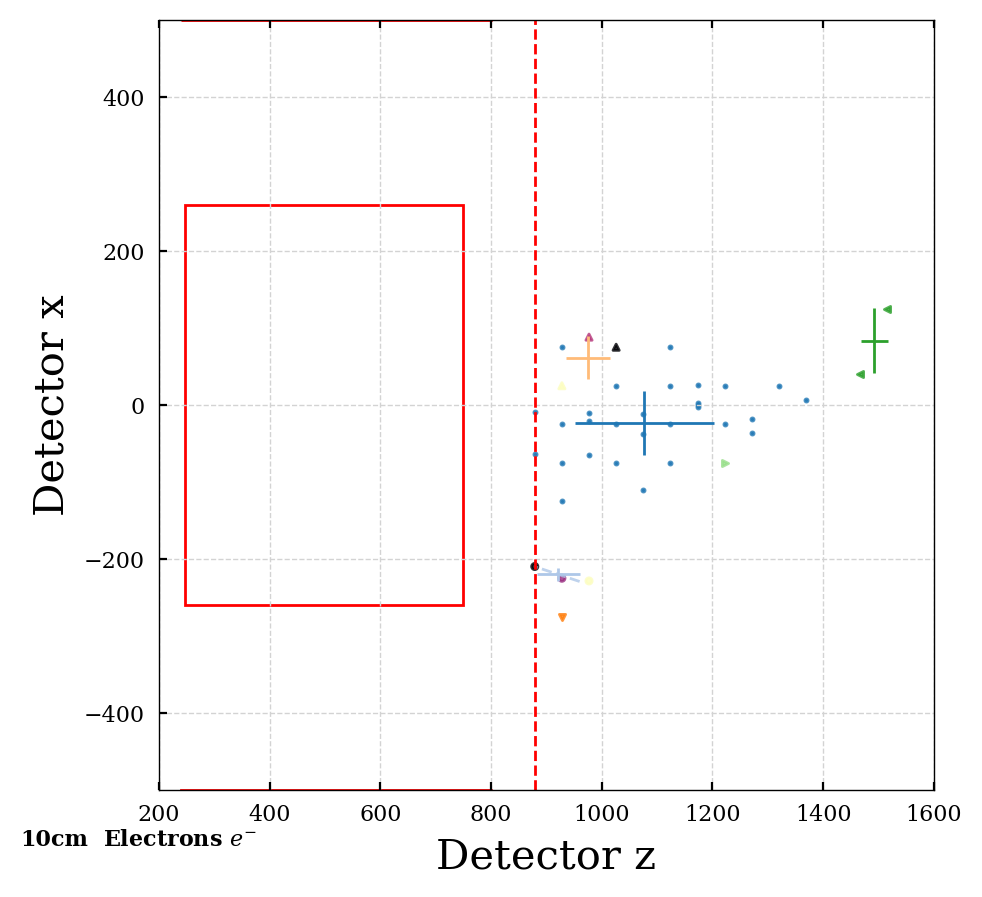

2


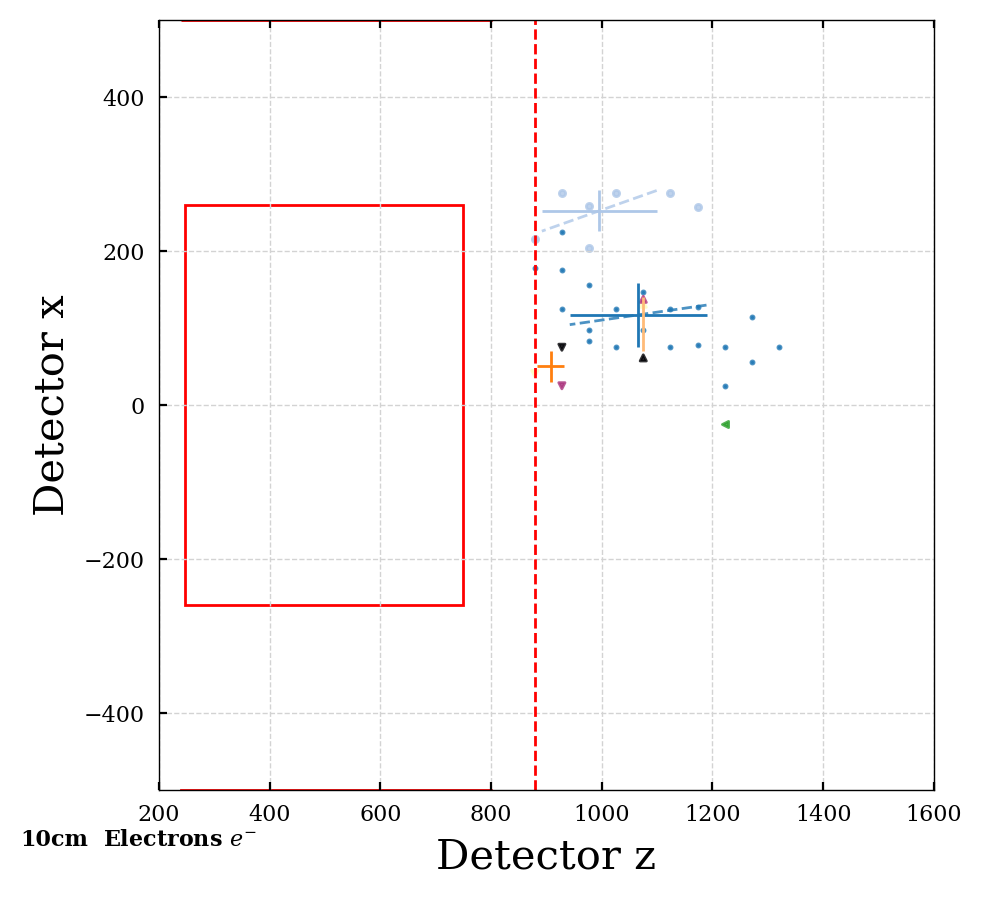

1


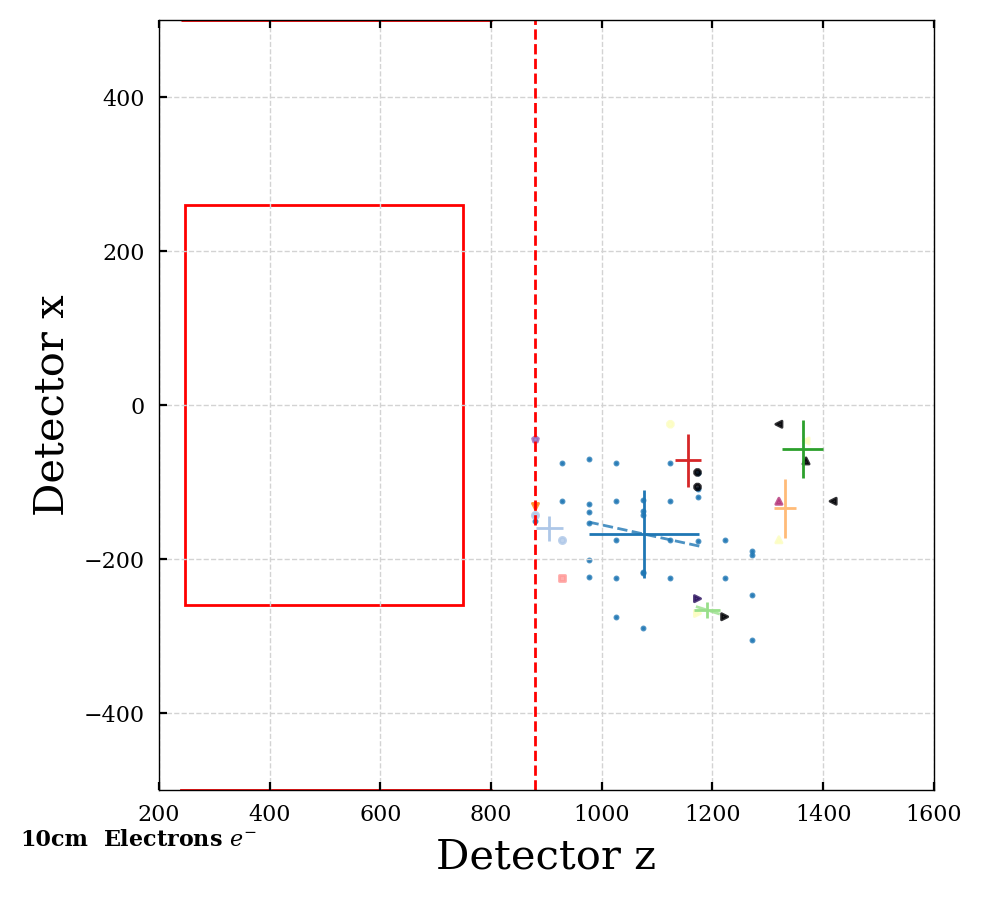

2


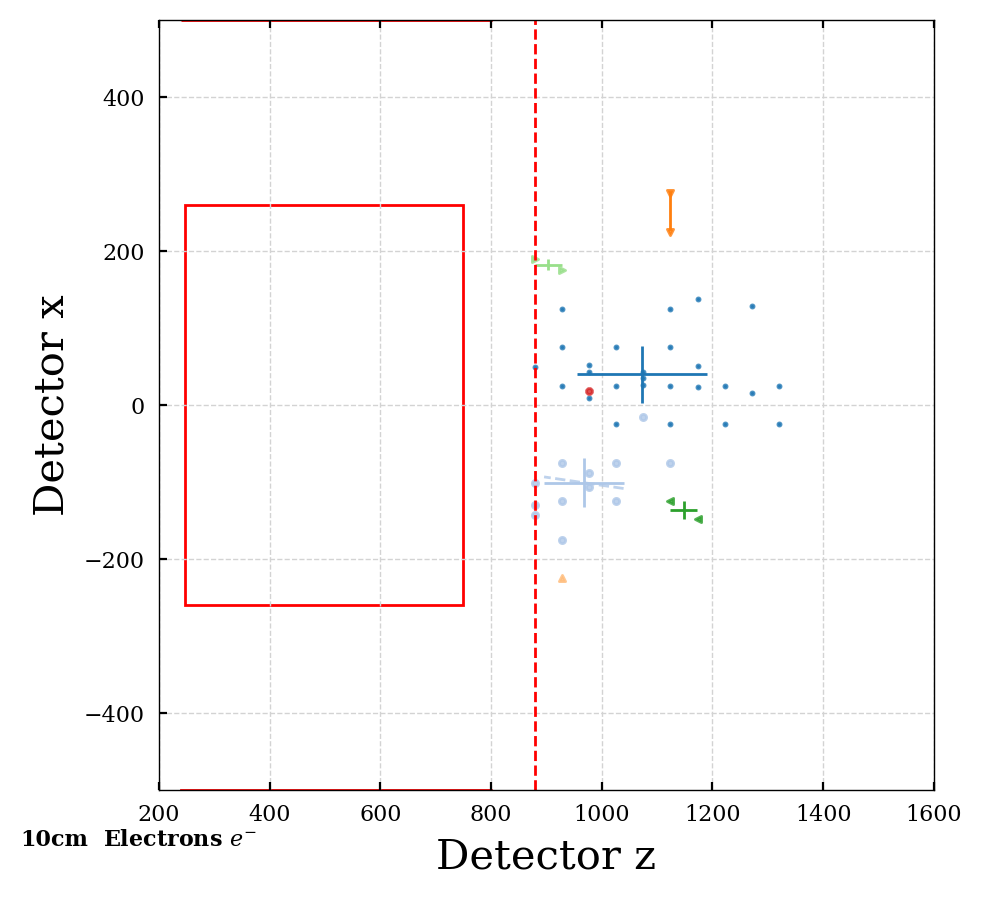

2


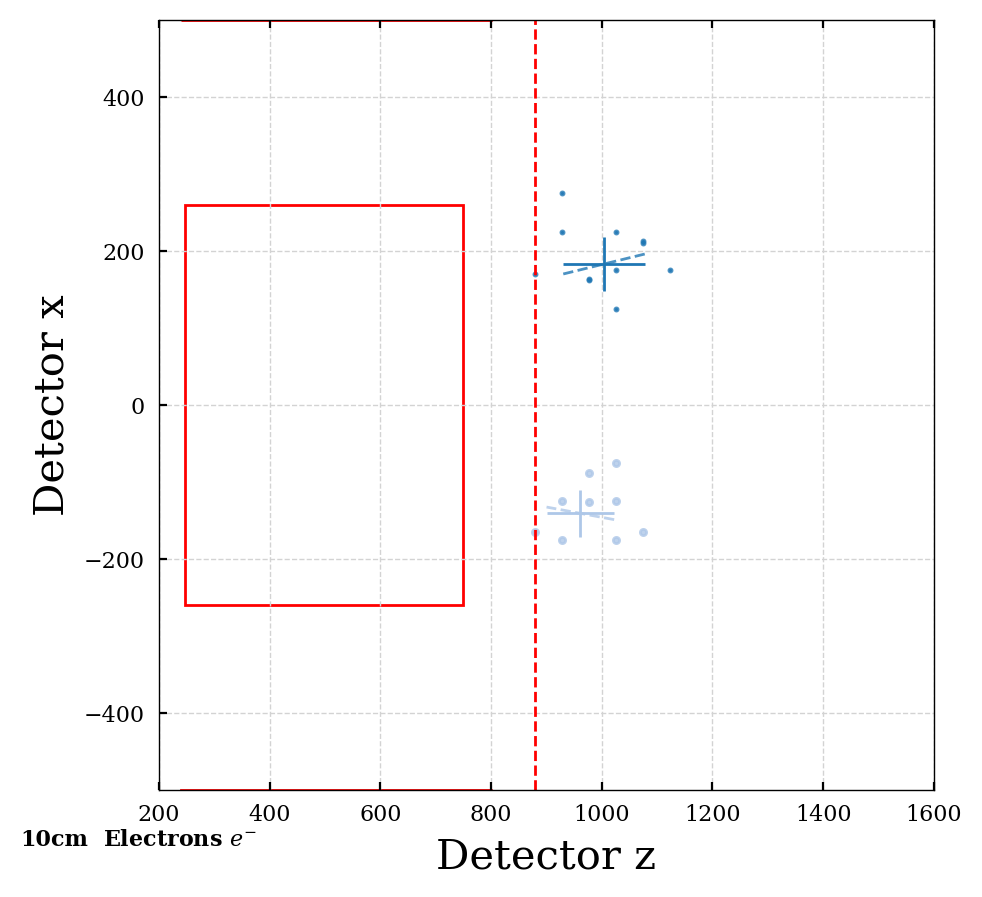

2


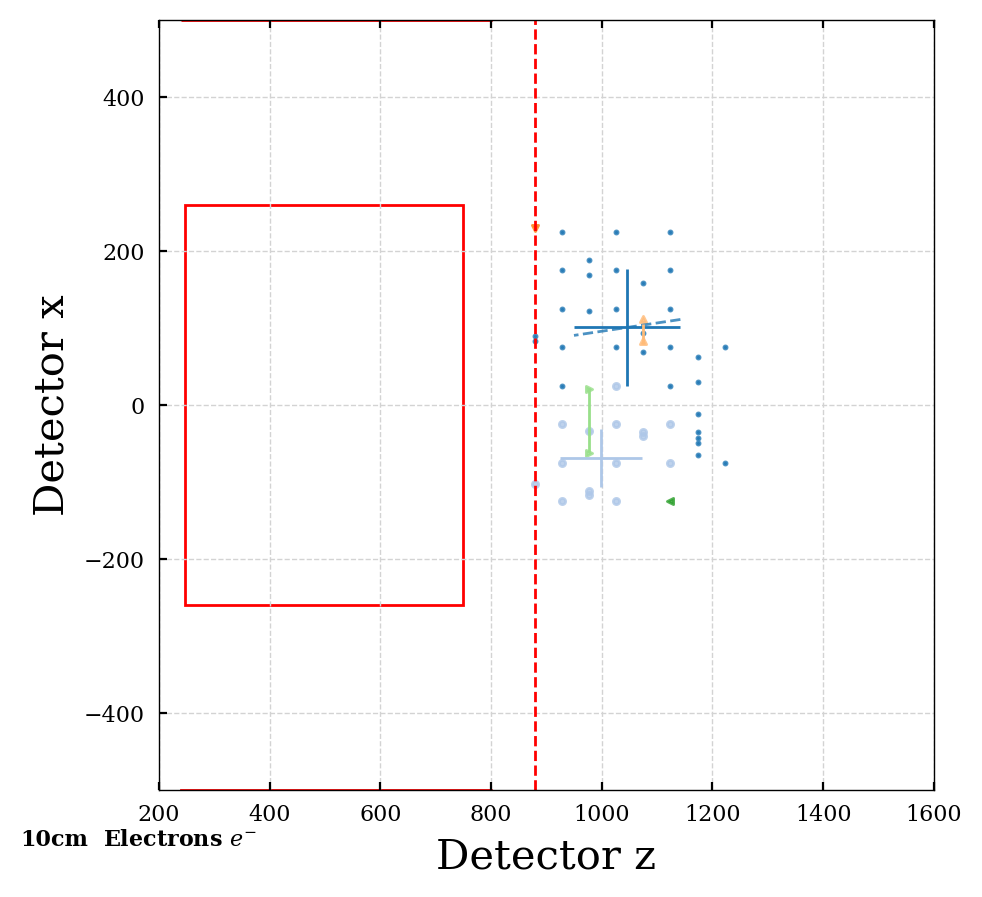

2


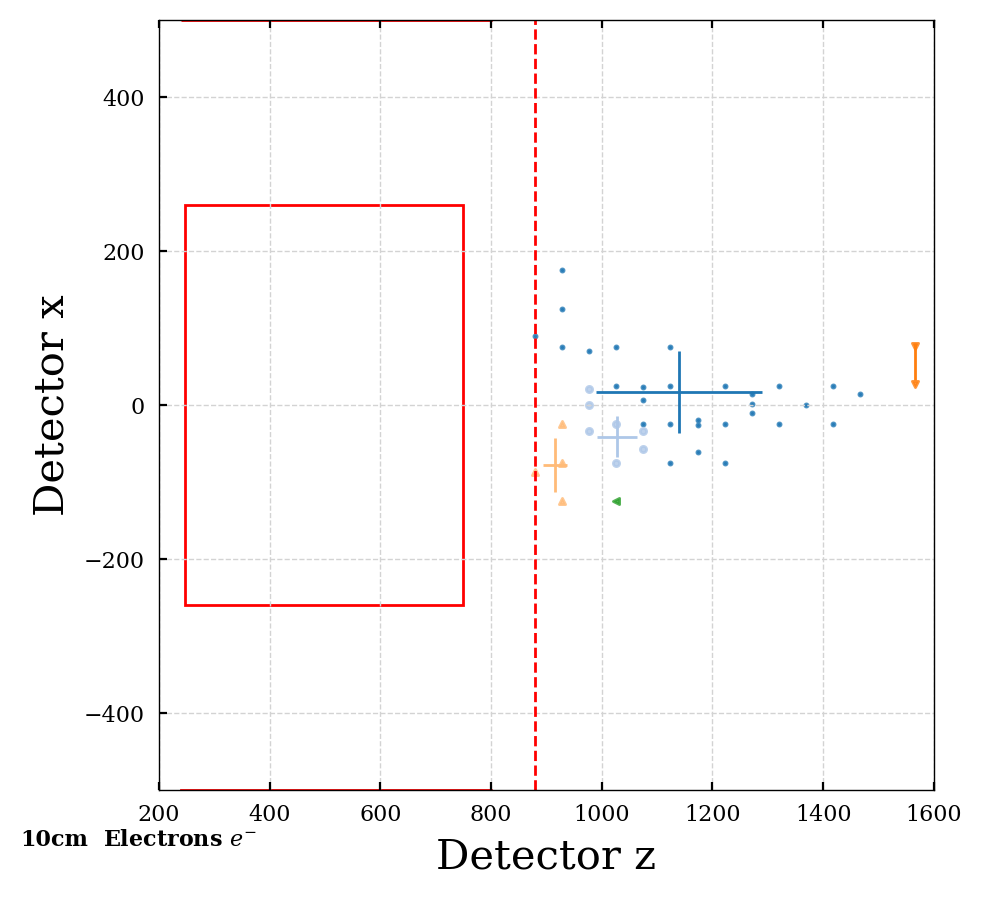

In [49]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='electrons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='electrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

3


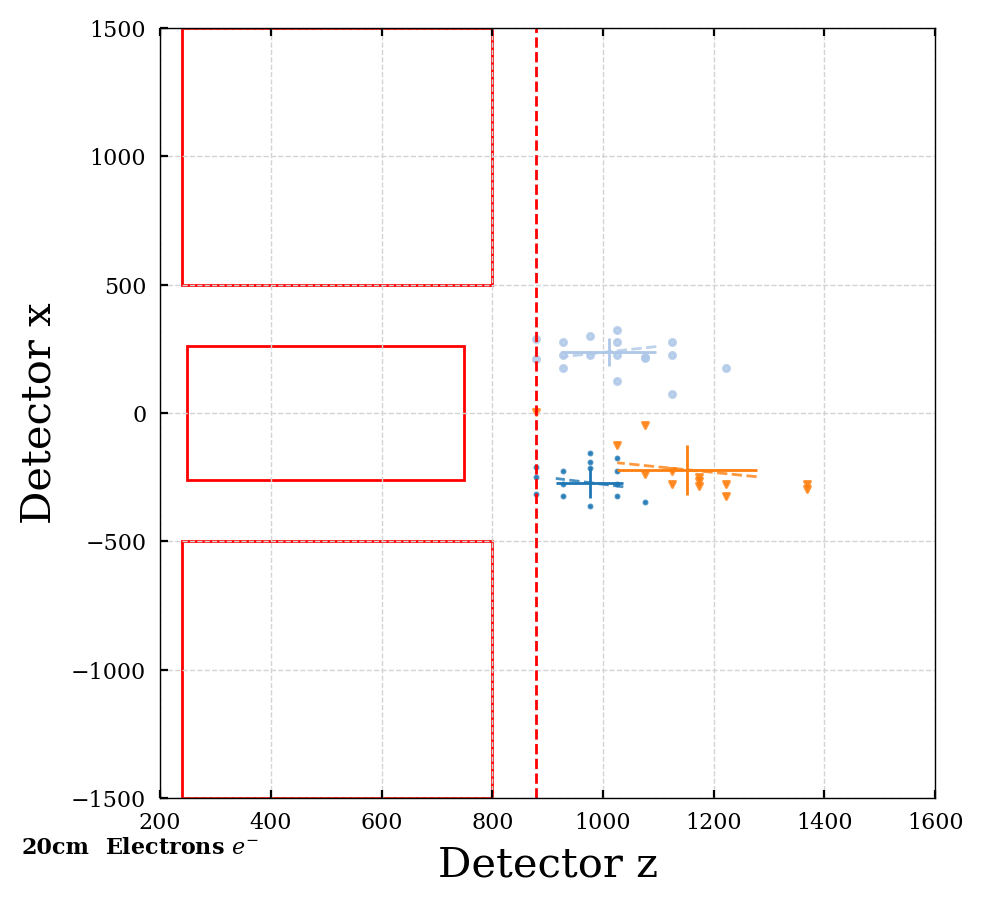

1


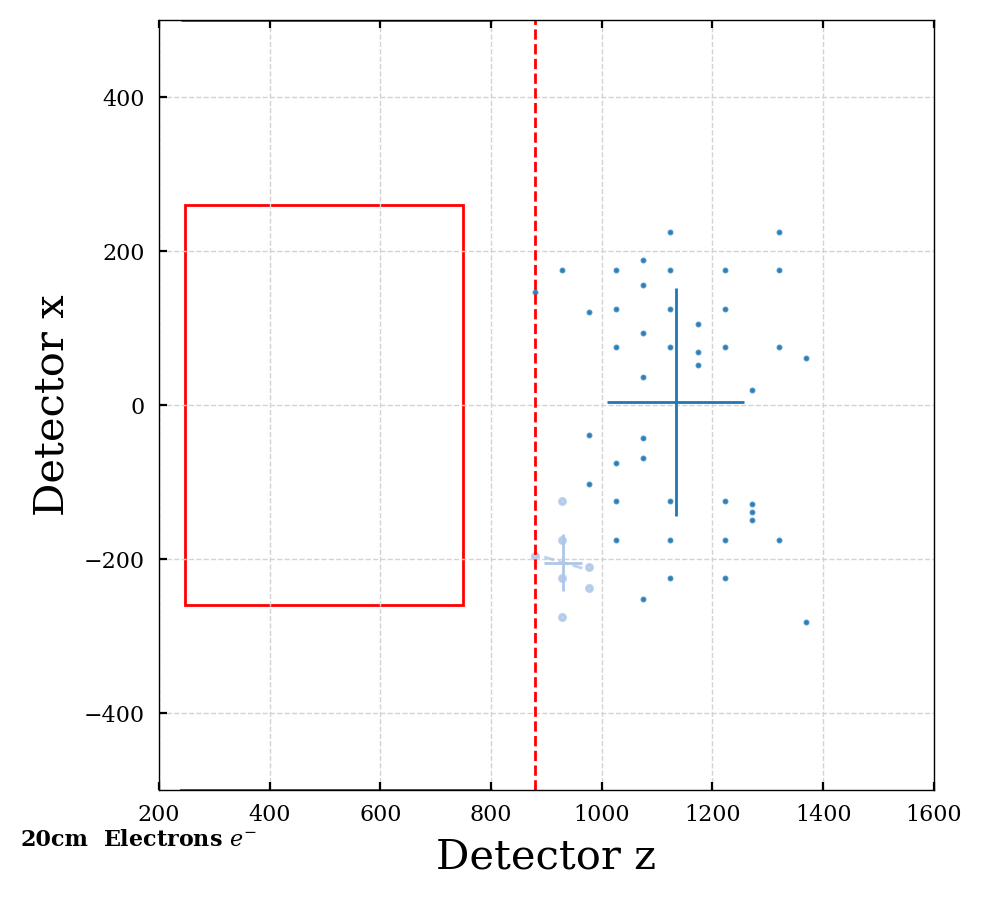

1


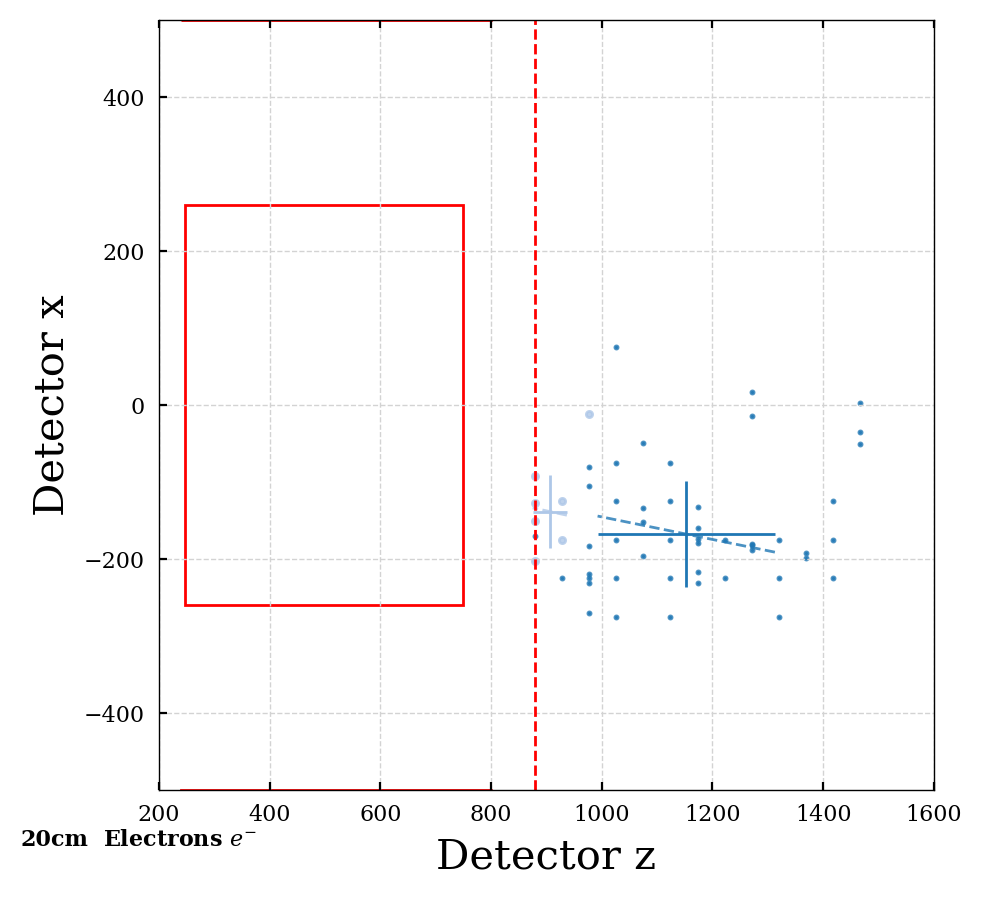

1


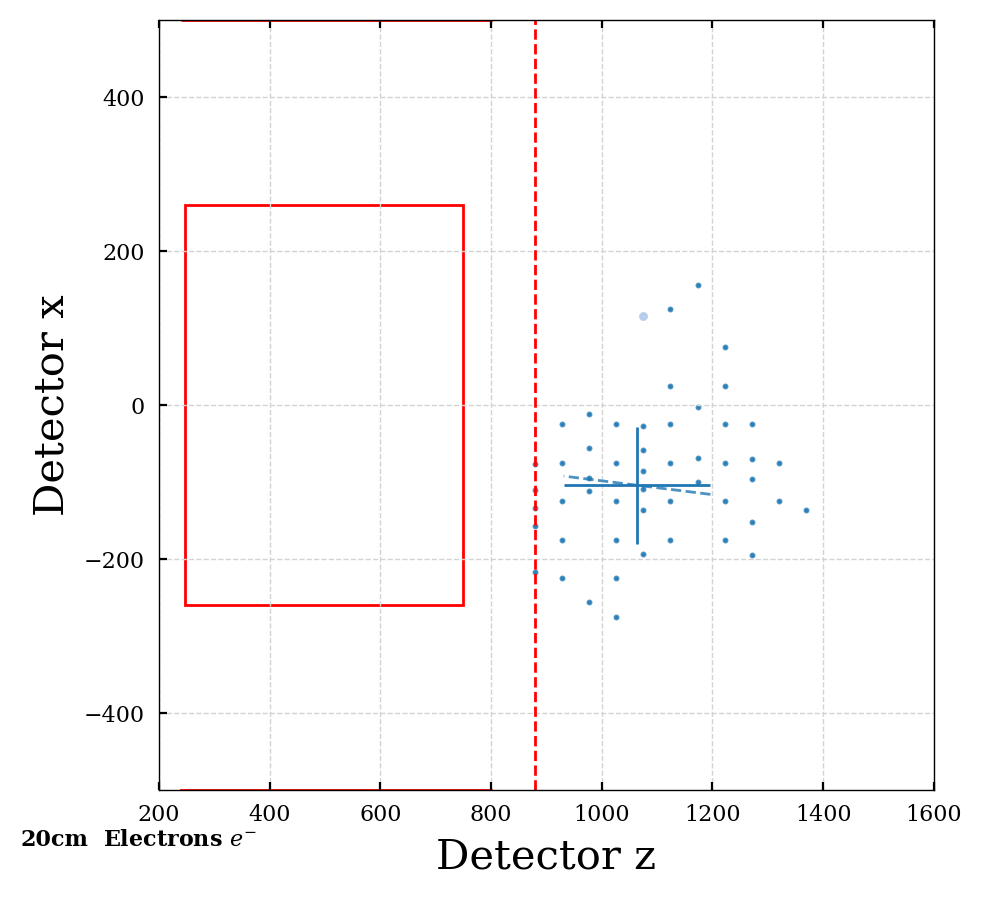

1


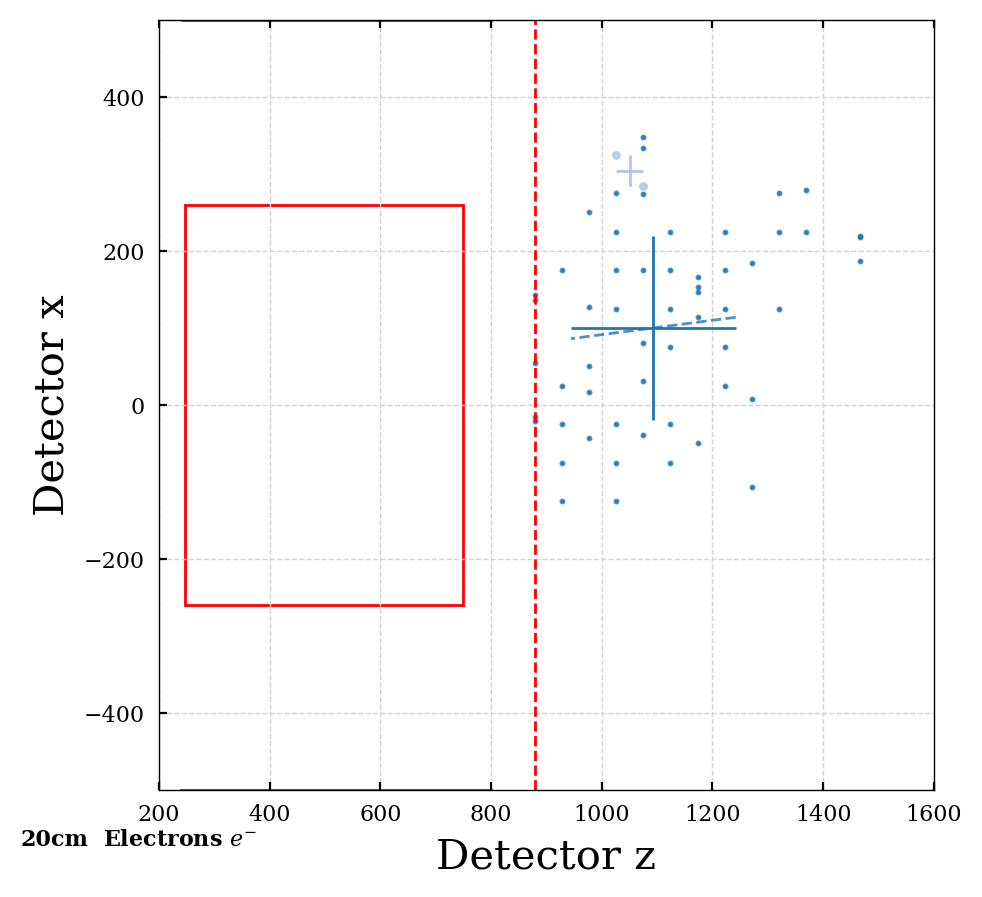

1


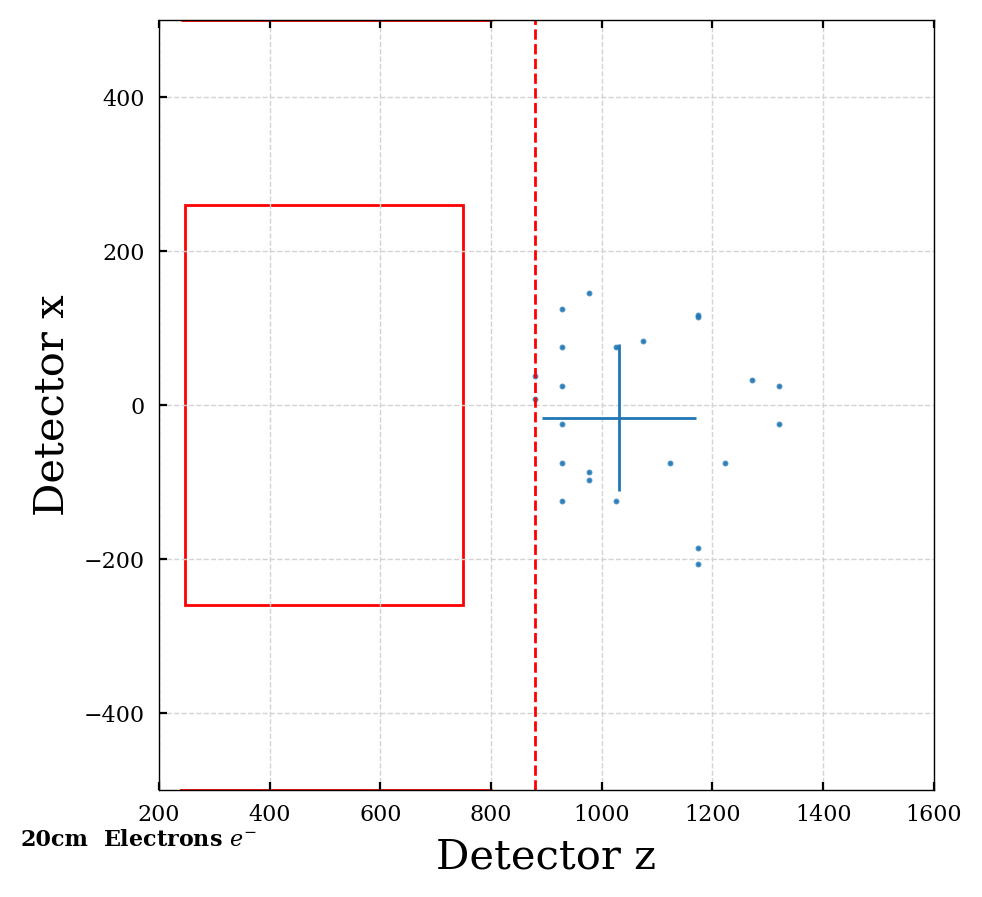

1


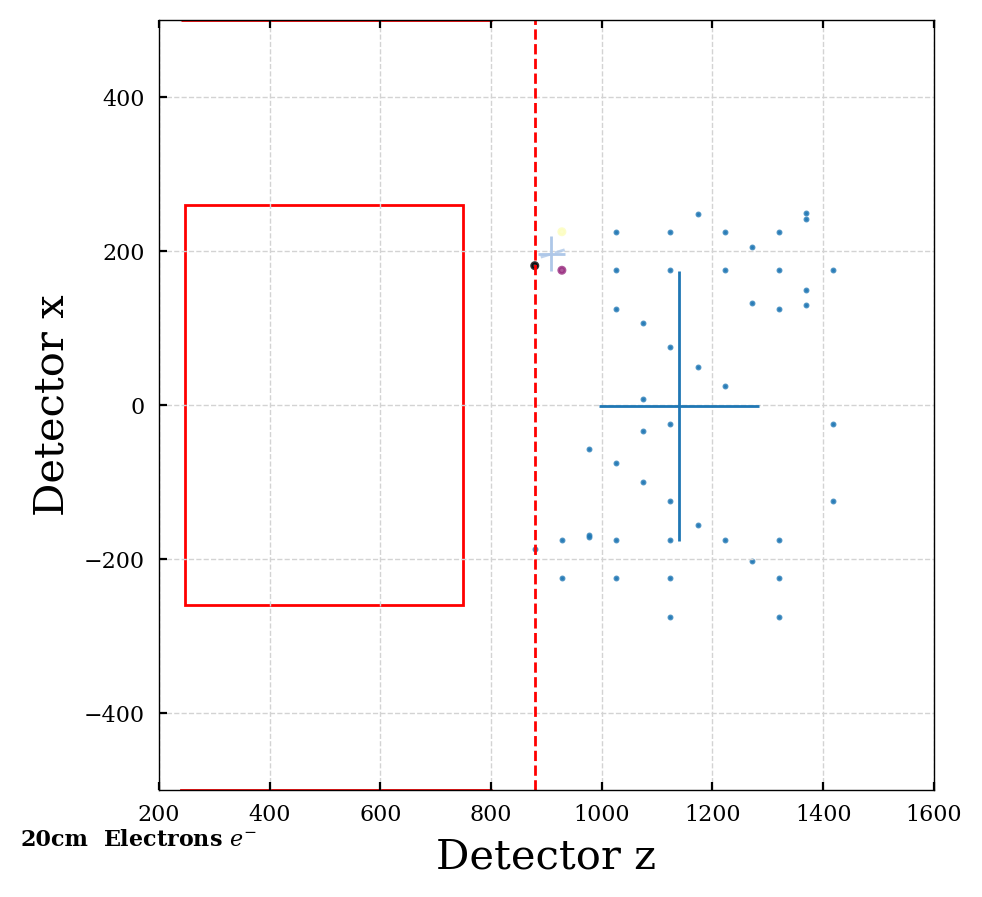

1


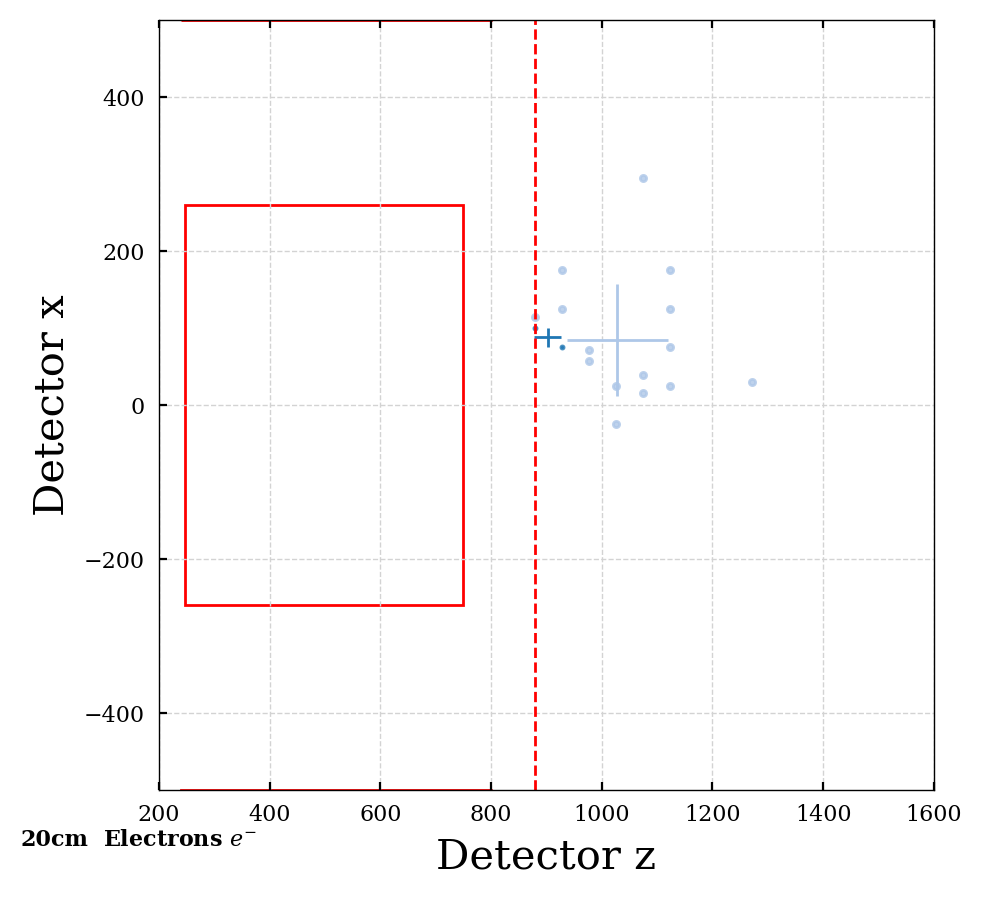

1


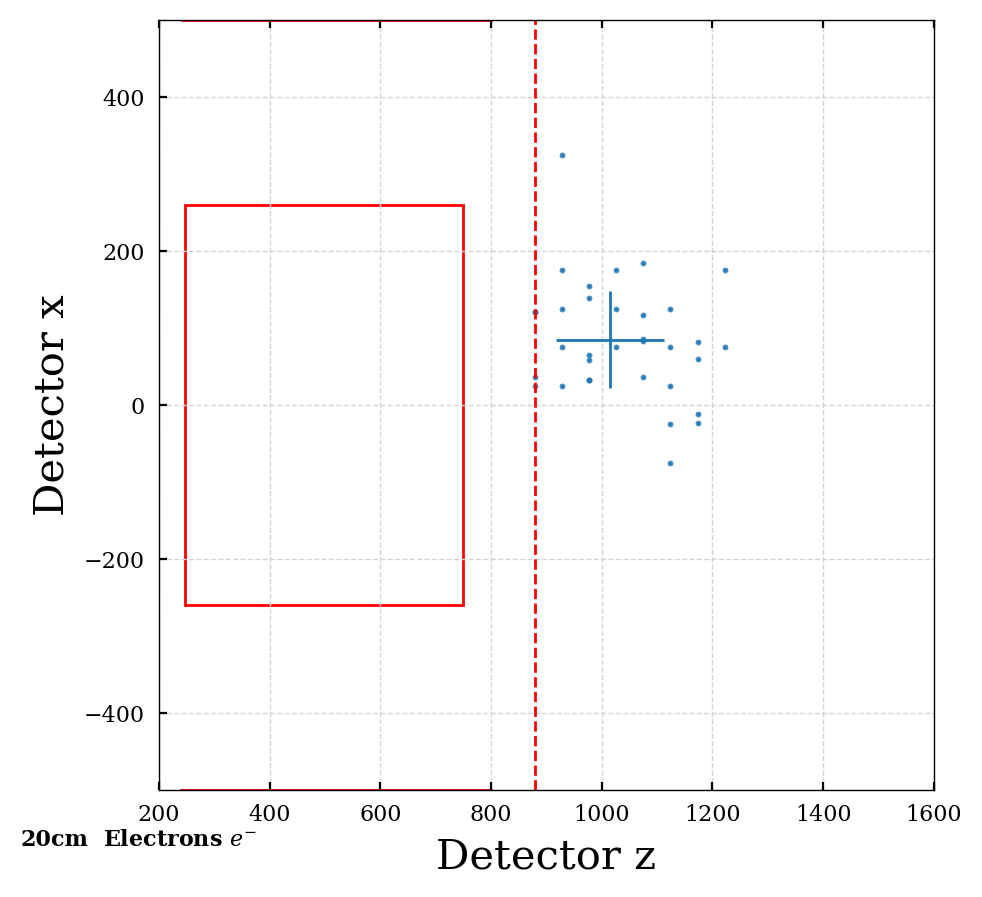

1


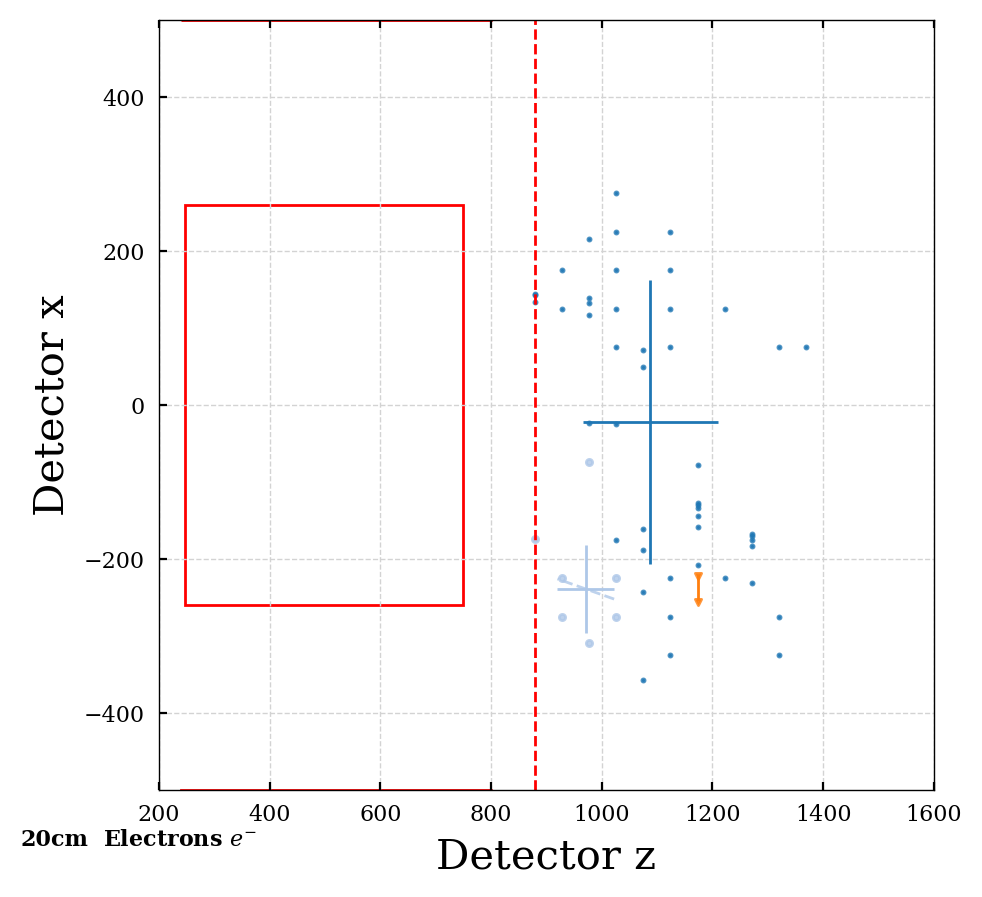

1


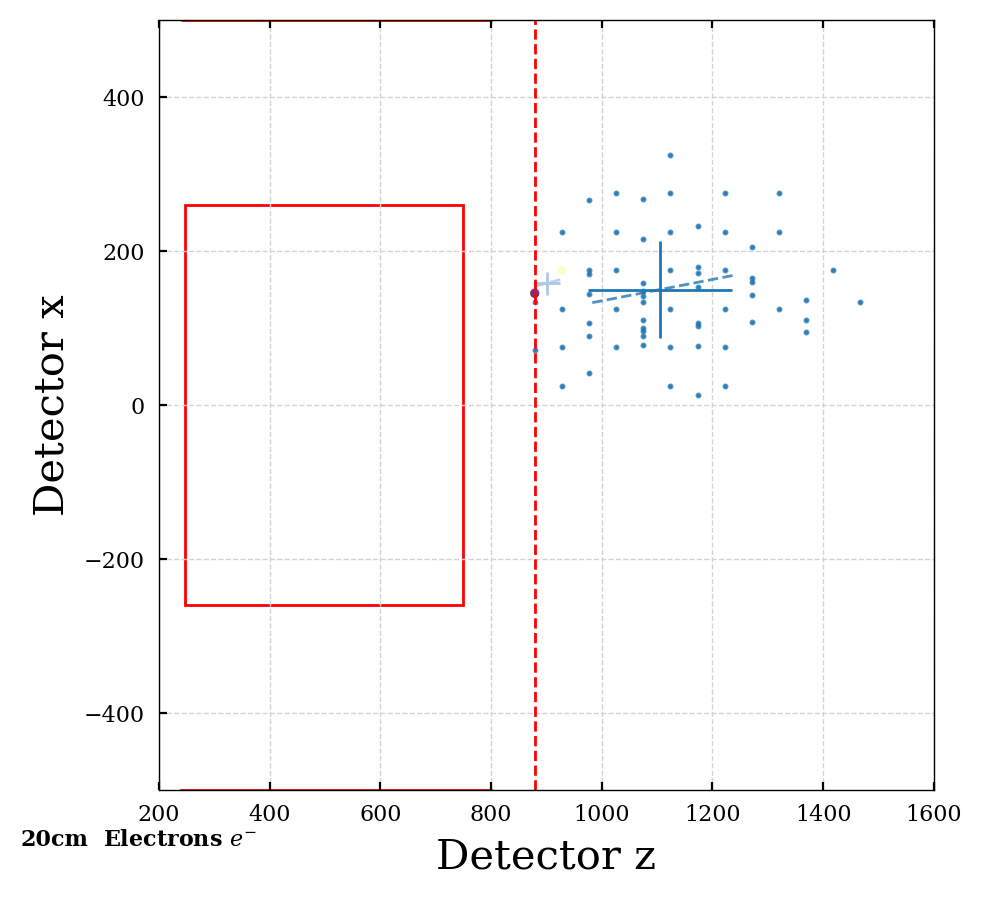

In [50]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='electrons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='electrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Pions

8


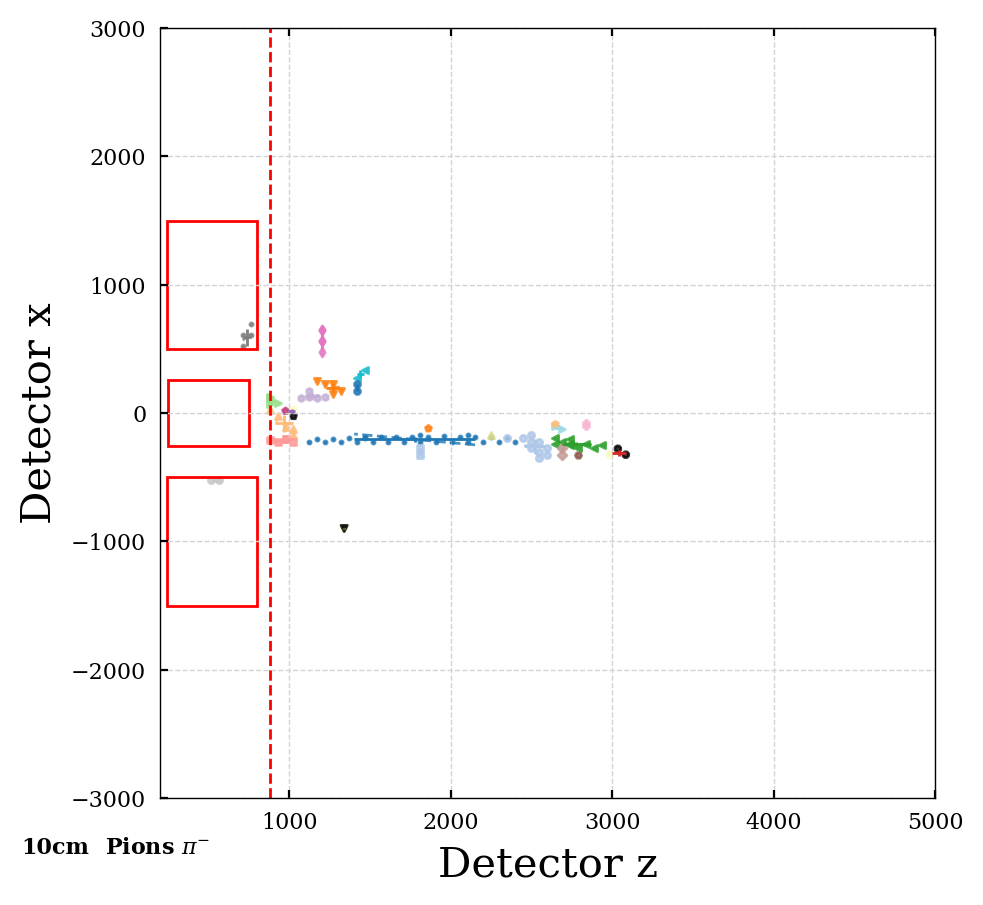

2


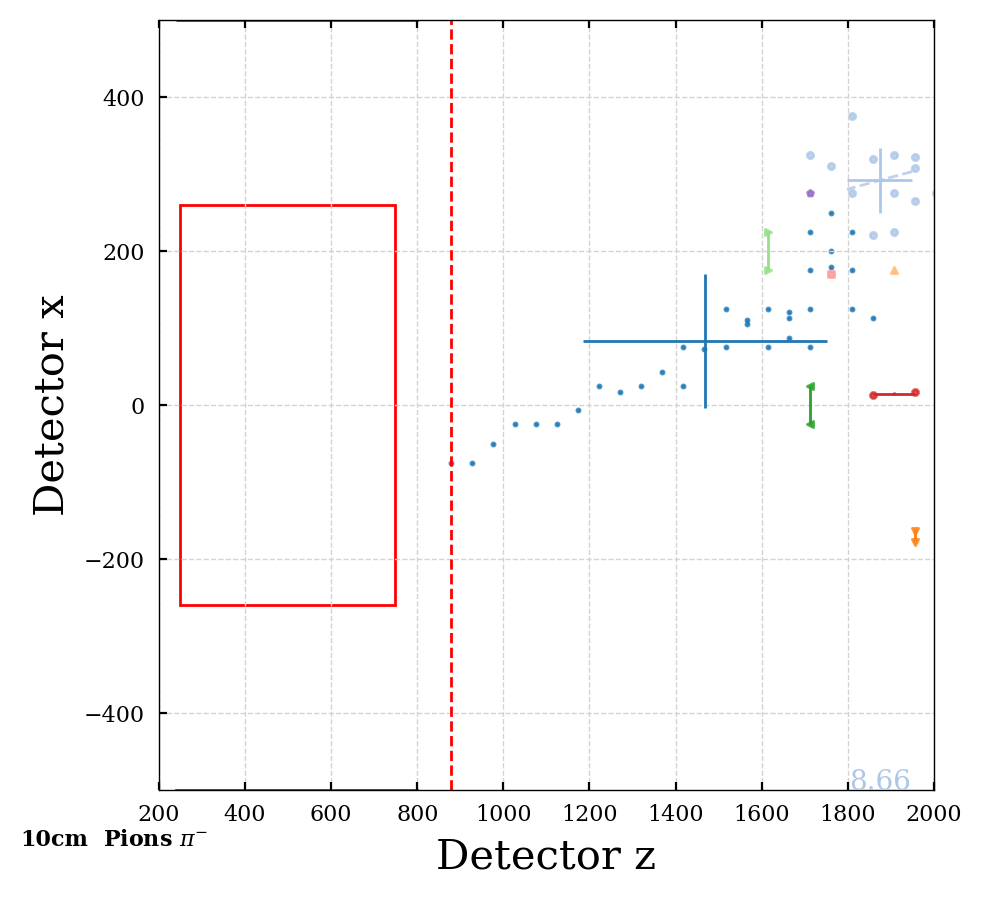

2


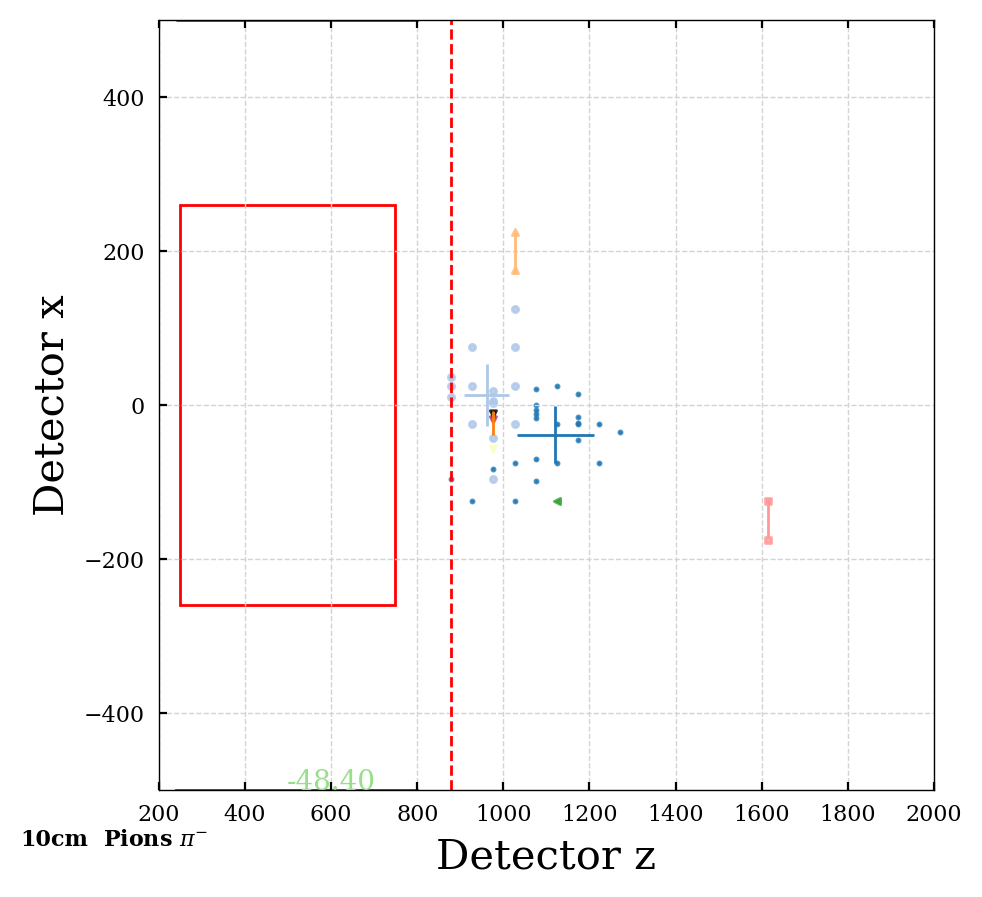

3


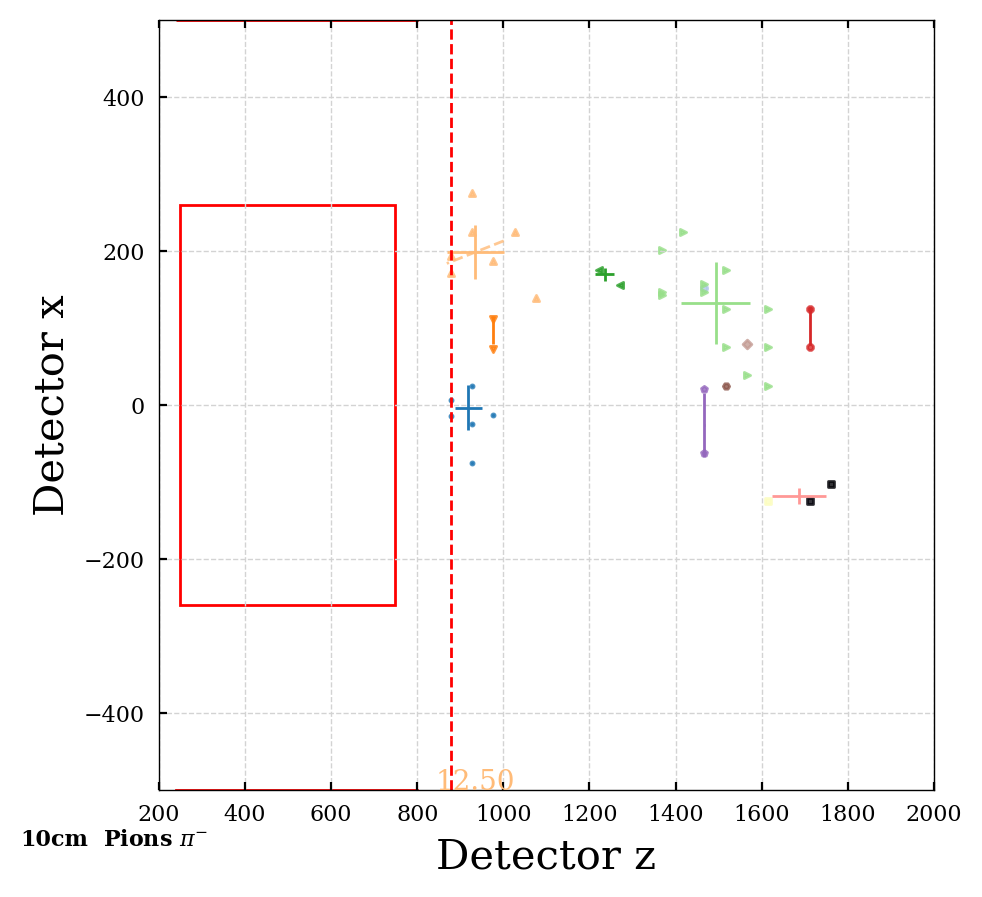

2


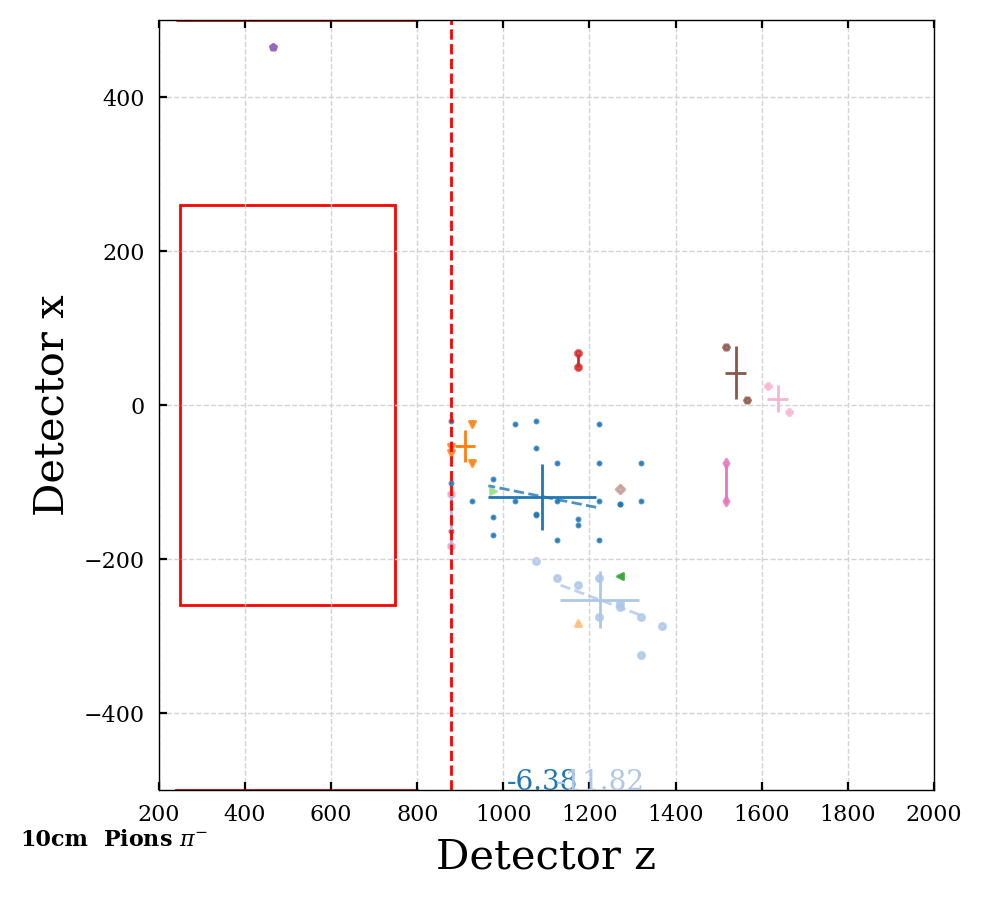

1


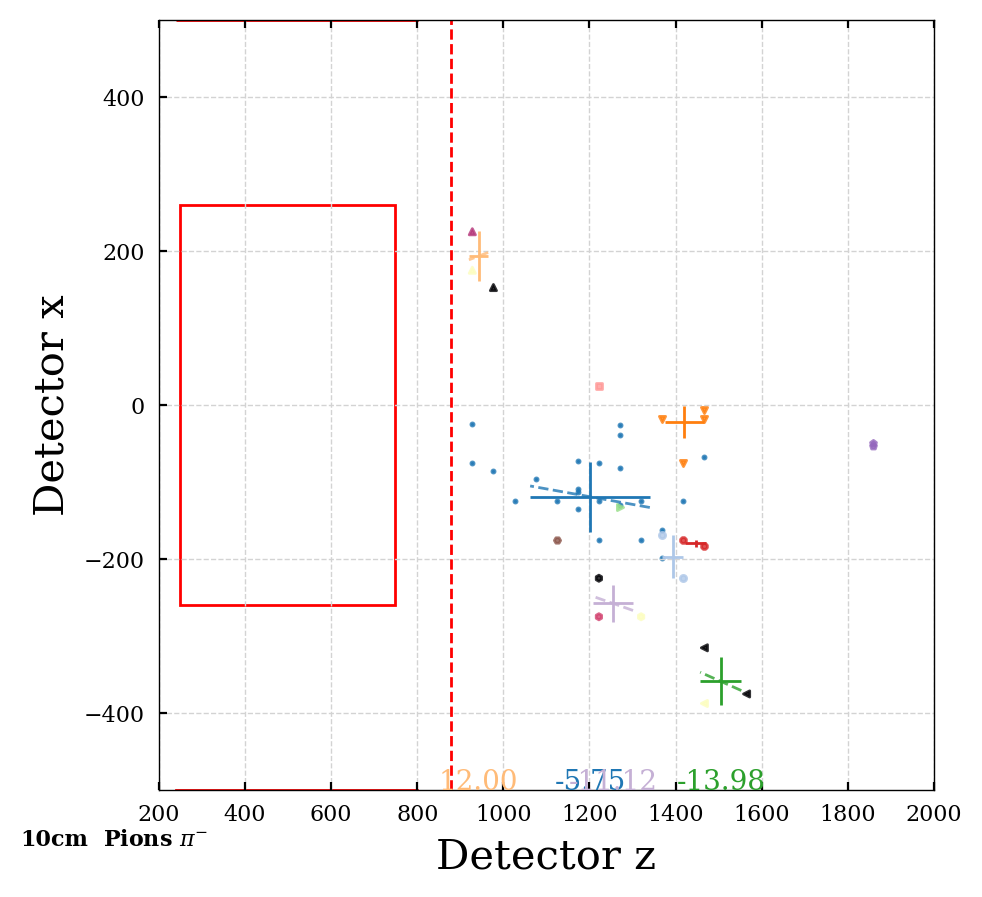

3


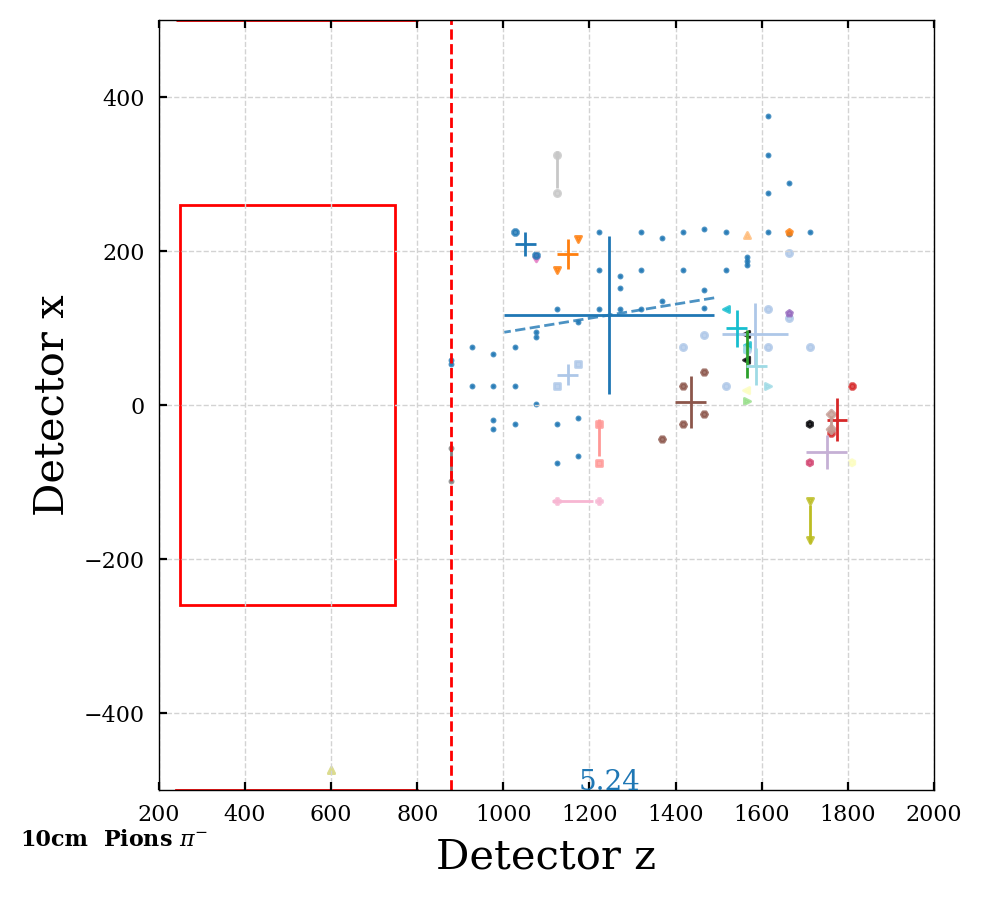

1


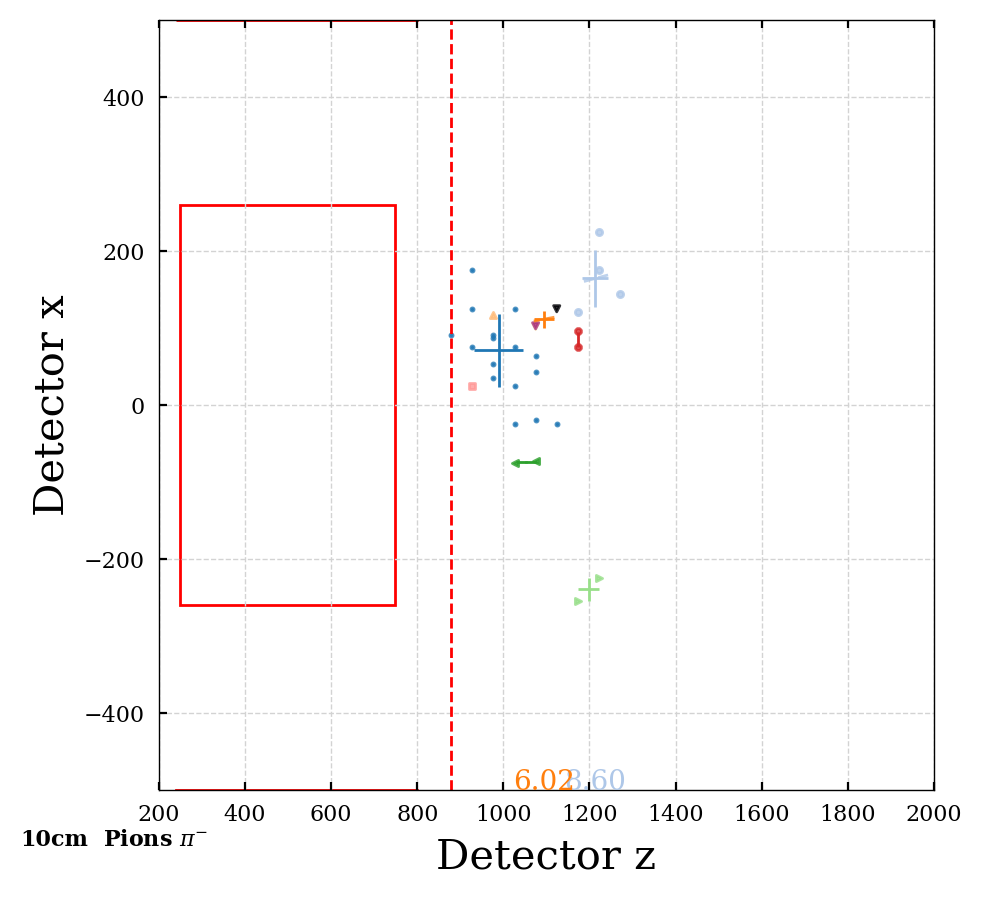

2


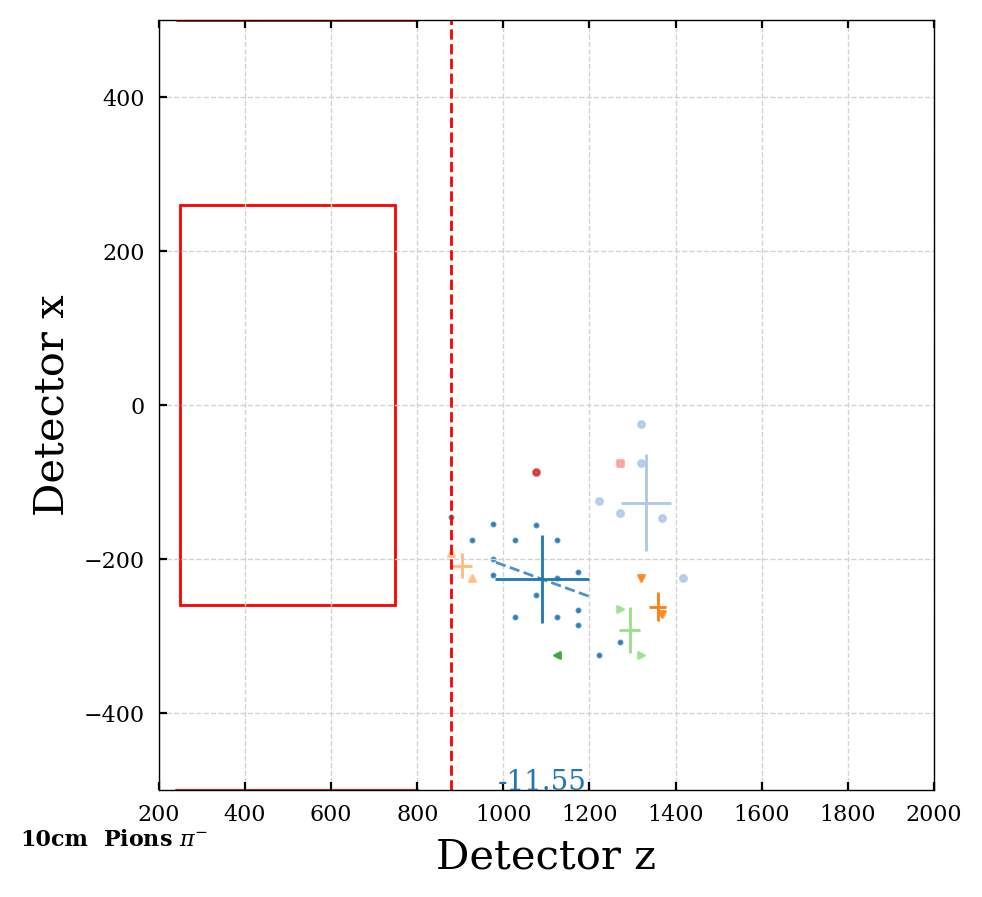

1


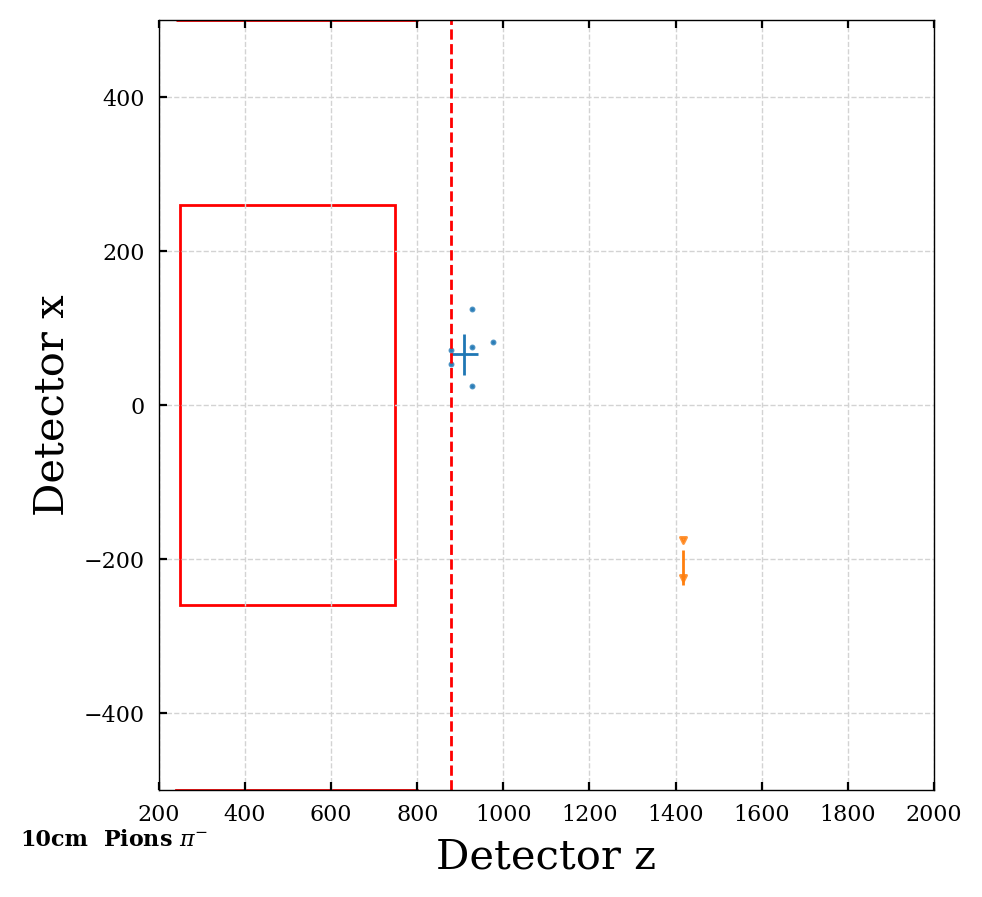

3


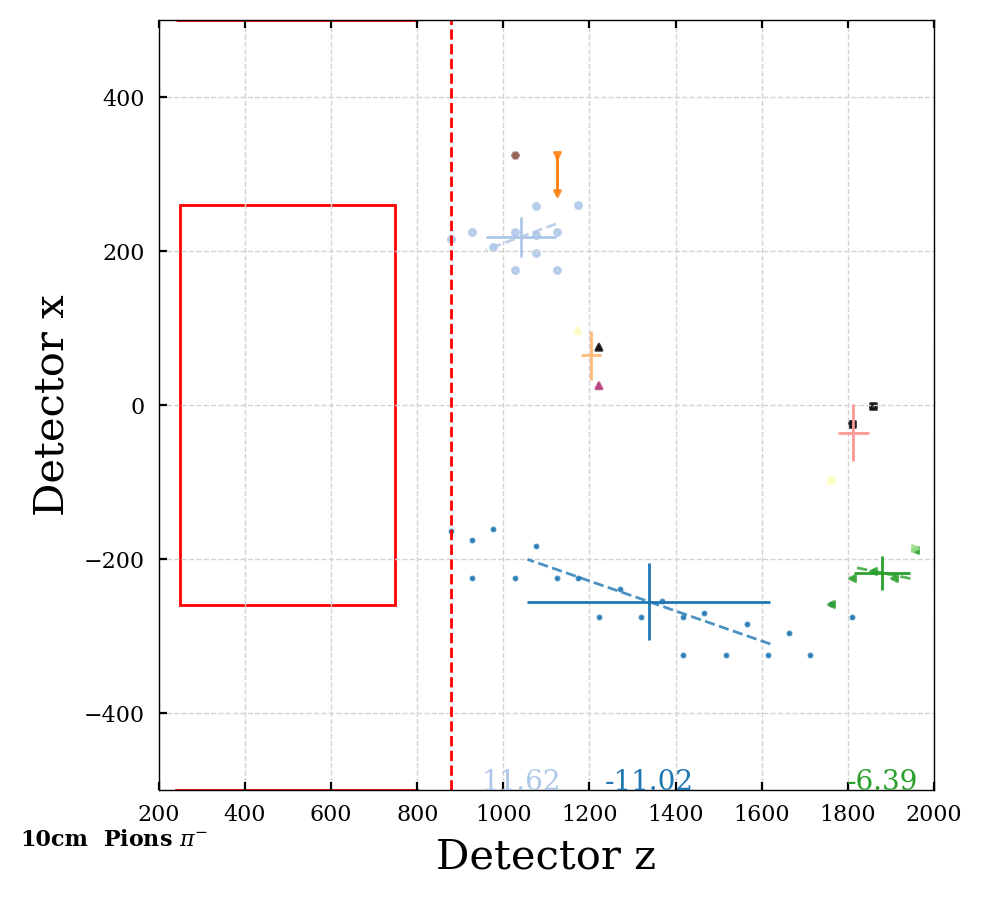

In [51]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=None, xlim=5000, ylim=3000, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=ipart, xlim=2000, ylim=500, angle_label=True)

4


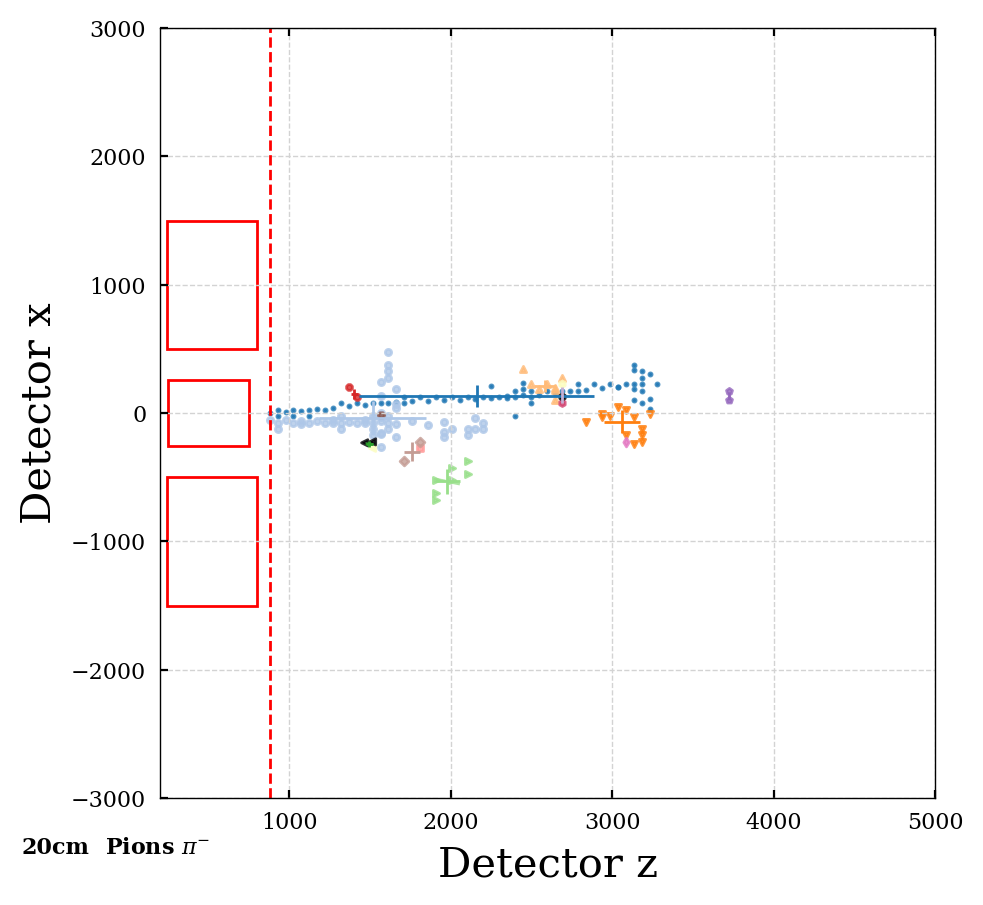

1


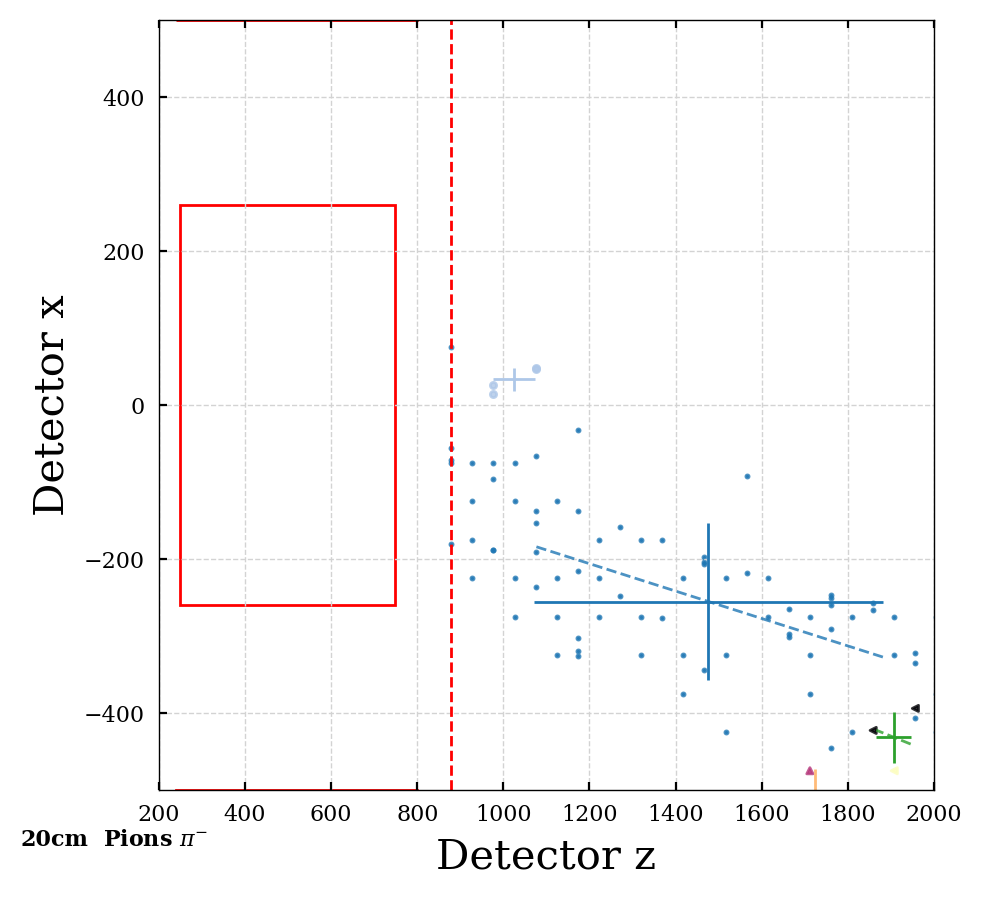

2


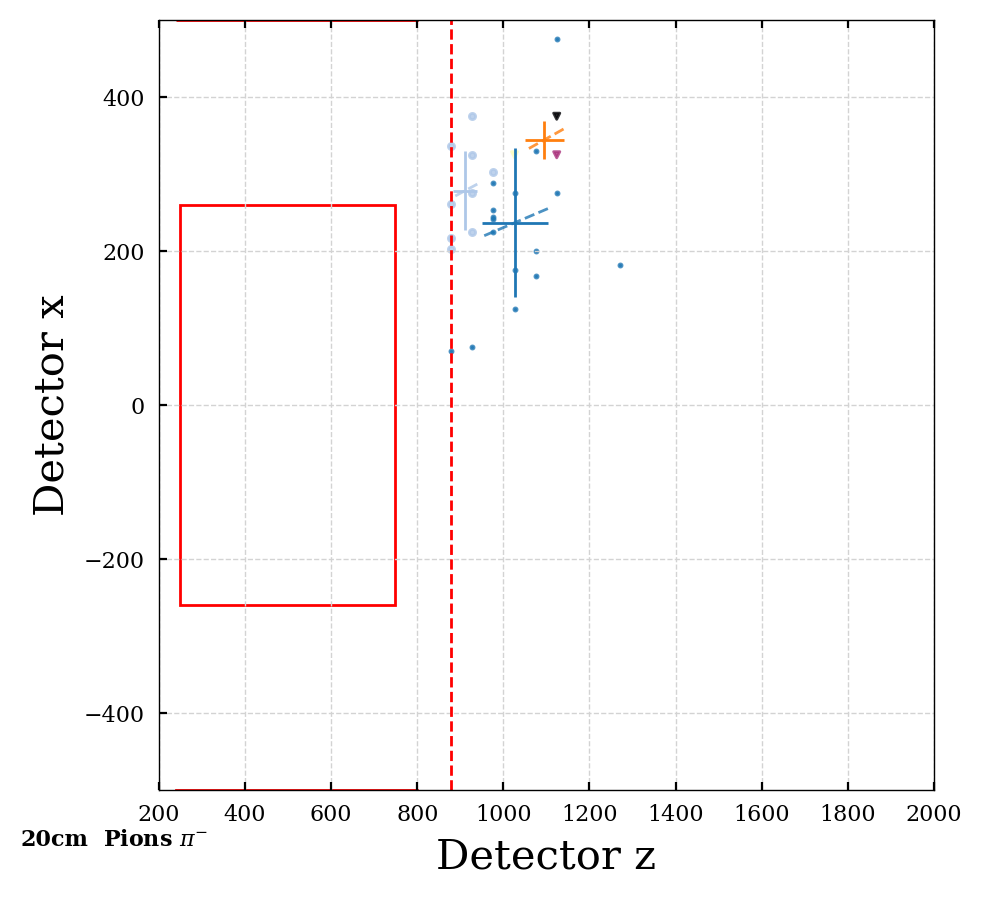

1


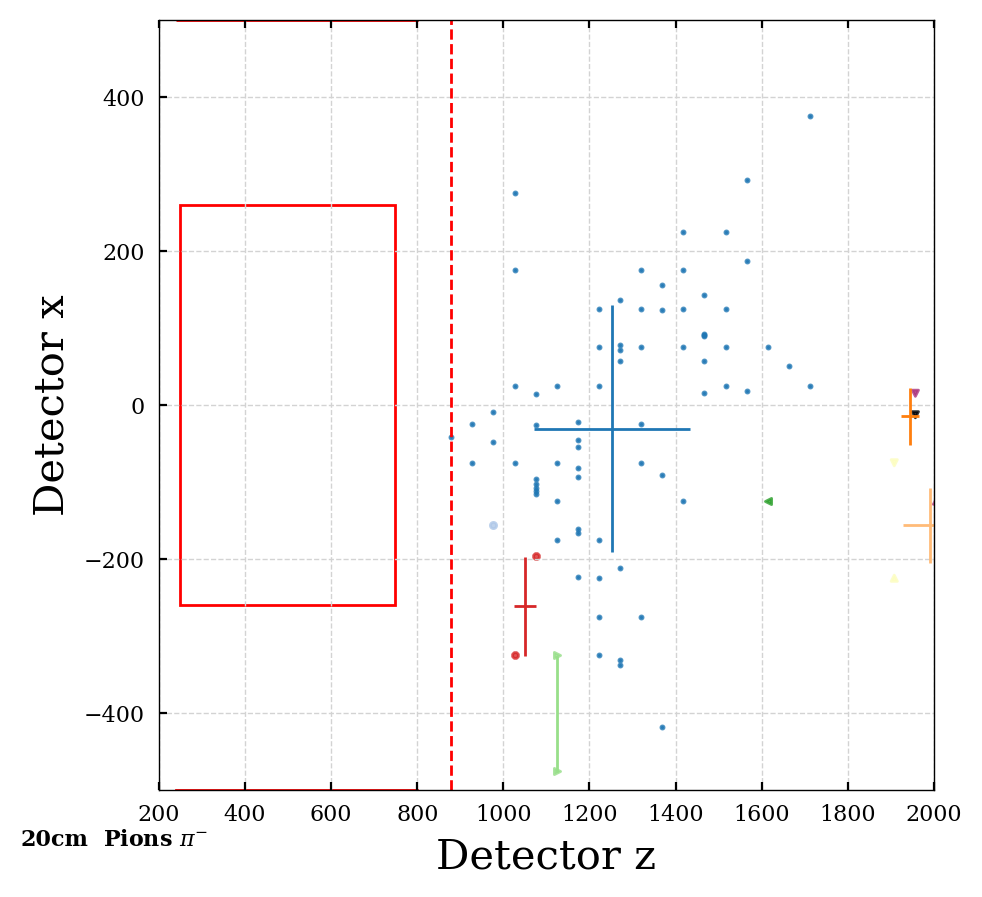

2


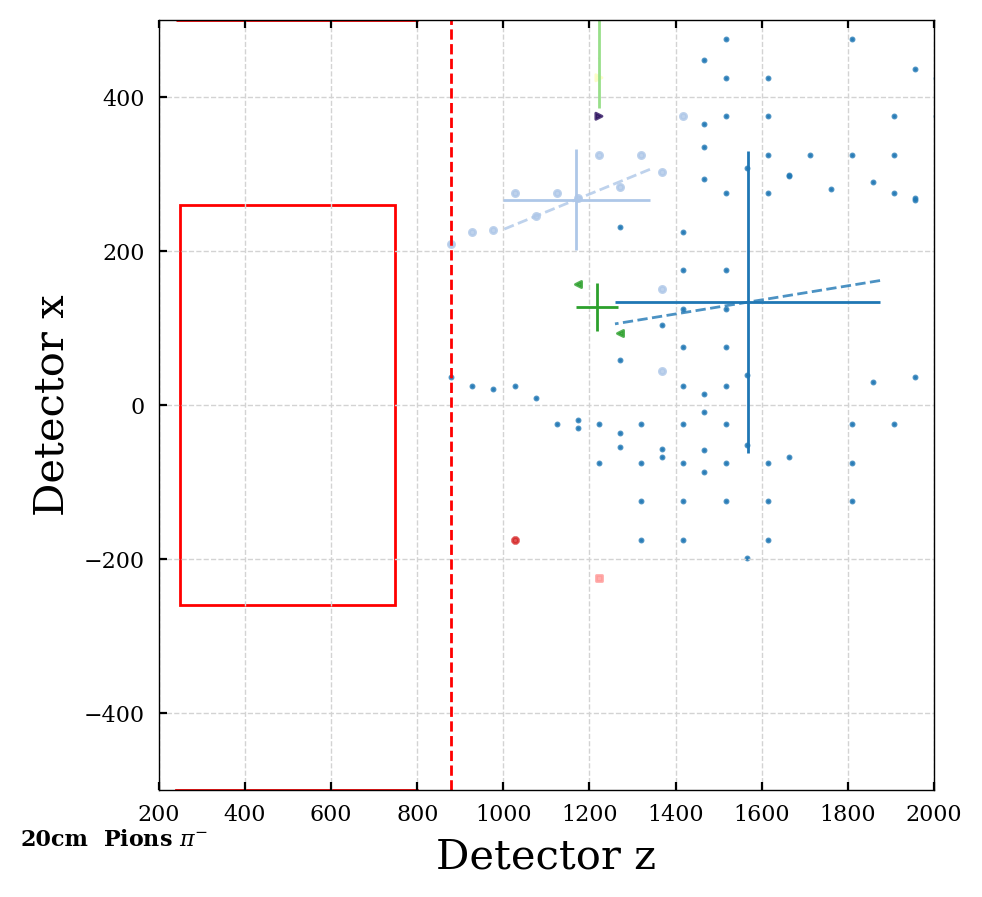

1


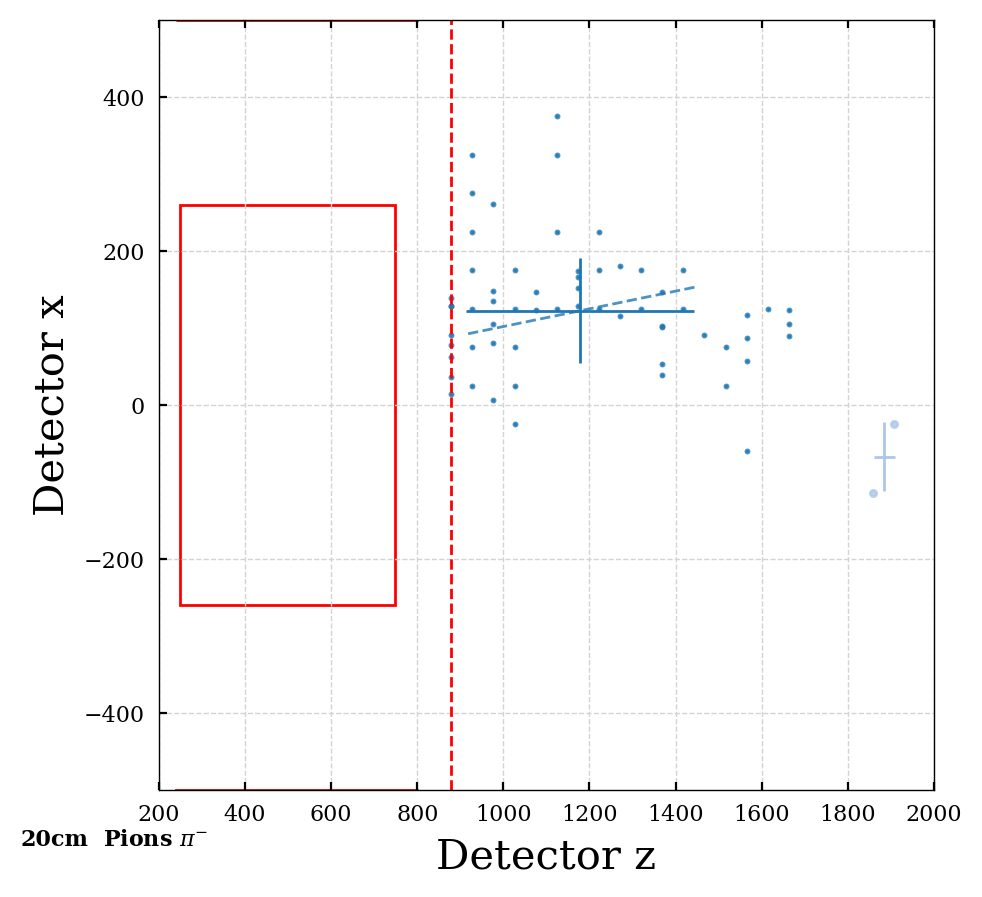

2


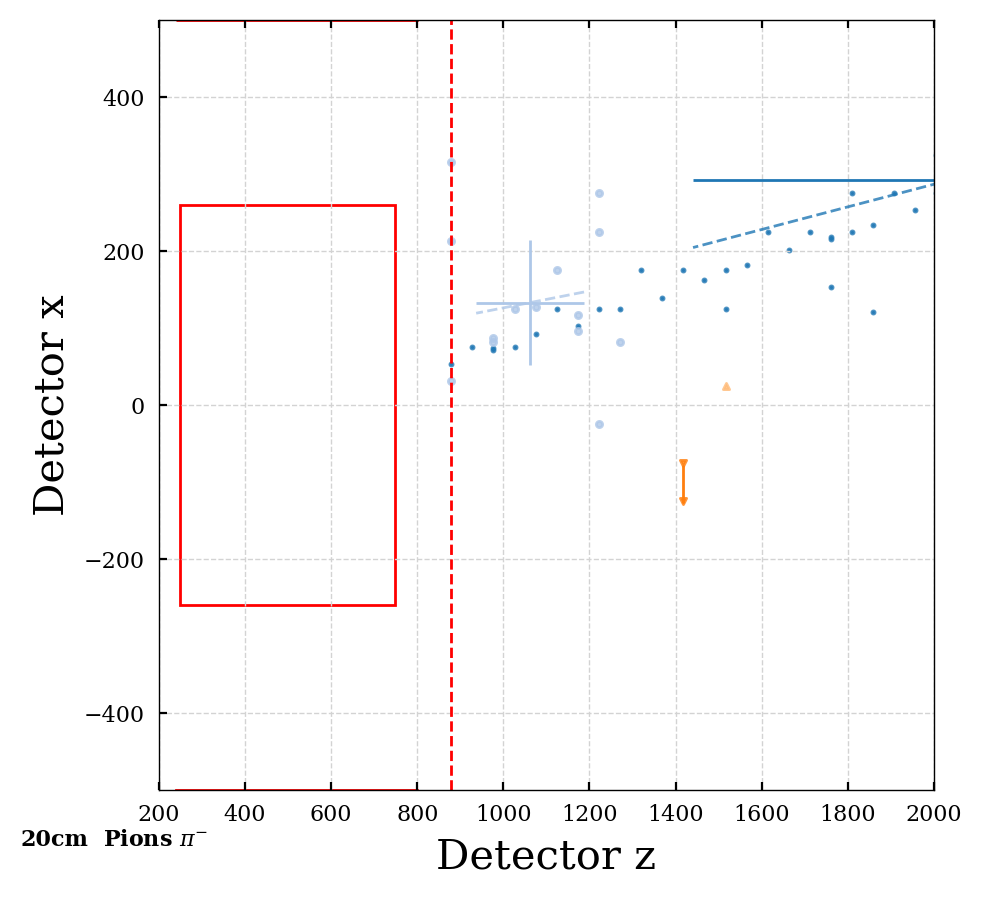

1


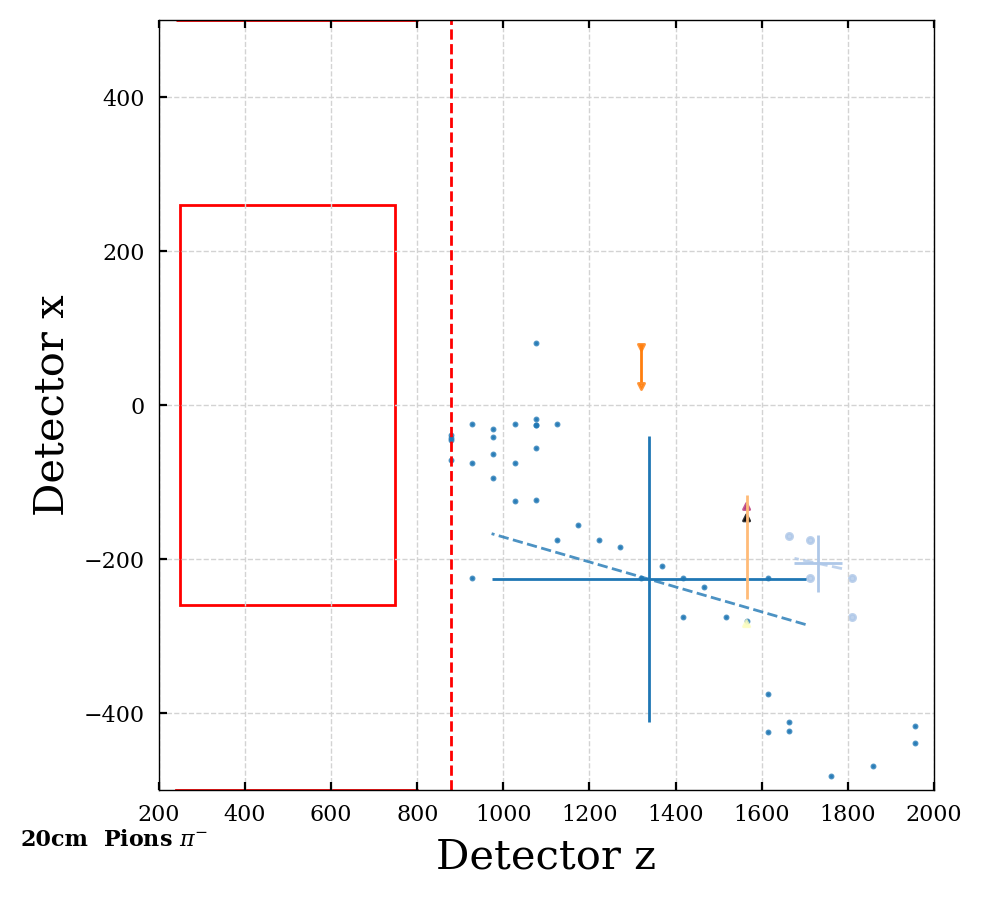

1


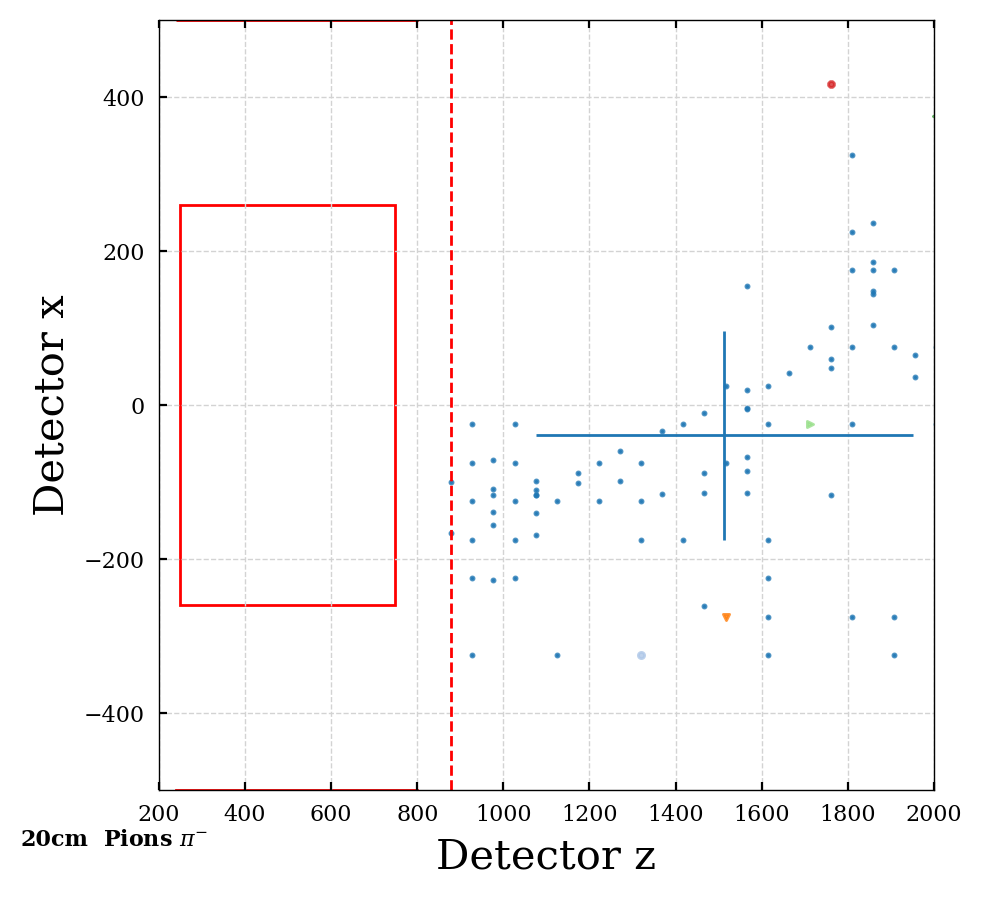

1


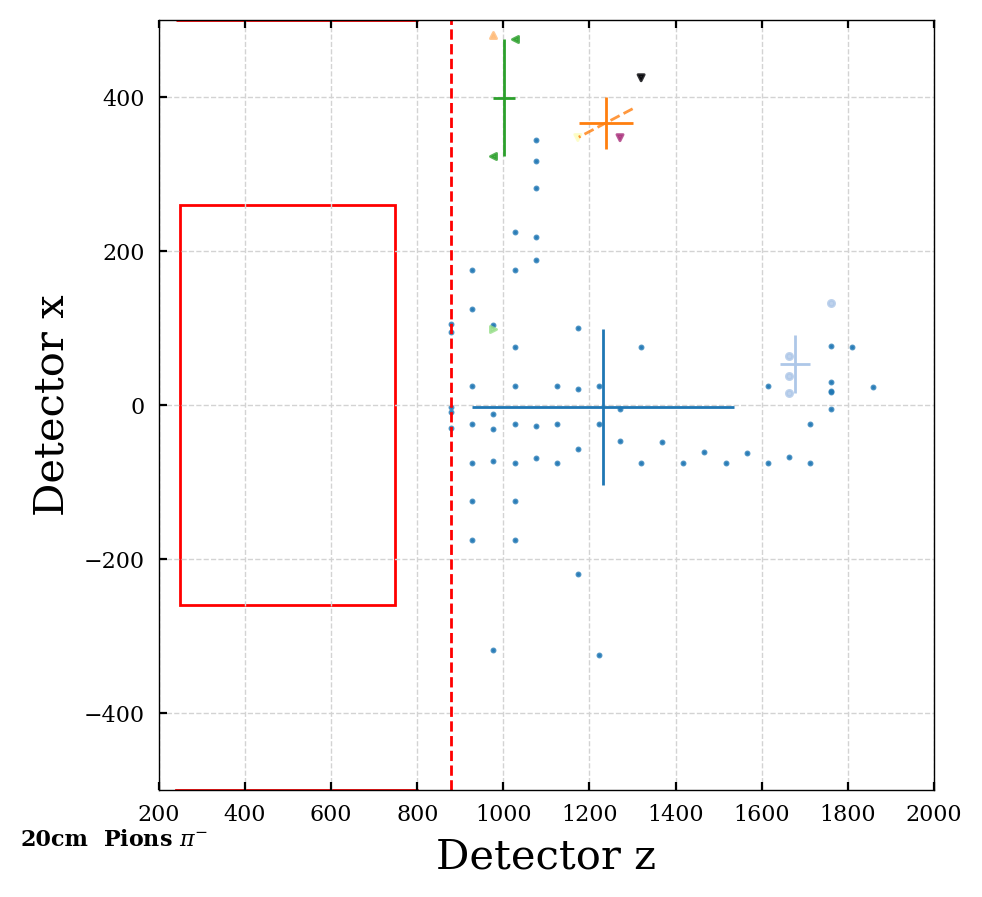

1


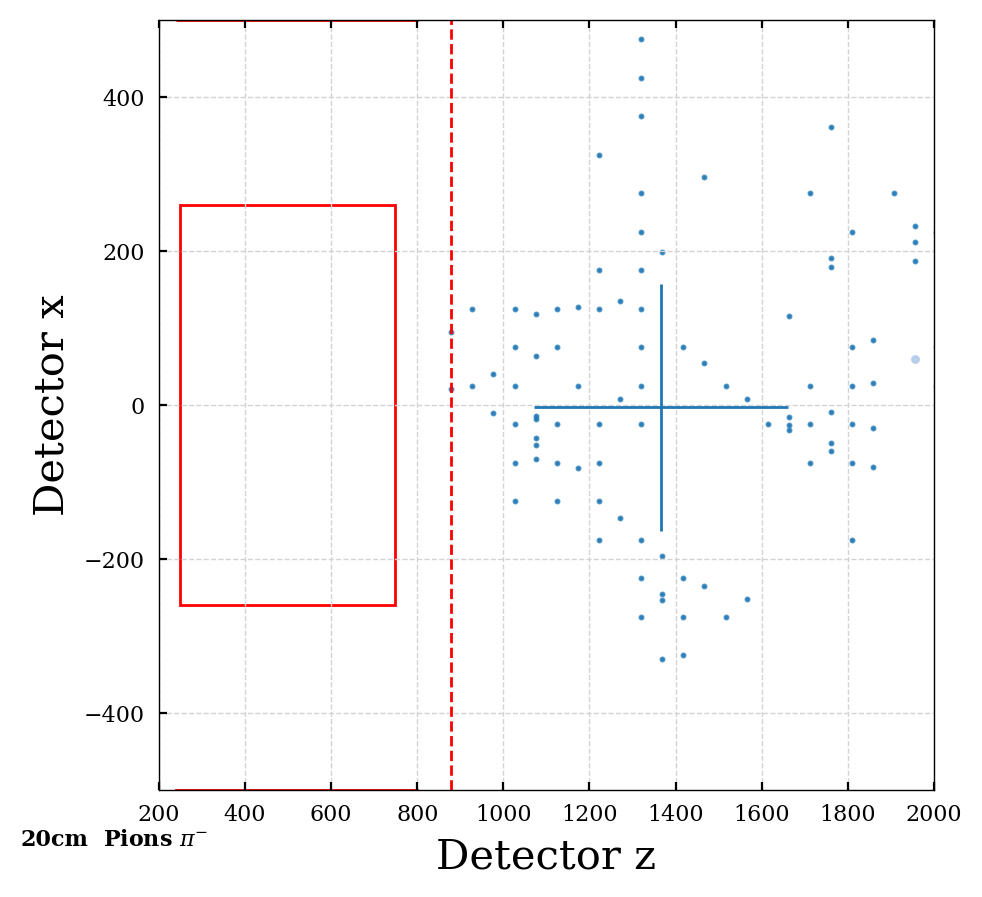

In [52]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='pions', ipart=None, xlim=5000, ylim=3000, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='pions', ipart=ipart, xlim=2000, ylim=500, angle_label=False)

### Neutrons

7


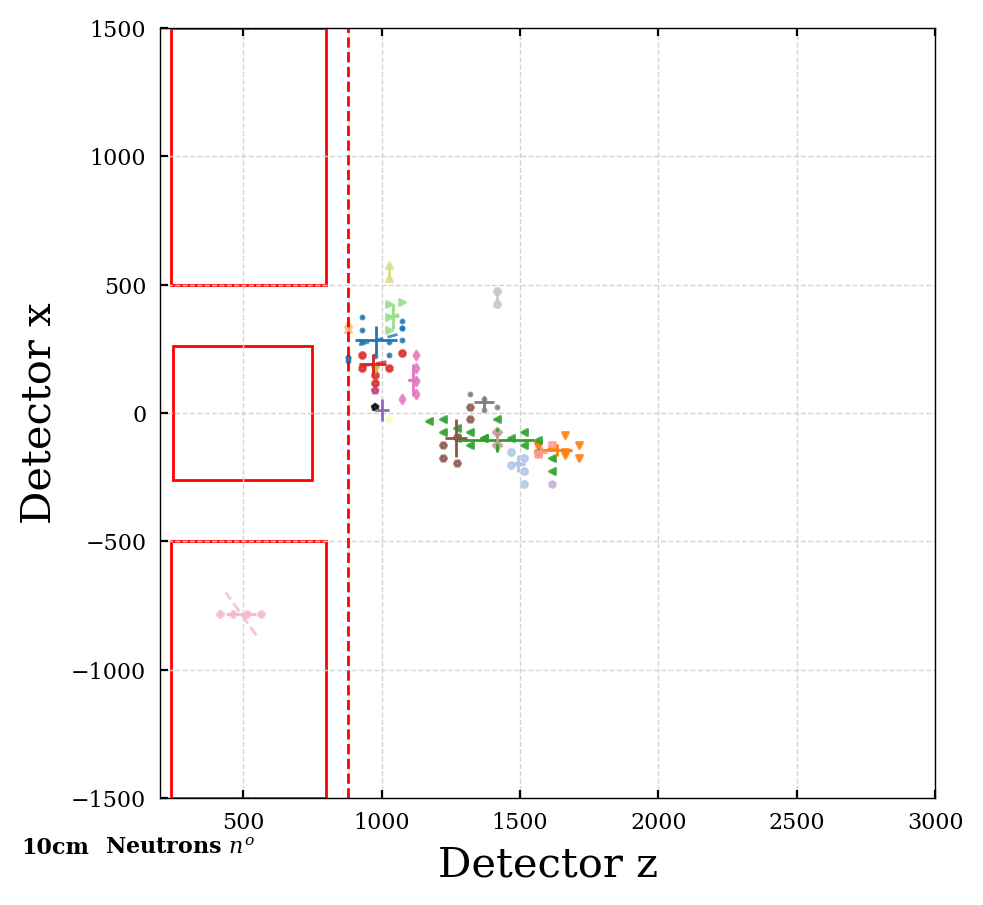

3


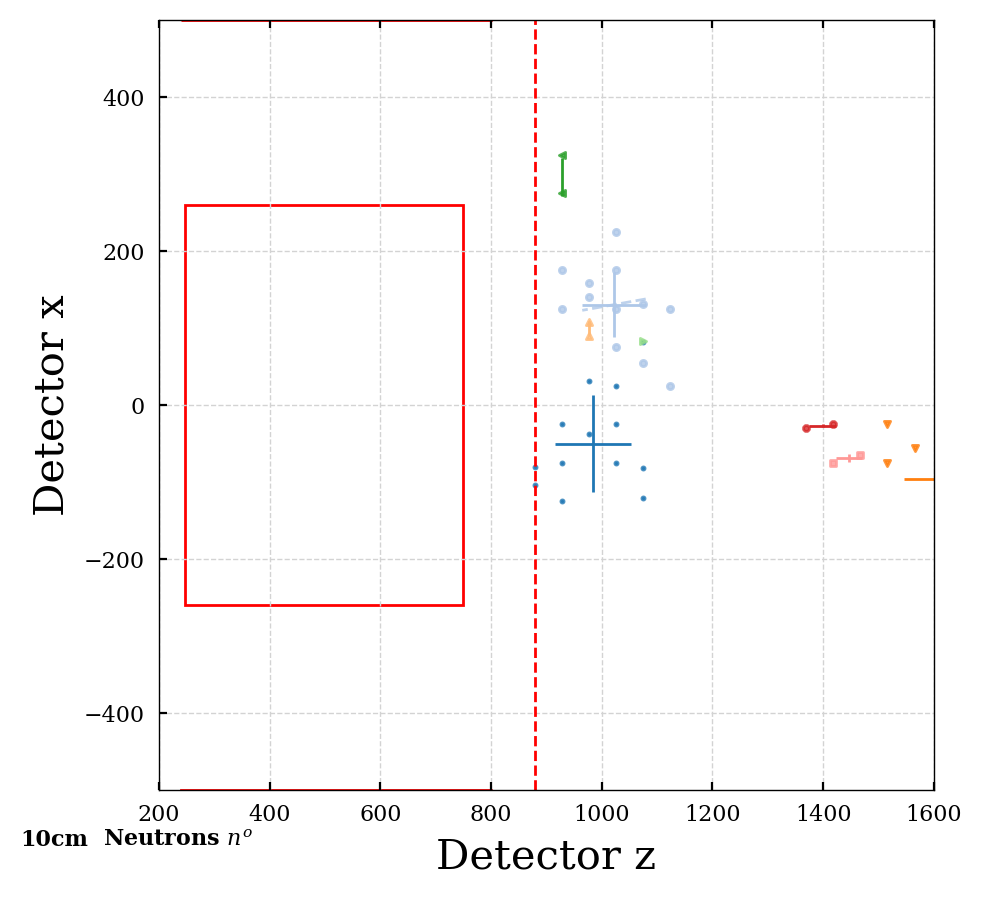

2


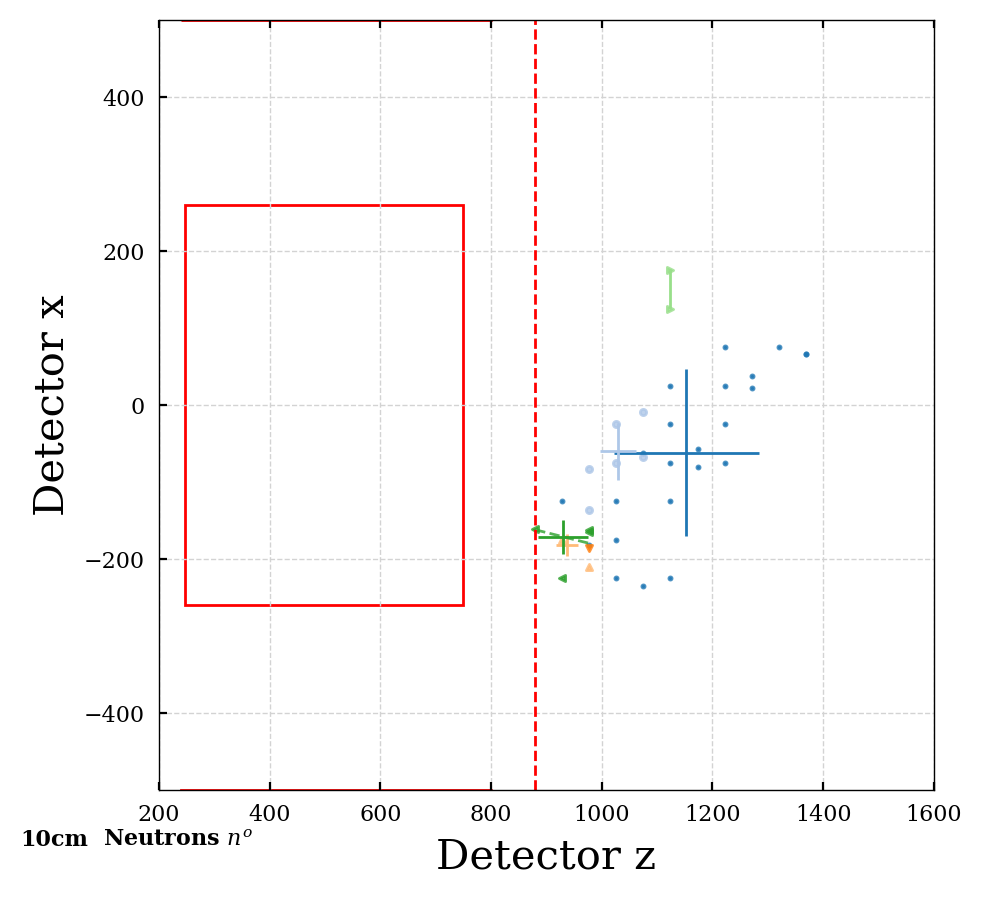

1


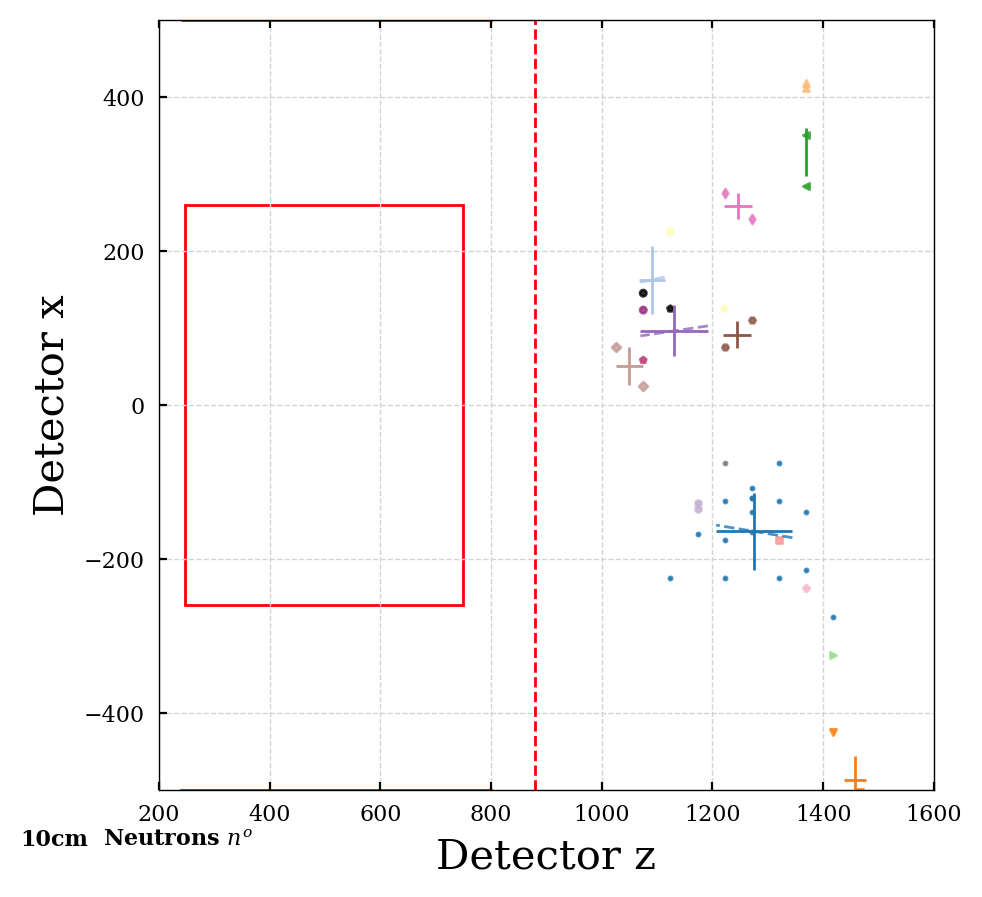

1


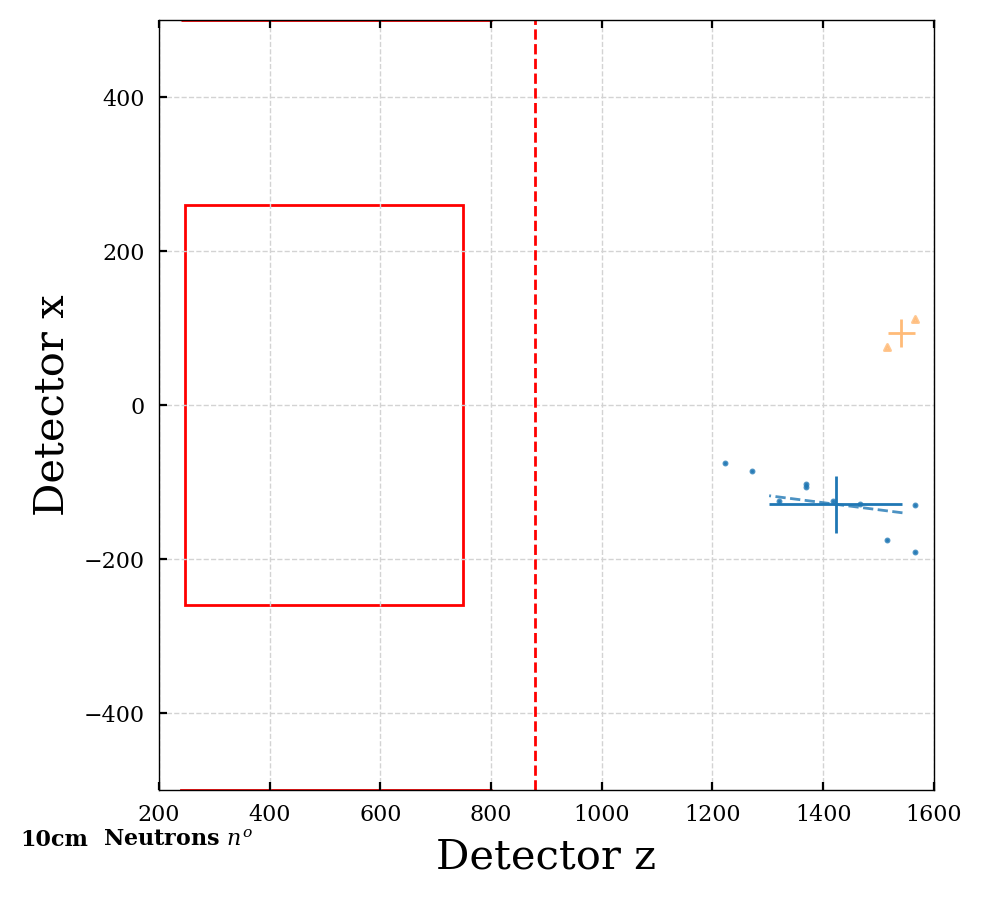

2


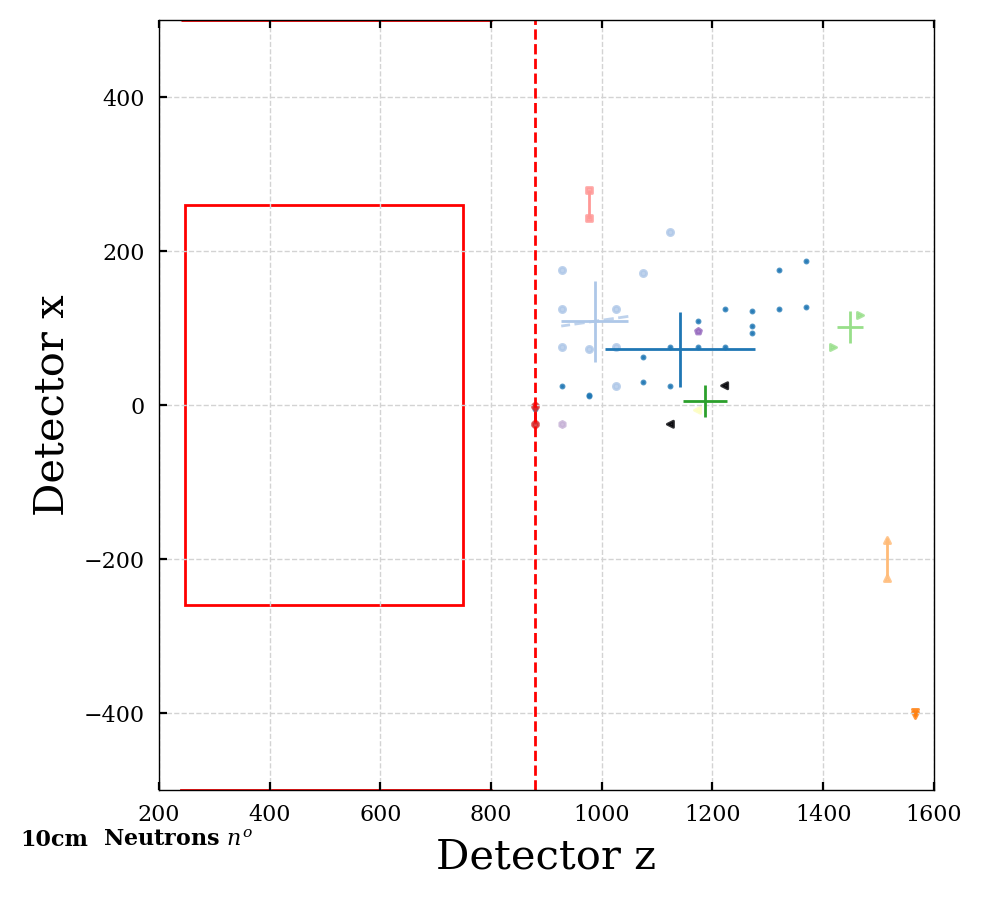

1


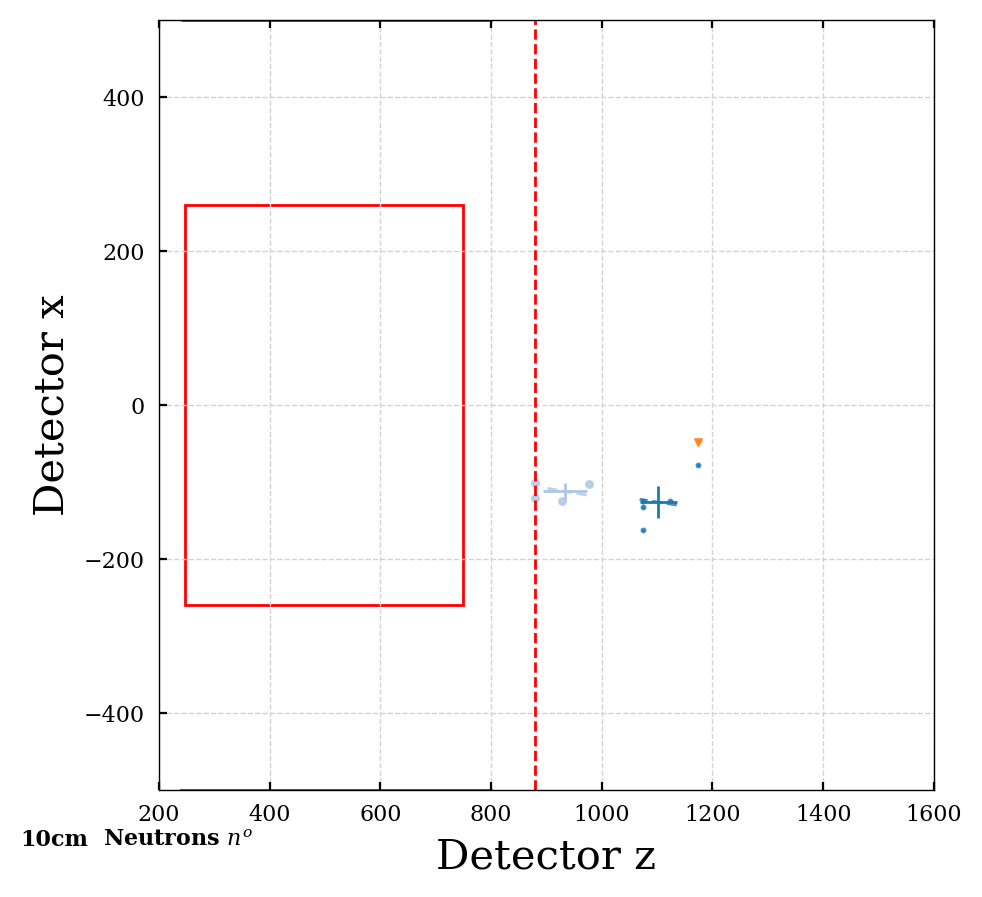

1


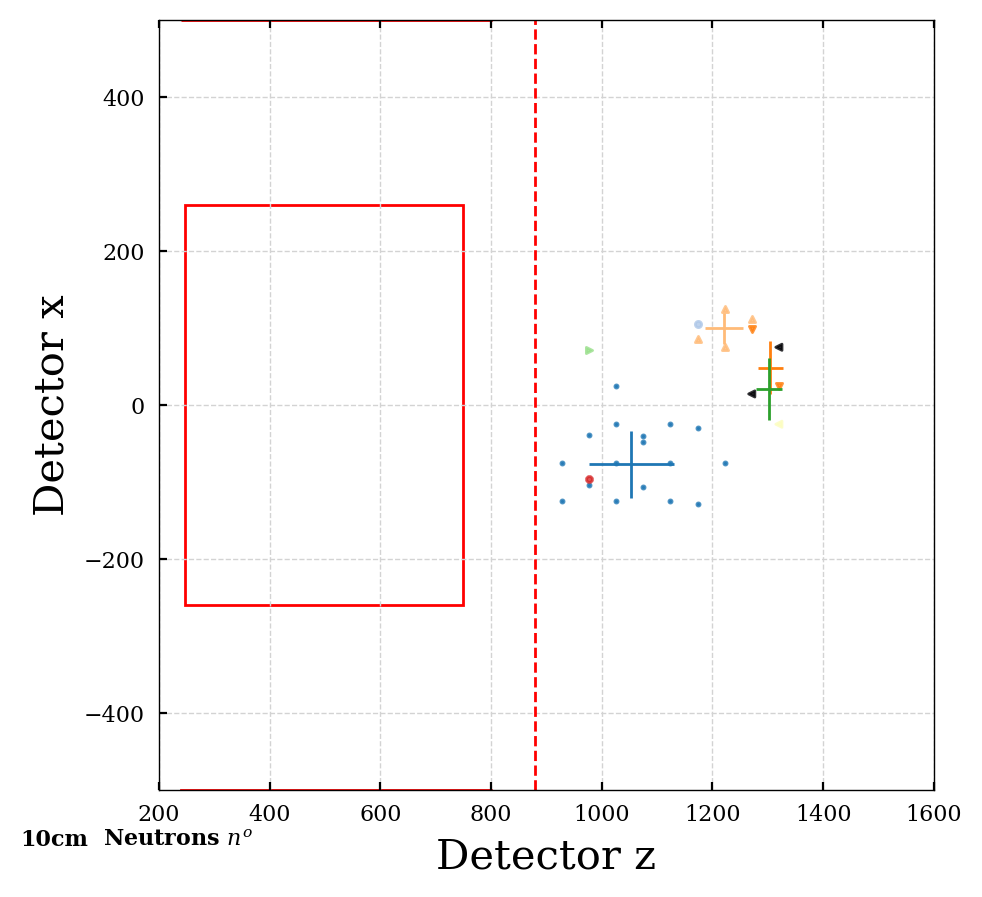

3


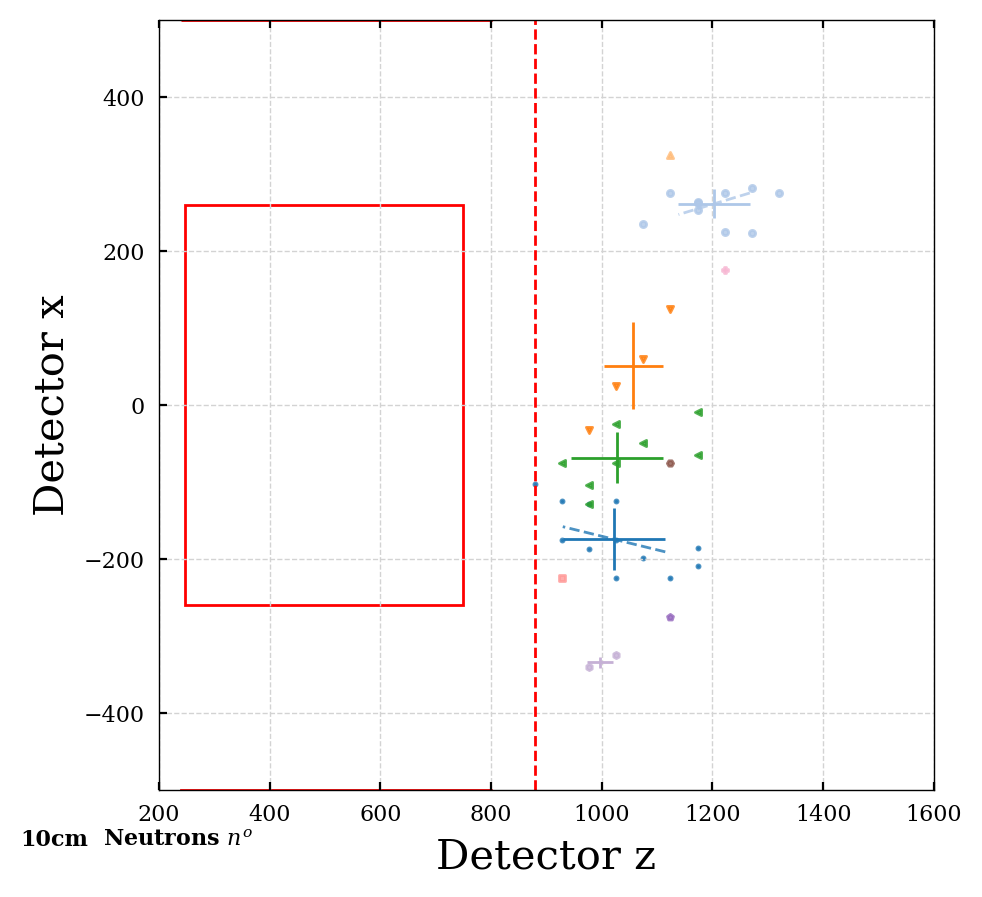

1


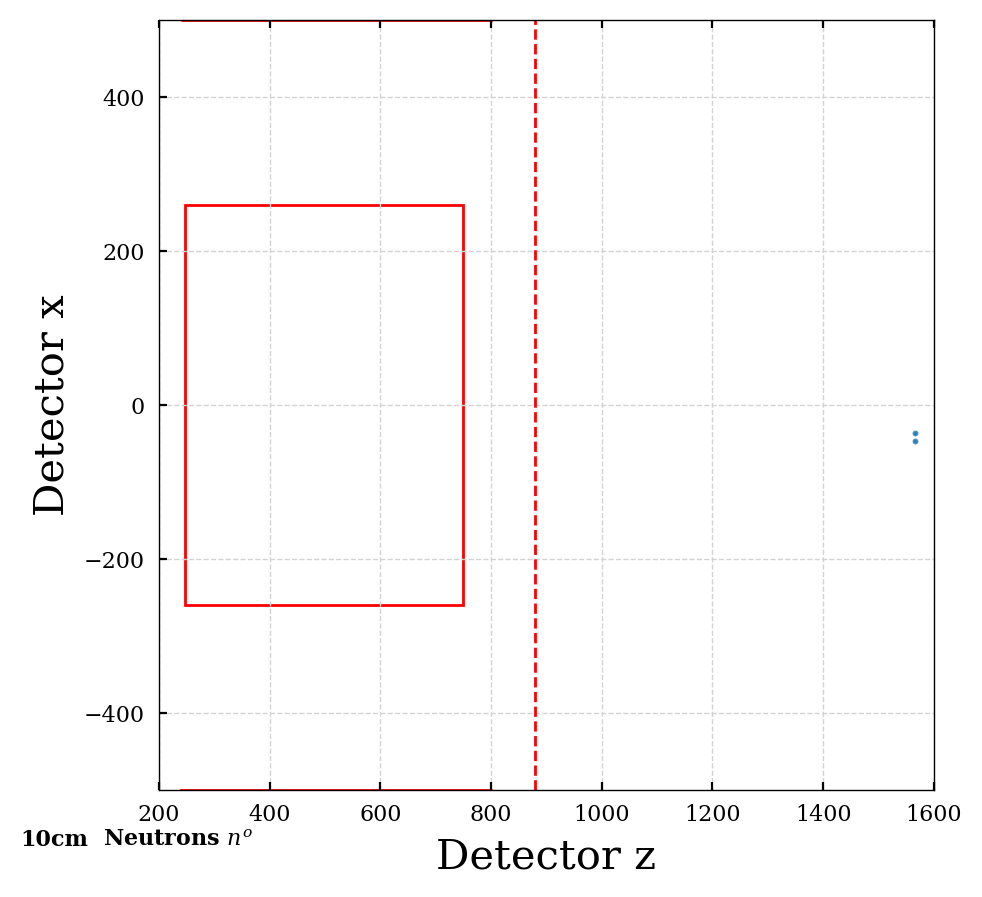

2


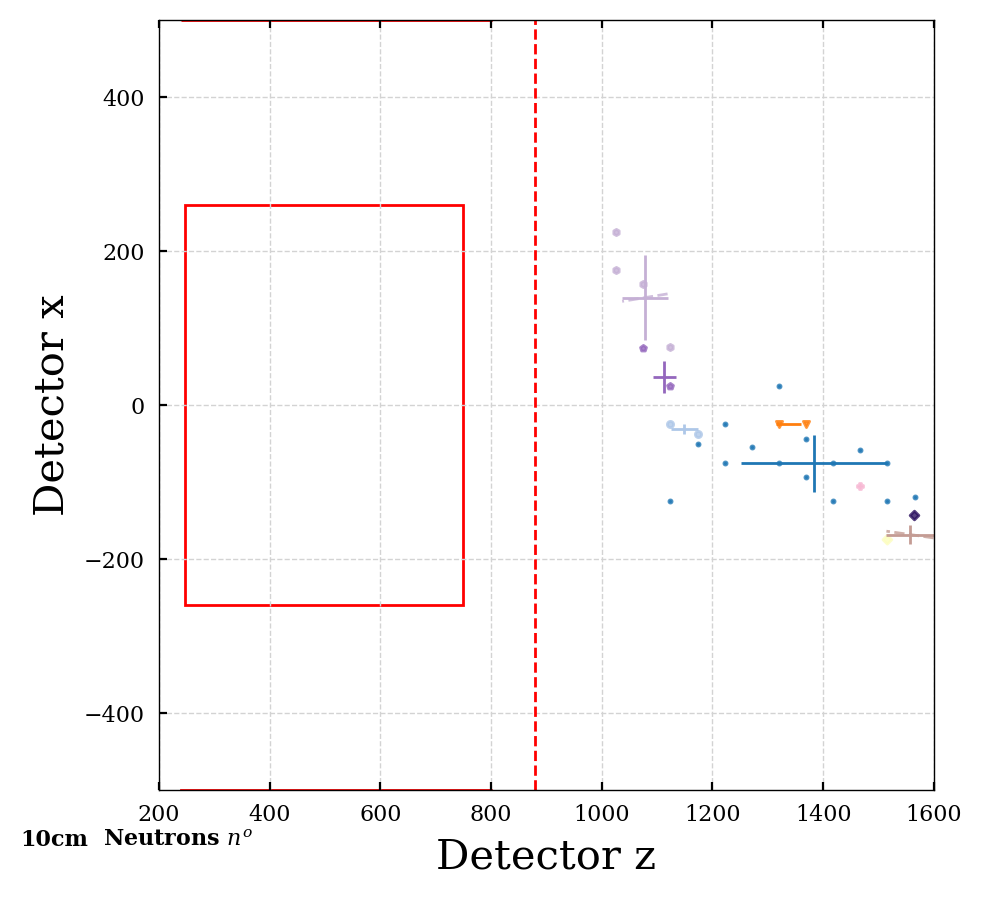

In [53]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='neutrons', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='neutrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

5


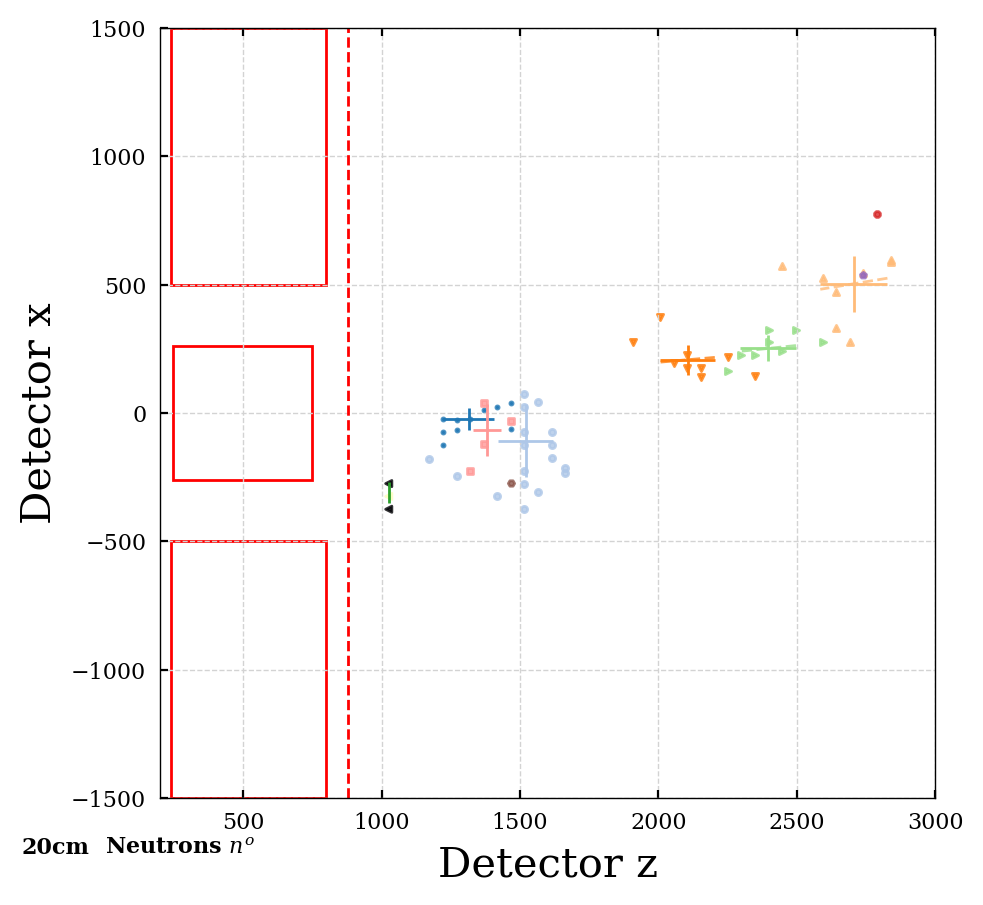

1


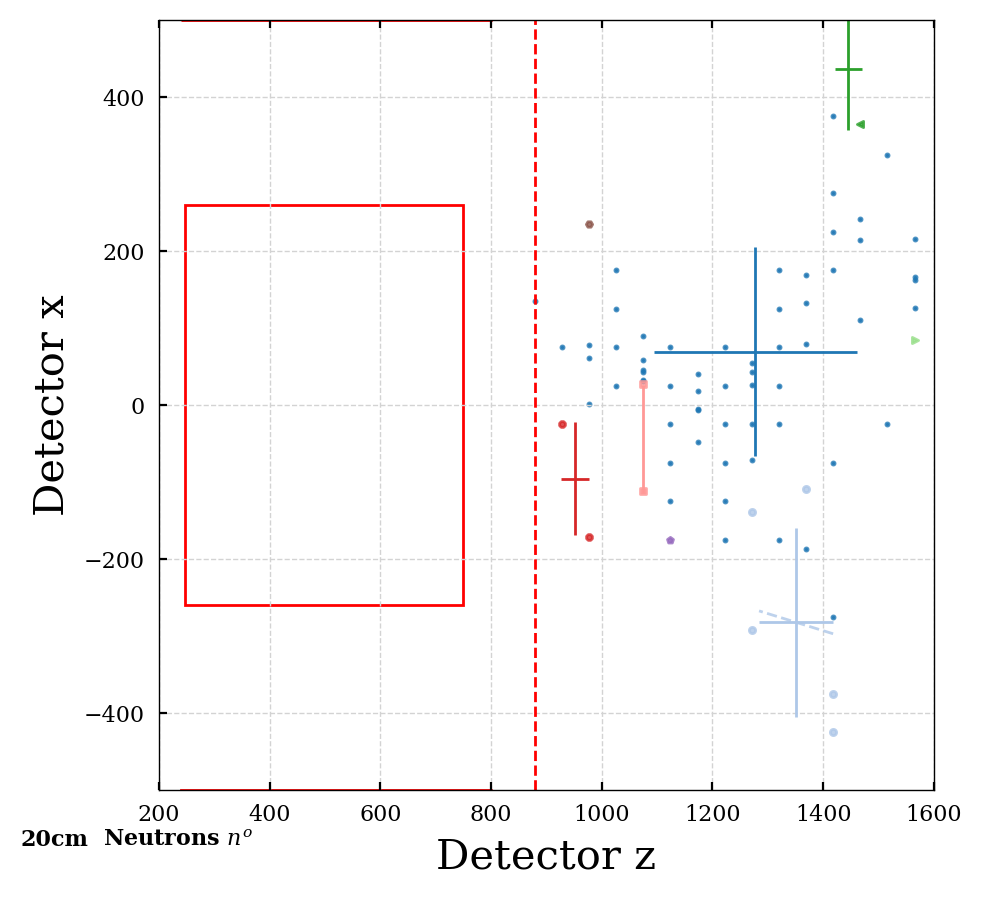

1


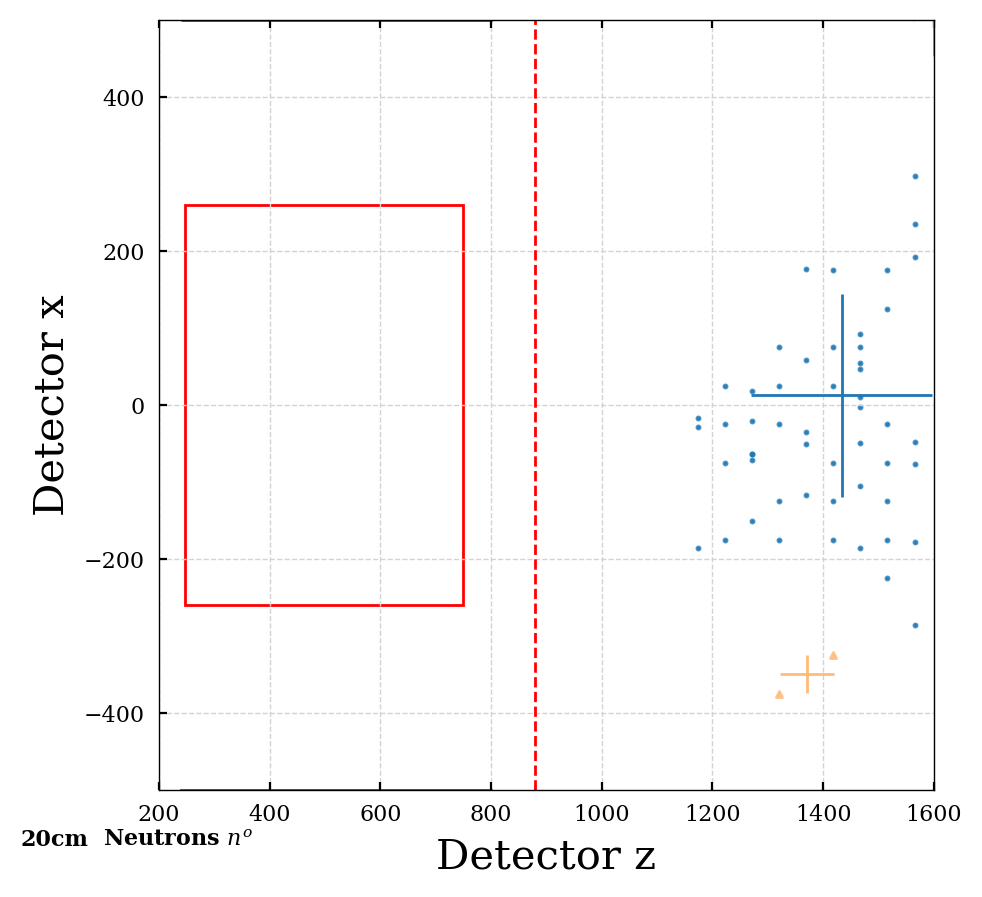

1


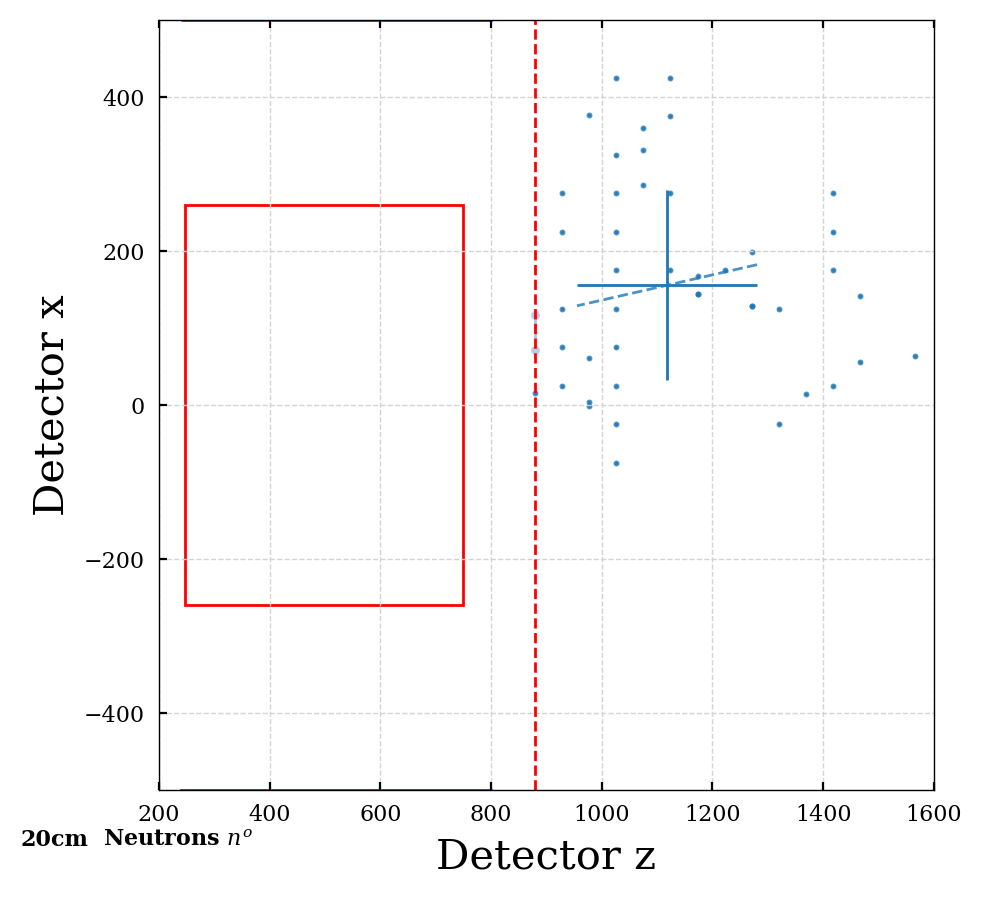

2


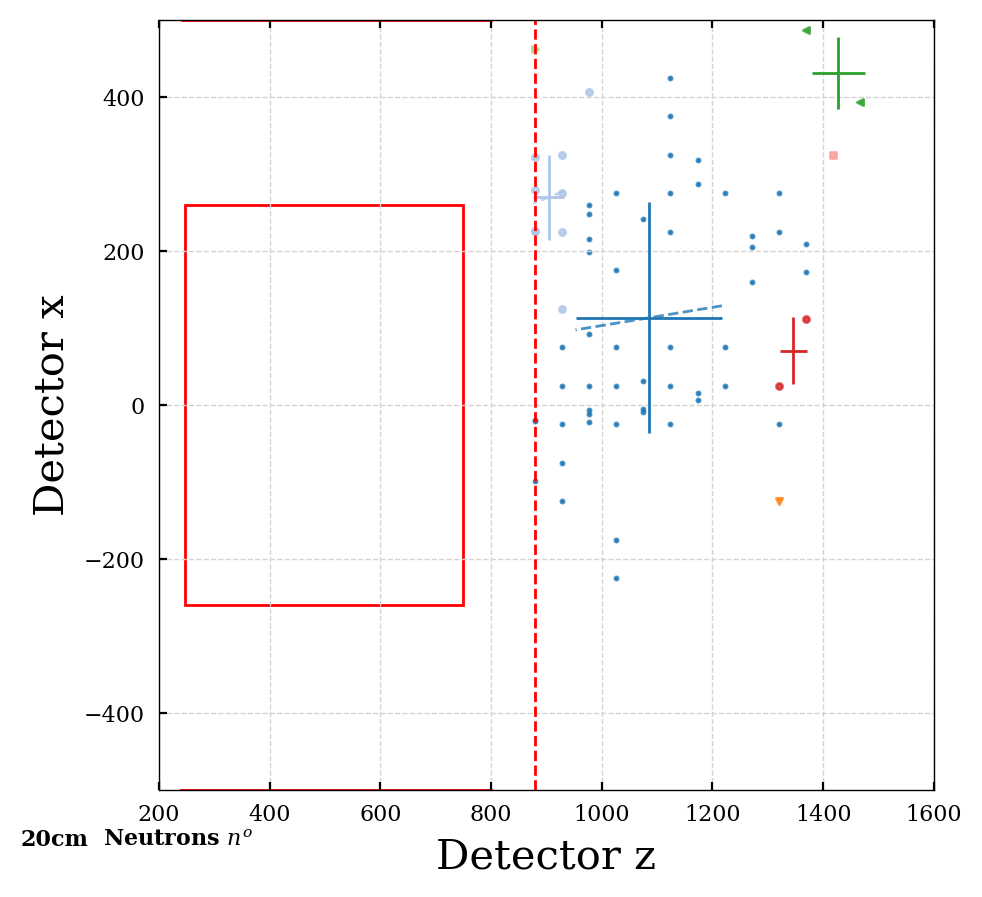

1


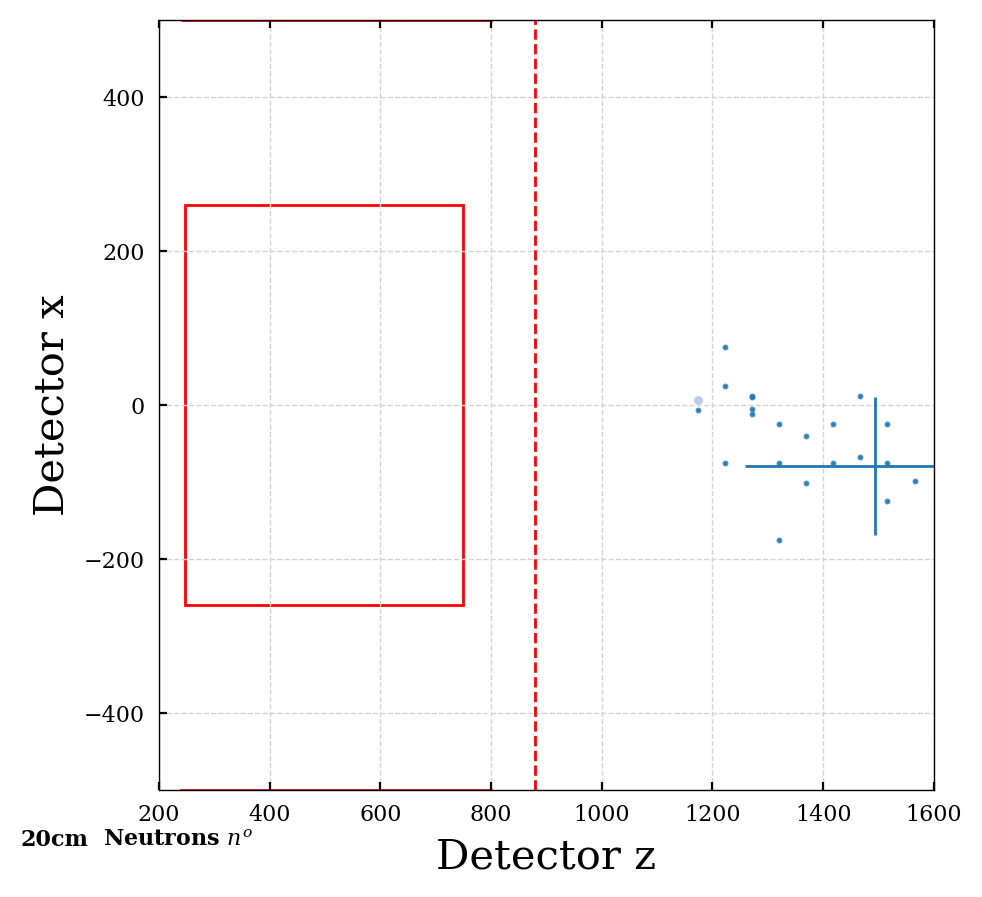

0


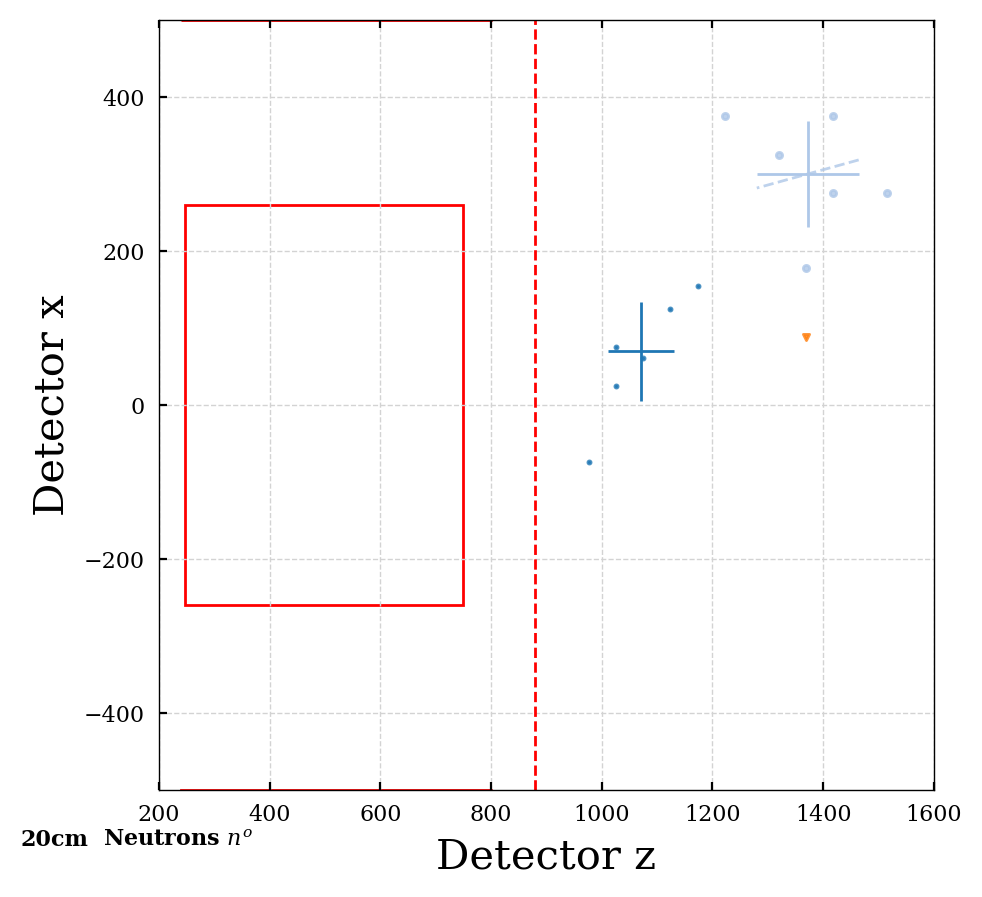

1


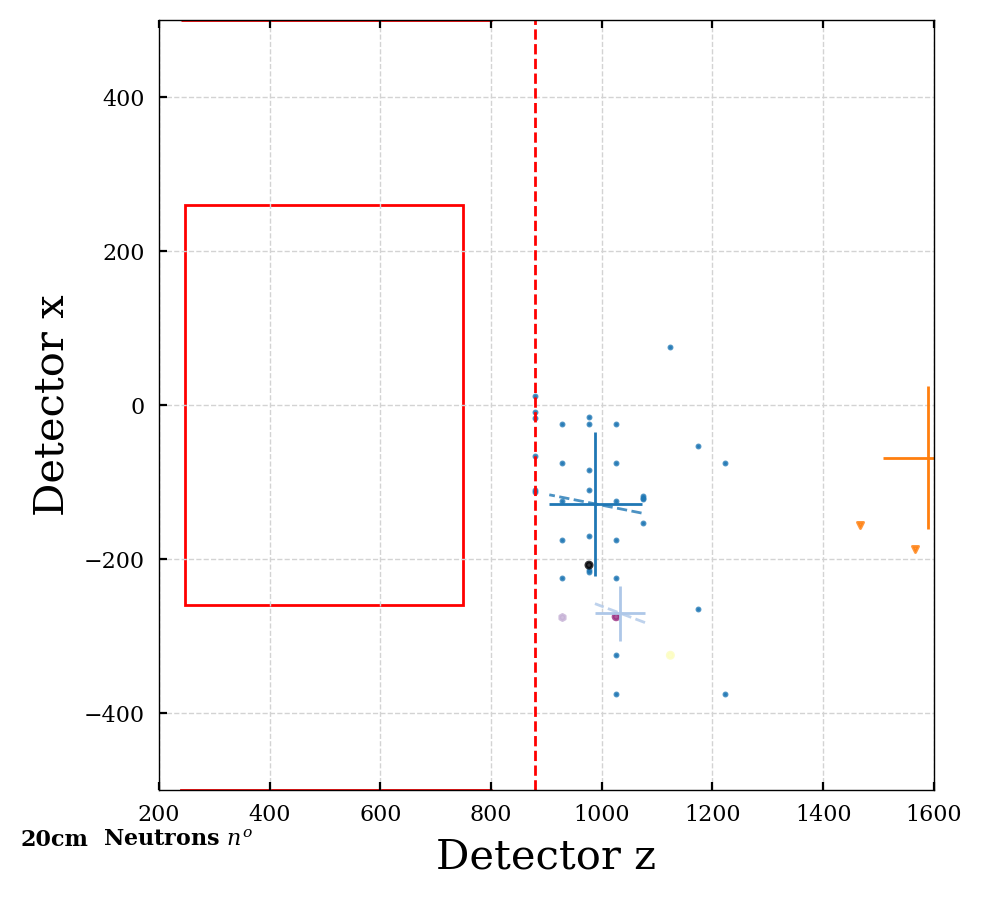

1


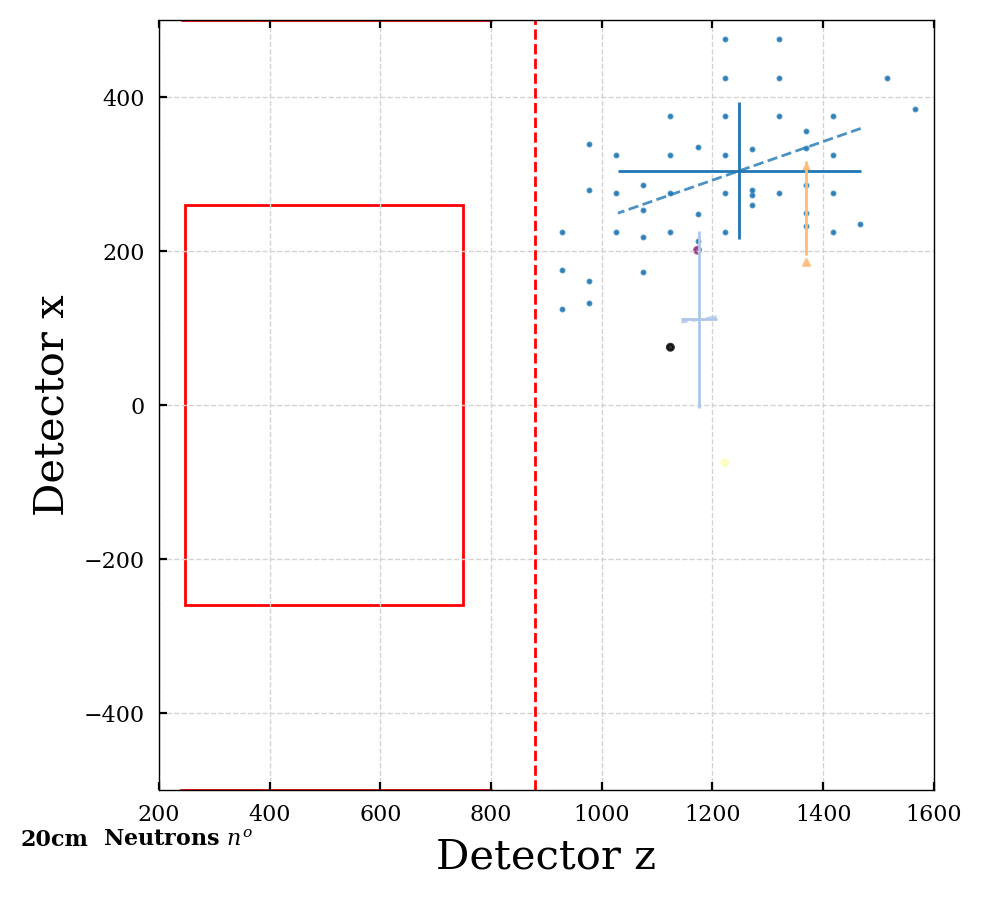

1


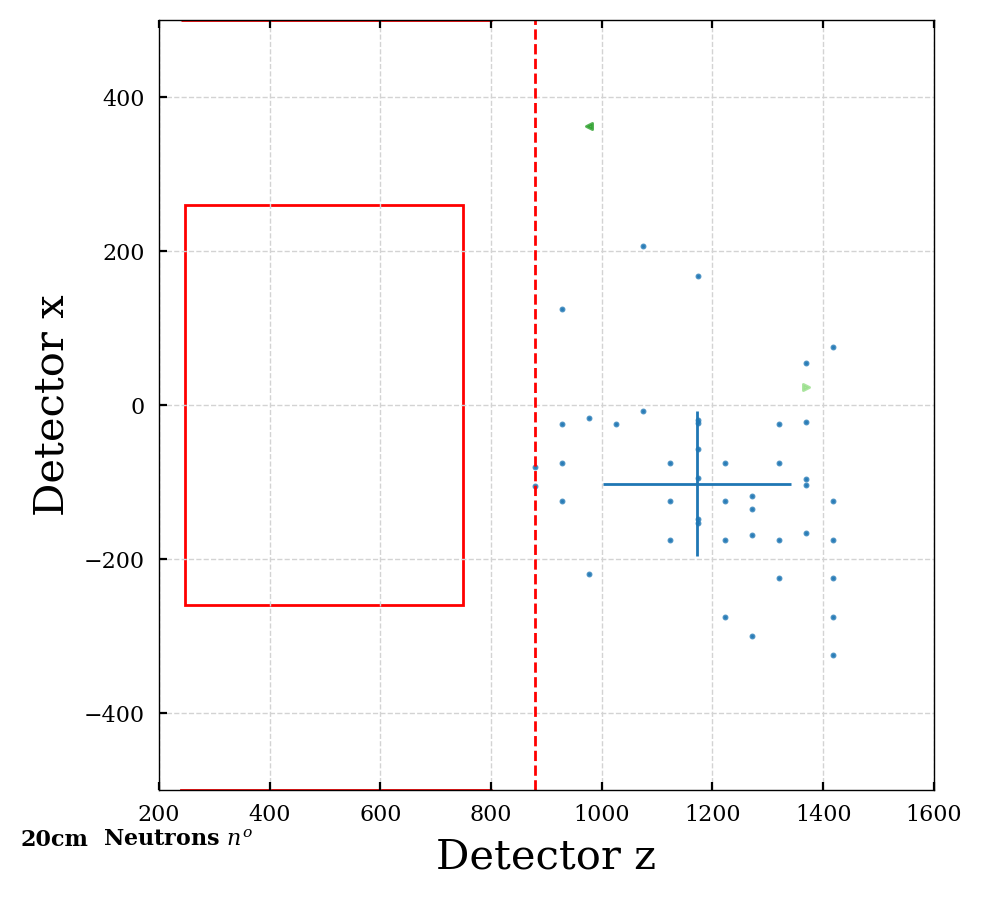

1


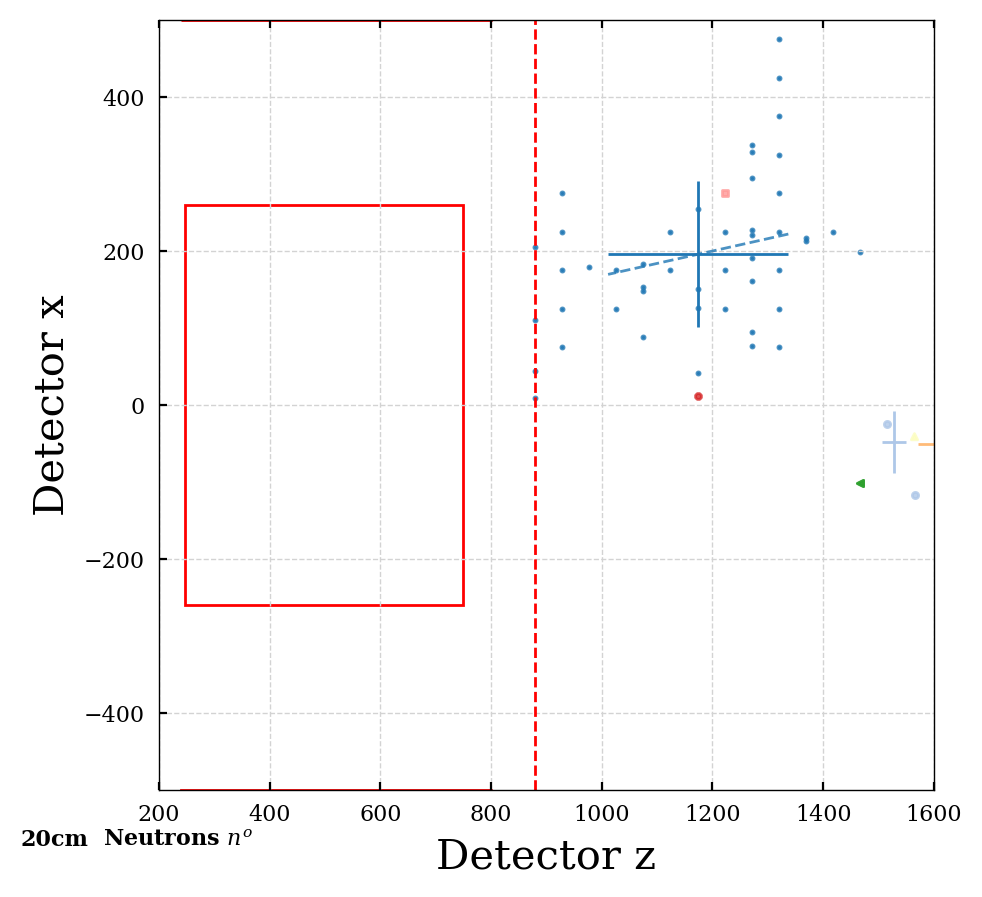

In [54]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='neutrons', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='neutrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Protons

8


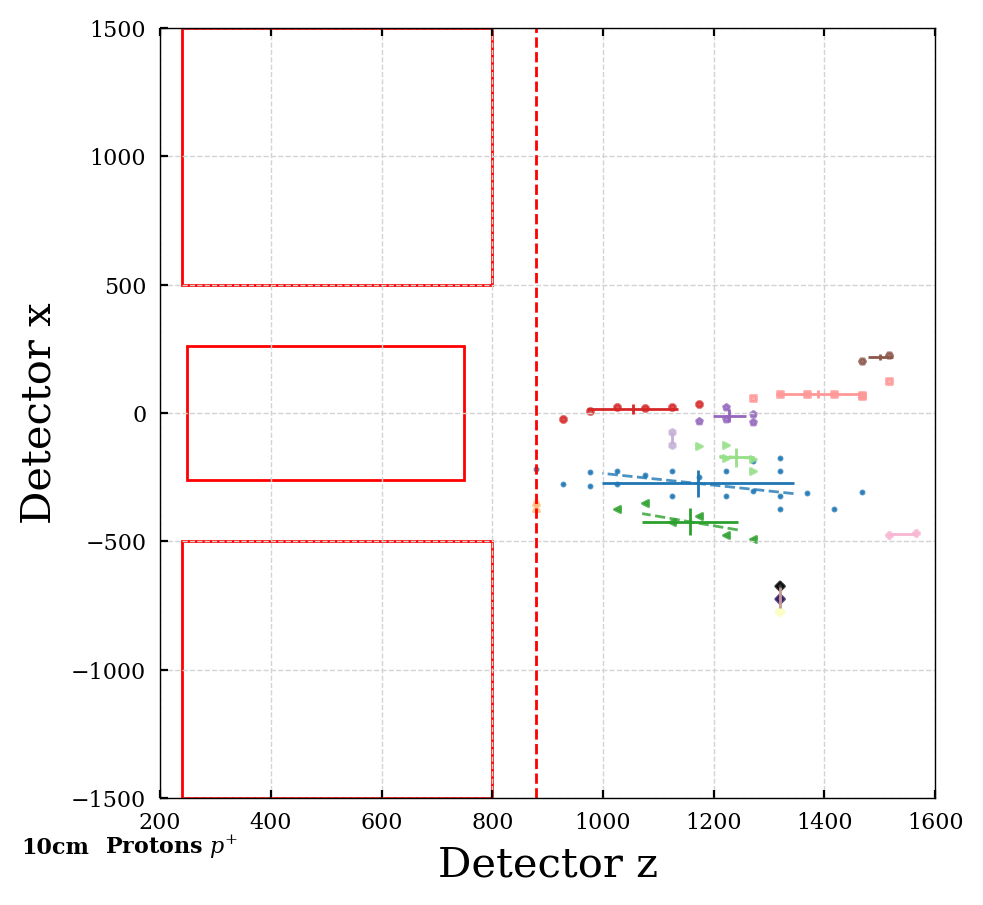

3


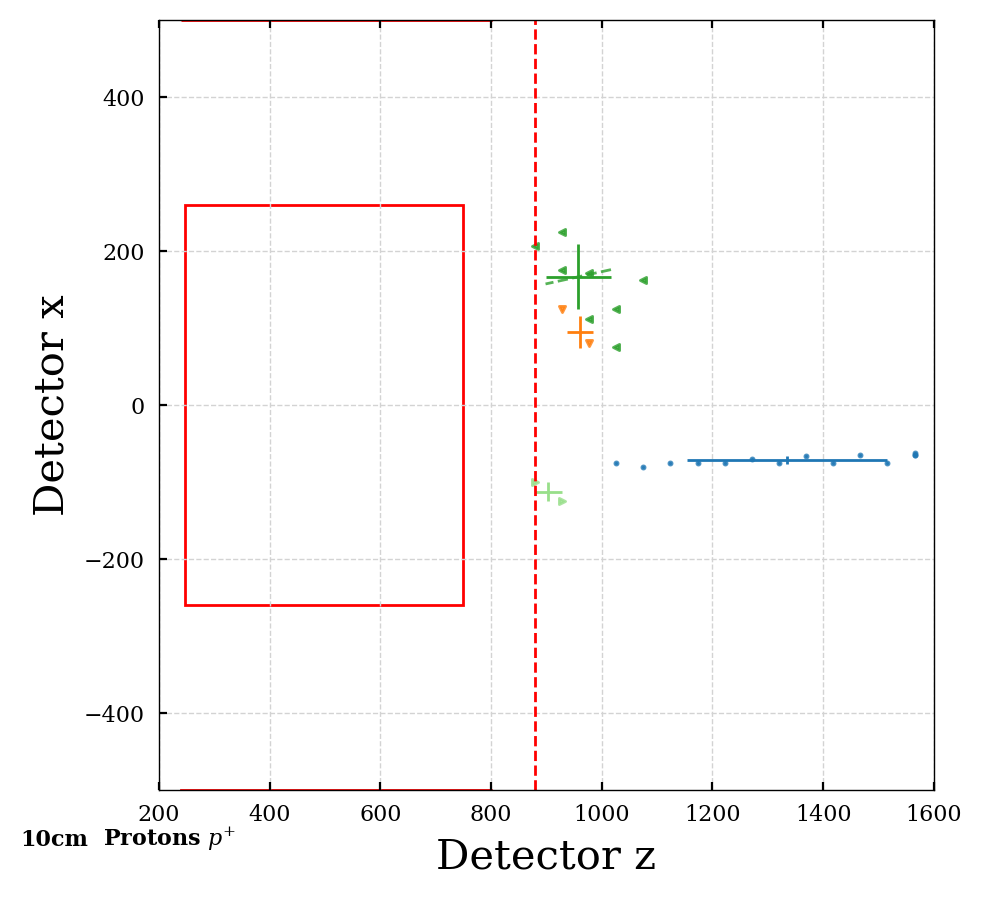

1


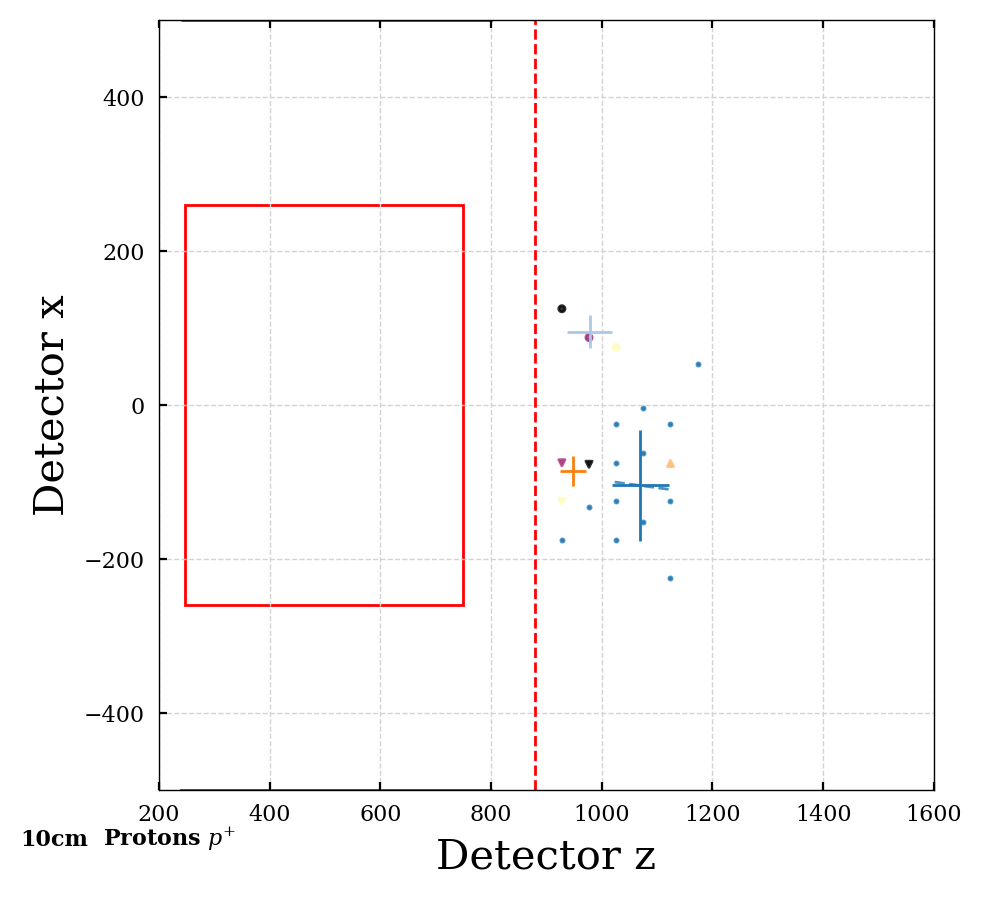

3


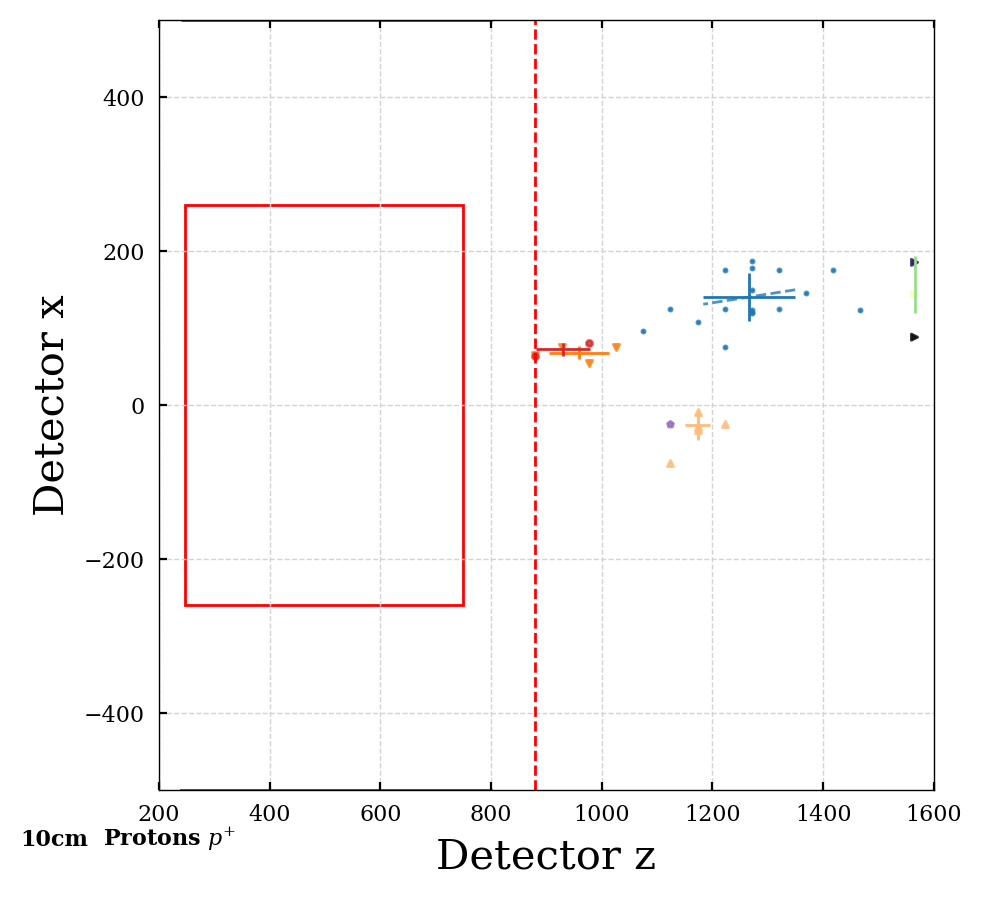

2


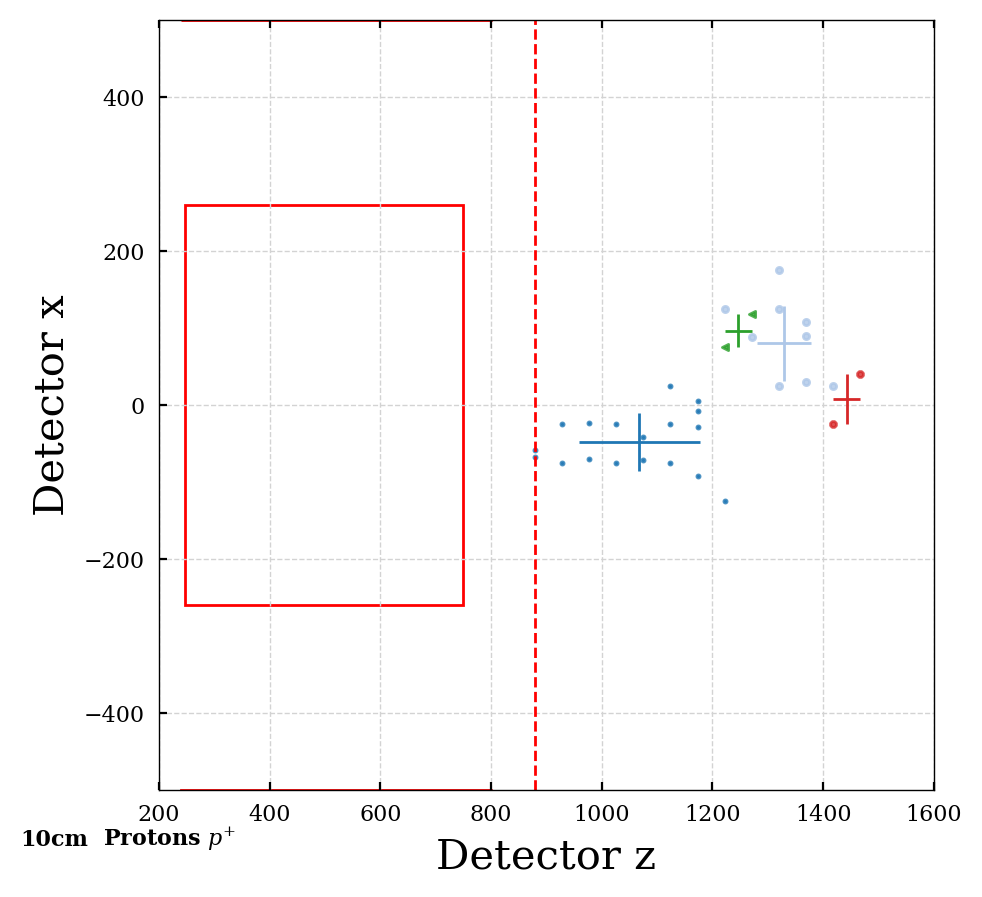

2


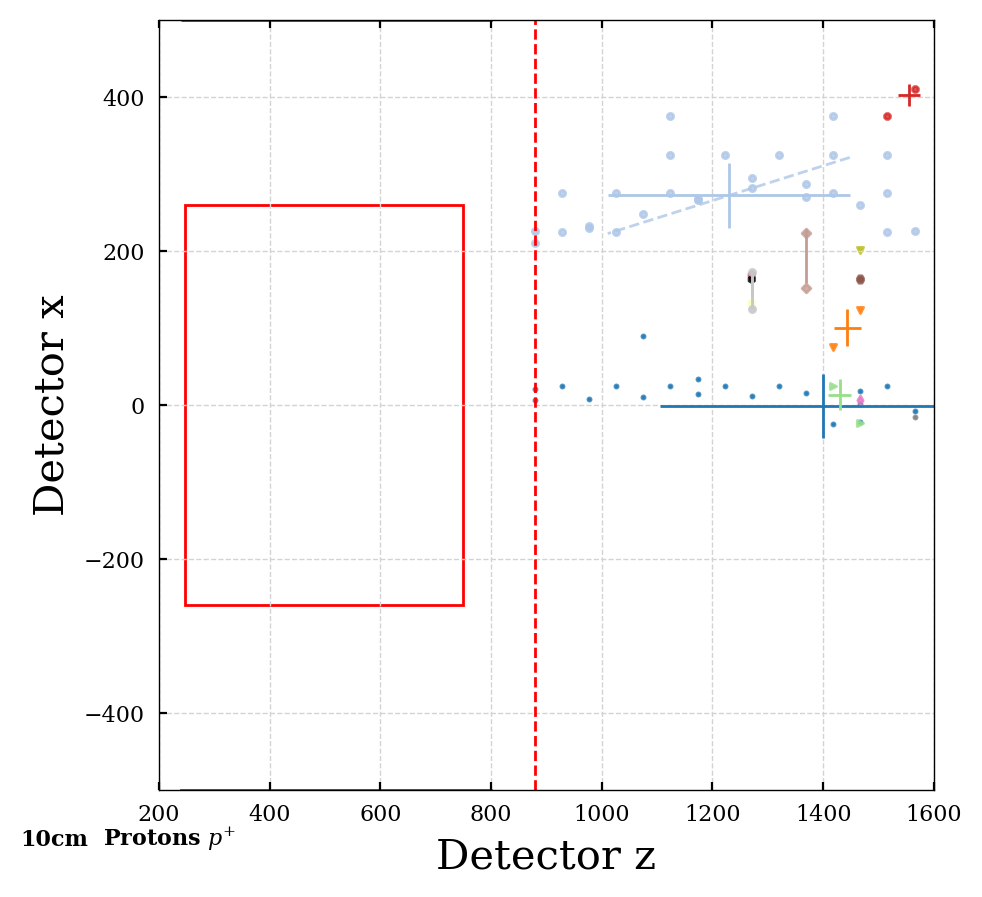

4


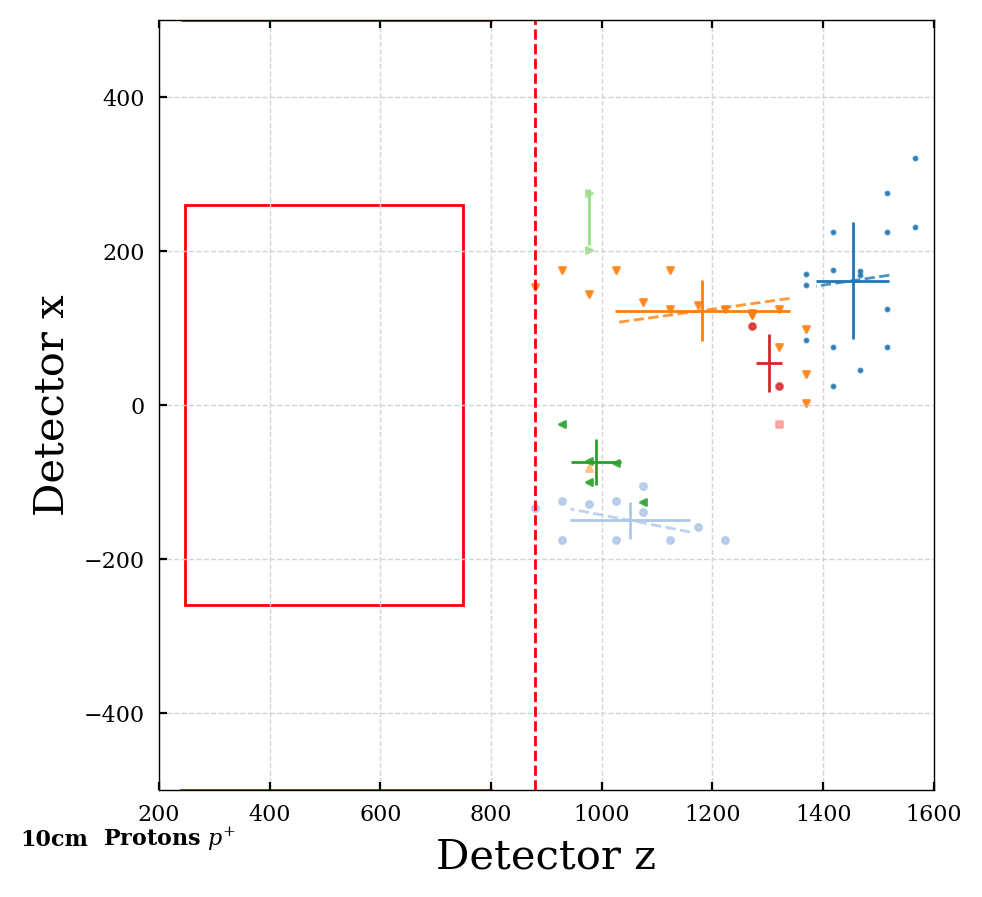

2


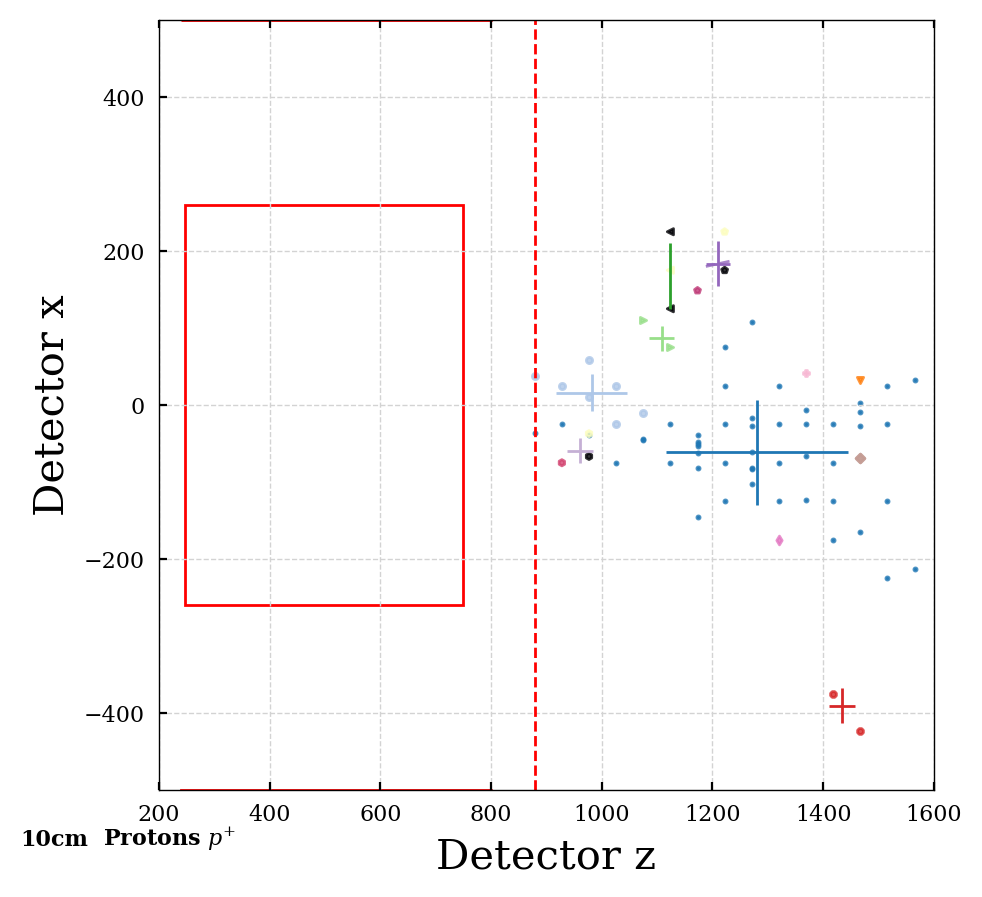

1


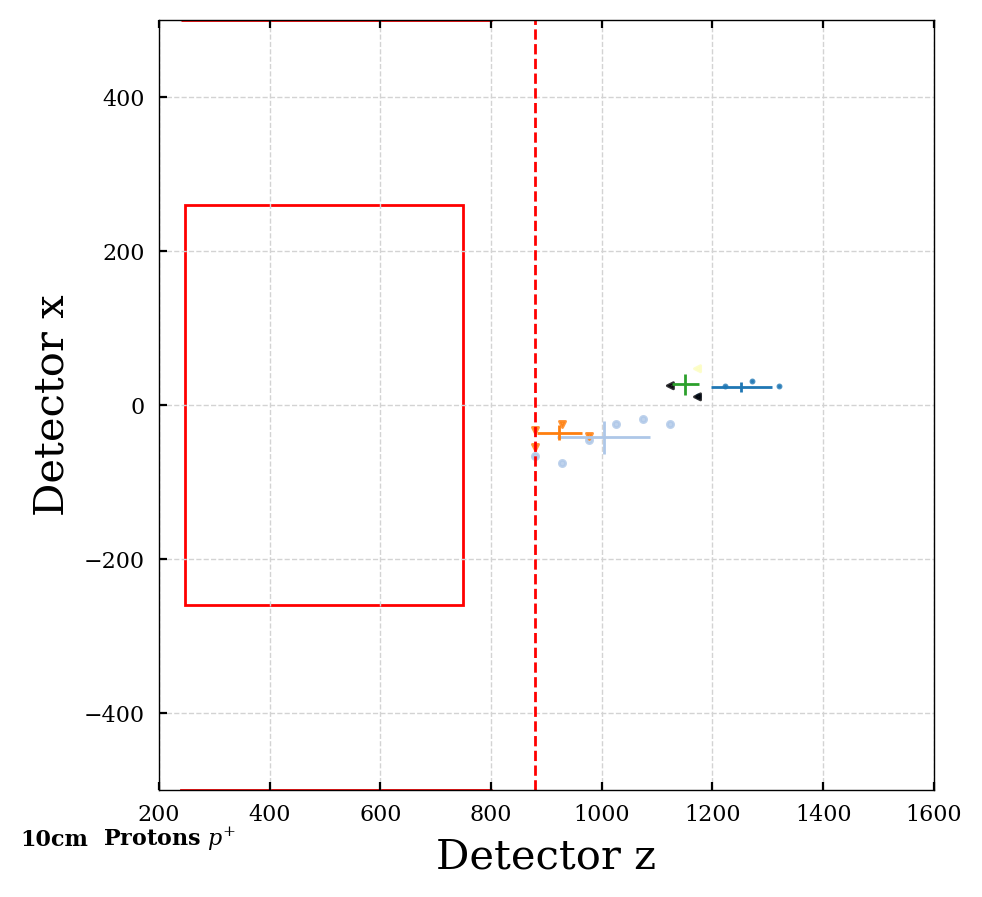

1


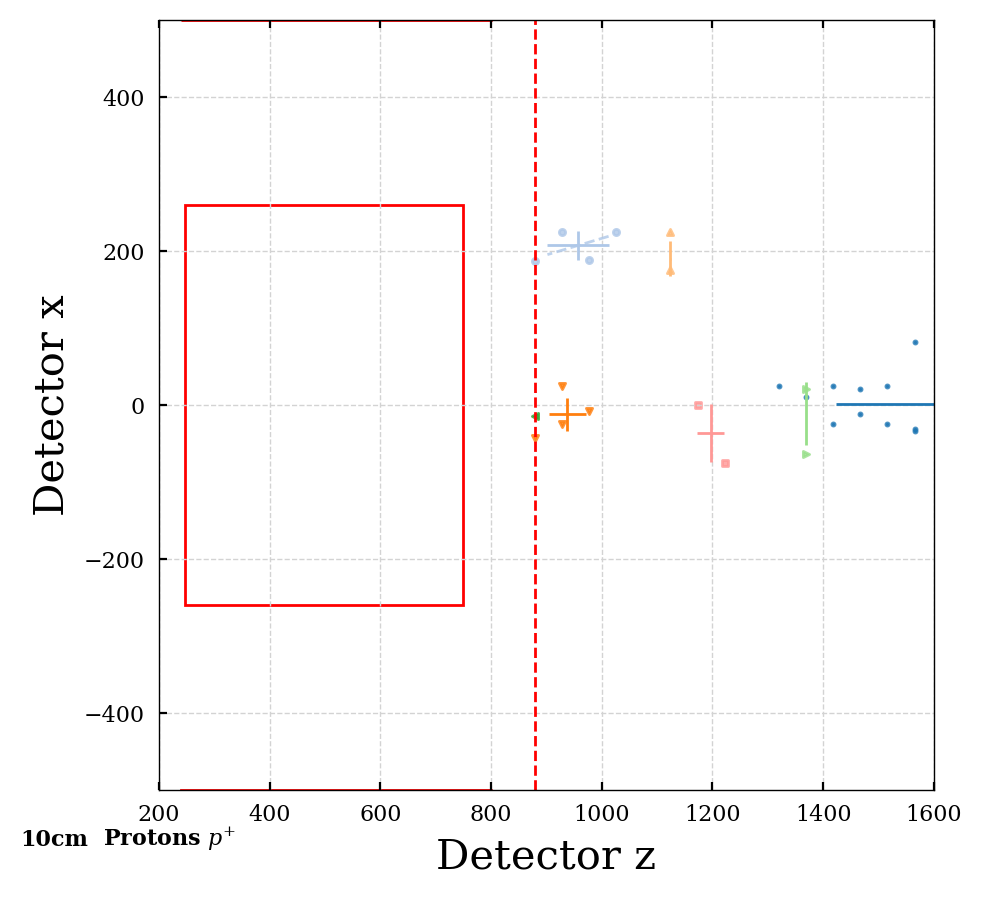

1


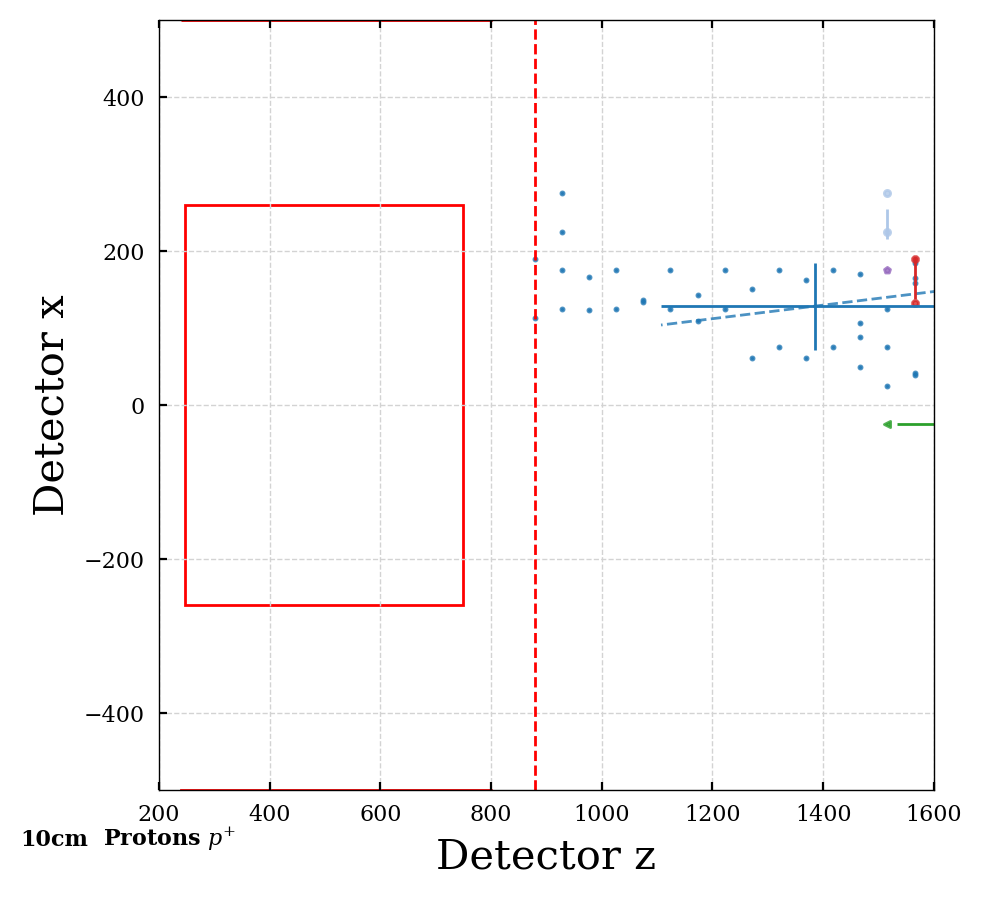

In [55]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='protons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='protons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

5


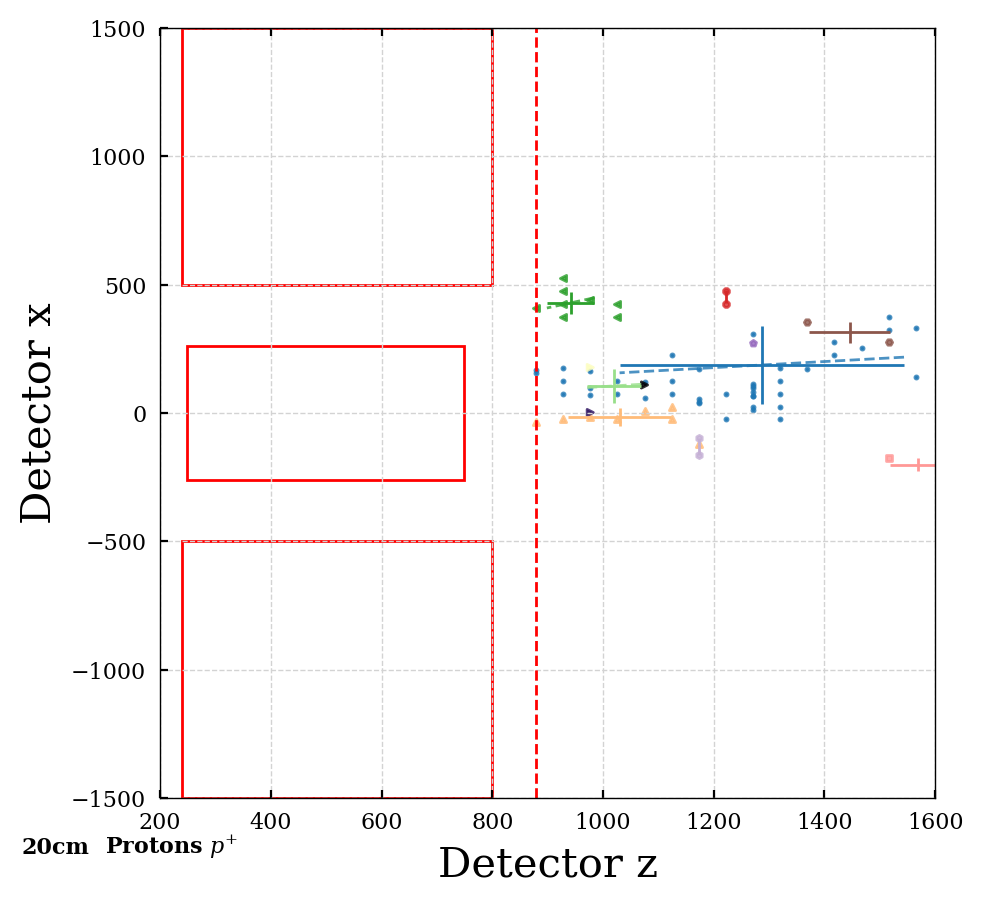

2


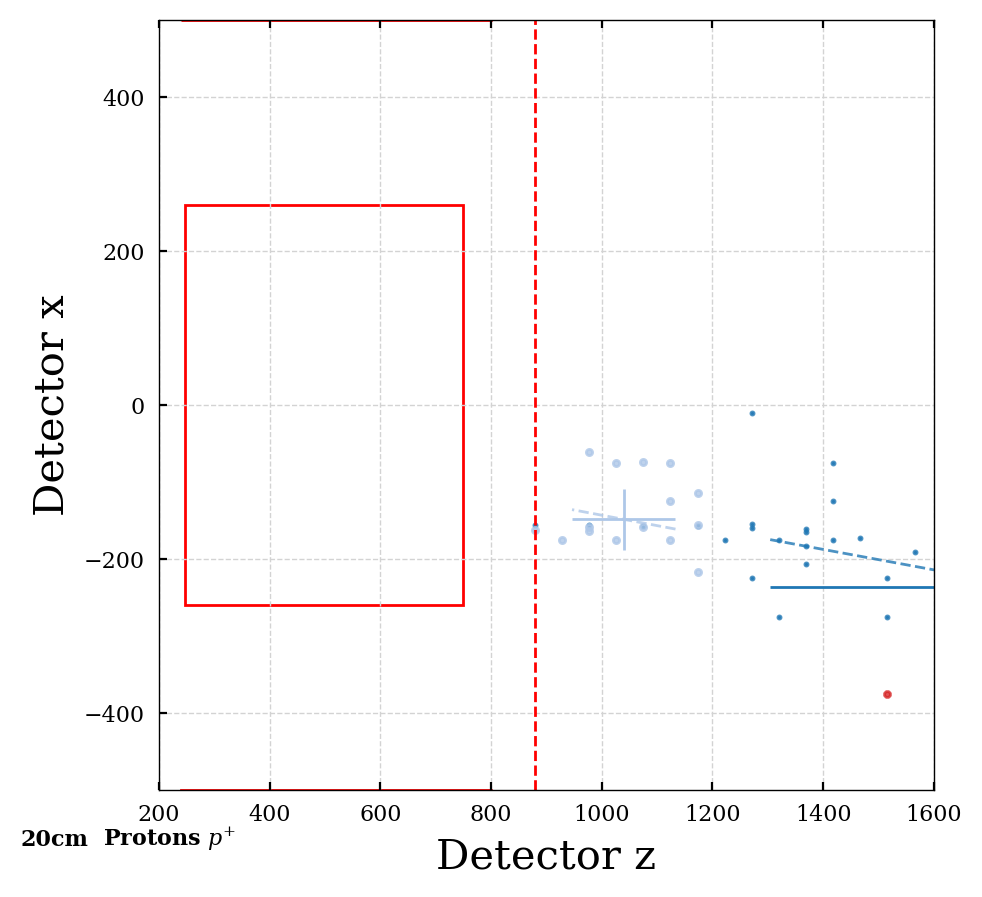

1


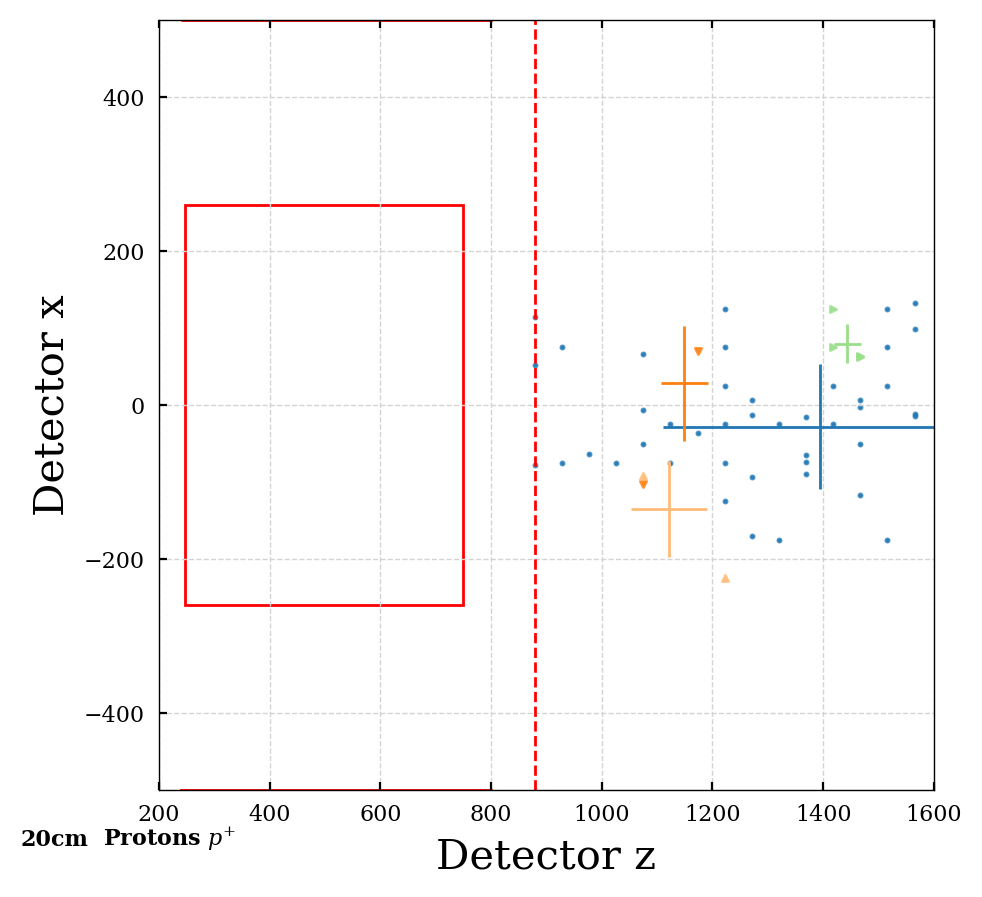

1


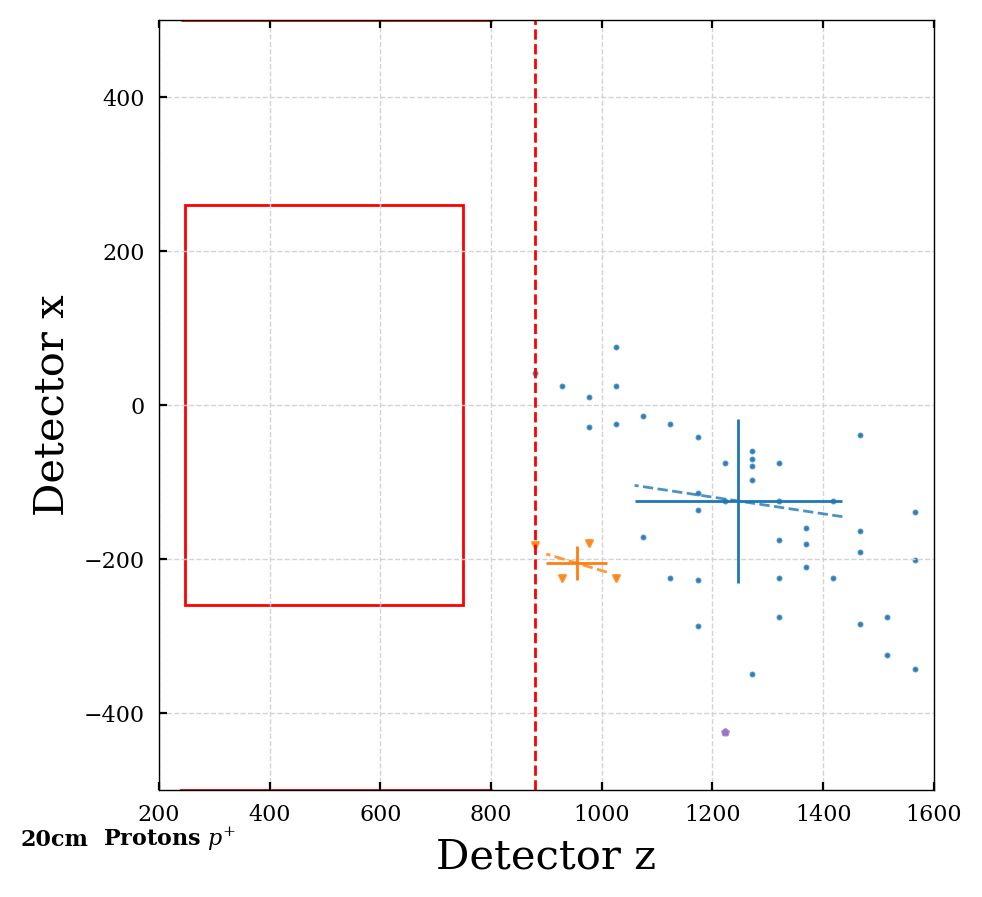

1


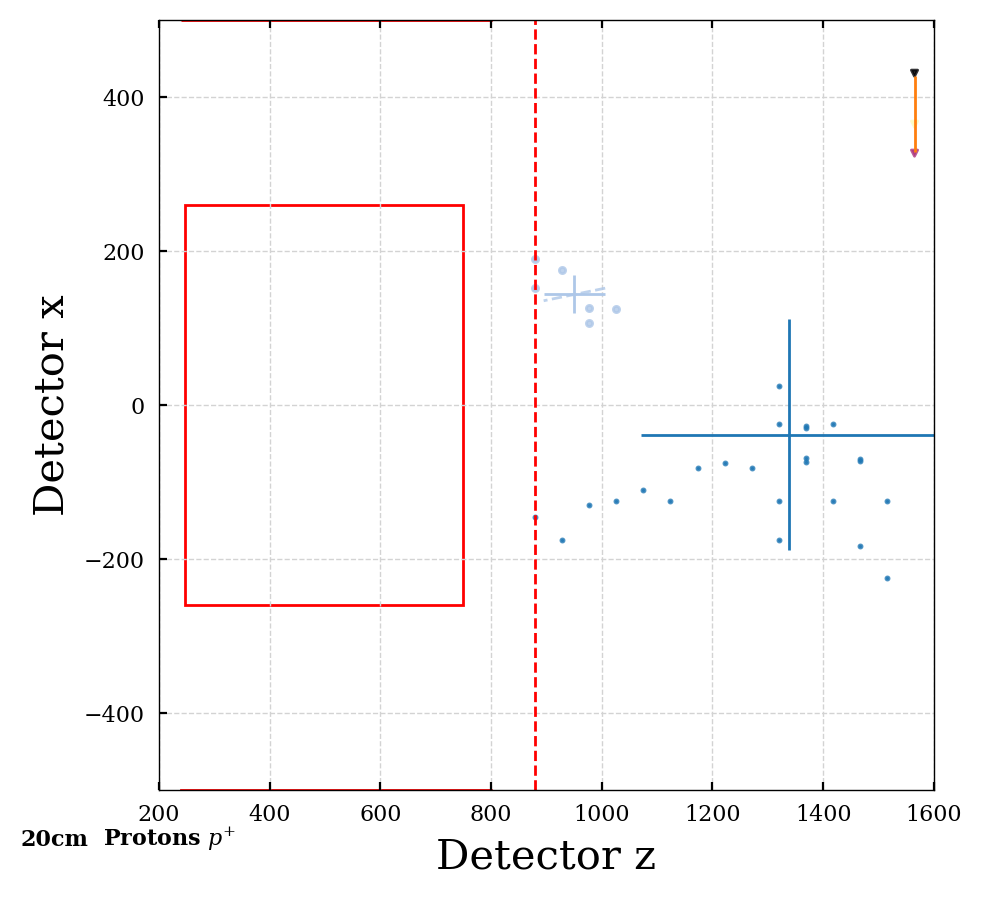

1


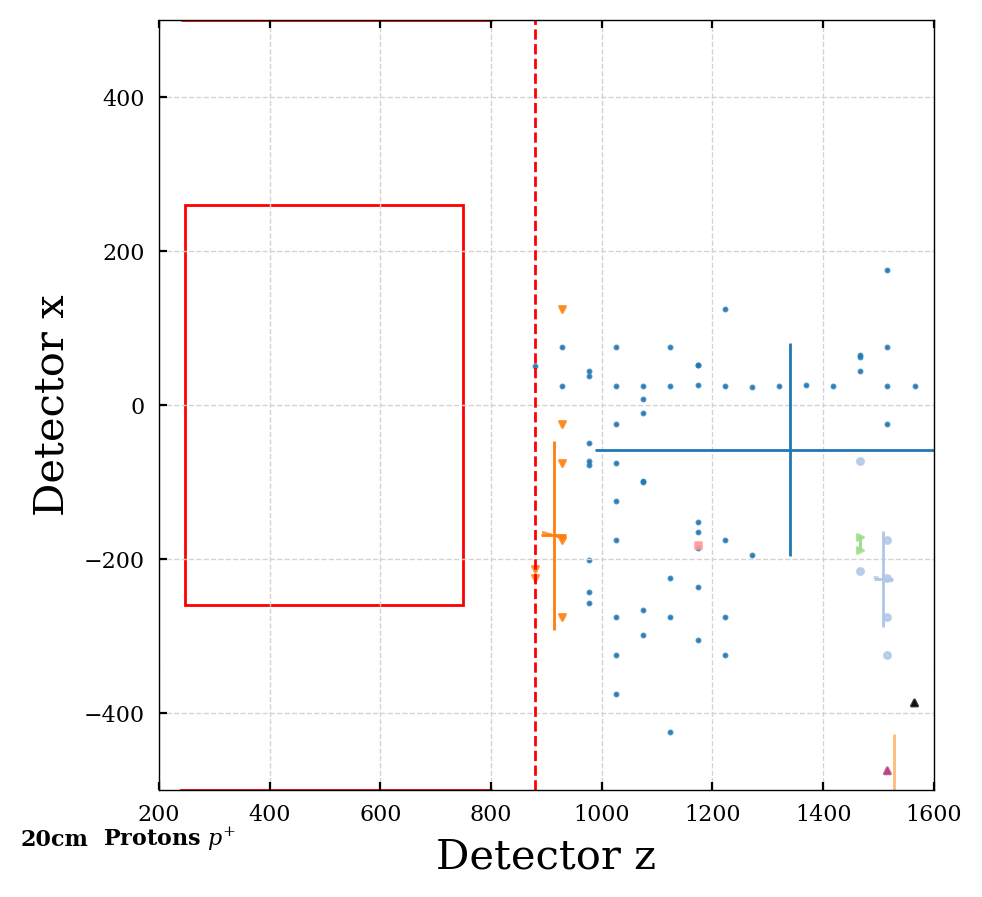

1


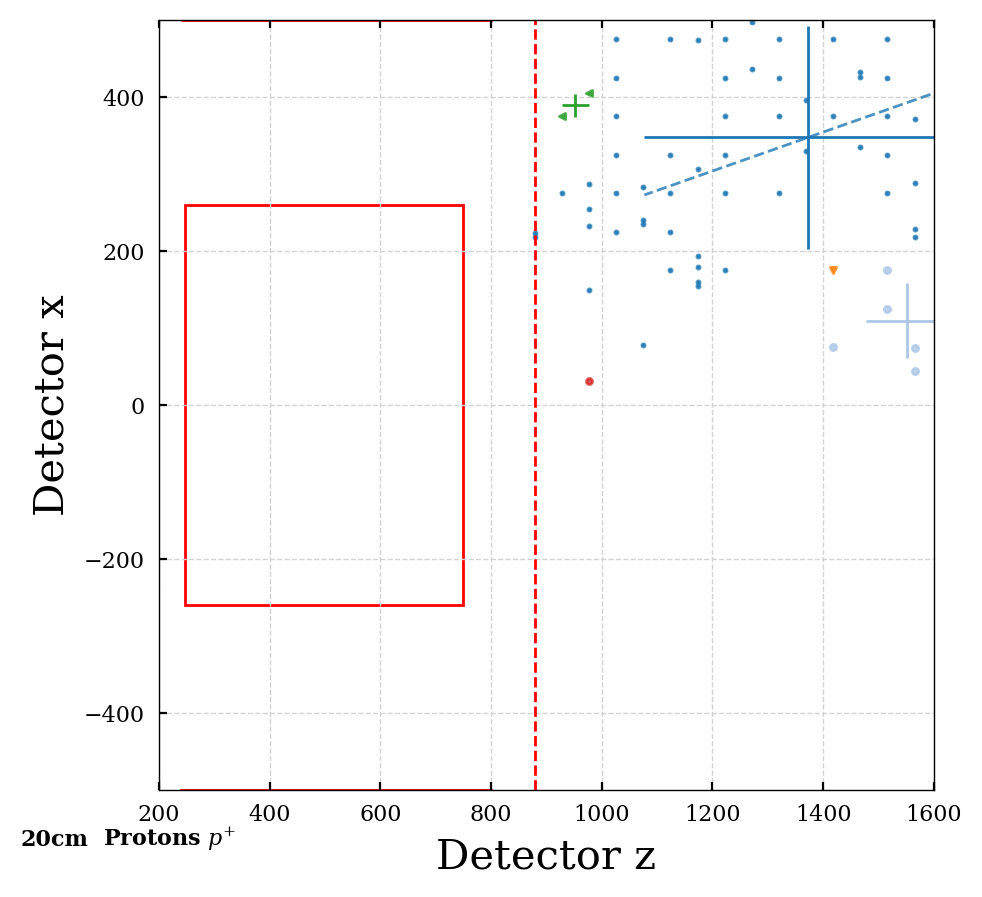

1


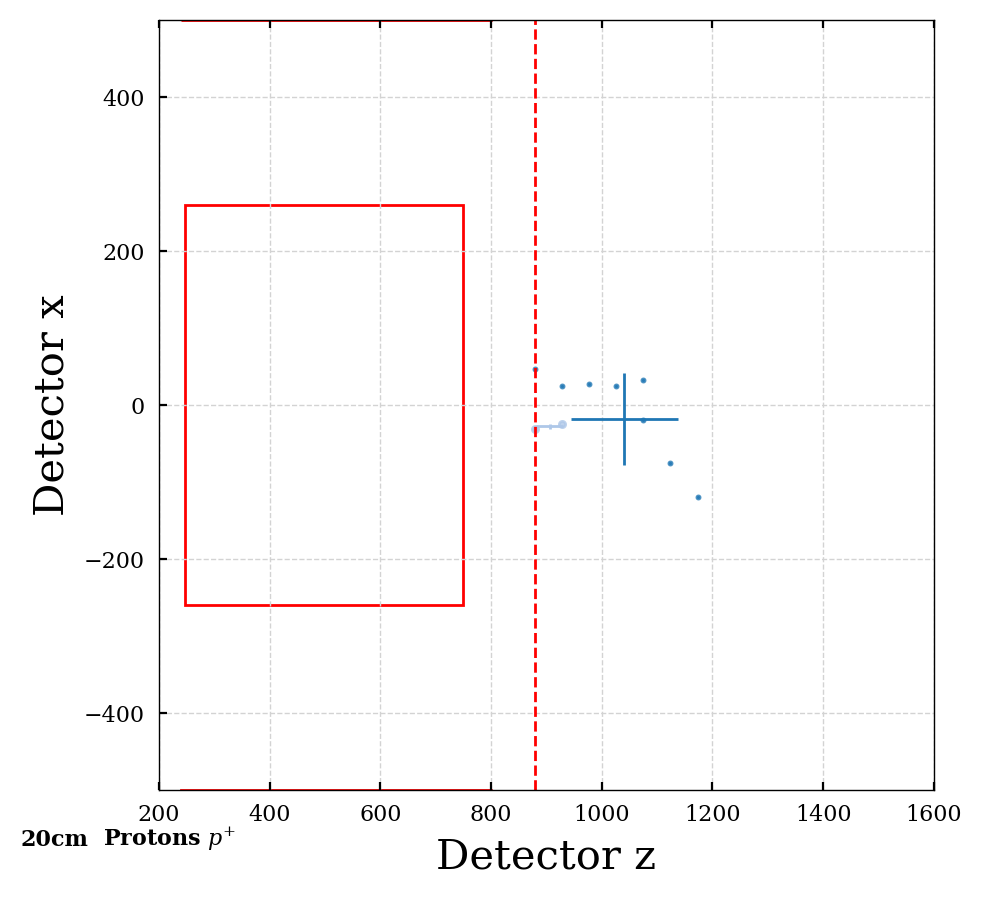

0


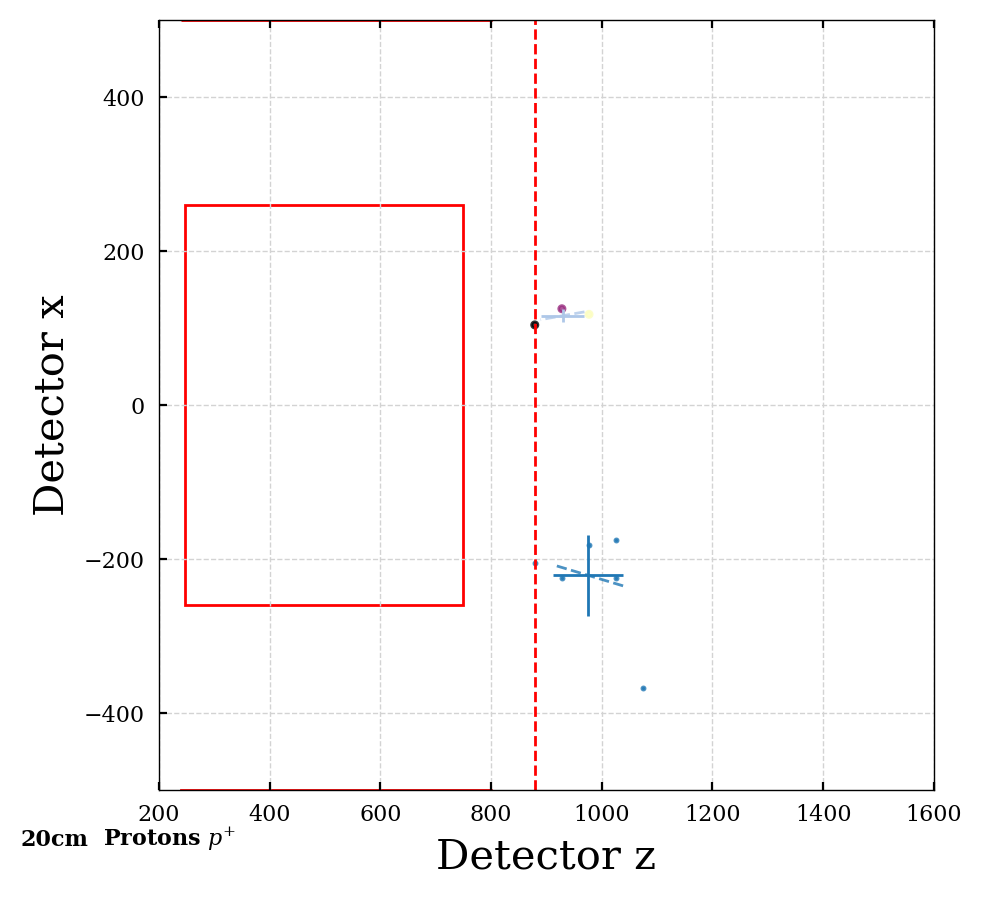

2


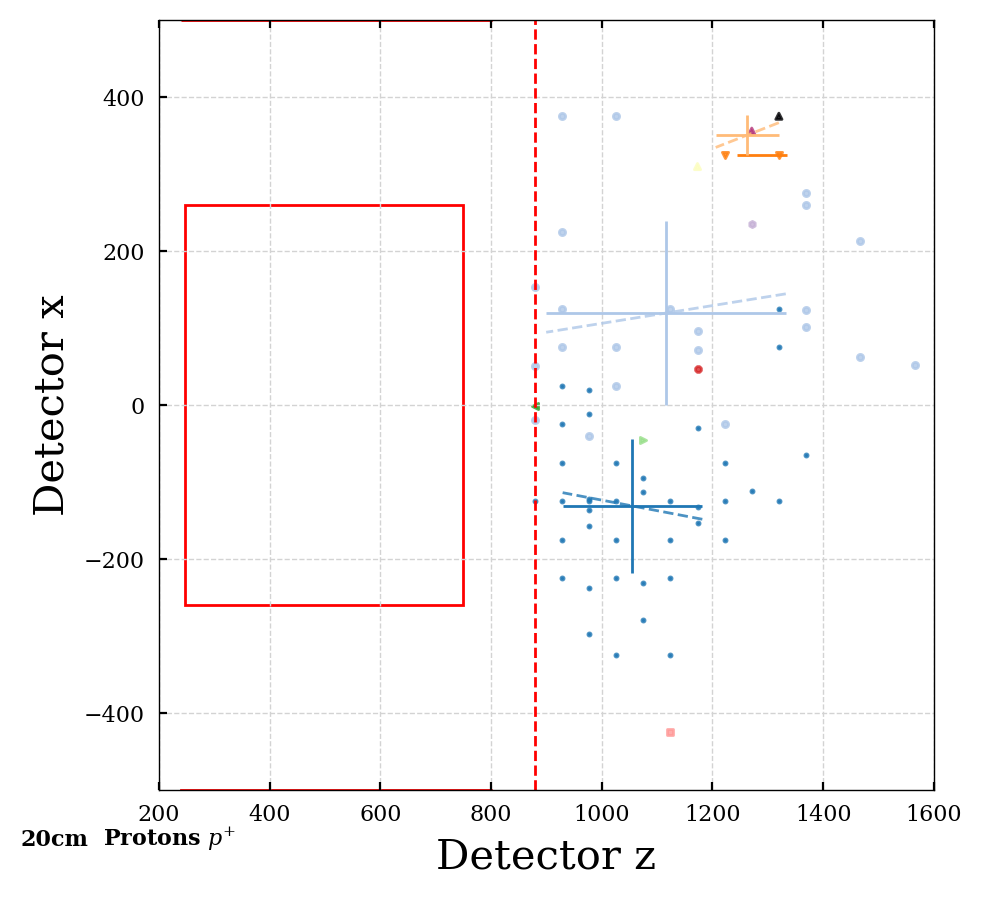

2


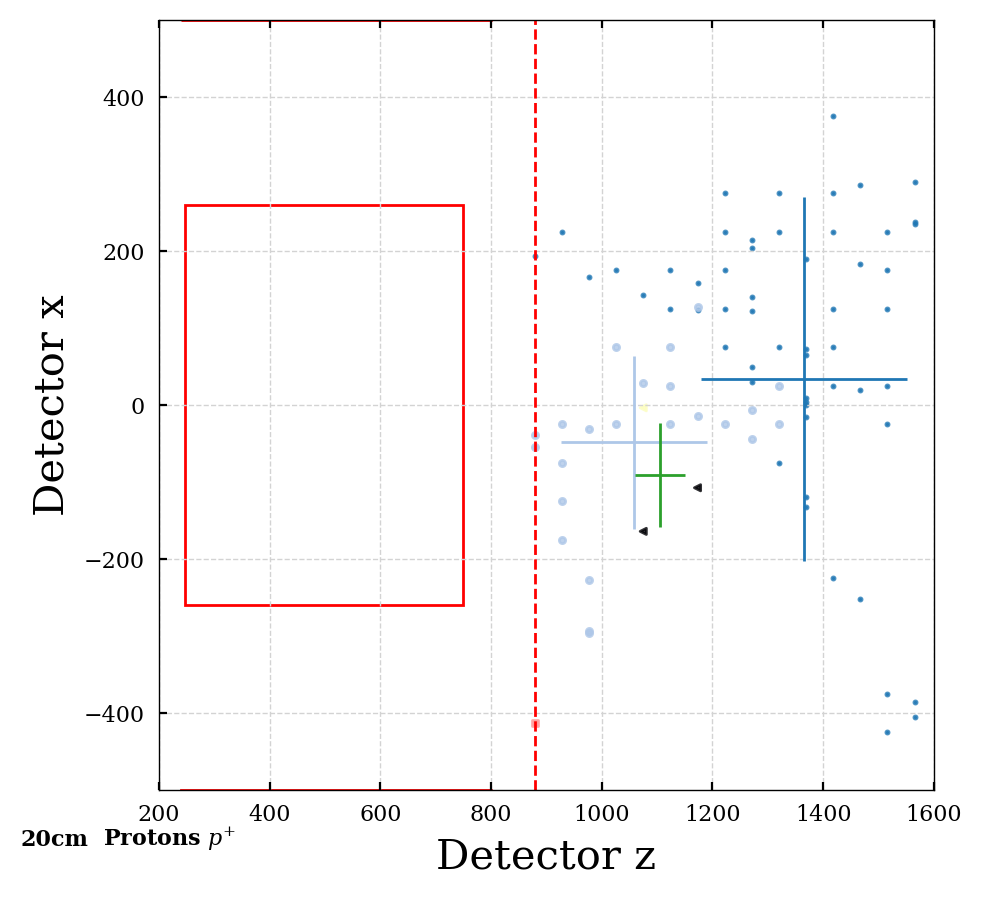

In [56]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='protons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='protons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

# Cluster Merging Distance

$${\rm \#\ of\ clusters\ wrt.\ d_{xy}}$$

In [57]:
def percentile(fig, ax, X, Y, numbins=10, binwidth:float=None, floor=False, label:str=None, draw_grid=True,
               min_binsize=10, fmt='o-', style=0, color='blue', textpos=None):
    """
    The function overrides numbins if binwidth is provided
    """

    bin_min = np.nanmin(X)
    if floor:
        bin_min -= (bin_min % binwidth)
    if binwidth is not None:
        XY_bins = np.arange(start=bin_min, stop=np.nanmax(X), step=binwidth) # bins, including last element
        XY_bins = np.append(XY_bins, XY_bins[-1] + binwidth)
    else:
        XY_bins = np.linspace(bin_min, np.nanmax(X), numbins)  # bins
        binwidth = (np.nanmax(X) - bin_min) / numbins  # calculate bin width manually
    
    # define percentile functions
    def _16(arr): return np.nanquantile(arr, .159) # sigma CI
    def _84(arr): return np.nanquantile(arr, .841)
    def _05(arr): return np.nanquantile(arr, .025) # 95%, close to 2 sigma CI
    def _95(arr): return np.nanquantile(arr, .975)
    XY_avg = stats.binned_statistic(X, Y, statistic=np.nanmean, bins=XY_bins)[0] # mean
    XY_med = stats.binned_statistic(X, Y, statistic=np.nanmedian, bins=XY_bins)[0] # median
    XY_16 = stats.binned_statistic(X, Y, statistic=_16, bins=XY_bins)[0] # percentiles
    XY_84 = stats.binned_statistic(X, Y, statistic=_84, bins=XY_bins)[0]
    XY_05 = stats.binned_statistic(X, Y, statistic=_05, bins=XY_bins)[0]
    XY_95 = stats.binned_statistic(X, Y, statistic=_95, bins=XY_bins)[0]
    XY_bins_avg = [(a + b) / 2 for a, b in zip(XY_bins[::], XY_bins[1::])] # average of two consecutive elements in bins
    
    if draw_grid:
        plotting.grid()

    # plot the function depending which style is chosen
    XY_medm = XY_med - XY_16
    XY_medp = XY_84 - XY_med
    XY_rms = np.mean([XY_medm, XY_medp], axis=0)
    match style:
        case 0:
            # fills
            ax.plot(XY_bins_avg, XY_avg, c=color, ls=fmt[1:], linewidth=1.5, zorder=1, label=label)
            ax.fill_between(XY_bins_avg, XY_avg-XY_rms, XY_avg+XY_rms, color=color, edgecolor=None, alpha=0.2, zorder=1)
        case 1:
            # make line and error bar
            XY_bins_avg = [(a + b) / 2 for a, b in zip(XY_bins[::], XY_bins[1::])] # average of two consecutive elements in bins
            plotting.error_bar(fig, ax, x=XY_bins_avg, y=XY_avg, yerr=[XY_rms, XY_rms], ms=5, capsize=5, fmt=fmt, color=color, label=label)

    # scatter if smaller than bin size
    yhist, _ = np.histogram(X, bins=XY_bins) # histogram of data
    bin_num = 0 # index of x and y to scatter
    Xsortind = np.argsort(X).astype(int) # sorted versions of X and Y to graph
    Xsort = np.array(X)[Xsortind]
    Ysort = np.array(Y)[Xsortind]
    for ybin in yhist:
        if ybin <= min_binsize: # if few number of points in bin
            ax.scatter(Xsort[bin_num: bin_num+ybin], Ysort[bin_num: bin_num+ybin], s=5, alpha=0.5, color=color, zorder=2)
        bin_num += ybin

    # plot the bin size
    if textpos is not None:
        if textpos in ['auto', 'Auto', 'a', 'A']:
            textpos = [bin_min+(XY_bins[-1]-bin_min)/5, np.nanmin(Y)+(np.nanmax(Y)-np.nanmin(Y))*2/3]
        ax.hlines(y=textpos[1],
                xmin=textpos[0]-binwidth/2,
                xmax=textpos[0]+binwidth/2,
                color='black', lw=2, ls='--', zorder=2)
        ax.text(x=textpos[0], y=textpos[1]*1.02, s='Bin Size', fontsize=10, alpha=0.8, ha='center')

In [58]:
def plot_merging_dist_part(part_name='electrons', style=1, min_seps=[5, 10, 20]):
    def plot_merging_dist(fig, ax, particles, min_sep=5, color='blue'):
        # dxy
        length = len(particles.get('PFTruth_second_x'))
        xs = ak.to_numpy(particles.get('PFTruth_second_x')).astype(float).filled(np.nan).T
        ys = ak.to_numpy(particles.get('PFTruth_second_y')).astype(float).filled(np.nan).T
        dxy = np.abs(np.hypot(np.diff(xs, axis=0), np.diff(ys, axis=0))).flatten()
        
        # cluster count
        cluster_count = particles.get('PFHcalClusters_good_count')
    
        # make the plot
        percentile(fig, ax, dxy, cluster_count,
                   style=style, label=f'{min_sep}cm', color=color,
                   binwidth=50, min_binsize=20)

    from matplotlib import cm
    full_cmap = cm.get_cmap('tab10')
    color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10
    
    fig, ax = plt.subplots(figsize=(4, 3), dpi=200)
    plotting.style_ldmx(fig, ax)
    if 5 in min_seps: plot_merging_dist(fig, ax, particles_dict_5cm[part_name], 5, color=color_list[0])
    if 10 in min_seps: plot_merging_dist(fig, ax, particles_dict_10cm[part_name], 10, color=color_list[1])
    if 15 in min_seps: plot_merging_dist(fig, ax, particles_dict_15cm[part_name], 15, color=color_list[2])
    if 20 in min_seps: plot_merging_dist(fig, ax, particles_dict_20cm[part_name], 20, color=color_list[3])
    if 25 in min_seps: plot_merging_dist(fig, ax, particles_dict_25cm[part_name], 25, color=color_list[4])
    
    ax.annotate(text=labels_dict[part_name], xy=(-10, -25), xycoords='axes points', fontsize=10, weight='bold')
    ax.set_xlabel(r'$d_{xy} [mm]$', fontsize=10)
    ax.set_ylabel('Avg # of clusters', fontsize=10)
    ax.set_ylim([0.5, 2.5])
    ax.legend()
    plt.show()

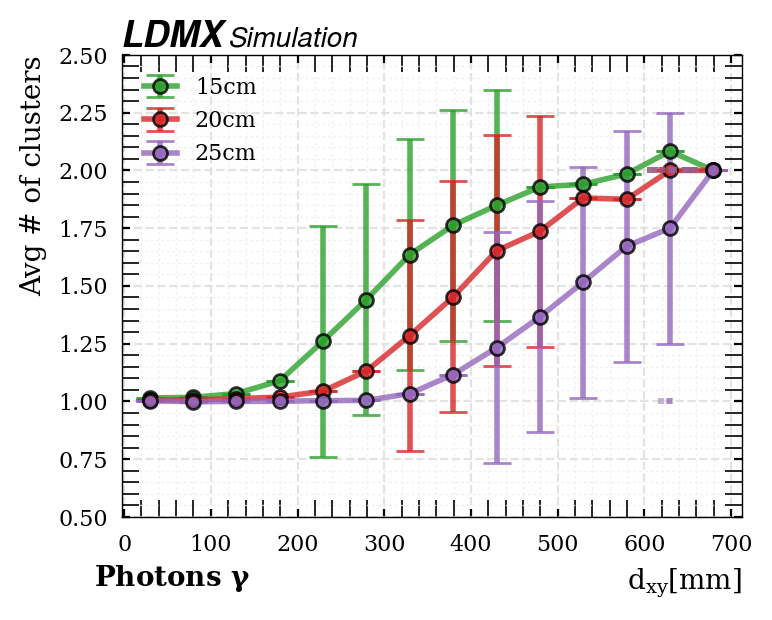

In [81]:
plot_merging_dist_part('photons', 1, [15, 20, 25])

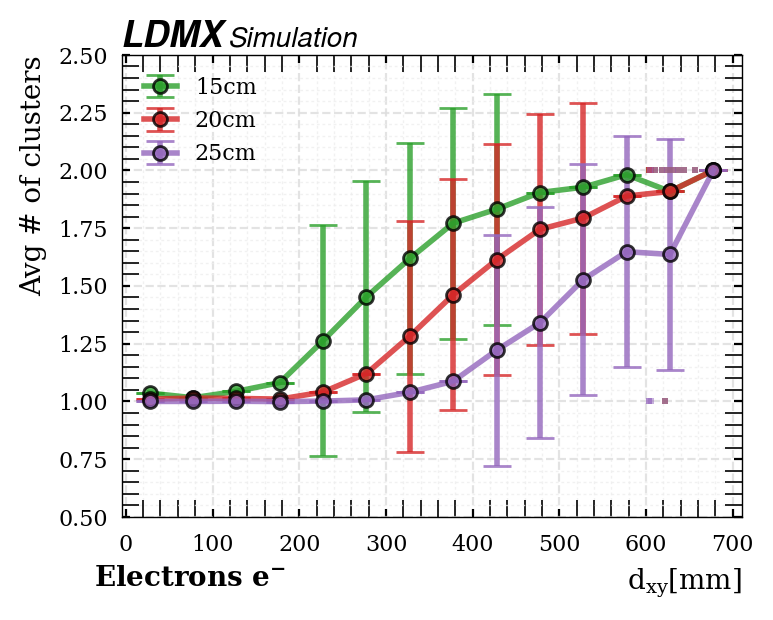

In [82]:
plot_merging_dist_part('electrons', 1, [15, 20, 25])

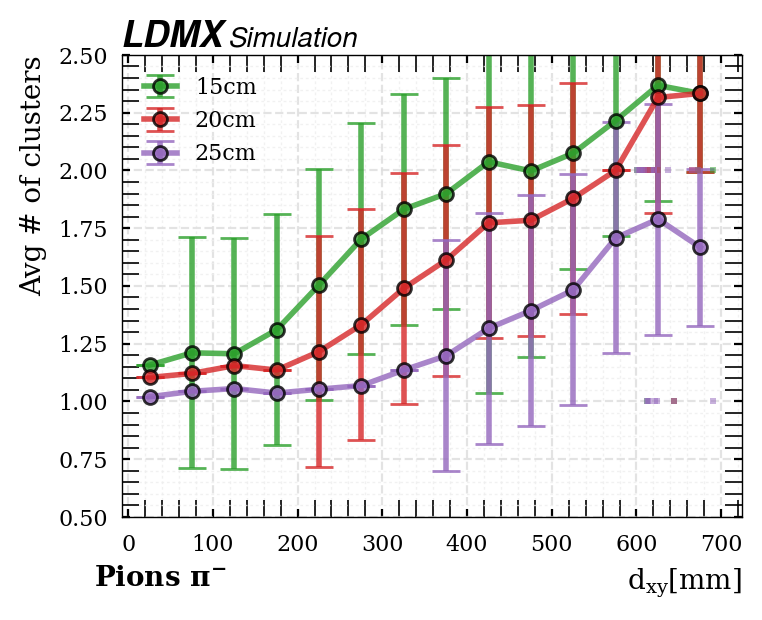

In [61]:
plot_merging_dist_part('pions', 1, [15, 20, 25])

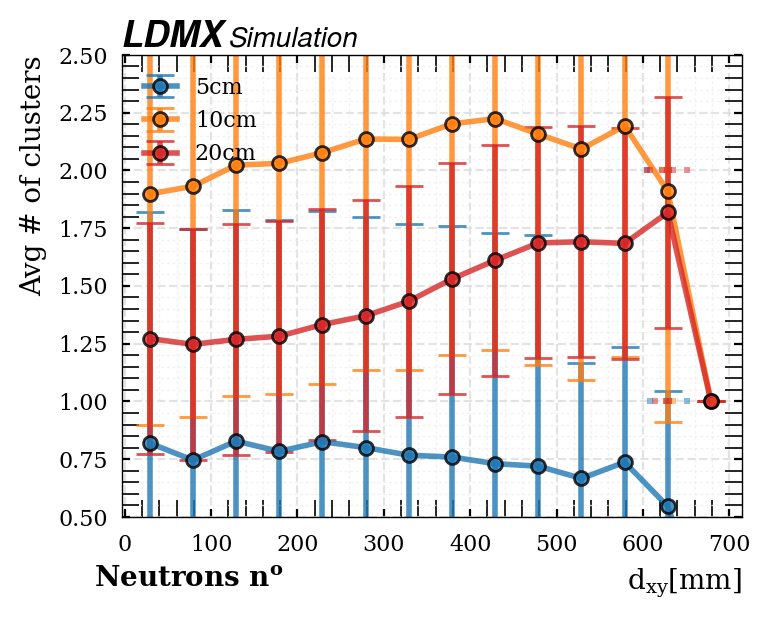

In [62]:
plot_merging_dist_part('neutrons', 1)

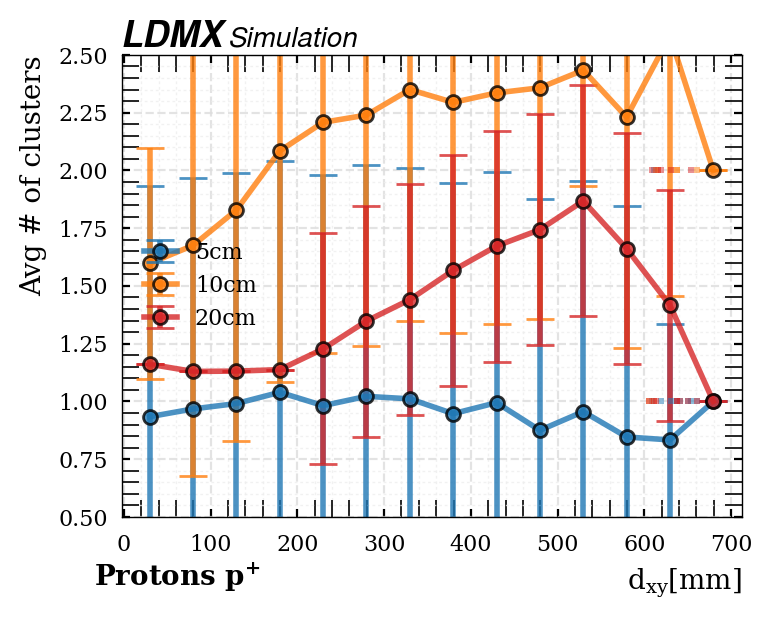

In [63]:
plot_merging_dist_part('protons', 1)

# Good Cluster Energy

$$E_{\rm clust} / E_{\rm cal} \ {\rm wrt.} \ d_{xy}$$

In [64]:
particles_dict_20cm['electrons'].get('PFHcalClusters_energy')
particles_dict_20cm['electrons'].get('PFTruth_second_x')
a = (particles_dict_20cm['electrons'].get('PFHcalClusters_nHits') > 8)
b = ~a
ak.sum(ak.any([a, b], axis=0), axis=1)

<Array [2, 2, 4, 2, 5, 2, 2, 2, ..., 1, 1, 1, 2, 3, 1, 1] type='10000 * int64'>

In [65]:
truthz = particles_dict_20cm['electrons'].get('PFTruth_second_z')[0][0]
hcal_clusterX = particles_dict_20cm['electrons'].get('PFHcalClusters_centroidX')
hcal_clusterZ = particles_dict_20cm['electrons'].get('PFHcalClusters_centroidZ')
hcal_clusterDXDZ = particles_dict_20cm['electrons'].get('PFHcalClusters_DXDZ')
hcal_clusterX - (hcal_clusterZ - truthz) * hcal_clusterDXDZ

<Array [[210, -80.5], [-53.8, ...], ..., [87.8]] type='10000 * var * ?float64'>

In [66]:
ak.to_numpy(particles_dict_20cm['electrons'].get('PFTruth_second_x')).T

masked_array(
  data=[[ 247.53378165, -213.29904592,   22.75084364, ...,  -78.93245637,
          -35.10536194,   59.74266362],
        [-164.61258531,   20.60057366,  142.01401436, ...,  181.801229  ,
           97.29464591,  195.7706567 ]],
  mask=False,
  fill_value=1e+20)

In [67]:
original = ak.Array([[0, 1, 2], [], [3, 4], [5], [6, 7, 8, 9]])
counts = ak.num(original)
array = ak.flatten(original)
counts, ak.unflatten(array, counts)

(<Array [3, 0, 2, 1, 4] type='5 * int64'>,
 <Array [[0, 1, 2], [], [3, ...], [5], [6, 7, 8, 9]] type='5 * var * int64'>)

In [68]:
np.sort([[1, 2, 3], [3, 2, 1]], axis=0)[::-1]

array([[3, 2, 3],
       [1, 2, 1]])

In [69]:
def plot_goodclust_erg_part(part_name='electrons', style=1, min_seps=[5, 10, 20]):
    def plot_goodclust_erg(fig, ax, particles, min_sep=5, color='blue'):
        # truth positions
        length = len(particles.get('PFTruth_second_x'))
        xs = ak.to_numpy(particles.get('PFTruth_second_x')).astype(float).filled(np.nan).T
        ys = ak.to_numpy(particles.get('PFTruth_second_y')).astype(float).filled(np.nan).T
        # dxy
        dxy = np.abs(np.hypot(np.diff(xs, axis=0), np.diff(ys, axis=0))).flatten()
        
        # truth info of each particle of x and y coordinates
        x1, x2 = xs
        y1, y2 = ys

        # projection
        hcal_clusterZ = particles.get('PFHcalClusters_centroidZ')
        hcal_clusterX = particles.get('PFHcalClusters_centroidX')
        hcal_clusterDXDZ = particles.get('PFHcalClusters_DXDZ')
        hcal_clusterY = particles.get('PFHcalClusters_centroidY')
        hcal_clusterDYDZ = particles.get('PFHcalClusters_DYDZ')
        # projected from each cluster
        truthz = particles.get('PFTruth_second_z')[0][0]  # the z position to map onto
        proj_x = hcal_clusterX - (hcal_clusterZ - truthz) * hcal_clusterDXDZ
        proj_y = hcal_clusterY - (hcal_clusterZ - truthz) * hcal_clusterDYDZ

        # distance and cluster membership
        dist_1 = np.abs(np.hypot(proj_x - x1, proj_y - y1))
        dist_2 = np.abs(np.hypot(proj_x - x2, proj_y - y2))
        clust_member = np.where(dist_1 <= dist_2, 1, 2)  # cluster membership determination
        
        # mask the particles by cluster
        # good clusters mask
        good_mask = (particles.get('PFHcalClusters_nHits') >= 8)
        # cluster members
        clust1_mask = (clust_member == 1)
        clust2_mask = (clust_member == 2)
        clust1_erg = ak.sum(particles.get('PFHcalClusters_energy')[ak.all([good_mask, clust1_mask], axis=0)], axis=1)
        clust2_erg = ak.sum(particles.get('PFHcalClusters_energy')[ak.all([good_mask, clust2_mask], axis=0)], axis=1)

        # sort the two by energy
        clust1_erg, clust2_erg = np.sort([clust1_erg, clust2_erg], axis=0)[::-1]
        
        # calorimeter energy
        calo_erg = particles.get('HcalTotalEnergy')
    
        # make the plot
        percentile(fig, ax, dxy, (clust1_erg/calo_erg)*100,
                   style=style, label=f'{min_sep}cm', color=color,
                   binwidth=75, min_binsize=20)
        percentile(fig, ax, dxy, (clust2_erg/calo_erg)*100,
                   style=style, label='', color=color,
                   binwidth=75, min_binsize=20)
    
    from matplotlib import cm
    full_cmap = cm.get_cmap('tab10')
    color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10
    
    fig, ax = plt.subplots(figsize=(4, 3), dpi=200)
    plotting.style_ldmx(fig, ax)
    if 5 in min_seps: plot_goodclust_erg(fig, ax, particles_dict_5cm[part_name], 5, color=color_list[0])
    if 10 in min_seps: plot_goodclust_erg(fig, ax, particles_dict_10cm[part_name], 10, color=color_list[1])
    if 15 in min_seps: plot_goodclust_erg(fig, ax, particles_dict_15cm[part_name], 15, color=color_list[2])
    if 20 in min_seps: plot_goodclust_erg(fig, ax, particles_dict_20cm[part_name], 20, color=color_list[3])
    if 25 in min_seps: plot_goodclust_erg(fig, ax, particles_dict_25cm[part_name], 25, color=color_list[4])
    
    ax.annotate(text=labels_dict [part_name], xy=(-60, -10), xycoords='axes points', fontsize=10, weight='bold')
    ax.set_xlabel(r'$d_{xy} [mm]$', fontsize=10)
    ax.set_ylabel(r'$E_{\rm clust} / E_{\rm calo} \%$', fontsize=10)
    ax.set_ylim([0, 100])
    ax.legend()
    plt.show()

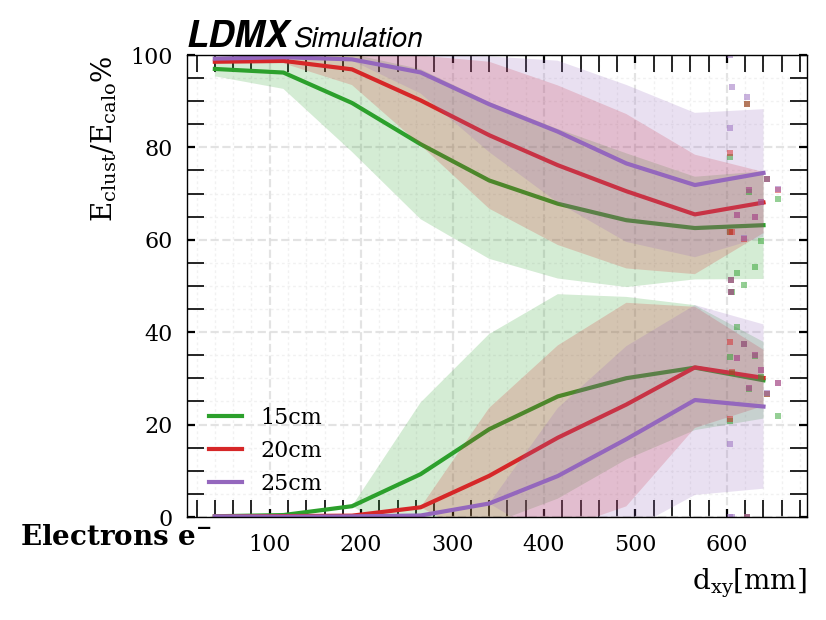

In [70]:
plot_goodclust_erg_part('electrons', 0, [15, 20, 25])

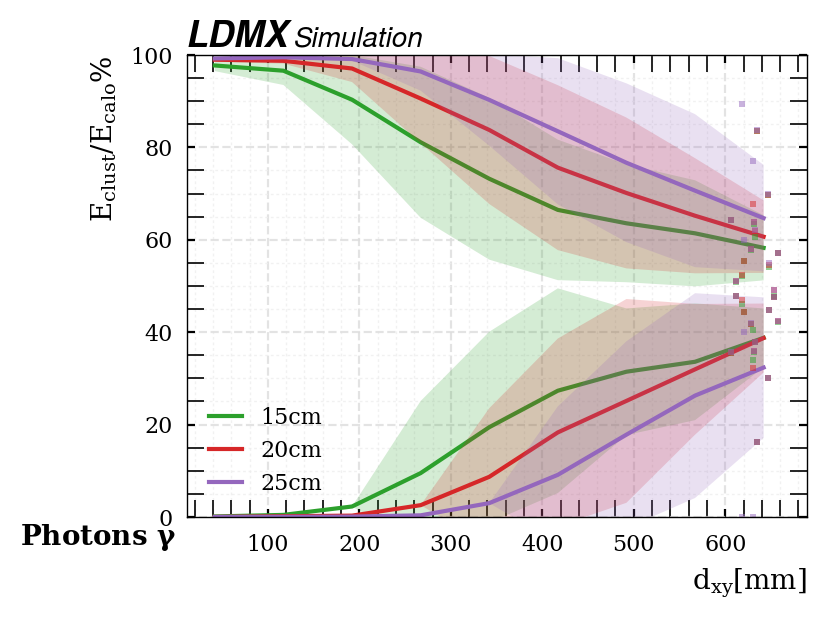

In [71]:
plot_goodclust_erg_part('photons', 0, [15, 20, 25])

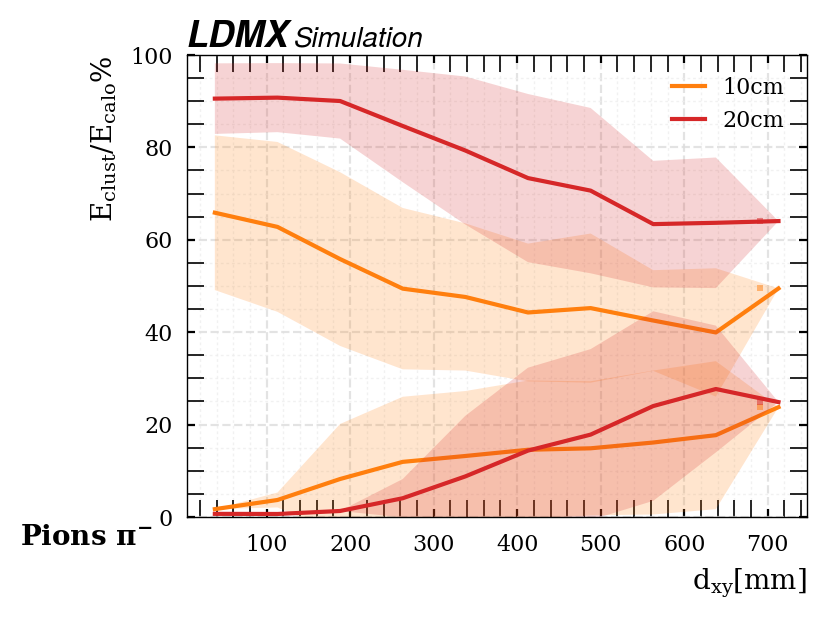

In [72]:
plot_goodclust_erg_part('pions', 0, [10, 20])

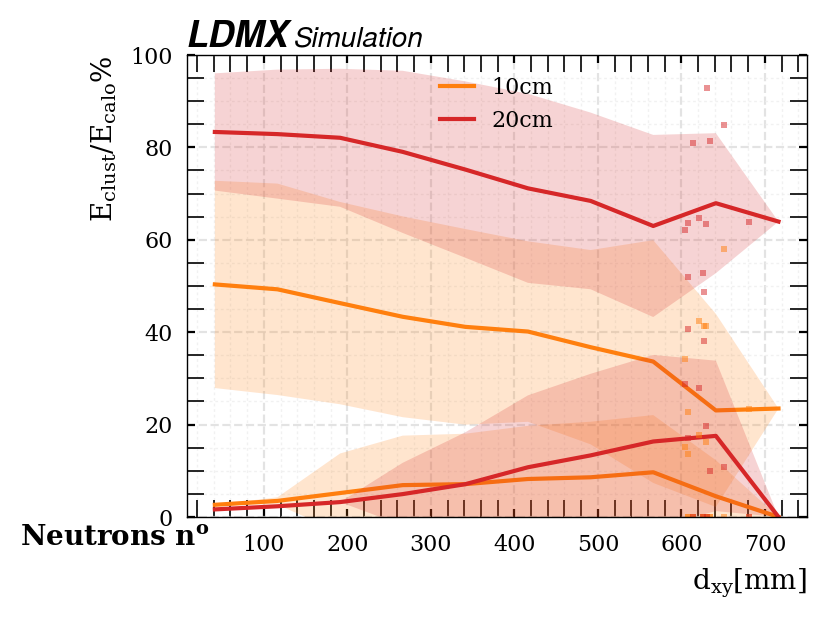

In [73]:
plot_goodclust_erg_part('neutrons', 0, [10, 20])

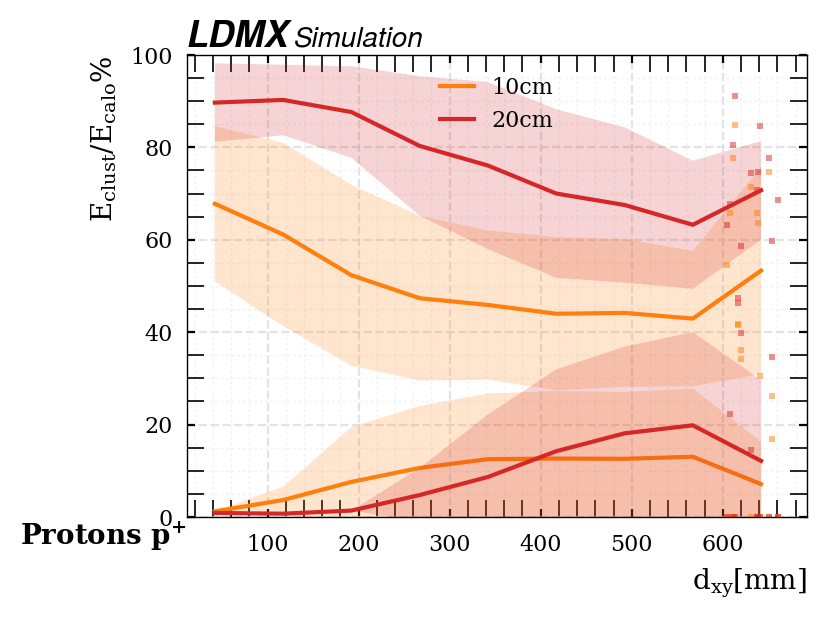

In [74]:
plot_goodclust_erg_part('protons', 0, [10, 20])

# Energy Proportion of Cluster / Calorimeter

In [75]:
def plot_cluster_erg(particles_dict=particles_dict_5cm, min_sep=5, figsize=(5, 3), cmap='tab10', max_cluster_count=10, fs=8, ylim=100, text=False):

    fig1, ax1 = plt.subplots(figsize=figsize, dpi=200)
    plotting.style_ldmx(fig1, ax1)
    fig2, ax2 = plt.subplots(figsize=figsize, dpi=200)
    plotting.style_ldmx(fig2, ax2)
    fig3, ax3 = plt.subplots(figsize=figsize, dpi=200)
    plotting.style_ldmx(fig3, ax3)
    ax1.grid(visible=False)
    ax2.grid(visible=False)
    ax3.grid(visible=False)
    labels_list = []
    hcal_max_erg_list = []
    for i, particles in enumerate(particles_name_list):
        # for each particle in the list
        # energy bins
        from matplotlib import cm
        

        hcal_max_erg = particles_dict[particles].get('PFHcalClusters_energy_lc')
        hcal_sum_erg = [np.nansum(_) for _ in particles_dict[particles].get('PFHcalClusters_energy')]
        hcal_good_erg = [np.nansum(_) for _ in particles_dict[particles].get('PFHcalClusters_energy')[particles_dict[particles].get('PFHcalClusters_nHits') >= 8]]
        hcal_tot_erg = particles_dict[particles].get('HcalTotalEnergy')

        avg_frac_max = np.nanmean(hcal_max_erg/hcal_tot_erg)
        std_frac_max = np.nanstd(hcal_max_erg/hcal_tot_erg)

        avg_frac_sum = np.nanmean(hcal_sum_erg/hcal_tot_erg)
        std_frac_sum = np.nanstd(hcal_sum_erg/hcal_tot_erg)

        avg_frac_good = np.nanmean(hcal_good_erg/hcal_tot_erg)
        std_frac_good = np.nanstd(hcal_good_erg/hcal_tot_erg)
        
        ax1.bar(i, avg_frac_max * 100, yerr=std_frac_max*100, ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax1.text(i, 1, f'{avg_frac_max * 100:.1f}', ha="center", va="bottom", fontsize=10)
        hcal_max_erg_list.append(f'{np.nanmean(hcal_max_erg):.2f}')
        labels_list.append(labels_dict[particles])

        ax2.bar(i, avg_frac_good * 100, yerr=std_frac_good*100, ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax2.text(i, 1, f'{avg_frac_good * 100:.1f}', ha="center", va="bottom", fontsize=10)
        
        ax3.bar(i, avg_frac_sum * 100, yerr=std_frac_sum*100, ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax3.text(i, 1, f'{avg_frac_sum * 100:.1f}', ha="center", va="bottom", fontsize=10)


    # labels
    if text:
         # legend
        ax1.bar(0, 0, color='None', ec='None', label='HCal Energy')
        rects = ax1.patches
        for rect, label in zip(rects, hcal_max_erg_list):
            height = rect.get_height()
            ax1.text(rect.get_x() + rect.get_width() / 2, height, label, ha="center", va="bottom")
        ax1.legend()

    ax1.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax1.set_ylim(0, ylim)
    ax1.set_xticks(range(len(particles_name_list)))
    ax1.set_xticklabels(labels_list, fontsize=8)
    ax1.set_xlabel('Particles', fontsize=10)
    ax1.set_ylabel('% of energy in lead clust', fontsize=10)

    ax2.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax2.set_ylim(0, ylim)
    ax2.set_xticks(range(len(particles_name_list)))
    ax2.set_xticklabels(labels_list, fontsize=8)
    ax2.set_xlabel('Particles', fontsize=10)
    ax2.set_ylabel('% of energy in GOOD clust', fontsize=10)

    ax3.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax3.set_ylim(0, ylim)
    ax3.set_xticks(range(len(particles_name_list)))
    ax3.set_xticklabels(labels_list, fontsize=8)
    ax3.set_xlabel('Particles', fontsize=10)
    ax3.set_ylabel('% of energy in ALL clust', fontsize=10)

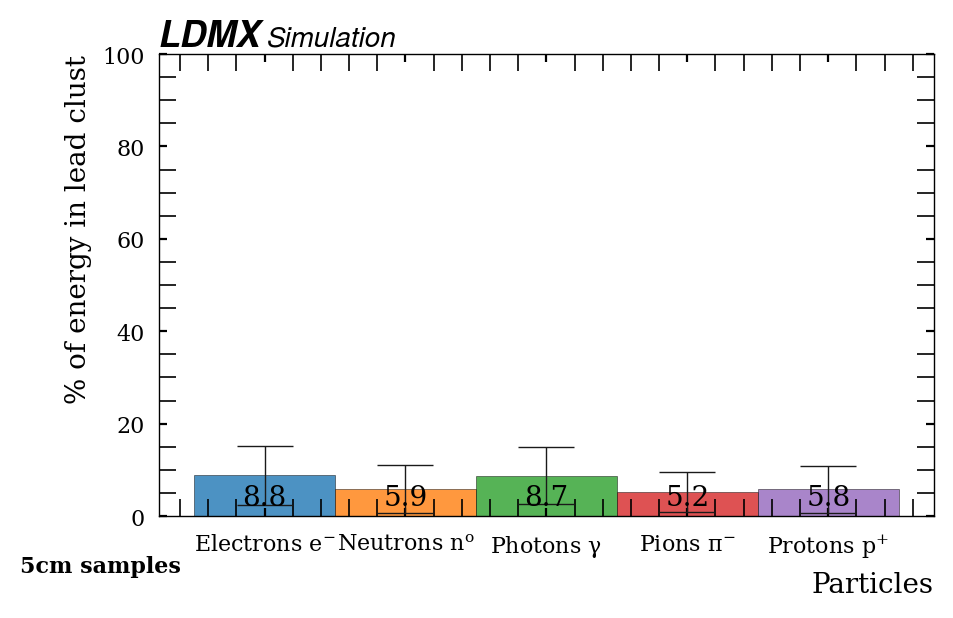

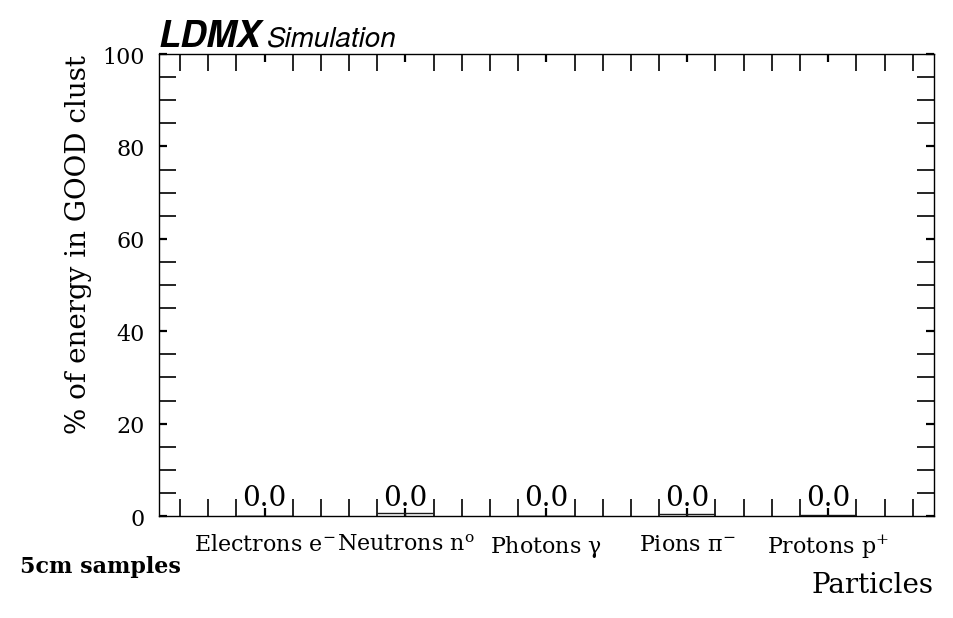

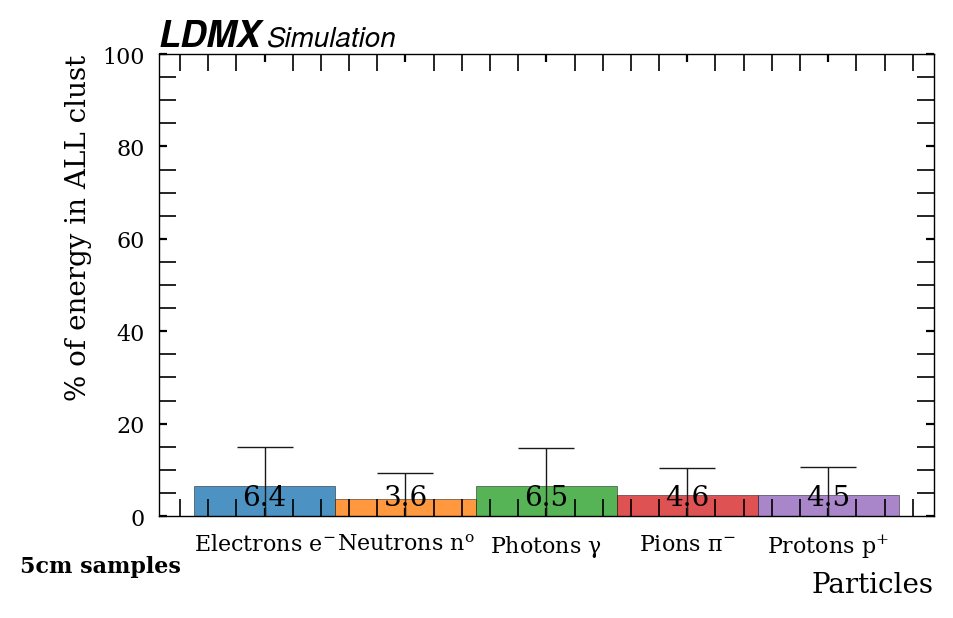

In [76]:
plot_cluster_erg(particles_dict_5cm, 5, (5, 3), 'tab10', fs=5)
plt.show()

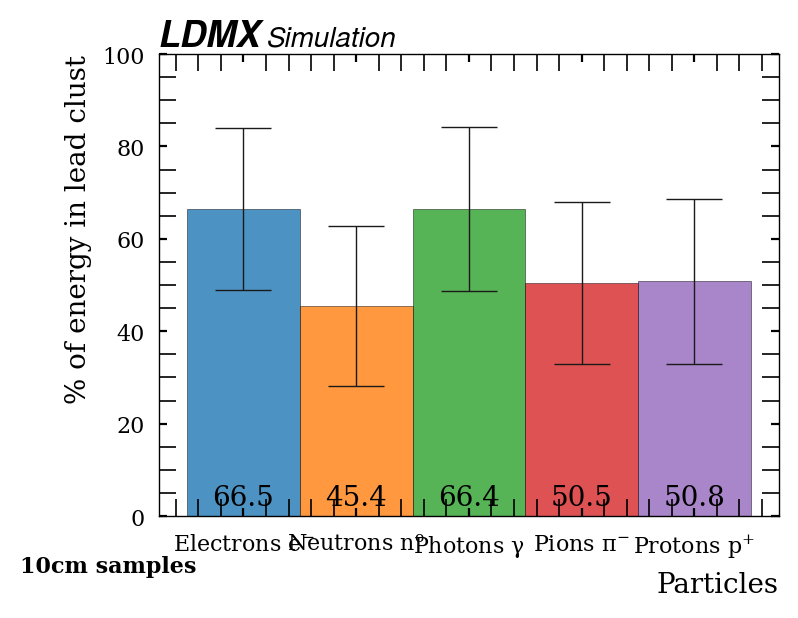

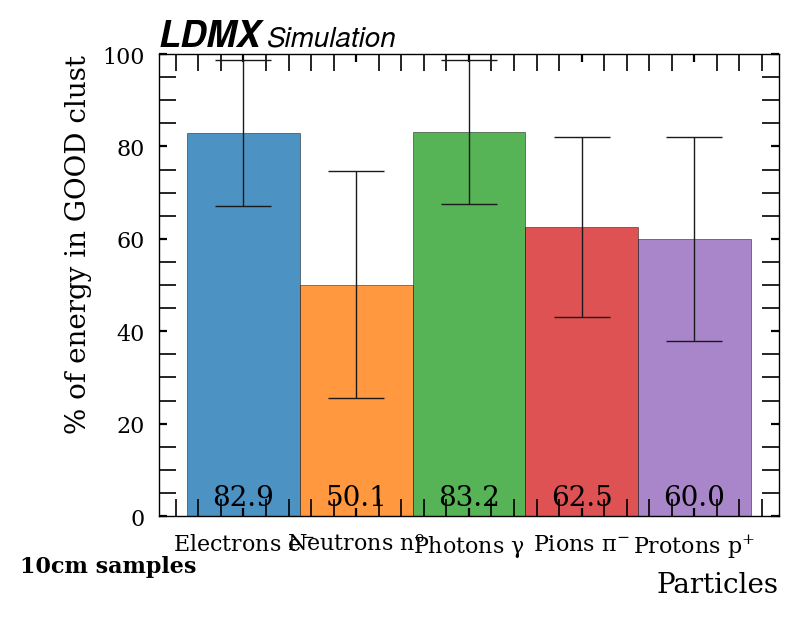

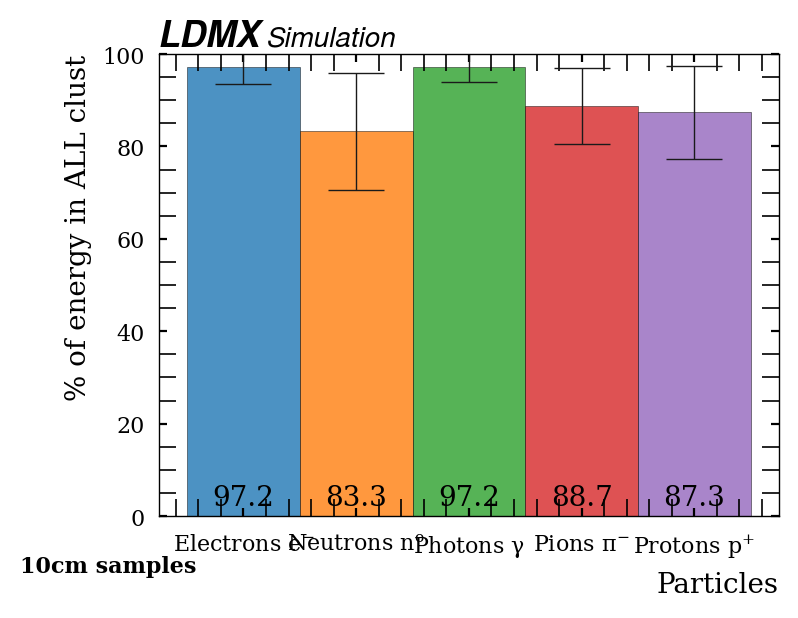

In [77]:
plot_cluster_erg(particles_dict_10cm, 10, (4, 3), 'tab10', fs=5)
plt.show()

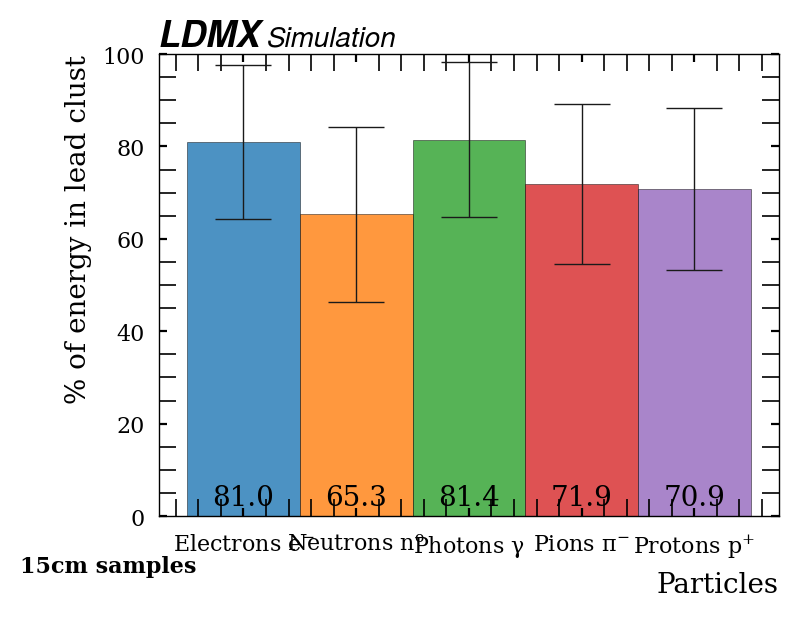

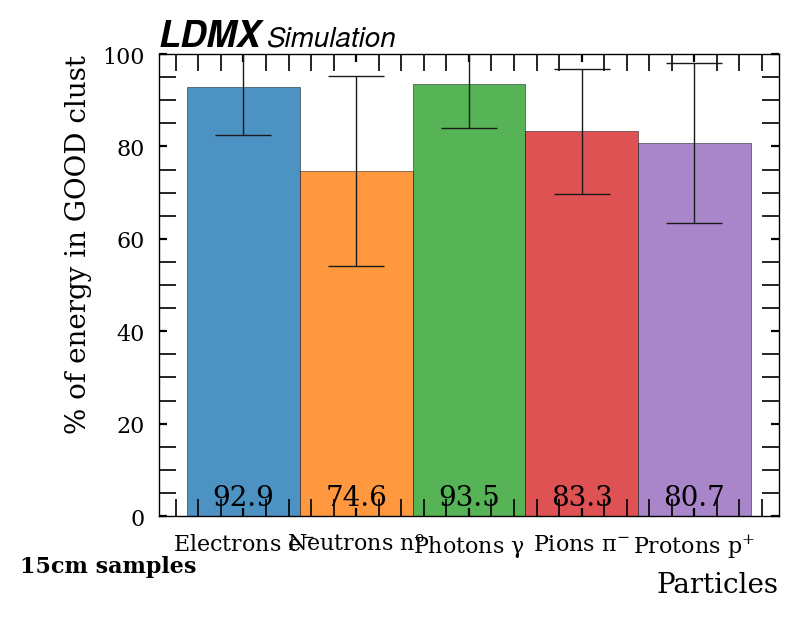

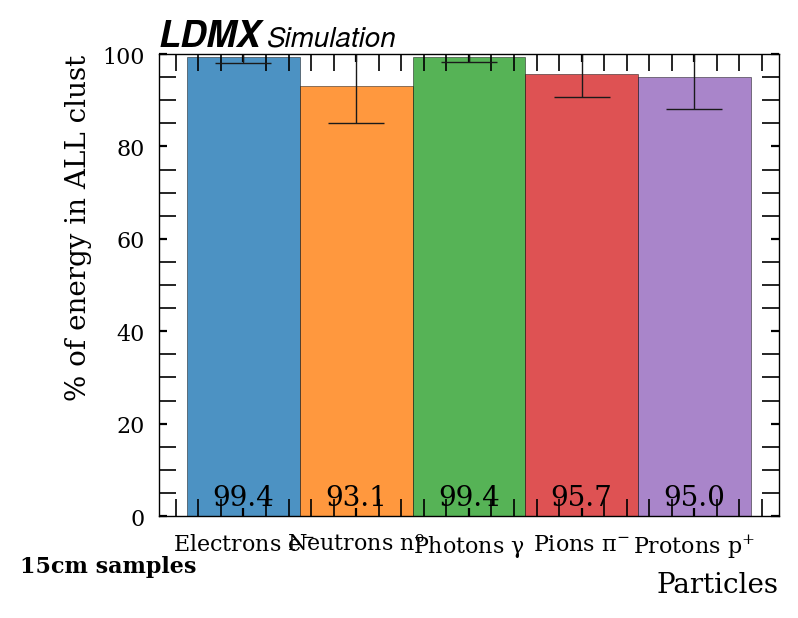

In [78]:
plot_cluster_erg(particles_dict_15cm, 15, (4, 3), 'tab10', fs=5)
plt.show()

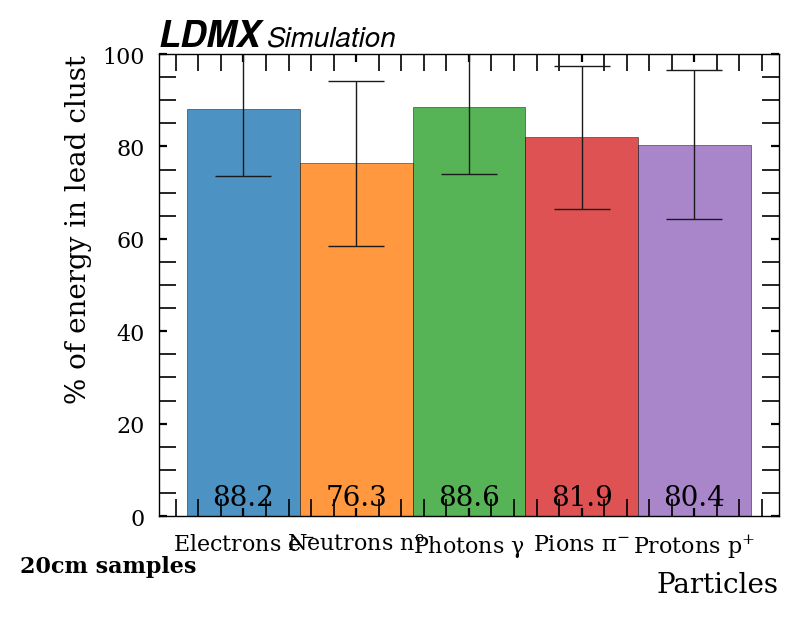

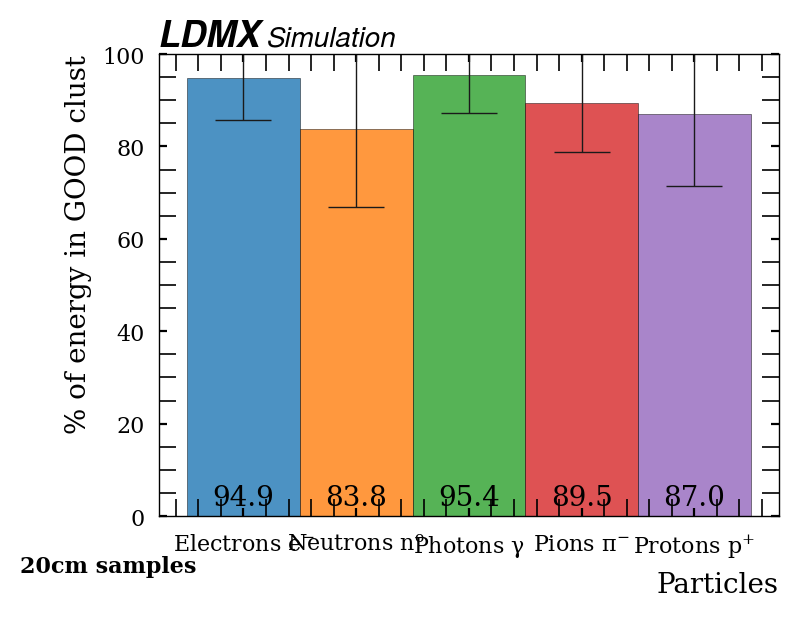

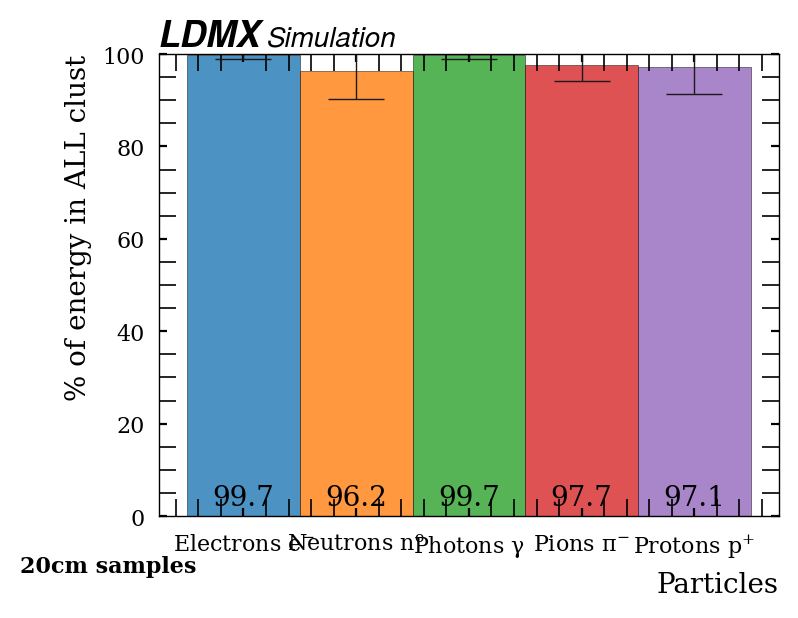

In [79]:
plot_cluster_erg(particles_dict_20cm, 20, (4, 3), 'tab10', fs=5)
plt.show()

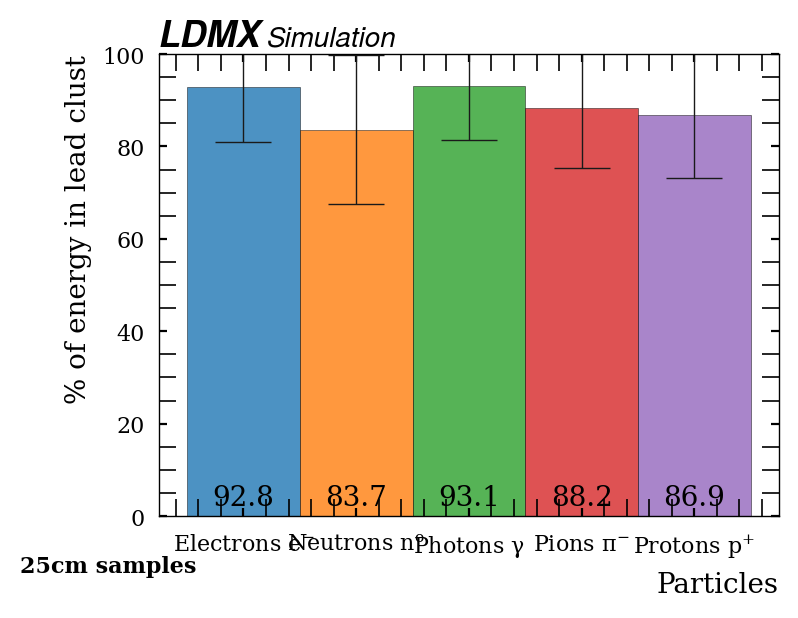

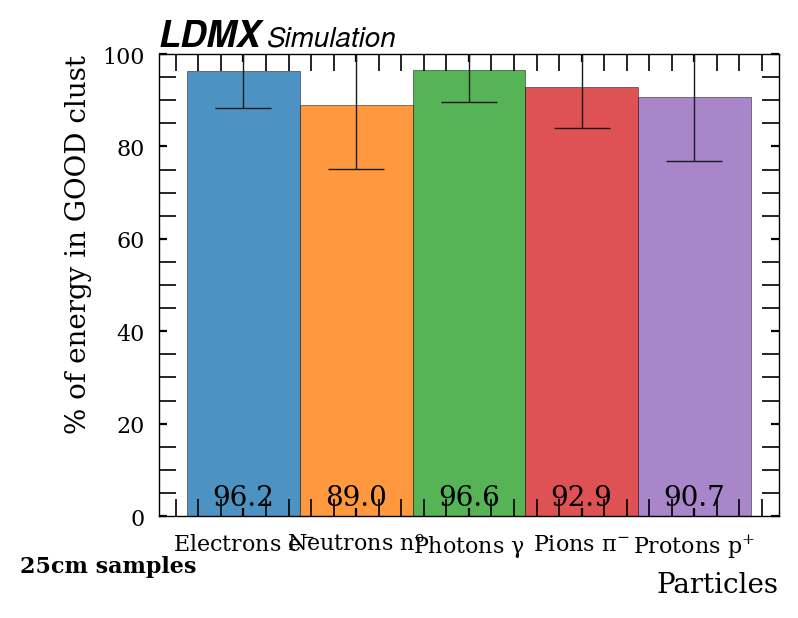

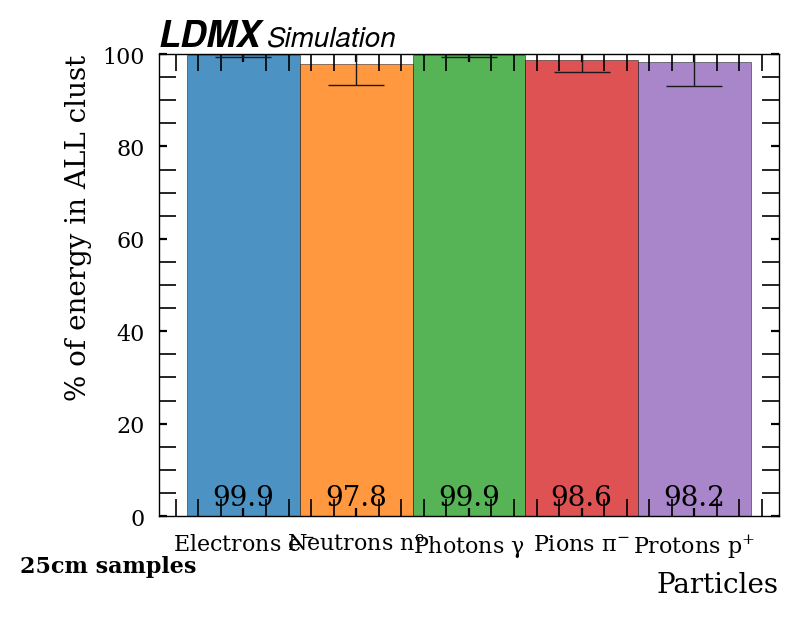

In [80]:
plot_cluster_erg(particles_dict_25cm, 25, (4, 3), 'tab10', fs=5)
plt.show()

# Good cluster hits choice

Testing effects of different energy capture